# Libraries

In [103]:
import os
import mne
import seaborn as sns
import pandas as pd
from mne_bids import BIDSPath, read_raw_bids, print_dir_tree, make_report, get_entities_from_fname
import scipy.signal as signal
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
import sovaharmony
import bids
from pyprep.prep_pipeline import PrepPipeline
from mne.datasets.eegbci import standardize
from sovaharmony.preprocessing import harmonize
import cmasher as cmr
import scipy as sp
import fooof
from fooof.analysis import get_band_peak_fm
from fooof import FOOOF, FOOOFGroup
from fooof.bands import Bands
from fooof.objs import combine_fooofs
from fooof.utils import trim_spectrum
from fooof.analysis.error import compute_pointwise_error_fm
import antropy as ant
import yasa
import autogluon

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, confusion_matrix, balanced_accuracy_score, accuracy_score, precision_recall_curve

import mne_connectivity
from mne_connectivity.viz import plot_sensors_connectivity

# Preprocessing

## California

USE UPPERCASE FOR CHANNEL NAMES

In [ ]:
THE_DATASET={
    'name':'california',
    'input_path':'D:/data_analysis/eeg_datasets/bids/california',
    'layout':{'extension':'.bdf','session':['hc', 'on'],'suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[60]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 'CP5', 'P7', 'P3', 'PZ', 'PO3', 'O1', 'OZ', 'O2', 'PO4', 'P4', 'P8', 'CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'AF4', 'FP2', 'FZ', 'CZ'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Iowa

In [ ]:
THE_DATASET={
    'name':'iowa',
    'input_path':'D:/data_analysis/eeg_datasets/bids/iowa',
    'layout':{'extension':'.set','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[60]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'FZ', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'P3', 'P7', 'O1', 'OZ', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'CZ', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'FP2', 'AF7', 'AF3', 'AFZ', 'F1', 'F5', 'FT7', 'FC3', 'C1', 'C5', 'TP7', 'CP3', 'P1', 'P5', 'PO7', 'PO3', 'POZ', 'PO4', 'PO8', 'P6', 'P2', 'CPZ', 'CP4', 'TP8', 'C6', 'C2', 'FC4', 'FT8', 'F6', 'AF8', 'AF4', 'F2', 'FCZ'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Finland

In [ ]:
THE_DATASET={
    'name':'finland',
    'input_path':'D:/data_analysis/eeg_datasets/bids/finland',
    'layout':{'extension':'.set','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'FP2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'FZ', 'CZ', 'PZ', 'IZ', 'FC1', 'FC2', 'CP1', 'CP2', 'FC5', 'FC6', 'CP5', 'CP6', 'FT9', 'FT10', 'TP9', 'TP10', 'F1', 'F2', 'C1', 'C2', 'P1', 'P2', 'AF3', 'AF4', 'FC3', 'FC4', 'CP3', 'CP4', 'PO3', 'PO4', 'F5', 'F6', 'C5', 'C6', 'P5', 'P6', 'AF7', 'AF8', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FPZ', 'CPZ', 'POZ', 'OZ'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Oslo

In [ ]:
THE_DATASET={
    'name':'oslo',
    'input_path':'D:/data_analysis/eeg_datasets/bids/oslo',
    'layout':{'extension':'.edf','session':'t1','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'IZ', 'OZ', 'POZ', 'PZ', 'CPZ', 'FPZ', 'FP2', 'AF8', 'AF4', 'AFZ', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCZ', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## LEMON

In [ ]:
THE_DATASET={
    'name':'lemon',
    'input_path':'D:/data_analysis/eeg_datasets/bids/lemon',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'FP2', 'F7', 'F3', 'FZ', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'T7', 'C3', 'CZ', 'C4', 'T8', 'CP5', 'CP1', 'CP2', 'CP6', 'AFZ', 'P7', 'P3', 'PZ', 'P4', 'P8', 'PO9', 'O1', 'OZ', 'O2', 'PO10', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FT7', 'FC3', 'FC4', 'FT8', 'C5', 'C1', 'C2', 'C6', 'TP7', 'CP3', 'CPZ', 'CP4', 'TP8', 'P5', 'P1', 'P2', 'P6', 'PO7', 'PO3', 'POZ', 'PO4', 'PO8'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Medellin

In [ ]:
THE_DATASET={
    'name':'antioquia',
    'input_path':'D:/data_analysis/eeg_datasets/bids/antioquia',
    'layout':{'extension':'.set','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[60]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1', 'FPZ', 'FP2', 'AF3', 'AF4', 'F7', 'F5', 'F3', 'F1', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FC5', 'FC3', 'FC1', 'FCZ', 'FC2', 'FC4', 'FC6', 'T7', 'C5', 'C3', 'C1', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPZ', 'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'PZ', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POZ', 'PO4', 'PO6', 'PO8', 'O1', 'OZ', 'O2'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Genoa

In [ ]:
THE_DATASET={
    'name':'genova',
    'input_path':'D:/data_analysis/eeg_datasets/bids/genoa',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
        'spatial_filter':None
}


In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Greece

In [ ]:
THE_DATASET={
    'name':'greece',
    'input_path':'D:/data_analysis/eeg_datasets/bids/greece',
    'layout':{'extension':'.set','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'C3', 'C4', 'P3','P4', 'O1', 'O2', 'F7', 'F8', 'T3','T4',  'T5' ,'T6', 'FZ', 'CZ' , 'PZ',],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## France

In [ ]:
THE_DATASET={
    'name':'france',
    'input_path':'D:/data_analysis/workflow_paper/data/france/ec/bids',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'C3', 'C4', 'P3','P4', 'O1', 'O2', 'F7', 'F8', 'T3','T4',  'T5' ,'T6', 'FZ', 'CZ' , 'PZ'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Chieti

In [ ]:
THE_DATASET={
    'name':'chieti',
    'input_path':'D:/data_analysis/eeg_datasets/bids/chieti',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['A1','A2','C3','C4','CZ','F3','F4','F7','F8','FP1','FP2','FZ','O1','O2','P3','P4','PZ','T3','T4','T5','T6'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Stavanger - DDI

In [ ]:
THE_DATASET={
    'name':'stavanger',
    'input_path':'D:/data_analysis/workflow_paper/data/stavanger/ec/bids',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'C3', 'C4', 'P3','P4', 'O1', 'O2', 'F7', 'F8', 'T3','T4',  'T5' ,'T6', 'FZ', 'CZ' , 'PZ'],
        'spatial_filter':None
}

In [ ]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Stavanger - NORDLB

In [2]:
THE_DATASET={
    'name':'stavanger',
    'input_path':'D:/data_analysis/workflow_paper/data/stavanger/nordlb/ec/bids',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'',
        'channels':['FP1','FP2', 'F3','F4', 'C3', 'C4', 'P3','P4', 'O1', 'O2', 'F7', 'F8', 'T3','T4',  'T5' ,'T6', 'FZ', 'CZ' , 'PZ'],
        'spatial_filter':None
}

In [3]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## Newcastle

In [2]:
THE_DATASET={
    'name':'newcastle',
    'input_path':'D:/data_analysis/eeg_datasets/raw/newcastle/bids',
    'layout':{'extension':'.vhdr','suffix':'eeg', 'task':'RestEC','return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'RestEC',
        'channels':['FP1', 'FPZ', 'FP2', 'F7', 'F3', 'FZ', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'M1', 'T7', 'C3', 'CZ', 'C4', 'T8', 'M2', 'CP5', 'CP1', 'CP2', 'CP6', 'P7', 'P3', 'PZ', 'P4', 'P8', 'POZ', 'O1', 'OZ', 'O2', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FC3', 'FCZ', 'FC4', 'C5', 'C1', 'C2', 'C6', 'CP3', 'CPZ', 'CP4', 'P5', 'P1', 'P2', 'P6', 'PO5', 'PO3', 'PO4', 'PO6', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FT9', 'FT10', 'TPP9H', 'TPP10H', 'PO9', 'PO10', 'P9', 'P10', 'AFF1', 'AFZ', 'AFF2', 'FFC5H', 'FFC3H', 'FFC4H', 'FFC6H', 'FCC5H', 'FCC3H', 'FCC4H', 'FCC6H', 'CCP5H', 'CCP3H', 'CCP4H', 'CCP6H', 'CPP5H', 'CPP3H', 'CPP4H', 'CPP6H', 'PPO1', 'PPO2', 'I1', 'IZ', 'I2', 'AFP3H', 'AFP4H', 'AFF5H', 'AFF6H', 'FFT7H', 'FFC1H', 'FFC2H', 'FFT8H', 'FTT9H', 'FTT7H', 'FCC1H', 'FCC2H', 'FTT8H', 'FTT10H', 'TTP7H', 'CCP1H', 'CCP2H', 'TTP8H', 'TPP7H', 'CPP1H', 'CPP2H', 'TPP8H', 'PPO9H', 'PPO5H', 'PPO6H', 'PPO10H', 'POO9H', 'POO3H', 'POO4H', 'POO10H', 'OI1H', 'OI2H'],        
        'spatial_filter':None}

In [4]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

## BrainLat

get channel positions between biosemi128 and standard_1005 montages

In [101]:
THE_DATASET={
    'name':'brainlat',
    'input_path':'C:/Users/data_analysis/Desktop/all_desktop/BrainLat/EEG data',
    'layout':{'extension':'.set','suffix':'eeg','return_type':'filename'},
       'args':{'line_freqs':[50]},
        'group_regex':None,
        'events_to_keep':None,
        'run-label':'RestEC',
        'channels':['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'A11', 'A12', 'A13', 'A14', 'A15', 'A16', 'A17', 'A18', 'A19', 'A20', 'A21', 'A22', 'A23', 'A24', 'A25', 'A26', 'A27', 'A28', 'A29', 'A30', 'A31', 'A32', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'B13', 'B14', 'B15', 'B16', 'B17', 'B18', 'B19', 'B20', 'B21', 'B22', 'B23', 'B24', 'B25', 'B26', 'B27', 'B28', 'B29', 'B30', 'B31', 'B32', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29', 'C30', 'C31', 'C32', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'D16', 'D17', 'D18', 'D19', 'D20', 'D21', 'D22', 'D23', 'D24', 'D25', 'D26', 'D27', 'D28', 'D29', 'D30', 'D31', 'D32'],        
        'spatial_filter':None}


In [104]:
%%capture
sovaharmony.preprocessing.harmonize(THE_DATASET, fast_mode=False)

BIDSValidationError: 'dataset_description.json' is missing from project root. Every valid BIDS dataset must have this file.
Example contents of 'dataset_description.json': 
{"Name": "Example dataset", "BIDSVersion": "1.0.2"}

In [ ]:
import mne
import numpy as np

# Load the Biosemi 128 montage
biosemi_montage = mne.channels.make_standard_montage('biosemi128')
biosemi_ch_pos = biosemi_montage.get_positions()['ch_pos']

# Load the standard 10-05 montage
standard_montage = mne.channels.make_standard_montage('standard_1005')
standard_ch_pos = standard_montage.get_positions()['ch_pos']

# Function to find the closest channel
def find_closest_channel(ch_pos, standard_pos):
    min_dist = float('inf')
    closest_ch = None
    for ch, pos in standard_pos.items():
        dist = np.linalg.norm(ch_pos - pos)
        if dist < min_dist:
            min_dist = dist
            closest_ch = ch
    return closest_ch

# Create a mapping dictionary
mapping_dict = {}
for ch_name, ch_pos in biosemi_ch_pos.items():
    closest_ch = find_closest_channel(ch_pos, standard_ch_pos)
    mapping_dict[ch_name] = closest_ch

# Print the mapping dictionary
print(mapping_dict)

# Inspection

Inspect number of epochs and common channels across datasets.

##### California #####

In [ ]:
california={
'layout':{'extension':'.fif', 'session':['hc', 'on'], 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 'CP5', 'P7', 'P3', 'PZ', 'PO3', 'O1', 'OZ', 'O2', 'PO4', 'P4', 'P8', 'CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'AF4', 'FP2', 'FZ', 'CZ'],
    'path':'D:/data_analysis/eeg_datasets/bids/california/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/california/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=california #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'california'
    features['subject'] = ('c_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/california/derivatives/sovaharmony/inspection.csv', index=False)

##### Iowa

In [ ]:
iowa={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['T8', 'CP3', 'T7', 'C4', 'C5', 'FT8', 'F6', 'FC5', 'FC3', 'C2', 'TP9', 'F7', 'C6', 'CP6', 'F2', 'TP7', 'PO7', 'FCZ', 'O2', 'P2', 'CZ', 'F1', 'P6', 'AF8', 'C3', 'AF4', 'CPZ', 'F5', 'CP1', 'O1', 'P8', 'FC6', 'FC2', 'P4', 'F8', 'FP2', 'AF3', 'POZ', 'FT10', 'P1', 'FC1', 'TP10', 'FP1', 'AF7', 'PO8', 'TP8', 'F4', 'FZ', 'AFZ', 'OZ', 'CP4', 'P3', 'FT7', 'CP5', 'P5', 'P7', 'F3', 'FC4', 'CP2', 'C1'],
    'path':'D:/data_analysis/eeg_datasets/bids/iowa'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/iowa'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=iowa #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'iowa'
    features['subject'] = ('i_' + subject)
    features['channels'] = epochs.ch_names
    features['epoch_num'] = epochs.get_data().shape[0]
    features['num_ch'] = len(epochs.ch_names)
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/iowa/derivatives/sovaharmony/inspection.csv', index=False)

##### Finland ####

In [ ]:
finland={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FP2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'FZ', 'CZ', 'PZ', 'IZ', 'FC1', 'FC2', 'CP1', 'CP2', 'FC5', 'FC6', 'CP5', 'CP6', 'FT9', 'FT10', 'TP9', 'TP10', 'F1', 'F2', 'C1', 'C2', 'P1', 'P2', 'AF3', 'AF4', 'FC3', 'FC4', 'CP3', 'CP4', 'PO3', 'PO4', 'F5', 'F6', 'C5', 'C6', 'P5', 'P6', 'AF7', 'AF8', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FPZ', 'CPZ', 'POZ', 'OZ'],
    'path':'D:/data_analysis/eeg_datasets/bids/finland/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/finland/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=finland #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'finland'
    features['subject'] = ('f_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/finland/derivatives/sovaharmony/inspection.csv', index=False)

##### Oslo ####

In [ ]:
oslo={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'IZ', 'OZ', 'POZ', 'PZ', 'CPZ', 'FPZ', 'FP2', 'AF8', 'AF4', 'AFZ', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCZ', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2'],
    'path':'D:/data_analysis/eeg_datasets/bids/oslo/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/oslo/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=oslo #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'oslo'
    features['subject'] = ('o_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/oslo/derivatives/sovaharmony/inspection.csv', index=False)

#### LEMON ####

In [ ]:
lemon={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FP2', 'F7', 'F3', 'FZ', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'T7', 'C3', 'CZ', 'C4', 'T8', 'CP5', 'CP1', 'CP2', 'CP6', 'AFZ', 'P7', 'P3', 'PZ', 'P4', 'P8', 'PO9', 'O1', 'OZ', 'O2', 'PO10', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FT7', 'FC3', 'FC4', 'FT8', 'C5', 'C1', 'C2', 'C6', 'TP7', 'CP3', 'CPZ', 'CP4', 'TP8', 'P5', 'P1', 'P2', 'P6', 'PO7', 'PO3', 'POZ', 'PO4', 'PO8'],
    'path':'D:/data_analysis/eeg_datasets/bids/lemon/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/lemon/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=lemon #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'lemon'
    features['subject'] = ('l_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/lemon/derivatives/sovaharmony/inspection.csv', index=False)



## Medellin

In [ ]:
antioquia={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FPZ', 'FP2', 'AF3', 'AF4', 'F7', 'F5', 'F3', 'F1', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FC5', 'FC3', 'FC1', 'FCZ', 'FC2', 'FC4', 'FC6', 'T7', 'C5', 'C3', 'C1', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPZ', 'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'PZ', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POZ', 'PO4', 'PO6', 'PO8', 'O1', 'OZ', 'O2'],
    'path':'D:/data_analysis/eeg_datasets/bids/antioquia/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/antioquia/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=antioquia

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'medellin'
    features['subject'] = ('m_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/antioquia/derivatives/sovaharmony/inspection.csv', index=False)

## Genoa

In [ ]:
genoa={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/eeg_datasets/bids/genoa/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/genoa/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'eyesClosed' 

DATASET=genoa #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'genoa'
    features['subject'] = ('gen_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/genoa/derivatives/sovaharmony/inspection.csv', index=False)

## Greece

In [ ]:
greece={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/eeg_datasets/bids/greece/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/greece/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'eyesClosed' 

DATASET=greece #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'greece'
    features['subject'] = ('gre_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/greece/derivatives/sovaharmony/inspection.csv', index=False)

## France

In [ ]:
france={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/workflow_paper/data/france/ec/bids/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/workflow_paper/data/france/ec/bids/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=france #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'fra'
    features['subject'] = ('fra_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/workflow_paper/data/france/ec/bids/derivatives/sovaharmony/inspection.csv', index=False)




## Chieti

In [ ]:
chieti={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['A1','A2','C3','C4','CZ','F3','F4','F7','F8','FP1','FP2','FZ','O1','O2','P3','P4','PZ','T3','T4','T5','T6'],
    'path':'D:/data_analysis/eeg_datasets/bids/chieti/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/chieti/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=chieti #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'chi'
    features['subject'] = ('chi_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/bids/chieti/derivatives/sovaharmony/inspection.csv', index=False)




## Stavanger - DDI

In [ ]:
stavanger={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/workflow_paper/data/stavanger/ec/bids/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/workflow_paper/data/stavanger/ec/bids/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=stavanger #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


In [ ]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'stavanger'
    features['subject'] = ('sta_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/workflow_paper/data/stavanger/ec/bids/derivatives/sovaharmony/inspection.csv', index=False)




## Stavanger - NORDLB

In [4]:
stavanger={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/workflow_paper/data/stavanger/nordlb/ec/bids/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/workflow_paper/data/stavanger/nordlb/ec/bids/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=stavanger #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


15 ['D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001002\\eeg\\sub-001002_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001004\\eeg\\sub-001004_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001005\\eeg\\sub-001005_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001010\\eeg\\sub-001010_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001011\\eeg\\sub-001011_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001012\\eeg\\sub-001012_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\

In [5]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'stavanger'
    features['subject'] = ('sta_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/workflow_paper/data/stavanger/nordlb/ec/bids/derivatives/sovaharmony/inspection.csv', index=False)




Wall time: 1.14 s


##### Newcastle #####

In [2]:
newcastle={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['Fp1', 'Fpz', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'M1', 'T7', 'C3', 'Cz', 'C4', 'T8', 'M2', 'CP5', 'CP1', 'CP2', 'CP6', 'P7', 'P3', 'Pz', 'P4', 'P8', 'POz', 'O1', 'Oz', 'O2', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FC3', 'FCz', 'FC4', 'C5', 'C1', 'C2', 'C6', 'CP3', 'CPz', 'CP4', 'P5', 'P1', 'P2', 'P6', 'PO5', 'PO3', 'PO4', 'PO6', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FT9', 'FT10', 'TPP9h', 'TPP10h', 'PO9', 'PO10', 'P9', 'P10', 'AFF1', 'AFz', 'AFF2', 'FFC5h', 'FFC3h', 'FFC4h', 'FFC6h', 'FCC5h', 'FCC3h', 'FCC4h', 'FCC6h', 'CCP5h', 'CCP3h', 'CCP4h', 'CCP6h', 'CPP5h', 'CPP3h', 'CPP4h', 'CPP6h', 'PPO1', 'PPO2', 'I1', 'Iz', 'I2', 'AFp3h', 'AFp4h', 'AFF5h', 'AFF6h', 'FFT7h', 'FFC1h', 'FFC2h', 'FFT8h', 'FTT9h', 'FTT7h', 'FCC1h', 'FCC2h', 'FTT8h', 'FTT10h', 'TTP7h', 'CCP1h', 'CCP2h', 'TTP8h', 'TPP7h', 'CPP1h', 'CPP2h', 'TPP8h', 'PPO9h', 'PPO5h', 'PPO6h', 'PPO10h', 'POO9h', 'POO3h', 'POO4h', 'POO10h', 'OI1h', 'OI2h', 'EMGr', 'EMGl'],
    'path':'D:/data_analysis/eeg_datasets/raw/newcastle/bids/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/raw/newcastle/bids/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=newcastle #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'RestEC_desc-reject' in k]

print(len(eegs), eegs)

57 ['D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT002\\eeg\\sub-CAT002_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT008\\eeg\\sub-CAT008_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT011\\eeg\\sub-CAT011_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT013\\eeg\\sub-CAT013_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT017\\eeg\\sub-CAT017_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT019\\eeg\\sub-CAT019_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\su

In [3]:
%%time
%%capture
dict_list = []

for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    
    epochs = mne.read_epochs(eeg_file, preload = True)
    features = {}
    features['center'] = 'newcastle'
    features['subject'] = ('n_' + subject)
    features['channels'] = epochs.ch_names
    features['num_ch'] = len(epochs.ch_names)
    features['epoch_num'] = epochs.get_data().shape[0]
    features['sfreq'] = epochs.info['sfreq']
    dict_list.append(features)
description = pd.DataFrame(dict_list)
description['min_epochs'] = np.min(description['epoch_num'])

description.to_csv('D:/data_analysis/eeg_datasets/raw/newcastle/bids/derivatives/sovaharmony/inspection.csv', index=False)

Wall time: 10.9 s


# Feature Extraction

##### California #####

In [ ]:
california={
'layout':{'extension':'.fif', 'session':['hc', 'on'], 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 'CP5', 'P7', 'P3', 'PZ', 'PO3', 'O1', 'OZ', 'O2', 'PO4', 'P4', 'P8', 'CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'AF4', 'FP2', 'FZ', 'CZ'],
    'path':'D:/data_analysis/eeg_datasets/bids/california/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/california/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=california #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'california'
                features['subject'] = ('c_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()

entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_california.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15) # extended alpha

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]}) # 5,15?
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta) # parametros fooof en tupla
            extalphas = get_band_peak_fm(fm, bands.extalpha) # esta funcion es api de fooof

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'california'
            features['subject'] = ('c_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            # a partir de aqui fooof
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_california2.feather')
# IMPLEMENTAR ESTE CON ROIS
roi_mapping = {
    'anterior': ["Fp1", "Fp2", "F3", "F4", "F7", "F8", "Fz"],
    'central': ["T7", "T8", "C3", "C4", "Cz"],
    'posterior': ["P3", "P4", "P7", "P8", "O1", "O2"]
}
anterior = ["Fp1", "Fp2", "F3", "F4", "F7", "F8", "Fz"]
central = ["T7", "T8", "C3", "C4", "Cz"]
posterior = ["P3", "P4", "P7", "P8", "O1", "O2"]
# FILL NAN WITH MEAN BY GROUP 

# do this for dementia where data is less, for healthy just drop...
for col in df_wide.columns:
    # Check if column contains NaN values
    if df_wide[col].isna().any():
        # Fill NaN values with the mean of each group for that column
        df_wide[col] = df_wide.groupby('group')[col].transform(lambda x: x.fillna(x.mean()))


# conectividad inter intra roi deberia ser posible, pero no es trivial, en tal caso seria la matriz flatenned o quizas iqr,median,mean del triangulo de la matriz
# se podria obtener conectividad intra y entre rois a partir de la matriz canalesxcanales queriando los canales
# para 3 rois seria 6 inter + 3 intra
# 9 x numeros de estadistcos x numero de bandas

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128  #downsampling to 128 Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'california'
            features['subject'] = ('c_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_california.feather')

Plot channel positions

In [ ]:
anterior = ["Fp1", "Fp2", "F3", "F4", "F7", "F8", "Fz"]
central = ["T7", "T8", "C3", "C4", "Cz"]
posterior = ["P3", "P4", "P7", "P8", "O1", "O2"]


montage = mne.channels.make_standard_montage("standard_1005")
epochs.set_montage(montage)

groups = [anterior, central, posterior]
group_indices = []  # Create a separate list to store indices

for ch_names in groups:
    indices = [epochs.ch_names.index(ch_name) for ch_name in ch_names]
    group_indices.append(indices)  # Append indices to the separate list

# Create the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the sensors
mne.viz.plot_sensors(epochs.info, ch_groups=group_indices, pointsize=100, show_names=True, linewidth=0, sphere=(0, 0.024, 0, 0.09), axes=ax)

# Save the figure as TIFF with 300 DPI
fig.savefig('D:/data_analysis/papers_alberto/final_phd/figures/sensors.tiff', dpi=300, format='tiff')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        n_fft, n_overlap, n_per_seg = int(5*sf), int(sf), int(5*sf)
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds,0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'california'
                features['subject'] = ('c_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_california.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:
%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'california'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128   # downsampling to 128 Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []

        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]

            # Calculate the mean and variance only for the lower triangle
            mean_wpli_subject = np.mean(np.tril(matrix_wpli, k=-1), axis=(0, 1))
            var_wpli_subject = np.var(np.tril(matrix_wpli, k=-1), axis=(0, 1))
            mean_imcoh_subject = np.mean(np.tril(matrix_imcoh, k=-1), axis=(0, 1))
            var_imcoh_subject = np.var(np.tril(matrix_imcoh, k=-1), axis=(0, 1))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(mean_wpli_subject)
            descriptors_wpli.append(var_wpli_subject)
            descriptors_imcoh.append(mean_imcoh_subject)
            descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'c_' + subject
        features['center'] = center
        features['wpli_delta_mean'] = descriptors_wpli[0][0]
        features['wpli_delta_var'] = descriptors_wpli[1][0]
        features['wpli_theta_mean'] = descriptors_wpli[2][0]
        features['wpli_theta_var'] = descriptors_wpli[3][0]
        features['wpli_alpha_mean'] = descriptors_wpli[4][0]
        features['wpli_alpha_var'] = descriptors_wpli[5][0]
        features['wpli_beta_mean'] = descriptors_wpli[6][0]
        features['wpli_beta_var'] = descriptors_wpli[7][0]
        features['wpli_global_mean'] = descriptors_wpli[8][0]
        features['wpli_global_var'] = descriptors_wpli[9][0]
        features['imcoh_delta_mean'] = descriptors_imcoh[0][0]
        features['imcoh_delta_var'] = descriptors_imcoh[1][0]
        features['imcoh_theta_mean'] = descriptors_imcoh[2][0]
        features['imcoh_theta_var'] = descriptors_imcoh[3][0]
        features['imcoh_alpha_mean'] = descriptors_imcoh[4][0]
        features['imcoh_alpha_var'] = descriptors_imcoh[5][0]
        features['imcoh_beta_mean'] = descriptors_imcoh[6][0]
        features['imcoh_beta_var'] = descriptors_imcoh[7][0]
        features['imcoh_global_mean'] = descriptors_imcoh[8][0]
        features['imcoh_global_var'] = descriptors_imcoh[9][0]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")

In [ ]:
%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'california'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128   # downsampling to 128 Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'c_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")

In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

##### Iowa

In [ ]:
iowa={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['T8', 'CP3', 'T7', 'C4', 'C5', 'FT8', 'F6', 'FC5', 'FC3', 'C2', 'TP9', 'F7', 'C6', 'CP6', 'F2', 'TP7', 'PO7', 'FCZ', 'O2', 'P2', 'CZ', 'F1', 'P6', 'AF8', 'C3', 'AF4', 'CPZ', 'F5', 'CP1', 'O1', 'P8', 'FC6', 'FC2', 'P4', 'F8', 'FP2', 'AF3', 'POZ', 'FT10', 'P1', 'FC1', 'TP10', 'FP1', 'AF7', 'PO8', 'TP8', 'F4', 'FZ', 'AFZ', 'OZ', 'CP4', 'P3', 'FT7', 'CP5', 'P5', 'P7', 'F3', 'FC4', 'CP2', 'C1'],
    'path':'D:/data_analysis/eeg_datasets/bids/iowa/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/iowa/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=iowa #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'iowa'
                features['subject'] = ('i_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()


entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_iowa.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'iowa'
            features['subject'] = ('i_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_iowa2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'iowa'
            features['subject'] = ('i_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_iowa.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'iowa'
                features['subject'] = ('i_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_iowa.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:
%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'iowa'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 500  # downsampling to 500Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'i_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")

In [ ]:
all_dwpli_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

##### Finland ####

In [ ]:
finland={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FP2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'FZ', 'CZ', 'PZ', 'IZ', 'FC1', 'FC2', 'CP1', 'CP2', 'FC5', 'FC6', 'CP5', 'CP6', 'FT9', 'FT10', 'TP9', 'TP10', 'F1', 'F2', 'C1', 'C2', 'P1', 'P2', 'AF3', 'AF4', 'FC3', 'FC4', 'CP3', 'CP4', 'PO3', 'PO4', 'F5', 'F6', 'C5', 'C6', 'P5', 'P6', 'AF7', 'AF8', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FPZ', 'CPZ', 'POZ', 'OZ'],
    'path':'D:/data_analysis/eeg_datasets/bids/finland/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/finland/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=finland #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'finland'
                features['subject'] = ('f_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()


entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_finland.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'finland'
            features['subject'] = ('f_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_finland2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd, 0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'finland'
            features['subject'] = ('f_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_finland.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'finland'
                features['subject'] = ('f_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_finland.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:
%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'finland'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'f_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")

In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

##### Oslo ####

In [ ]:
oslo={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'IZ', 'OZ', 'POZ', 'PZ', 'CPZ', 'FPZ', 'FP2', 'AF8', 'AF4', 'AFZ', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCZ', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2'],
    'path':'D:/data_analysis/eeg_datasets/bids/oslo/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/oslo/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=oslo #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'oslo'
                features['subject'] = ('o_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:]*1e-6, normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:]*1e-6)
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:]*1e-6)
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:]*1e-6, order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:]*1e-6)  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]*1e-6))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]*1e-6))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:]*1e-6)
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:]*1e-6)
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:]*1e-6)
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()


entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_oslo.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:]*1e-6, sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'oslo'
            features['subject'] = ('o_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_oslo2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:]*1e-6, sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'oslo'
            features['subject'] = ('o_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_oslo.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:]*1e-6, sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'oslo'
                features['subject'] = ('o_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_oslo.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:
%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'oslo'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data()*1e-6,
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'o_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")

In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

##### LEMON ####

In [ ]:
lemon={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':["Fp1","Fp2","F7","F3","Fz","F4","F8","FC5","FC1","FC2","FC6","T7","C3","Cz","C4","T8", "CP5", "CP1","CP2","CP6","AFz","P7","P3","Pz","P4","P8","PO9", "O1", "Oz", "O2", "PO10","AF7","AF3","AF4","AF8", "F5", "F1","F2","F6","FT7","FC3","FC4","FT8", "C5","C1","C2","C6","TP7","CP3","CPz","CP4","TP8","P5","P1","P2","P6","PO7","PO3","POz","PO4","PO8"],       
    'path':'D:/data_analysis/eeg_datasets/bids/lemon/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/lemon/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=lemon #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'lemon'
                features['subject'] = ('l_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()


entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_lemon.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'lemon'
            features['subject'] = ('l_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_lemon2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'lemon'
            features['subject'] = ('l_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_lemon.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names    
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'lemon'
                features['subject'] = ('l_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_lemon.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:
%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'lemon'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'l_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")

In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

## Medellin

In [ ]:
antioquia={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1', 'FPZ', 'FP2', 'AF3', 'AF4', 'F7', 'F5', 'F3', 'F1', 'FZ', 'F2', 'F4', 'F6', 'F8', 'FC5', 'FC3', 'FC1', 'FCZ', 'FC2', 'FC4', 'FC6', 'T7', 'C5', 'C3', 'C1', 'CZ', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPZ', 'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'PZ', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POZ', 'PO4', 'PO6', 'PO8', 'O1', 'OZ', 'O2'],
    'path':'D:/data_analysis/eeg_datasets/bids/antioquia/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/antioquia/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=antioquia

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128  #downsampling to 128 Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'medellin'
                features['subject'] = ('m_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()


entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_medellin.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'medellin'
            features['subject'] = ('m_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_medellin2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'medellin'
            features['subject'] = ('m_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_medellin.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names    
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'medellin'
                features['subject'] = ('m_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_medellin.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:
%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'medellin'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'm_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")

In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

## Genoa

Note: The 10-20 and 10-10 system share 4 channel positions but changed the name. 

Thus, in the 10-20 the electrodes T3, T4, T5, T6, correspond to the 10-10 T7, T8, P7, and P8 respectively.

https://en.wikipedia.org/wiki/10%E2%80%9320_system_(EEG)


In [ ]:
genoa={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/eeg_datasets/bids/genoa/'
}


#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/genoa/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'eyesClosed' 

DATASET=genoa #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'genoa'
                features['subject'] = ('gen_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()

entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_genoa.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'genoa'
            features['subject'] = ('gen_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_genoa2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'genoa'
            features['subject'] = ('gen_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_genoa.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names    
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'genoa'
                features['subject'] = ('gen_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_genoa.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:

%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'genoa'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
        epochs.rename_channels(mapping)
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'gen_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")


In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

## Greece

In [ ]:
greece={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/eeg_datasets/bids/greece/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/greece/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'eyesClosed' 

DATASET=greece #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)

In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'greece'
                features['subject'] = ('gre_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()

entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_greece.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'greece'
            features['subject'] = ('gre_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)

df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_greece2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'greece'
            features['subject'] = ('gre_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_greece.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names    
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'greece'
                features['subject'] = ('gre_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_greece.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:

%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'greece'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
        epochs.rename_channels(mapping)
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'gre_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")


In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

## France

In [ ]:
france={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/workflow_paper/data/france/ec/bids/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/workflow_paper/data/france/ec/bids/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=france #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'france'
                features['subject'] = ('fra_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()

entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_france.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'france'
            features['subject'] = ('fra_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)

df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_france2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'france'
            features['subject'] = ('fra_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_france.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names    
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'france'
                features['subject'] = ('fra_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_france.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:

%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'france'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
        epochs.rename_channels(mapping)
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'fra_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")


In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

## Chieti

In [ ]:
chieti={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['A1','A2','C3','C4','CZ','F3','F4','F7','F8','FP1','FP2','FZ','O1','O2','P3','P4','PZ','T3','T4','T5','T6'],
    'path':'D:/data_analysis/eeg_datasets/bids/chieti/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/bids/chieti/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=chieti #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'chieti'
                features['subject'] = ('chi_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()

entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_chieti.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            psd_fit = fm.fooofed_spectrum_
            features = {}
            features['center'] = 'chieti'
            features['subject'] = ('chi_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            if psd_fit is not None:             
                # Define frequency bands of interest
                bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
                # Extract params
                betas = get_band_peak_fm(fm, bands.beta)
                extalphas = get_band_peak_fm(fm, bands.extalpha)
                aperiodic = fm.get_params('aperiodic_params')
                fit = [fm.get_params('r_squared'), fm.get_params('error')]
                features['beta_cf'] = betas[0]
                features['beta_pw'] = betas[1]
                features['beta_bw'] = betas[2]
                features['extalphas_cf'] = extalphas[0]
                features['extalphas_pw'] = extalphas[1]
                features['extalphas_bw'] = extalphas[2]
                features['exponent'] = aperiodic[1]
                features['offset'] = aperiodic[0]
                features['r_squared'] = fit[0]
                features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)

df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_chieti2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names    
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            if psd_fit is not None:
                for freq in freqs:
                    features = {}
                    features['center'] = 'chieti'
                    features['subject'] = ('chi_' + subject)
                    features['channel'] = ch_label
                    features['frequency'] = freq
                    features['psd'] = np.log10(psds[freqs==freq][0])
                    features['psd_fit'] = psd_fit[freqs==freq][0]
                    features['osc'] = spect_flat[freqs==freq][0]            
                    features['osc_fit'] = osc_fit[freqs==freq][0]
                    features['ap'] = aperiodic[freqs==freq][0]
                    features['ap_fit'] = ap_fit[freqs==freq][0]
                    dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_chieti.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df);


In [ ]:

%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'chieti'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
        epochs.rename_channels(mapping)
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'chi_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")


In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

## Stavanger - DDI

In [ ]:
stavanger={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/workflow_paper/data/stavanger/ec/bids/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/workflow_paper/data/stavanger/ec/bids/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=stavanger #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


In [ ]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'stavanger'
                features['subject'] = ('sta_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()

entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_stavanger.feather')


In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'stavanger'
            features['subject'] = ('sta_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)

df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_stavanger2.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'stavanger'
            features['subject'] = ('sta_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_stavanger.feather')

In [ ]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names    
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'stavanger'
                features['subject'] = ('sta_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_stavanger.feather')

In [ ]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [ ]:

%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'stavanger'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
        epochs.rename_channels(mapping)
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'sta_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")


In [ ]:
all_imcoh_matrices.shape

In [ ]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



In [ ]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

## Stavanger - NORDLB

In [17]:
stavanger={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['FP1','FP2', 'F3','F4', 'FZ', 'F7', 'F8',  'C3', 'C4', 'CZ' , 'T3','T4',  'T5' ,'T6', 'P3','P4', 'PZ', 'O1', 'O2'],
    'path':'D:/data_analysis/workflow_paper/data/stavanger/nordlb/ec/bids/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/workflow_paper/data/stavanger/nordlb/ec/bids/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

# #Tarea
task = 'rest' 

DATASET=stavanger #DEFINE DATASET


layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'desc-reject' in k]

print(len(eegs), eegs)


15 ['D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001002\\eeg\\sub-001002_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001004\\eeg\\sub-001004_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001005\\eeg\\sub-001005_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001010\\eeg\\sub-001010_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001011\\eeg\\sub-001011_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\stavanger\\nordlb\\ec\\bids\\derivatives\\sovaharmony\\sub-001012\\eeg\\sub-001012_task-rest_desc-reject[]_eeg.fif', 'D:\\data_analysis\\workflow_paper\\data\\

In [8]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'stavanger'
                features['subject'] = ('sta_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()

entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_stavanger_nordlb.feather')


In [9]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'stavanger'
            features['subject'] = ('sta_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)

df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_stavanger_nordlb2.feather')

In [10]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 8, 'Theta'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'delta' : [1, 4], 'theta' : [4, 8], 'alpha' : [8, 13], 'beta' : [13, 30], 
                        'extalpha' : [5, 14]})
            # Extract params
            deltas = get_band_peak_fm(fm, bands.delta)
            thetas = get_band_peak_fm(fm, bands.theta)
            alphas = get_band_peak_fm(fm, bands.alpha)
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'stavanger'
            features['subject'] = ('sta_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_theta'] = unc_bandpowers[1]
            features['unc_alpha'] = unc_bandpowers[2]
            features['unc_beta'] = unc_bandpowers[3]
            features['delta_cf'] = deltas[0]
            features['delta_pw'] = deltas[1]
            features['delta_bw'] = deltas[2]
            features['theta_cf'] = thetas[0]
            features['theta_pw'] = thetas[1]
            features['theta_bw'] = thetas[2]
            features['alpha_cf'] = alphas[0]
            features['alpha_pw'] = alphas[1]
            features['alpha_bw'] = alphas[2]
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_stavanger_nordlb.feather')

In [11]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
    epochs.rename_channels(mapping)
    standardize(epochs) #standardize ch_names    
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'stavanger'
                features['subject'] = ('sta_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_stavanger_nordlb.feather')

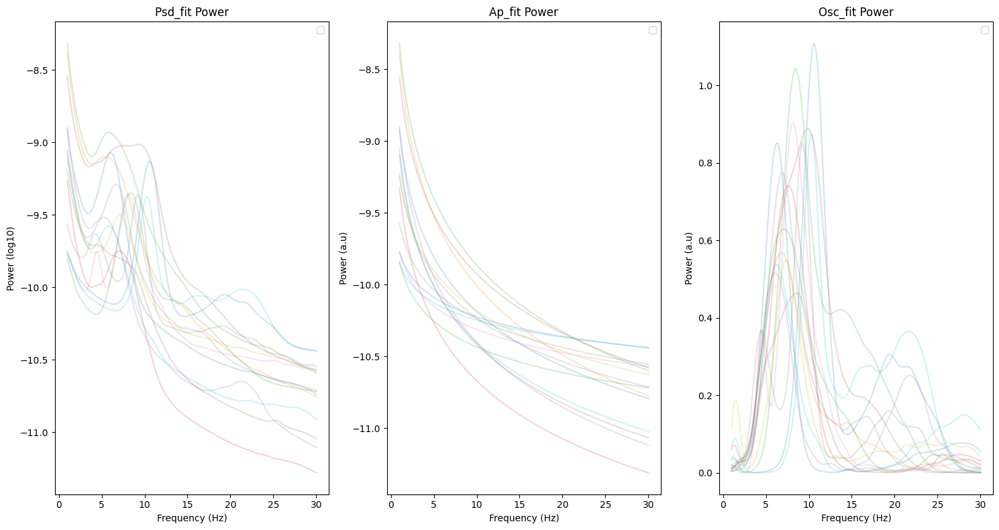

In [12]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.2, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [13]:

%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'stavanger'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        mapping = {'T3': 'T7', 'T4': 'T8', 'T5': 'P7', 'T6': 'P8'}
        epochs.rename_channels(mapping)
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data(),
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'sta_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}_nordlb.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}_nordlb.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}_nordlb.feather")


In [14]:
all_imcoh_matrices.shape

(15, 5, 18, 18, 1)

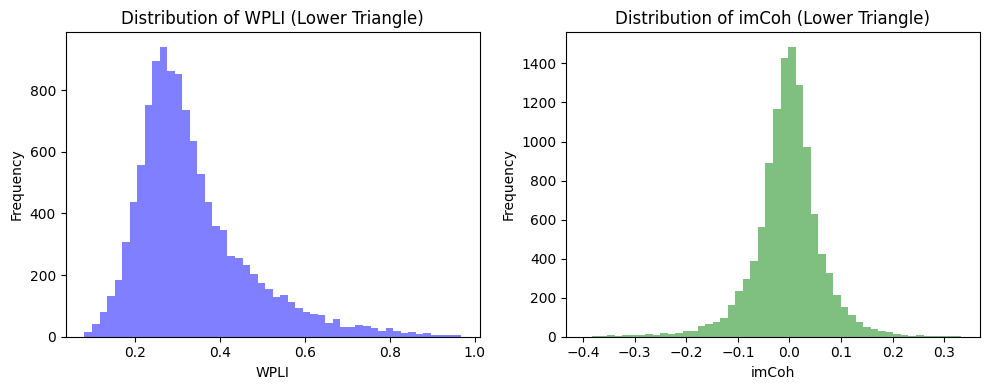

In [15]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_26492\1520244657.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


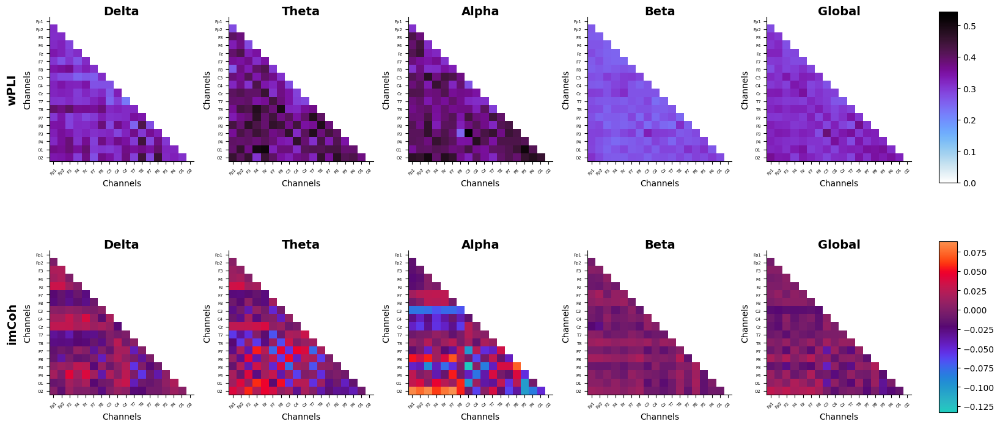

In [16]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


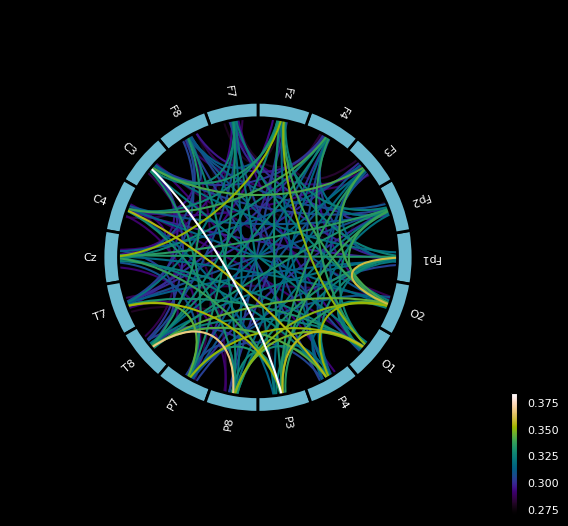

(<Figure size 800x800 with 2 Axes>, <PolarAxesSubplot: >)

In [18]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



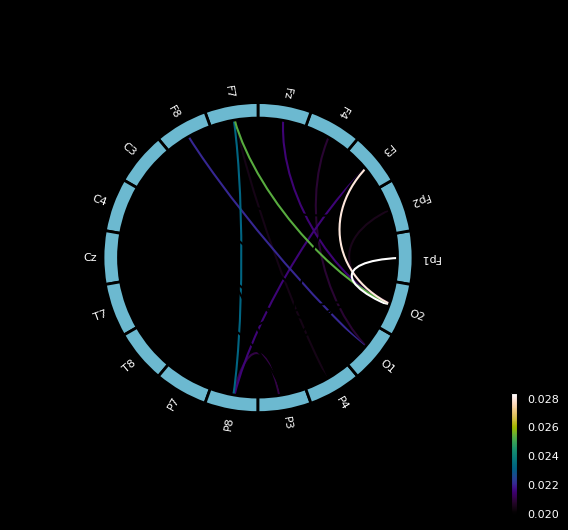

(<Figure size 800x800 with 2 Axes>, <PolarAxesSubplot: >)

In [19]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

## Newcastle ##

In [5]:
newcastle={
'layout':{'extension':'.fif', 'suffix':'eeg', 'return_type':'filename'},
    'ch_names':['Fp1', 'Fpz', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6', 'M1', 'T7', 'C3', 'Cz', 'C4', 'T8', 'M2', 'CP5', 'CP1', 'CP2', 'CP6', 'P7', 'P3', 'Pz', 'P4', 'P8', 'POz', 'O1', 'Oz', 'O2', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FC3', 'FCz', 'FC4', 'C5', 'C1', 'C2', 'C6', 'CP3', 'CPz', 'CP4', 'P5', 'P1', 'P2', 'P6', 'PO5', 'PO3', 'PO4', 'PO6', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'FT9', 'FT10', 'TPP9h', 'TPP10h', 'PO9', 'PO10', 'P9', 'P10', 'AFF1', 'AFz', 'AFF2', 'FFC5h', 'FFC3h', 'FFC4h', 'FFC6h', 'FCC5h', 'FCC3h', 'FCC4h', 'FCC6h', 'CCP5h', 'CCP3h', 'CCP4h', 'CCP6h', 'CPP5h', 'CPP3h', 'CPP4h', 'CPP6h', 'PPO1', 'PPO2', 'I1', 'Iz', 'I2', 'AFp3h', 'AFp4h', 'AFF5h', 'AFF6h', 'FFT7h', 'FFC1h', 'FFC2h', 'FFT8h', 'FTT9h', 'FTT7h', 'FCC1h', 'FCC2h', 'FTT8h', 'FTT10h', 'TTP7h', 'CCP1h', 'CCP2h', 'TTP8h', 'TPP7h', 'CPP1h', 'CPP2h', 'TPP8h', 'PPO9h', 'PPO5h', 'PPO6h', 'PPO10h', 'POO9h', 'POO3h', 'POO4h', 'POO10h', 'OI1h', 'OI2h', 'EMGr', 'EMGl'],
    'path':'D:/data_analysis/eeg_datasets/raw/newcastle/bids/'
}

#Path of the BIDS folder
bids_root = 'D:/data_analysis/eeg_datasets/raw/newcastle/bids/'
#Seleccionar solo EEG
datatype = 'eeg'
suffix = 'eeg'

#Tarea
task = 'rest' 

DATASET=newcastle #DEFINE DATASET

layoutd = DATASET.get('layout', None)

layout = bids.BIDSLayout(DATASET.get('path', None), derivatives=True)
eegs = layout.get(**layoutd)
eegs = [k for k in eegs if 'RestEC_desc-reject' in k]

print(len(eegs), eegs)

57 ['D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT002\\eeg\\sub-CAT002_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT008\\eeg\\sub-CAT008_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT011\\eeg\\sub-CAT011_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT013\\eeg\\sub-CAT013_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT017\\eeg\\sub-CAT017_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\sub-CAT019\\eeg\\sub-CAT019_task-RestEC_desc-reject[RestEC]_eeg.fif', 'D:\\data_analysis\\eeg_datasets\\raw\\newcastle\\bids\\derivatives\\sovaharmony\\su

In [9]:
%%capture
## Entropy ###

dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        srate = downsample
        for ch,ch_label in enumerate(channels):
            for ep in range(nepochs):
                features = {}
                features['center'] = 'newcastle'
                features['subject'] = ('n_' + subject)
                features['channel'] = ch_label
                features['epoch'] = ep
                features['permutation'] = ant.perm_entropy(epochs.get_data()[ep,ch,:], normalize=True)
                features['sample'] = ant.sample_entropy(epochs.get_data()[ep,ch,:])
                features['approximate'] = ant.app_entropy(epochs.get_data()[ep,ch,:])
                features['svd_ent'] = ant.svd_entropy(epochs.get_data()[ep,ch,:], order=5, normalize=True)             
                features['higuchi_fd']  = ant.higuchi_fd(epochs.get_data()[ep,ch,:])  
                features['hjort_mobility']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[0]
                features['hjort_complexity']  = (ant.hjorth_params(epochs.get_data()[ep,ch,:]))[1]
                features['detrended_fluct']  = ant.detrended_fluctuation(epochs.get_data()[ep,ch,:])
                features['katz_fd']  = ant.katz_fd(epochs.get_data()[ep,ch,:])
                features['petrosian_fd']  = ant.petrosian_fd(epochs.get_data()[ep,ch,:])
                dict_list.append(features)
entropies = pd.DataFrame(dict_list)

permutation = pd.DataFrame(entropies.groupby(['center','subject', 'channel']).permutation.mean())
entropies.rename(columns = {'sample':'sample_ent'}, inplace = True)
sample_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).sample_ent.mean())
approximate = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).approximate.mean())
svd_ent = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).svd_ent.mean())
higuchi_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).higuchi_fd.mean())
hjort_mobility = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_mobility.mean())
hjort_complexity = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).hjort_complexity.mean())
detrended_fluct = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).detrended_fluct.mean())
katz_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).katz_fd.mean())
petrosian_fd = pd.DataFrame(entropies.groupby(['center', 'subject', 'channel']).petrosian_fd.mean())

dfs = [permutation, sample_ent, approximate, svd_ent, higuchi_fd, hjort_mobility, hjort_complexity, detrended_fluct, katz_fd, petrosian_fd]
entropies_ave = pd.DataFrame(pd.concat(dfs, axis = 1)).reset_index()


entropies_ave.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_newcastle.feather')


In [8]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        freq_range_slow_theta = (4, 5.5)
        freq_range_prealpha = (5.5, 8)
        freq_range_alpha = (8, 13)
        n_epochs, n_channels, n_points = epochs._data.shape
        dominant_freqs = np.zeros(n_epochs)  # Array to store dominant frequencies for each epoch
        freq_range_df = (4, 15)

        for ch, ch_label in enumerate(channels):
            psd, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            
            freq_bins = freqs.shape[0]
            band_indices_slow_theta = np.where((freqs >= freq_range_slow_theta[0]) & (freqs < freq_range_slow_theta[1]))[0]
            band_indices_prealpha = np.where((freqs >= freq_range_prealpha[0]) & (freqs < freq_range_prealpha[1]))[0]
            band_indices_alpha = np.where((freqs >= freq_range_alpha[0]) & (freqs < freq_range_alpha[1]))[0]
            band_indices_df = np.where((freqs >= freq_range_df[0]) & (freqs < freq_range_df[1]))[0]

            # Compute the dominant frequency for each epoch within the specified range
            dominant_freqs = freqs[band_indices_df[np.argmax(psd[:, band_indices_df], axis=1)]]
            # Compute the standard deviation of dominant frequencies within the specified range across all epochs
            dom_freq = np.mean(dominant_freqs)
            dom_freq_var = np.std(dominant_freqs)

            freq_prev_slow_theta = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_slow_theta[0],freqs[np.argmax(psd, axis=1)] < freq_range_slow_theta[1])) / n_epochs
            freq_prev_prealpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_prealpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_prealpha[1])) / n_epochs
            freq_prev_alpha = np.sum(np.logical_and(freqs[np.argmax(psd, axis=1)] >= freq_range_alpha[0],freqs[np.argmax(psd, axis=1)] < freq_range_alpha[1])) / n_epochs
            
            psd = np.median(psd,0) # get median psd vector per channel
            unc_bandpowers = yasa.bandpower_from_psd_ndarray(psd, freqs, bands=[(1, 4, 'Delta'), (4, 5.5, 'Slow_Theta'), (5.5, 8, 'Pre_alpha'), (8, 13, 'Alpha'), (13, 30, 'Beta')], relative=True)
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psd, freq_range)   # Fit the power spectrum model
            # Define frequency bands of interest
            bands = Bands({'extalpha' : [5, 14],'beta' : [13, 30]})
            # Extract params
            betas = get_band_peak_fm(fm, bands.beta)
            extalphas = get_band_peak_fm(fm, bands.extalpha)

            aperiodic = fm.get_params('aperiodic_params')
            fit = [fm.get_params('r_squared'), fm.get_params('error')]
            features = {}
            features['center'] = 'newcastle'
            features['subject'] = ('n_' + subject)
            features['channel'] = ch_label
            features['unc_delta'] = unc_bandpowers[0]
            features['unc_slowtheta'] = unc_bandpowers[1]
            features['unc_prealpha'] = unc_bandpowers[2]
            features['unc_alpha'] = unc_bandpowers[3]
            features['unc_beta'] = unc_bandpowers[4]
            features['fp_slow_theta'] = freq_prev_slow_theta
            features['fp_prealpha'] = freq_prev_prealpha
            features['fp_alpha'] = freq_prev_alpha
            features['dom_freq'] = dom_freq
            features['dom_freq_var'] = dom_freq_var
            features['beta_cf'] = betas[0]
            features['beta_pw'] = betas[1]
            features['beta_bw'] = betas[2]
            features['extalphas_cf'] = extalphas[0]
            features['extalphas_pw'] = extalphas[1]
            features['extalphas_bw'] = extalphas[2]
            features['exponent'] = aperiodic[1]
            features['offset'] = aperiodic[0]
            features['r_squared'] = fit[0]
            features['error'] = fit[1]
            dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_newcastle2.feather')

In [7]:
%%capture
dict_list = []
for eeg_file in eegs: #read and preload dataset
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload = True)
    standardize(epochs) #standardize ch_names
    keep = ['Fp1','Fp2', 'F3','F4', 'Fz', 'F7', 'F8',  'C3', 'C4', 'Cz' , 'T7','T8',  'P7' ,'P8', 'P3','P4', 'O1', 'O2']
    epochs.pick_channels(keep)
    epochs = epochs.filter(l_freq=1, h_freq=30) #bandpassing 1-30Hz
    downsample = 128 #downsampling to 128Hz
    epochs.resample(downsample)
    sf = downsample
    nepochs,nchannels,npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list = [epochs[:][range(20)]], add_offset=False, on_mismatch='raise', verbose=None)
        epochs = epochs_c
        epochs.set_montage("standard_1005")
        nepochs,nchannels,npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        channels = epochs.info['ch_names']
        for ch,ch_label in enumerate(channels):
            psds, freqs = mne.time_frequency.psd_array_multitaper(epochs.get_data()[:,ch,:], sfreq = sf,fmin=1, fmax=30, n_jobs=-1)
            psds = np.median(psds, 0) # get median psd vector per channel
            fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
            # Initialize FOOOF object
            # Define frequency range across which to model the spectrum
            freq_range = [1, 30]
            fm.fit(freqs, psds, freq_range)   # Fit the power spectrum model
            osc_fit = fm._peak_fit
            psd_fit = fm.fooofed_spectrum_
            ap_fit = fm._ap_fit
            spect_flat = fm._spectrum_flat
            aperiodic = fm._spectrum_peak_rm
            for freq in freqs:
                features = {}
                features['center'] = 'newcastle'
                features['subject'] = ('n_' + subject)
                features['channel'] = ch_label
                features['frequency'] = freq
                features['psd'] = np.log10(psds[freqs==freq][0])
                features['psd_fit'] = psd_fit[freqs==freq][0]
                features['osc'] = spect_flat[freqs==freq][0]            
                features['osc_fit'] = osc_fit[freqs==freq][0]
                features['ap'] = aperiodic[freqs==freq][0]
                features['ap_fit'] = ap_fit[freqs==freq][0]
                dict_list.append(features)
df = pd.DataFrame(dict_list)
df.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_newcastle.feather')

2024-04-09 12:10:38,514 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
2024-04-09 12:10:39,268 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
2024-04-09 12:10:40,055 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


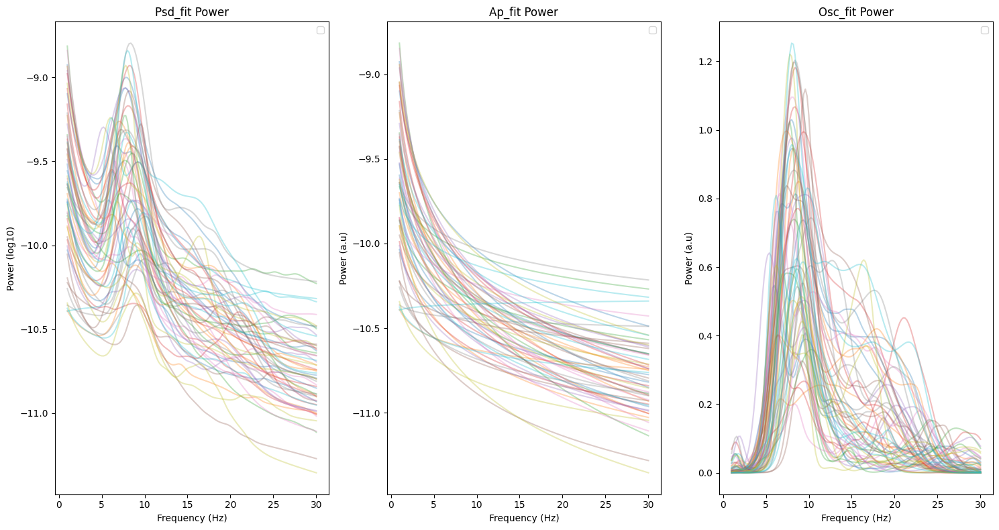

In [6]:
def plot_channel_power(df):
    unique_participants = df['subject'].unique()
    unique_channels = df['channel'].unique()
    colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, len(unique_participants)))

    fig, axs = plt.subplots(figsize=(15, 8), ncols=3)

    for idx, ax in enumerate(axs):
        # Get columns to plot
        column = ['psd_fit', 'ap_fit', 'osc_fit'][idx]
        ax.set_title(column.capitalize() + ' Power')
        ax.set_xlabel('Frequency (Hz)')
        if idx == 0:
            ax.set_ylabel('Power (log10)')
        else:
            ax.set_ylabel('Power (a.u)')

        # Get channel mean for each participant
        for i, participant in enumerate(unique_participants):
            participant_df = df[df['subject'] == participant]
            participant_avg = participant_df.groupby(['frequency'])[column].mean()
            ax.plot(participant_avg.index, participant_avg.values, color=colors[i], alpha=0.3, label=None)

        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Example
plot_channel_power(df)


In [10]:
%%capture

# Create a list to store the dictionaries for each subject
dict_list = []
all_wpli_matrices = []
all_imcoh_matrices = []
njobs = 7
center = 'newcastle'

# Iterate over eegs and calculate matrices
for eeg_file in eegs:
    subject_info = layout.parse_file_entities(eeg_file)
    session = subject_info.get('session')
    subject = subject_info.get('subject')
    bids_path = BIDSPath(subject=subject, session=session, task=task, root=bids_root, datatype='eeg')
    epochs = mne.read_epochs(eeg_file, preload=True)
    nepochs, nchannels, npoints = epochs._data.shape
    if nepochs >= 20:
        epochs_c = mne.concatenate_epochs(epochs_list=[epochs[:][range(20)]], add_offset=False,
                                          on_mismatch='raise', verbose=None)
        epochs = epochs_c
        standardize(epochs)  # standardize ch_names
        keep = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
        epochs.pick_channels(keep)
        downsample = 128  # downsampling to 128Hz
        epochs = epochs.resample(downsample)
        epochs.set_montage("standard_1005")
        nepochs, nchannels, npoints = epochs._data.shape
        correct_channels = keep
        epochs.reorder_channels(correct_channels)
        wpli_matrixes = []
        imcoh_matrixes = []

        bands = [[1, 4], [4, 8], [8, 13], [13, 30], [1, 30]]
        for band in bands:
            fmin, fmax = band

            wpli, imcoh = mne_connectivity.spectral_connectivity_epochs(epochs.get_data()*1e-6,
                                                                         method=['wpli', 'imcoh'],
                                                                         mode='multitaper',
                                                                         sfreq=epochs.info["sfreq"],
                                                                         fmin=fmin, fmax=fmax,
                                                                         faverage=True, mt_adaptive=False,
                                                                         n_jobs=njobs)

            wpli_matrixes.append(wpli.get_data(output='dense'))
            imcoh_matrixes.append(imcoh.get_data(output='dense'))

        # Calculate average matrices (excluding the diagonal) for each band
        descriptors_wpli = []
        descriptors_imcoh = []



        # Iterate over the matrices for each band
        for i in range(len(wpli_matrixes)):
            matrix_wpli = wpli_matrixes[i]
            matrix_imcoh = imcoh_matrixes[i]
            n_channels, _ , _= matrix_wpli.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_wpli = matrix_wpli[indices[0], indices[1], 0]

            n_channels, _ , _= matrix_imcoh.shape
            indices = np.tril_indices(n_channels, k=-1)
            lower_tri_imcoh = matrix_wpli[indices[0], indices[1], 0]


            # Calculate the median and iqr only for the lower triangle
            median_wpli_subject = np.mean(lower_tri_wpli)
            iqr_wpli_subject = np.subtract(*np.percentile(lower_tri_wpli, [75, 25]))
            median_imcoh_subject = np.mean(lower_tri_imcoh)
            iqr_imcoh_subject = np.subtract(*np.percentile(lower_tri_imcoh, [75, 25]))

            # Append the mean and variance values to the lists
            descriptors_wpli.append(median_wpli_subject)
            descriptors_wpli.append(iqr_wpli_subject)
            descriptors_imcoh.append(median_imcoh_subject)
            descriptors_imcoh.append(iqr_imcoh_subject)


            # # Calculate the mean and variance only for the lower triangle
            # mean_wpli_subject = np.mean(lower_tri_wpli)
            # var_wpli_subject = np.var(lower_tri_wpli)
            # mean_imcoh_subject = np.mean(lower_tri_imcoh)
            # var_imcoh_subject = np.var(lower_tri_imcoh)

            # # Append the mean and variance values to the lists
            # descriptors_wpli.append(mean_wpli_subject)
            # descriptors_wpli.append(var_wpli_subject)
            # descriptors_imcoh.append(mean_imcoh_subject)
            # descriptors_imcoh.append(var_imcoh_subject)


        # Append the matrices to the list
        all_wpli_matrices.append(wpli_matrixes)
        all_imcoh_matrices.append(imcoh_matrixes)

        # Create a dictionary with the subject's features
        features = {}
        features['participant_id'] = 'n_' + subject
        features['center'] = center
        features['wpli_delta_median'] = descriptors_wpli[0]
        features['wpli_delta_iqr'] = descriptors_wpli[1]
        features['wpli_theta_median'] = descriptors_wpli[2]
        features['wpli_theta_iqr'] = descriptors_wpli[3]
        features['wpli_alpha_median'] = descriptors_wpli[4]
        features['wpli_alpha_iqr'] = descriptors_wpli[5]
        features['wpli_beta_median'] = descriptors_wpli[6]
        features['wpli_beta_iqr'] = descriptors_wpli[7]
        features['wpli_global_median'] = descriptors_wpli[8]
        features['wpli_global_iqr'] = descriptors_wpli[9]
        features['imcoh_delta_median'] = descriptors_imcoh[0]
        features['imcoh_delta_iqr'] = descriptors_imcoh[1]
        features['imcoh_theta_median'] = descriptors_imcoh[2]
        features['imcoh_theta_iqr'] = descriptors_imcoh[3]
        features['imcoh_alpha_median'] = descriptors_imcoh[4]
        features['imcoh_alpha_iqr'] = descriptors_imcoh[5]
        features['imcoh_beta_median'] = descriptors_imcoh[6]
        features['imcoh_beta_iqr'] = descriptors_imcoh[7]
        features['imcoh_global_median'] = descriptors_imcoh[8]
        features['imcoh_global_iqr'] = descriptors_imcoh[9]


        # Append the dictionary to the list
        dict_list.append(features)

# Convert the list of matrices to NumPy arrays
all_wpli_matrices = np.array(all_wpli_matrices)
all_imcoh_matrices = np.array(all_imcoh_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/wpli_{center}.npy", all_wpli_matrices)
np.save(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/matrixes/imcoh_{center}.npy", all_imcoh_matrices)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(dict_list)
df.to_feather(f"D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_{center}.feather")

In [11]:
all_imcoh_matrices.shape

(57, 5, 18, 18, 1)

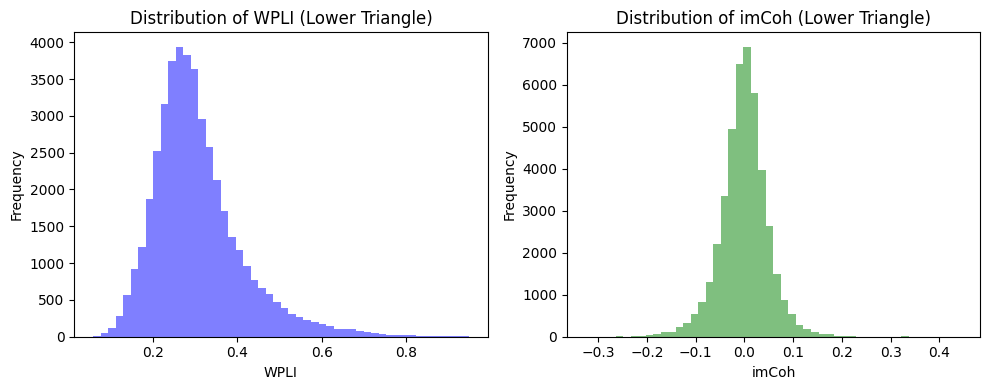

In [12]:
import matplotlib.pyplot as plt

# Get the lower triangle indices
n_subjects, n_bands, n_channels, _, _ = all_wpli_matrices.shape
indices = np.tril_indices(n_channels, k=-1)

# Get the lower triangle values
lower_tri_wpli = all_wpli_matrices[:, :, indices[0], indices[1], 0]
lower_tri_imcoh = all_imcoh_matrices[:, :, indices[0], indices[1], 0]

# Plot histograms for the lower triangle
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(lower_tri_wpli.flatten(), bins=50, color='blue', alpha=0.5)
plt.xlabel('WPLI')
plt.ylabel('Frequency')
plt.title('Distribution of WPLI (Lower Triangle)')

plt.subplot(1, 2, 2)
plt.hist(lower_tri_imcoh.flatten(), bins=50, color='green', alpha=0.5)
plt.xlabel('imCoh')
plt.ylabel('Frequency')
plt.title('Distribution of imCoh (Lower Triangle)')

plt.tight_layout()
plt.show()


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_26040\1520244657.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


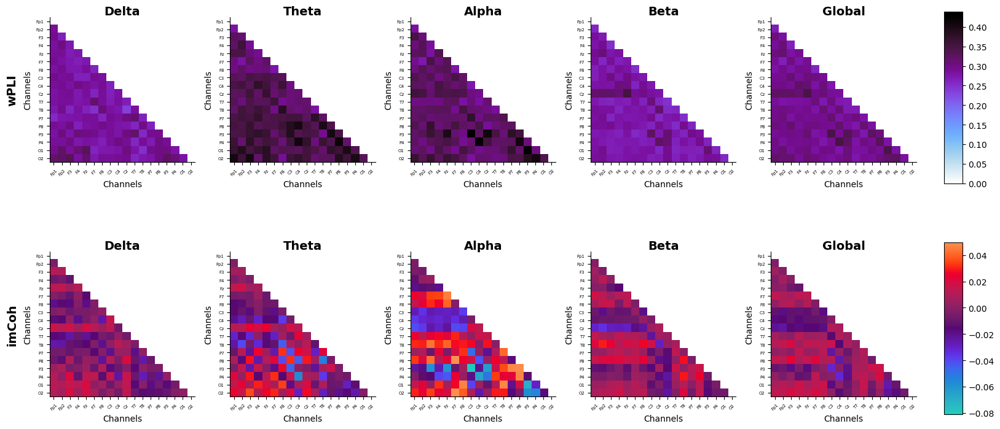

In [13]:
import seaborn as sns

# Define the bands
bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Global']
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
cmap = cmr.voltage_r
cmap2 = cmr.guppy_r


# Compute the average matrices across all eeg_files
avg_wpli_matrixes = all_wpli_matrices.mean(axis=0)
avg_imcoh_matrixes = all_imcoh_matrices.mean(axis=0)

# Create subplots
fig, axs = plt.subplots(nrows=2, ncols=len(bands), figsize=(15, 8))

# Create placeholders for the colorbars
cbar_ax1 = fig.add_axes([1.02, 0.55, 0.02, 0.35])  # Colorbar for WPLI
cbar_ax2 = fig.add_axes([1.02, 0.08, 0.02, 0.35])  # Colorbar for COH

# Iterate over the bands
for i, band in enumerate(bands):
    # Plot wpli connectivity matrix
    wpli_matrix = avg_wpli_matrixes[i].mean(axis=2)
    wpli_matrix[np.triu_indices_from(wpli_matrix)] = np.nan  # Set upper triangle to NaN

    im1 = axs[0, i].imshow(wpli_matrix, cmap=cmap, origin='upper',
                           vmin=avg_wpli_matrixes.flatten().min(),
                           vmax=avg_wpli_matrixes.flatten().max())

    axs[0, i].set_xlabel('Channels')
    axs[0, i].set_ylabel('Channels')
    axs[0, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[0, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[0, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[0, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[0, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

# Plot coh connectivity matrix
    imcoh_matrix = avg_imcoh_matrixes[i].mean(axis=2)
    imcoh_matrix[np.triu_indices_from(imcoh_matrix)] = np.nan  # Set upper triangle to NaN

    im2 = axs[1, i].imshow(imcoh_matrix, cmap=cmap2, origin='upper',
                           vmin=avg_imcoh_matrixes.flatten().min(),
                           vmax=avg_imcoh_matrixes.flatten().max())
    
    axs[1, i].set_xlabel('Channels')
    axs[1, i].set_ylabel('Channels')
    axs[1, i].set_title(band, fontsize=14, fontweight='bold', va='center')
    axs[1, i].set_xticks(np.arange(len(channels)))  # Set the x-axis tick positions
    axs[1, i].set_yticks(np.arange(len(channels)))  # Set the y-axis tick positions
    axs[1, i].set_xticklabels(channels, size=5, rotation=45)  # Set the x-axis tick labels
    axs[1, i].set_yticklabels(channels, size=5)  # Set the y-axis tick labels

    # Set bolded titles on the left side of the first subplot of each row
    if i == 0:
        axs[0, i].text(-0.3, 0.5, 'wPLI', fontsize=14, fontweight='bold', va='center', transform=axs[0, i].transAxes,  rotation=90)
        axs[1, i].text(-0.3, 0.5, 'imCoh', fontsize=14, fontweight='bold', va='center', transform=axs[1, i].transAxes, rotation=90)

# Remove spines
sns.despine(fig)

# Add colorbars
fig.colorbar(im1, cax=cbar_ax1)
fig.colorbar(im2, cax=cbar_ax2)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show();


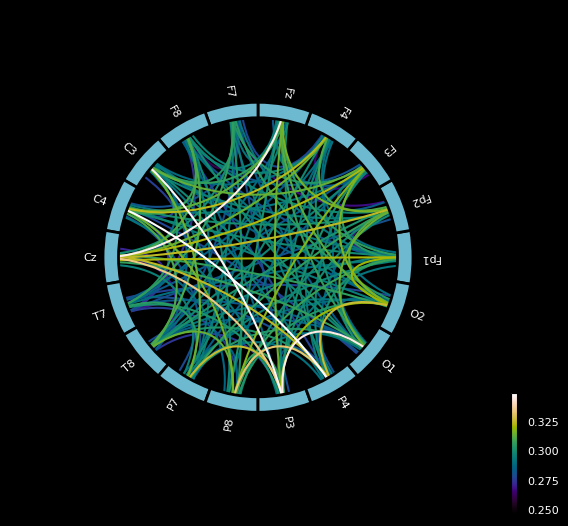

(<Figure size 800x800 with 2 Axes>, <PolarAxesSubplot: >)

In [14]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_wpli_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_wpli_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_wpli_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])



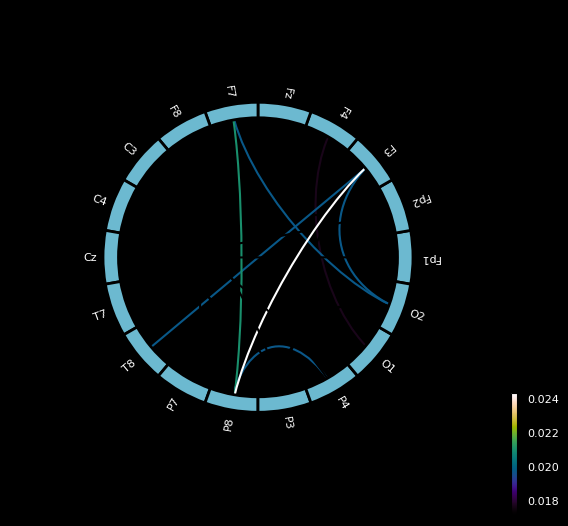

(<Figure size 800x800 with 2 Axes>, <PolarAxesSubplot: >)

In [15]:
cmap_r = cmr.rainforest
mne_connectivity.viz.plot_connectivity_circle(avg_imcoh_matrixes[4][:, :, 0], 
                                        node_names= epochs.info["ch_names"], vmin=avg_imcoh_matrixes[4][:, :, 0].max()*0.7, 
                                        vmax=avg_imcoh_matrixes[4][:, :, 0].max(), colormap=cmap_r,
                                        node_colors= ['#6CB9D0'])

# Merge dfs

In [23]:
import pandas as pd

In [24]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/eeg_datasets/bids/california/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'c_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns

entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_california.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True)


bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_california2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


california_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
california_df = pd.merge(california_df, bandpowers, on=["participant_id", "center", "channel"])
#california_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/california_df.csv', index=False)

In [25]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = r'D:\data_analysis\papers_alberto\cog_decline_lbd\participants_iowa_mmse.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'i_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns

entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_iowa.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_iowa2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


iowa_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
iowa_df = pd.merge(iowa_df, bandpowers, on=["participant_id", "center", "channel"])
#iowa_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/iowa_df.csv', index=False)



In [26]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/eeg_datasets/bids/finland/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'f_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_finland.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_finland2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


finland_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
finland_df = pd.merge(finland_df, bandpowers, on=["participant_id", "center", "channel"])
#finland_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/finland_df.csv', index=False)

In [27]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/eeg_datasets/bids/oslo/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'o_')  # Drop the "sub-" prefix used for BIDS
participants_df['group'] = 'hc'
participants_df.rename(columns = {'sex':'gender'}, inplace = True)
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_oslo.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_oslo2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


oslo_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
oslo_df = pd.merge(oslo_df, bandpowers, on=["participant_id", "center", "channel"])
#oslo_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/oslo_df.csv', index=False)


In [28]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = "D:/data_analysis/eeg_datasets/bids/lemon/META_File_IDs_Age_Gender_Education_Drug_Smoke_SKID_LEMON.csv"

participants_df = pd.read_csv(participants_file)
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case

# Function to calculate the average of an age range
def calculate_average(age_range):
    ages = age_range.split('-')
    start_age = int(ages[0].strip())
    end_age = int(ages[1].strip())
    return (start_age + end_age) / 2

# Apply the function to the "age" column with the averages of the age (previous format categorized age in 5-years ranges, e.g. "25-30"
participants_df['age'] = participants_df['age'].apply(calculate_average)

participants_df.rename(columns = {'id':'participant_id'}, inplace = True)
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'l_')  # Drop the "sub-" prefix used for BIDS
participants_df['group'] = 'hc'
participants_df.rename(columns = {'gender_ 1=female_2=male':'gender'}, inplace = True)
participants_df['gender'] = participants_df['gender'].replace({1: 'f', 2: 'm'})
participants_df = participants_df[metadata_cols]

entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_lemon.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True)



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_lemon2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


lemon_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
lemon_df = pd.merge(lemon_df, bandpowers, on=["participant_id", "center", "channel"])
#lemon_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/lemon_df.csv', index=False)


In [29]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = r'D:\data_analysis\papers_alberto\cog_decline_lbd\participants_med_mmse.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'm_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_medellin.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 




bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_medellin2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


medellin_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
medellin_df = pd.merge(medellin_df, bandpowers, on=["participant_id", "center", "channel"])
#medellin_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/medellin_df.csv', index=False)



In [30]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/eeg_datasets/bids/greece/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'gre_')  # Drop the "sub-" prefix used for BIDS
participants_df['gender'] = participants_df['gender'].replace({'F': 'f', 'M': 'm'})
participants_df['group'] = participants_df['group'].replace({'A': 'ad', 'C':'hc', 'F':'ftd'})
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_greece.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_greece2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


greece_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
greece_df = pd.merge(greece_df, bandpowers, on=["participant_id", "center", "channel"])
#greece_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/greece_df.csv', index=False)



In [31]:
metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/eeg_datasets/bids/genoa/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'gen_')  # Drop the "sub-" prefix used for BIDS
participants_df['participant_id'] = participants_df['participant_id'].str.replace('_eyesClosed', '')
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_genoa.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_genoa2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

genoa_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
genoa_df = pd.merge(genoa_df, bandpowers_df, on=["participant_id", "center", "channel"])



#genoa_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/genoa_df.csv', index=False)


In [32]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/workflow_paper/data/france/ec/bids/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'fra_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_france.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_france2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


france_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
france_df = pd.merge(france_df, bandpowers, on=["participant_id", "center", "channel"])
#france_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/france_df.csv', index=False)


In [33]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/workflow_paper/data/stavanger/ec/bids/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'sta_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_stavanger.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_stavanger2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


stavanger_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
stavanger_df = pd.merge(stavanger_df, bandpowers, on=["participant_id", "center", "channel"])
#stavanger_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/stavanger_df.csv', index=False)


In [34]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/workflow_paper/data/stavanger/nordlb/participants.csv'
participants_df = pd.read_csv(participants_file, sep=",")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
# Adding the prefix "sta_" to each numeric participant_id value, ensuring it's treated as a string
participants_df['participant_id'] = 'sta_00' + participants_df['participant_id'].astype(str)

participants_df.rename(columns = {'age_at_eeg':'age'}, inplace = True) 
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_stavanger_nordlb.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_stavanger_nordlb2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


stavanger_nordlb_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
stavanger_nordlb_df = pd.merge(stavanger_nordlb_df, bandpowers, on=["participant_id", "center", "channel"])
#stavanger_nordlb_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/stavanger_nordlb_df.csv', index=False)


In [35]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged

participants_file = 'D:/data_analysis/eeg_datasets/bids/chieti/participants.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'chi_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns


entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_chieti.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True) 



bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_chieti2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


chieti_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
chieti_df = pd.merge(chieti_df, bandpowers, on=["participant_id", "center", "channel"])
#chieti_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/chieti_df.csv', index=False)


In [36]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)

metadata_cols = ['participant_id', 'group' , 'age', 'gender'] # names of the metadata columns to be merged


participants_file = 'D:/data_analysis/eeg_datasets/raw/newcastle/bids/participants_2.tsv'
participants_df = pd.read_csv(participants_file, sep="\t")
participants_df.columns= participants_df.columns.str.lower() # To set all the column names in lower case
participants_df['participant_id'] = participants_df['participant_id'].str.replace('sub-', 'n_')  # Drop the "sub-" prefix used for BIDS
participants_df = participants_df.loc[:, metadata_cols]  # Filter the DataFrame to include only the specified columns

entropies_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/ent_newcastle.feather'
entropies_df = pd.read_feather(entropies_file)
entropies_df.rename(columns = {'subject':'participant_id'}, inplace = True)


bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_newcastle2.feather'
bandpowers_df = pd.read_feather(bandpowers_file)
bandpowers_df.rename(columns = {'subject':'participant_id'}, inplace = True)

# List of channels to filter
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'Fz', 'F7', 'F8', 'C3', 'C4', 'Cz', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

# Filter the DataFrame
bandpowers = bandpowers_df[bandpowers_df['channel'].isin(channels)]


newcastle_df = pd.DataFrame(pd.merge(participants_df, entropies_df, on=["participant_id"])) 
newcastle_df = pd.merge(newcastle_df, bandpowers, on=["participant_id", "center", "channel"])
#newcastle_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/newcastle_df.csv', index=False)

In [38]:
# Get common columns
common_cols = list(set(oslo_df.columns).intersection(california_df.columns).intersection(stavanger_nordlb_df.columns).intersection(iowa_df.columns).intersection(finland_df.columns).intersection(lemon_df.columns).intersection(medellin_df.columns).intersection(greece_df.columns).intersection(genoa_df.columns).intersection(france_df.columns).intersection(chieti_df.columns))

#Merge all datasets based on common cols
df_merged = pd.merge(oslo_df[common_cols], california_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, iowa_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, finland_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, lemon_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, medellin_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, greece_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, genoa_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, france_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, stavanger_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, chieti_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, stavanger_nordlb_df[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, newcastle_df[common_cols], on=common_cols, how='outer')



# # Drop parkinson's disease 'pd' cases
# rows_to_drop = df_merged.loc[df_merged['group'] == 'pd'].index
# df_hc = df_merged.drop(rows_to_drop)

features = ['participant_id', 'group', 'center', 'age', 'gender','channel', 'permutation', 'sample_ent', 'approximate', 
            'svd_ent', 'higuchi_fd','hjort_mobility', 'hjort_complexity', 'detrended_fluct', 'katz_fd','petrosian_fd', 
            'unc_delta', 'unc_slowtheta', 'unc_prealpha', 'unc_alpha', 'unc_beta', 'fp_slow_theta', 'fp_prealpha', 'fp_alpha', 
            'dom_freq', 'dom_freq_var', 'beta_cf', 'beta_pw', 'beta_bw','extalphas_cf', 'extalphas_pw', 'extalphas_bw', 
            'exponent', 'offset','r_squared', 'error']

features_long = df_merged[features]
# # Filter the features based on the condition
features_long.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/all_edlb_spect_ent_long.csv', index=False)
features_filtered = features_long[features_long["r_squared"] >= 0.8]
features_filtered.to_csv('D:/data_analysis/papers_alberto/specparams_ent_healthy/derivatives_data/filtered_edlb_spect_ent_long.csv', index=False)
features_filtered


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_18456\4049222077.py:8: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, lemon_df[common_cols], on=common_cols, how='outer')
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_18456\4049222077.py:9: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, medellin_df[common_cols], on=common_cols, how='outer')
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_18456\4049222077.py:10: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, greece_df[common_cols], on=common_cols, how='outer')


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_18456\4049222077.py:11: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, genoa_df[common_cols], on=common_cols, how='outer')
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_18456\4049222077.py:13: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, stavanger_df[common_cols], on=common_cols, how='outer')
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_18456\4049222077.py:14: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_merged = pd.merge(df_merged, chieti_df[common_cols], on=common_cols, how='outer')
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_18456\4049222077.py:16: UserWarning: You are merging on int and float columns where the float val

,participant_id,group,center,age,gender,channel,permutation,sample_ent,approximate,svd_ent,...,beta_cf,beta_pw,beta_bw,extalphas_cf,extalphas_pw,extalphas_bw,exponent,offset,r_squared,error
0,chi_078,dlb,chieti,77.0,m,P7,0.674182,0.659042,0.656698,0.540875,...,15.760777,0.237290,1.000753,6.379569,1.667264,2.581701,2.131321,-7.849646,0.994687,0.050923
1,chi_073,dlb,chieti,66.0,m,O2,0.680522,0.725517,0.692581,0.609273,...,15.459215,0.917350,1.031173,7.745493,2.322641,1.561020,1.298698,-9.392536,0.979808,0.085024
2,sta_D20033,mci_ad,stavanger,81.0,m,O2,0.682157,0.680667,0.654237,0.610653,...,17.078456,1.157418,1.962014,8.380025,2.429753,1.928506,1.238761,-9.279056,0.972018,0.099429
3,fra_MCL6,mci_lb,france,61.0,m,O1,0.684639,0.612982,0.634782,0.512794,...,NaN,NaN,NaN,7.633638,0.933295,6.835019,2.416969,-7.491902,0.972122,0.137982
4,chi_056,dlb,chieti,82.0,m,O1,0.685817,0.687548,0.674086,0.570948,...,NaN,NaN,NaN,6.345049,1.627773,2.606155,1.832666,-8.554309,0.989837,0.066803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16782,l_010072,hc,lemon,27.5,m,P8,0.937096,1.781313,1.356060,0.859545,...,28.257558,0.690325,7.055121,10.220376,0.453822,1.444808,0.480549,-10.567420,0.824711,0.088716
16783,l_010015,hc,lemon,22.5,m,C4,0.937297,1.464216,1.147399,0.839849,...,21.476745,0.978386,8.000000,NaN,NaN,NaN,-1.650494,-13.174013,0.830414,0.240361
16784,l_010072,hc,lemon,27.5,m,T8,0.938085,1.612099,1.222066,0.856358,...,25.368780,0.710249,8.000000,NaN,NaN,NaN,-1.050384,-12.256492,0.891399,0.119748
16790,l_010100,hc,lemon,27.5,m,T8,0.939731,1.318262,1.070037,0.830323,...,NaN,NaN,NaN,NaN,NaN,NaN,-3.844558,-14.253250,0.920322,0.209696


In [39]:
bad_fit = len(features_long[features_long["r_squared"] < 0.8])
total = len(features_long)
percent = (bad_fit * 100)/total
100-percent

89.50220316779803

# PLOT FOOOF

In [59]:
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

description1 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/oslo/derivatives/sovaharmony/inspection.csv')
description1['center'] = 'Oslo'

description2 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/california/derivatives/sovaharmony/inspection.csv')
description2['center'] = 'California'

description3 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/iowa/derivatives/sovaharmony/inspection.csv')
description3['center'] = 'Iowa'

description4 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/finland/derivatives/sovaharmony/inspection.csv')
description4['center'] = 'Finland'


description5 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/lemon/derivatives/sovaharmony/inspection.csv')
description5['center'] = 'LEMON'


description6 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/antioquia/derivatives/sovaharmony/inspection.csv')
description6['center'] = 'Medellin'

description7 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/genoa/derivatives/sovaharmony/inspection.csv')
description7['center'] = 'Genoa'

description8 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/greece/derivatives/sovaharmony/inspection.csv')
description8['center'] = 'Greece'

description9 = pd.read_csv('D:/data_analysis/workflow_paper/data/france/ec/bids/derivatives/sovaharmony/inspection.csv')
description9['center'] = 'France'

description10 = pd.read_csv('D:/data_analysis/workflow_paper/data/stavanger/ec/bids/derivatives/sovaharmony/inspection.csv')
description10['center'] = 'Stavanger'

description11 = pd.read_csv('D:/data_analysis/workflow_paper/data/stavanger/nordlb/ec/bids/derivatives/sovaharmony/inspection.csv')
description11['center'] = 'Stavanger'

description12 = pd.read_csv('D:/data_analysis/eeg_datasets/bids/chieti/derivatives/sovaharmony/inspection.csv')
description12['center'] = 'Chieti'

merged_df = pd.concat([description1, description2, description3, description4, description5,description6,description7,description8,description9,description10, description11,description12], ignore_index=True)

merged_df

,center,subject,channels,num_ch,epoch_num,sfreq,min_epochs
0,Oslo,o_001,"['AF3', 'PZ', 'TP7', 'POZ', 'P1', 'AF4', 'T7',...",64,37,1024.0,36
1,Oslo,o_002,"['AF3', 'PZ', 'TP7', 'POZ', 'P1', 'AF4', 'T7',...",64,37,1024.0,36
2,Oslo,o_003,"['AF3', 'PZ', 'TP7', 'POZ', 'P1', 'AF4', 'T7',...",64,42,1024.0,36
3,Oslo,o_004,"['AF3', 'PZ', 'TP7', 'POZ', 'P1', 'AF4', 'T7',...",64,40,1024.0,36
4,Oslo,o_005,"['AF3', 'PZ', 'TP7', 'POZ', 'P1', 'AF4', 'T7',...",64,38,1024.0,36
...,...,...,...,...,...,...,...
881,Chieti,chi_101,"['T3', 'T4', 'C4', 'A1', 'F3', 'FP1', 'PZ', 'F...",21,114,128.0,71
882,Chieti,chi_102,"['T3', 'T4', 'C4', 'A1', 'F3', 'FP1', 'PZ', 'F...",21,107,128.0,71
883,Chieti,chi_103,"['T3', 'T4', 'C4', 'A1', 'F3', 'FP1', 'PZ', 'F...",21,102,128.0,71
884,Chieti,chi_104,"['T3', 'T4', 'C4', 'A1', 'F3', 'FP1', 'PZ', 'F...",21,175,128.0,71


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_10348\814421904.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df['epoch_num'] = np.clip(merged_df['epoch_num'], 0, 300)


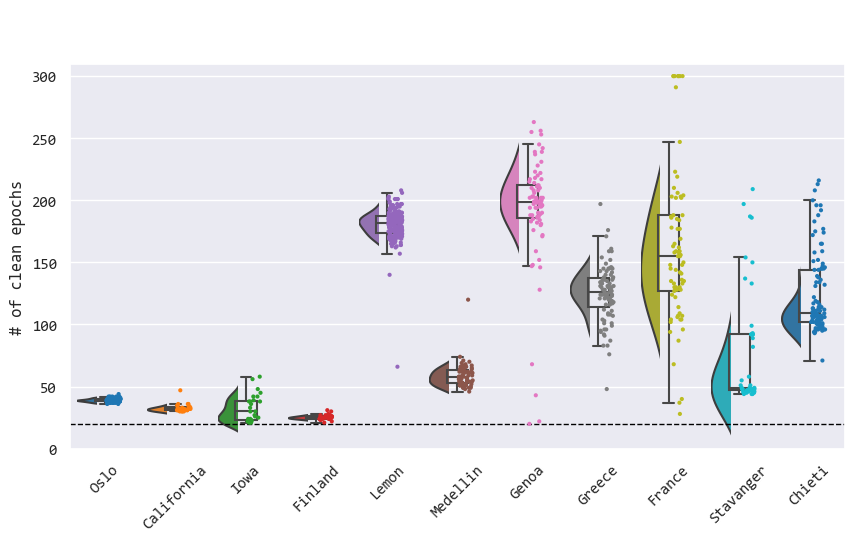

In [60]:
subjects = features_filtered['participant_id']

merged_df = merged_df[merged_df['subject'].isin(subjects)]

# Clip the y-axis values to a maximum of 300
merged_df['epoch_num'] = np.clip(merged_df['epoch_num'], 0, 300)

sns.set(font="Consolas")

# Set the font to "Consolas" in matplotlib
plt.rcParams["font.family"] = "Consolas"
# sns.set_style('white')
palette = 'tab10'
fig, ax = plt.subplots(figsize=(10, 5))  # Adjust the figure size as needed
ax = sns.violinplot(x="center", y="epoch_num", data=merged_df, hue="center", dodge=False,
                    palette=palette, scale="width", inner=None)
xlim = ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 3, height, transform=ax.transData))

sns.boxplot(x="center", y="epoch_num", data=merged_df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax)

old_len_collections = len(ax.collections)

sns.stripplot(x="center", y="epoch_num", data=merged_df, hue="center", palette=palette, dodge=False,
              size=3, ax=ax)  # Adjust the size parameter to change the dot size

for dots in ax.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))


# Set the tick labels and other adjustments
ax.set_xlabel("")  # Update X label
ax.set_ylabel("# of clean epochs")  # Update Y label
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_xticklabels([tick.get_text().capitalize() for tick in ax.get_xticklabels()])
ax.set_ylim(0,310)  # Update X label

# Add a dashed horizontal line at y=20
ax.axhline(y=20, color='black', linestyle='--', linewidth=1)

ax.legend_.remove()

#plt.savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/num_epochs.tiff', format='tiff', dpi=300)
plt.show()

In [61]:
df = features_filtered

# Absolute count of NaN per column
nan_count = df.iloc[:, 6:].isna().sum()
nan_abs_count = nan_count.abs()

# Percentage of NaN per column
nan_percentage = (nan_count / df.iloc[:, 6:].shape[0]) * 100

# Print report
print("NaN values per column:")
for column in df.columns[6:]:
    print(f"{column}: Absolute Count = {nan_abs_count[column]}, Percentage = {nan_percentage[column]:.2f}%")

# Absolute number of NaN in all the dataset (except for demographics)
total_nan_abs_count = nan_abs_count.sum()

# Percentage of NaN in all the dataset (except for demographics)
total_nan_percentage = (total_nan_abs_count / (df.iloc[:, 6:].shape[0] * df.iloc[:, 6:].shape[1])) * 100

# Print
print("\nNaN values in the entire DataFrame (excluding the first 6 columns):")
print(f"Absolute Count = {total_nan_abs_count}, Percentage = {total_nan_percentage:.2f}%")

NaN values per column:
permutation: Absolute Count = 0, Percentage = 0.00%
sample_ent: Absolute Count = 0, Percentage = 0.00%
approximate: Absolute Count = 0, Percentage = 0.00%
svd_ent: Absolute Count = 0, Percentage = 0.00%
higuchi_fd: Absolute Count = 0, Percentage = 0.00%
hjort_mobility: Absolute Count = 0, Percentage = 0.00%
hjort_complexity: Absolute Count = 0, Percentage = 0.00%
detrended_fluct: Absolute Count = 0, Percentage = 0.00%
katz_fd: Absolute Count = 0, Percentage = 0.00%
petrosian_fd: Absolute Count = 0, Percentage = 0.00%
unc_delta: Absolute Count = 0, Percentage = 0.00%
unc_slowtheta: Absolute Count = 0, Percentage = 0.00%
unc_prealpha: Absolute Count = 0, Percentage = 0.00%
unc_alpha: Absolute Count = 0, Percentage = 0.00%
unc_beta: Absolute Count = 0, Percentage = 0.00%
fp_slow_theta: Absolute Count = 0, Percentage = 0.00%
fp_prealpha: Absolute Count = 0, Percentage = 0.00%
fp_alpha: Absolute Count = 0, Percentage = 0.00%
dom_freq: Absolute Count = 0, Percentage = 

In [62]:


df = features_filtered

# Absolute count of NaN per column
nan_count = df.iloc[:,-10:-4].isna().sum()
nan_abs_count = nan_count.abs()

# Percentage of NaN per column
nan_percentage = (nan_count / df.iloc[:,-10:-4].shape[0]) * 100

# Print report
print("NaN values per column:")
for column in df.columns[-10:-4]:
    print(f"{column}: Absolute Count = {nan_abs_count[column]}, Percentage = {nan_percentage[column]:.2f}%")

# Absolute number of NaN in all the dataset (except for demographics)
total_nan_abs_count = nan_abs_count.sum()

# Percentage of NaN in all the dataset (except for demographics)
total_nan_percentage = (total_nan_abs_count / (df.iloc[:,-10:-4].shape[0] * df.iloc[:,-10:-4].shape[1])) * 100

# Print
print("\nNaN values in the entire DataFrame (excluding the first 6 columns):")
print(f"Absolute Count = {total_nan_abs_count}, Percentage = {total_nan_percentage:.2f}%")

NaN values per column:
beta_cf: Absolute Count = 1343, Percentage = 9.52%
beta_pw: Absolute Count = 1343, Percentage = 9.52%
beta_bw: Absolute Count = 1343, Percentage = 9.52%
extalphas_cf: Absolute Count = 708, Percentage = 5.02%
extalphas_pw: Absolute Count = 708, Percentage = 5.02%
extalphas_bw: Absolute Count = 708, Percentage = 5.02%

NaN values in the entire DataFrame (excluding the first 6 columns):
Absolute Count = 6153, Percentage = 7.27%


In [63]:
features_long[features_long["r_squared"] < 0.80]

,participant_id,group,center,age,gender,channel,permutation,sample_ent,approximate,svd_ent,...,beta_cf,beta_pw,beta_bw,extalphas_cf,extalphas_pw,extalphas_bw,exponent,offset,r_squared,error
36,o_003,hc,oslo,62.0,f,C3,0.877252,1.475829,1.238228,0.808055,...,NaN,NaN,NaN,10.750275,0.366789,5.800315,0.305682,-9.944862,0.581579,0.102998
42,o_003,hc,oslo,62.0,f,F8,0.882005,1.406666,1.185447,0.811972,...,18.817133,0.390204,3.163866,8.576203,0.743242,2.137218,0.249413,-9.760979,0.784882,0.071109
48,o_003,hc,oslo,62.0,f,P3,0.865838,1.392579,1.185425,0.795592,...,NaN,NaN,NaN,11.998792,0.577491,6.617234,0.384509,-9.749081,0.785360,0.103196
326,o_019,hc,oslo,48.0,f,Cz,0.856417,1.308058,1.140475,0.781114,...,NaN,NaN,NaN,9.175756,1.024459,3.263136,0.122847,-10.083253,0.793504,0.113331
443,o_025,hc,oslo,24.0,m,O2,0.883135,1.495805,1.232518,0.823389,...,16.417482,0.312042,3.218239,9.879471,0.843086,3.362674,0.001055,-10.200535,0.796541,0.076552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14895,chi_072,dlb,chieti,76.0,f,Fz,0.942235,1.859842,1.378778,0.861225,...,13.650686,0.361600,7.016068,9.727090,0.893035,2.347743,0.454249,-9.424864,0.472591,0.159027
14901,chi_072,dlb,chieti,76.0,f,P8,0.908057,1.574425,1.313498,0.803000,...,NaN,NaN,NaN,7.144762,1.112635,1.000000,0.856837,-9.181011,0.772483,0.161339
14902,chi_072,dlb,chieti,76.0,f,T7,0.925887,1.722968,1.362804,0.841593,...,NaN,NaN,NaN,9.502768,0.761737,5.463099,0.568536,-9.499404,0.753626,0.128294
14903,chi_072,dlb,chieti,76.0,f,T8,0.914256,1.632223,1.329536,0.817460,...,NaN,NaN,NaN,6.790142,0.951171,1.318007,0.642595,-9.380054,0.726748,0.145852


In [64]:
# Count of rows with r_squared < 0.8
rows_r_squared_lt_080 = features_long[features_long["r_squared"] < 0.8].shape[0]

# Percentage of rows with r_squared < 0.8
percentage_r_squared_lt_080 = (rows_r_squared_lt_080 / features_long.shape[0]) * 100

# Print overall report
print("Overall report:")
print(f"Rows with r_squared < 0.8: Count = {rows_r_squared_lt_080}, Percentage = {percentage_r_squared_lt_080:.2f}%")

# Calculate total count per channel
channel_counts = features_long.groupby("channel").size()

# Calculate count of rows with r_squared < 0.8 per channel
channel_counts_lt_080 = features_long[features_long["r_squared"] < 0.8].groupby("channel").size()

# Calculate total count for all channels
total_count = channel_counts.sum()

# Calculate percentage of rows with r_squared < 0.8 per channel
percentage_lt_080 = (channel_counts_lt_080 / total_count) * 100

# Create DataFrame for the report
report_df = pd.DataFrame({
    "Channel": channel_counts.index,
    "Count": channel_counts_lt_080,
    "Percentage": percentage_lt_080
})

# Print the report DataFrame
print("\nReport DataFrame:")
report_df.head(50)


Overall report:
Rows with r_squared < 0.8: Count = 1663, Percentage = 10.55%

Report DataFrame:


,Channel,Count,Percentage
channel,,,
C3,C3,99,0.627854
C4,C4,93,0.589802
Cz,Cz,62,0.393201
F3,F3,89,0.564434
F4,F4,89,0.564434
F7,F7,100,0.634196
F8,F8,100,0.634196
Fp1,Fp1,92,0.583460
Fp2,Fp2,94,0.596144


In [65]:
np.unique(features_long["r_squared"])

array([2.83175310e-04, 3.85743573e-03, 4.97079949e-03, ...,
       9.97161159e-01, 9.97457473e-01,            nan])

In [66]:
import pandas as pd
df = features_long
# Count of rows with r_squared < 0.8
rows_r_squared_lt_080 = df[df["r_squared"] < 0.8].shape[0]

# Percentage of rows with r_squared < 0.8
percentage_r_squared_lt_080 = (rows_r_squared_lt_080 / df.shape[0]) * 100

# Print overall report
print("Overall report:")
print(f"Rows with r_squared < 0.8: Count = {rows_r_squared_lt_080}, Percentage = {100-percentage_r_squared_lt_080:.2f}%")

# Calculate total count per channel and center
channel_center_counts = df.groupby(["channel", "center"]).size()

# Calculate count of rows with r_squared < 0.8 per channel and center
channel_center_counts_lt_080 = df[df["r_squared"] < 0.8].groupby(["channel", "center"]).size()

# Reindex channel_center_counts_lt_080 to include all combinations of channel and center
channel_center_counts_lt_080 = channel_center_counts_lt_080.reindex(channel_center_counts.index, fill_value=0)

# Calculate total count for all channels and centers
total_count = channel_center_counts.sum()

# Calculate percentage of rows with r_squared < 0.8 per channel and center
percentage_lt_080 = (channel_center_counts_lt_080 / total_count) * 100

# Create DataFrame for the report
report_df = pd.DataFrame({
    "Channel": channel_center_counts.index.get_level_values("channel"),
    "Center": channel_center_counts.index.get_level_values("center"),
    "Count": channel_center_counts_lt_080,
    "Percentage": percentage_lt_080
})

# Pivot the DataFrame to have "centers" in columns and channels in rows
pivot_df = report_df.pivot(index="Channel", columns="Center", values=["Count", "Percentage"])

# Calculate total count and total percentage of NaN for each row
pivot_df["Total Count"] = pivot_df["Count"].sum(axis=1)

# Print the report DataFrame
print("\nReport Table:")
pivot_df


Overall report:
Rows with r_squared < 0.8: Count = 1663, Percentage = 89.45%

Report Table:


Count                                                         \
Center  california chieti finland france genoa greece iowa lemon medellin   
Channel                                                                     
C3             3.0    3.0     1.0    0.0   0.0    4.0  3.0  72.0      7.0   
C4             1.0    3.0     2.0    1.0   0.0    7.0  1.0  67.0      8.0   
Cz             2.0    3.0     0.0    1.0   1.0    2.0  0.0  46.0      4.0   
F3             2.0    4.0     0.0    2.0   0.0    9.0  3.0  60.0      6.0   
F4             2.0    3.0     3.0    1.0   0.0    7.0  5.0  60.0      5.0   
F7             0.0    1.0     2.0    1.0   3.0    4.0  2.0  69.0     13.0   
F8             2.0    5.0     2.0    0.0   0.0    5.0  3.0  64.0     15.0   
Fp1            2.0    3.0     2.0    1.0   1.0    8.0  1.0  64.0     10.0   
Fp2            2.0    2.0     3.0    1.0   1.0    6.0  7.0  62.0      7.0   
Fz             1.0    2.0     0.0    1.0   0.0    2.0  1.0  30.0      3.0   
O1             2.0    1.0     0.0    0.0   2.0    1.0  0.0  78.0      7.0   
O2             2.0    2.0     1.0    0.0   1.0    2.0  1.0  85.0      5.0   
P3             1.0    2.0     0.0    0.0   0.0    1.0  1.0  72.0      4.0   
P4             1.0    2.0     0.0    0.0   0.0    1.0  1.0  65.0      2.0   
P7             2.0    1.0     0.0    0.0   0.0    2.0  0.0  78.0     10.0   
P8             2.0    2.0     0.0    1.0   0.0    1.0  1.0  77.0      6.0   
T7             0.0    3.0     1.0    1.0   1.0    2.0  2.0  86.0     23.0   
T8             1.0    3.0     1.0    4.0   0.0    5.0  1.0  92.0     14.0   

              ... Percentage                                          \
Center  oslo  ...    finland    france     genoa    greece      iowa   
Channel       ...                                                      
C3       3.0  ...   0.006342  0.000000  0.000000  0.025368  0.019026   
C4       3.0  ...   0.012684  0.006342  0.000000  0.044394  0.006342   
Cz       2.0  ...   0.000000  0.006342  0.006342  0.012684  0.000000   
F3       2.0  ...   0.000000  0.012684  0.000000  0.057078  0.019026   
F4       3.0  ...   0.019026  0.006342  0.000000  0.044394  0.031710   
F7       5.0  ...   0.012684  0.006342  0.019026  0.025368  0.012684   
F8       4.0  ...   0.012684  0.000000  0.000000  0.031710  0.019026   
Fp1      0.0  ...   0.012684  0.006342  0.006342  0.050736  0.006342   
Fp2      3.0  ...   0.019026  0.006342  0.006342  0.038052  0.044394   
Fz       1.0  ...   0.000000  0.006342  0.000000  0.012684  0.006342   
O1       5.0  ...   0.000000  0.000000  0.012684  0.006342  0.000000   
O2       7.0  ...   0.006342  0.000000  0.006342  0.012684  0.006342   
P3       3.0  ...   0.000000  0.000000  0.000000  0.006342  0.006342   
P4       0.0  ...   0.000000  0.000000  0.000000  0.006342  0.006342   
P7       5.0  ...   0.000000  0.000000  0.000000  0.012684  0.000000   
P8       3.0  ...   0.000000  0.006342  0.000000  0.006342  0.006342   
T7       8.0  ...   0.006342  0.006342  0.006342  0.012684  0.012684   
T8       3.0  ...   0.006342  0.025368  0.000000  0.031710  0.006342   

                                                Total Count  
Center      lemon  medellin      oslo stavanger              
Channel                                                      
C3       0.456621  0.044394  0.019026  0.019026        99.0  
C4       0.424911  0.050736  0.019026  0.000000        93.0  
Cz       0.291730  0.025368  0.012684  0.006342        62.0  
F3       0.380518  0.038052  0.012684  0.006342        89.0  
F4       0.380518  0.031710  0.019026  0.000000        89.0  
F7       0.437595  0.082445  0.031710  0.000000       100.0  
F8       0.405885  0.095129  0.025368  0.000000       100.0  
Fp1      0.405885  0.063420  0.000000  0.000000        92.0  
Fp2      0.393201  0.044394  0.019026  0.000000        94.0  
Fz       0.190259  0.019026  0.006342  0.000000        41.0  
O1       0.494673  0.044394  0.031710  0.012684        98.0  
O2       0.539

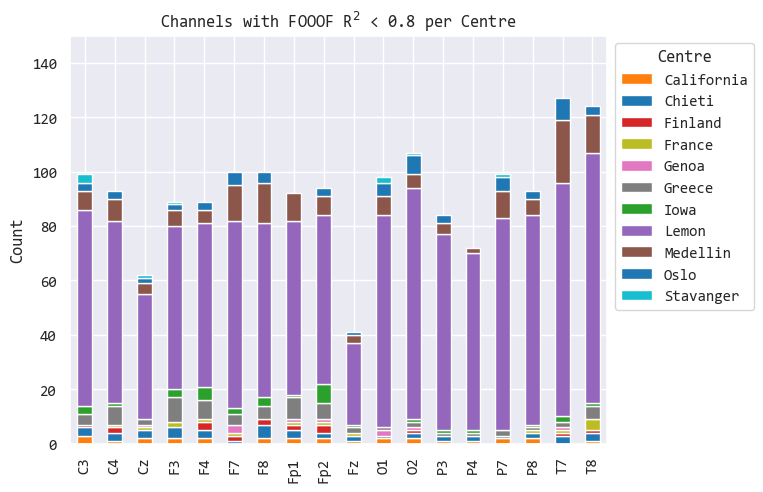

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Reset the index of pivot_df
df = pivot_df.reset_index(inplace=False)

# Get the colors from the "Set1" palette
colors = sns.color_palette("tab10", len(df))
sns.set(font="Consolas")

# Define the desired color mapping for each Center
color_mapping = {
    'california': colors[1],  # blue
    'finland': colors[3],     # purple
    'iowa': colors[2],        # green
    'lemon': colors[4],       # Green
    'oslo': colors[0],         # Purple
    'medellin': colors[5],         # 
    'genoa': colors[6],         # 
    'greece': colors[7],
    'france': colors[8],         # 
    'stavanger': colors[9],
    'chieti': colors[10]         # 
}

# Capitalize the values of the color mapping dictionary
color_mapping_labels = {key.capitalize(): value for key, value in color_mapping.items()}

# Sort color_mapping_labels by keys
sorted_color_mapping_labels = {k: color_mapping_labels[k] for k in sorted(color_mapping_labels)}

# Create stacked bar chart for monthly temperatures with the desired colors
fig, ax = plt.subplots(figsize=(8.6, 6))
df.plot(x='Channel', y='Count', kind='bar', stacked=True, legend=True, color=[color_mapping[count] for count in df['Count']], ax=ax)

# Labels for x & y axis
plt.xlabel("")
plt.ylabel("Count")
plt.ylim(0, 150)

# Title of plot
plt.title("Channels with FOOOF R$^2$ < 0.8 per Centre")

# Show legend with modified colors and sorted center names
plt.legend(title="Centre", labels=[key for key in sorted_color_mapping_labels.keys()], facecolor="white", bbox_to_anchor=(1, 1), loc="upper left")

# Adjust space between plots
plt.subplots_adjust(wspace=0.1, right=0.75, bottom=0.2)

# Save and display the plot
# plt.savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/bad_foo


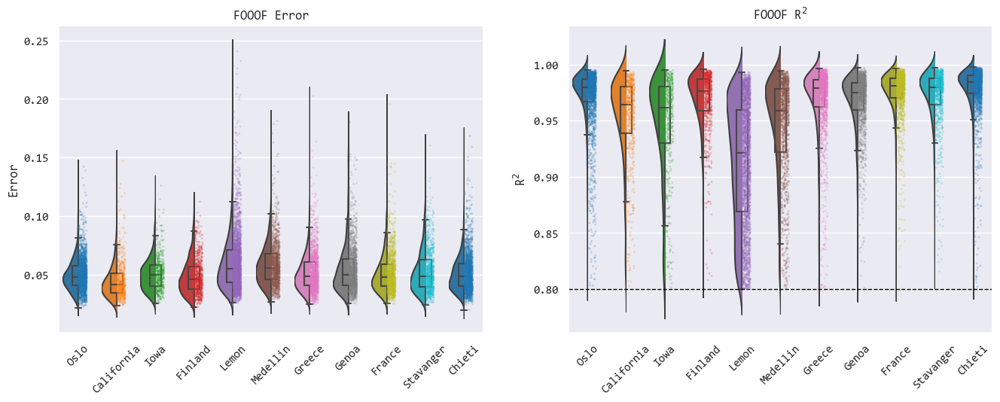

In [68]:
sns.set_style('white')
sns.set(font="Consolas")

df = features_filtered
palette = 'tab10'

# Create Fig and subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

# Raincloud plot for "error"
ax1 = axes[0]
sns.violinplot(x="center", y="error", data=df, hue="center", dodge=False,
               palette=palette,
               scale="width", inner=None, ax=ax1)
xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(x="center", y="error", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax1)

old_len_collections = len(ax1.collections)

sns.stripplot(x="center", y="error", data=df, hue="center", palette=palette, dodge=False, ax=ax1,
              alpha=0.25, size=2)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax1.set_xlim(xlim1)
ax1.set_ylim(ylim1)
ax1.legend_.remove()
ax1.set_title("FOOOF Error")
ax1.set_xlabel("")
ax1.set_ylabel("Error")
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])

# Raincloud plot for "r_squared"
ax2 = axes[1]
sns.violinplot(x="center", y="r_squared", data=df, hue="center", dodge=False,
               palette=palette,
               scale="width", inner=None, ax=ax2)
xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax2.transData))

sns.boxplot(x="center", y="r_squared", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=ax2)

old_len_collections = len(ax2.collections)

sns.stripplot(x="center", y="r_squared", data=df, hue="center", palette=palette, dodge=False, ax=ax2,
              alpha=0.25, size=2)

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.12, 0]))

ax2.set_xlim(xlim2)
ax2.set_ylim(ylim2)
ax2.legend_.remove()
ax2.set_title("FOOOF R$^2$")
ax2.set_xlabel("")
ax2.set_ylabel("R$^2$")
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])
ax2.axhline(y=0.8, color='black', linestyle='--', linewidth=1)


# plt.xticks(rotation=45)  # Rotate x-axis labels to vertical position and set font weight to bold

# Adjust space between plots
plt.subplots_adjust(wspace=0.2, bottom=0.2)


plt.show()




In [69]:
import pandas as pd
#MEAN BY ROI
data = features_filtered
# Define the ROI mappings
roi_mapping = {
    'anterior': ["Fp1", "Fp2", "F3", "F4", "F7", "F8", "Fz"],
    'central': ["T7", "T8", "C3", "C4", "Cz"],
    'posterior': ["P3", "P4", "P7", "P8", "O1", "O2"]
}

# Select the columns of interest
columns_of_interest = ['participant_id', 'group', 'center', 'age', 'gender', 'channel','permutation', 'sample_ent', 'approximate', 
            'svd_ent', 'higuchi_fd','hjort_mobility', 'hjort_complexity', 'detrended_fluct', 'katz_fd','petrosian_fd', 
            'unc_delta', 'unc_slowtheta', 'unc_prealpha', 'unc_alpha', 'unc_beta', 'fp_slow_theta', 'fp_prealpha', 'fp_alpha', 
            'dom_freq', 'dom_freq_var', 'beta_cf', 'beta_pw', 'beta_bw','extalphas_cf', 'extalphas_pw', 'extalphas_bw', 
            'exponent', 'offset']

# Filter the DataFrame to include only the columns of interest
filtered_data = data[columns_of_interest].copy()

# Create a new column 'ROI' based on 'channel' values
filtered_data['ROI'] = filtered_data['channel'].apply(lambda x: 'anterior' if x in roi_mapping['anterior']
                                                      else 'central' if x in roi_mapping['central']
                                                      else 'posterior')

# Group by 'participant_id', 'group', 'center', 'age', 'gender', and 'ROI',
# calculate the mean of the selected features
mean_data = filtered_data.groupby(['participant_id', 'group', 'center', 'age', 'gender', 'ROI']).mean().reset_index()

# Reorder the columns to include 'group', 'center', and 'gender'
columns_order = ['participant_id', 'group', 'center', 'age', 'gender', 'ROI',
                 'permutation', 'sample_ent', 'approximate', 'svd_ent', 'higuchi_fd','hjort_mobility', 'hjort_complexity', 'detrended_fluct', 'katz_fd','petrosian_fd', 
            'unc_delta', 'unc_slowtheta', 'unc_prealpha', 'unc_alpha', 'unc_beta', 'fp_slow_theta', 'fp_prealpha', 'fp_alpha', 
            'dom_freq', 'dom_freq_var', 'beta_cf', 'beta_pw', 'beta_bw','extalphas_cf', 'extalphas_pw', 'extalphas_bw', 
            'exponent', 'offset']

mean_data = mean_data[columns_order]


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_10348\3426401677.py:28: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_data = filtered_data.groupby(['participant_id', 'group', 'center', 'age', 'gender', 'ROI']).mean().reset_index()


In [70]:
import pandas as pd

# Your DataFrame
df = mean_data

# Group by "participant_id" and collect unique levels of "ROI"
roi_levels = df.groupby('participant_id')['ROI'].unique()

# Check if any group has less than three unique levels of "ROI"
participant_with_less_levels = roi_levels[roi_levels.apply(len) < 3]

if len(participant_with_less_levels) > 0:
    print("There are participant_id(s) with less than three levels of ROI:")
    for participant_id, levels in participant_with_less_levels.items():
        print(f"participant_id: {participant_id}, levels: {levels}")
else:
    print("All participant_id(s) have at least three levels of ROI.")


There are participant_id(s) with less than three levels of ROI:
participant_id: c_pd6, levels: ['anterior' 'central']
participant_id: chi_012, levels: ['anterior' 'posterior']
participant_id: l_010010, levels: ['anterior' 'posterior']
participant_id: l_010041, levels: ['anterior' 'posterior']
participant_id: l_010045, levels: ['central' 'posterior']
participant_id: l_010068, levels: ['anterior' 'central']
participant_id: l_010075, levels: ['anterior' 'central']
participant_id: l_010081, levels: ['central' 'posterior']
participant_id: l_010085, levels: ['central']
participant_id: l_010146, levels: ['central' 'posterior']
participant_id: l_010250, levels: ['anterior' 'central']
participant_id: l_010258, levels: ['anterior' 'central']
participant_id: l_010265, levels: ['anterior' 'central']
participant_id: l_010277, levels: ['anterior' 'posterior']
participant_id: l_010290, levels: ['anterior' 'central']
participant_id: l_010314, levels: ['anterior' 'central']
participant_id: l_010315, le

In [71]:
df = mean_data

# Absolute count of NaN per column
nan_count = df.iloc[:, 6:].isna().sum()
nan_abs_count = nan_count.abs()

# Percentage of NaN per column
nan_percentage = (nan_count / df.iloc[:, 6:].shape[0]) * 100

# Print report
print("NaN values per column:")
for column in df.columns[6:]:
    print(f"{column}: Absolute Count = {nan_abs_count[column]}, Percentage = {nan_percentage[column]:.2f}%")

# Absolute number of NaN in all the dataset (except for demographics)
total_nan_abs_count = nan_abs_count.sum()

# Percentage of NaN in all the dataset (except for demographics)
total_nan_percentage = (total_nan_abs_count / (df.iloc[:, 6:].shape[0] * df.iloc[:, 6:].shape[1])) * 100

# Print
print("\nNaN values in the entire DataFrame (excluding the first 6 columns):")
print(f"Absolute Count = {total_nan_abs_count}, Percentage = {total_nan_percentage:.2f}%")

NaN values per column:
permutation: Absolute Count = 0, Percentage = 0.00%
sample_ent: Absolute Count = 0, Percentage = 0.00%
approximate: Absolute Count = 0, Percentage = 0.00%
svd_ent: Absolute Count = 0, Percentage = 0.00%
higuchi_fd: Absolute Count = 0, Percentage = 0.00%
hjort_mobility: Absolute Count = 0, Percentage = 0.00%
hjort_complexity: Absolute Count = 0, Percentage = 0.00%
detrended_fluct: Absolute Count = 0, Percentage = 0.00%
katz_fd: Absolute Count = 0, Percentage = 0.00%
petrosian_fd: Absolute Count = 0, Percentage = 0.00%
unc_delta: Absolute Count = 0, Percentage = 0.00%
unc_slowtheta: Absolute Count = 0, Percentage = 0.00%
unc_prealpha: Absolute Count = 0, Percentage = 0.00%
unc_alpha: Absolute Count = 0, Percentage = 0.00%
unc_beta: Absolute Count = 0, Percentage = 0.00%
fp_slow_theta: Absolute Count = 0, Percentage = 0.00%
fp_prealpha: Absolute Count = 0, Percentage = 0.00%
fp_alpha: Absolute Count = 0, Percentage = 0.00%
dom_freq: Absolute Count = 0, Percentage = 

In [72]:
## REMOVE VARIABLES WITH MORE THAN 5% of NaN
# Select the columns of interest
columns_of_interest = ['participant_id', 'group', 'center', 'age', 'gender', 'ROI',
                 'permutation', 'sample_ent', 'approximate', 'svd_ent', 'higuchi_fd','hjort_mobility', 'hjort_complexity', 'detrended_fluct', 'katz_fd','petrosian_fd', 
            'unc_delta', 'unc_slowtheta', 'unc_prealpha', 'unc_alpha', 'unc_beta', 'fp_slow_theta', 'fp_prealpha', 'fp_alpha', 
            'dom_freq', 'dom_freq_var', 'beta_cf', 'beta_pw', 'beta_bw','extalphas_cf', 'extalphas_pw', 'extalphas_bw', 
            'exponent', 'offset']
# Filter the DataFrame to include only the columns of interest
data = mean_data[columns_of_interest].copy()



In [82]:
filtered_data = data#[data["age"] >= 46]

df_wide = pd.pivot(filtered_data, index = ['participant_id', 'group' , 'age', 'gender', 'center'], 
                   columns = ['ROI'],
                   values = ['permutation', 'sample_ent', 'approximate', 'svd_ent', 'higuchi_fd','hjort_mobility', 'hjort_complexity', 'detrended_fluct', 'katz_fd','petrosian_fd', 
            'unc_delta', 'unc_slowtheta', 'unc_prealpha', 'unc_alpha', 'unc_beta', 'fp_slow_theta', 'fp_prealpha', 'fp_alpha', 
            'dom_freq', 'dom_freq_var', 'beta_cf', 'beta_pw', 'beta_bw','extalphas_cf', 'extalphas_pw', 'extalphas_bw', 
            'exponent', 'offset'])
df_wide.columns = ['_'.join(col).strip() for col in df_wide.columns.values]
df_wide = df_wide.reset_index(drop = False)
df_wide.to_csv('D:/data_analysis/eeg_datasets/bids/edlb_lemon_wide_full.csv', index=False)
df_wide.shape


(875, 89)

In [83]:

# List of groups to exclude
excluded_values = ['sci']  # 5 subjects with Subjective cognitive impairment & FTD group

# Filter the dataset to exclude rows where 'group' is in the excluded values list
df_wide = df_wide[(~df_wide['group'].isin(excluded_values))].reset_index(drop=True)

# posterior_roi = ["P3", "P4", "P7", "P8", "Pz", "PO3", "PO4", "Oz", "O1", "O2"]

# # Filter the dataset to exclude rows where 'group' is in the excluded values list
# df_wide = df_wide[(df_wide['channel'].isin(posterior_roi))].reset_index(drop=True)


# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
df_wide['group'] = df_wide['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})

df_wide['group'] = df_wide['group'].replace({'dlb': 'lbd', 'pdd': 'lbd'})
df_wide.shape



(870, 89)

In [84]:
# Calculate min and max age by group
min_age_by_group = df_wide.groupby('group')['age'].min()
max_age_by_group = df_wide.groupby('group')['age'].max()

# Print the results
for group, min_age, max_age in zip(min_age_by_group.index, min_age_by_group.values, max_age_by_group.values):
    print(f"Group: {group}, Min Age: {min_age}, Max Age: {max_age}")


Group: ad, Min Age: 49.0, Max Age: 89.0
Group: ftd, Min Age: 44.0, Max Age: 78.0
Group: hc, Min Age: 17.0, Max Age: 87.0
Group: lbd, Min Age: 60.0, Max Age: 89.0
Group: mci_ad, Min Age: 50.98630137, Max Age: 88.55890411
Group: mci_lbd, Min Age: 52.0, Max Age: 86.0
Group: pd, Min Age: 46.0, Max Age: 86.0


In [85]:
df = df_wide

# Absolute count of NaN per column
nan_count = df.iloc[:, 5:].isna().sum()
nan_abs_count = nan_count.abs()

# Percentage of NaN per column
nan_percentage = (nan_count / df.iloc[:, 5:].shape[0]) * 100

# Absolute number of NaN in all the dataset (except for demographics)
total_nan_abs_count = nan_abs_count.sum()

# Percentage of NaN in all the dataset (except for demographics)
total_nan_percentage = (total_nan_abs_count / (df.iloc[:, 5:].shape[0] * df.iloc[:, 5:].shape[1])) * 100

# Print
print("\nNaN values in the entire DataFrame (excluding the first 5 columns):")
print(f"Absolute Count = {total_nan_abs_count}, Percentage = {total_nan_percentage:.2f}%")


NaN values in the entire DataFrame (excluding the first 5 columns):
Absolute Count = 761, Percentage = 1.04%


In [86]:
import pandas as pd

# Your DataFrame
df = filtered_data

# Group by "participant_id" and collect unique levels of "ROI"
roi_levels = df.groupby('participant_id')['ROI'].unique()

# Check if any group has less than three unique levels of "ROI"
participant_with_less_levels = roi_levels[roi_levels.apply(len) < 3]

if len(participant_with_less_levels) > 0:
    print("There are participant_id(s) with less than three levels of ROI:")
    for participant_id, levels in participant_with_less_levels.items():
        print(f"participant_id: {participant_id}, levels: {levels}")
else:
    print("All participant_id(s) have at least three levels of ROI.")


There are participant_id(s) with less than three levels of ROI:
participant_id: c_pd6, levels: ['anterior' 'central']
participant_id: chi_012, levels: ['anterior' 'posterior']
participant_id: l_010010, levels: ['anterior' 'posterior']
participant_id: l_010041, levels: ['anterior' 'posterior']
participant_id: l_010045, levels: ['central' 'posterior']
participant_id: l_010068, levels: ['anterior' 'central']
participant_id: l_010075, levels: ['anterior' 'central']
participant_id: l_010081, levels: ['central' 'posterior']
participant_id: l_010085, levels: ['central']
participant_id: l_010146, levels: ['central' 'posterior']
participant_id: l_010250, levels: ['anterior' 'central']
participant_id: l_010258, levels: ['anterior' 'central']
participant_id: l_010265, levels: ['anterior' 'central']
participant_id: l_010277, levels: ['anterior' 'posterior']
participant_id: l_010290, levels: ['anterior' 'central']
participant_id: l_010314, levels: ['anterior' 'central']
participant_id: l_010315, le

In [87]:
# FILL NAN WITH MEAN BY GROUP 

for col in df_wide.columns:
    # Check if column contains NaN values
    if df_wide[col].isna().any():
        # Fill NaN values with the mean of each group for that column
        df_wide[col] = df_wide.groupby('group')[col].transform(lambda x: x.fillna(x.mean()))


In [88]:
df = df_wide

# Absolute count of NaN per column
nan_count = df.iloc[:, 5:].isna().sum()
nan_abs_count = nan_count.abs()

# Percentage of NaN per column
nan_percentage = (nan_count / df.iloc[:, 5:].shape[0]) * 100

# Absolute number of NaN in all the dataset (except for demographics)
total_nan_abs_count = nan_abs_count.sum()

# Percentage of NaN in all the dataset (except for demographics)
total_nan_percentage = (total_nan_abs_count / (df.iloc[:, 5:].shape[0] * df.iloc[:, 5:].shape[1])) * 100

# Print
print("\nNaN values in the entire DataFrame (excluding the first 5 columns):")
print(f"Absolute Count = {total_nan_abs_count}, Percentage = {total_nan_percentage:.2f}%")


NaN values in the entire DataFrame (excluding the first 5 columns):
Absolute Count = 0, Percentage = 0.00%


Merge connectivity

In [89]:
import pandas as pd

# List to store all connectivity DataFrames
connectivity_dfs = []

# List of connectivity files to merge
connectivity_files = [
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_california.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_genoa.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_greece.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_oslo.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_lemon.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_medellin.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_iowa.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_finland.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_france.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_stavanger.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_stavanger_nordlb.feather',
    'D:/data_analysis/papers_alberto/final_phd/derivatives_data/connectivity_chieti.feather']

# Read and append each connectivity DataFrame to the list
for connectivity_file in connectivity_files:
    connectivity_df = pd.read_feather(connectivity_file)
    connectivity_dfs.append(connectivity_df)

# Concatenate all connectivity DataFrames into a single DataFrame
connectivity_merged = pd.concat(connectivity_dfs)

# Print the final merged DataFrame
wide = pd.merge(df_wide, connectivity_merged, on=["participant_id", "center"])
wide


,participant_id,group,age,gender,center,permutation_anterior,permutation_central,permutation_posterior,sample_ent_anterior,sample_ent_central,...,imcoh_delta_median,imcoh_delta_iqr,imcoh_theta_median,imcoh_theta_iqr,imcoh_alpha_median,imcoh_alpha_iqr,imcoh_beta_median,imcoh_beta_iqr,imcoh_global_median,imcoh_global_iqr
0,c_hc1,hc,54.0,f,california,0.892644,0.883550,0.868972,1.551208,1.496210,...,0.259082,0.099464,0.242911,0.118781,0.346242,0.138830,0.293477,0.074443,0.292087,0.061083
1,c_hc10,hc,59.0,f,california,0.877798,0.870240,0.860544,1.473879,1.412852,...,0.262099,0.124326,0.280826,0.138664,0.398039,0.214764,0.384130,0.151124,0.359636,0.118167
2,c_hc18,hc,57.0,m,california,0.854015,0.849011,0.837641,1.283902,1.247317,...,0.259795,0.115318,0.224679,0.078641,0.389869,0.138961,0.292143,0.080795,0.296093,0.062204
3,c_hc2,hc,50.0,f,california,0.876912,0.867798,0.857781,1.439695,1.384215,...,0.273069,0.142818,0.291159,0.130867,0.300742,0.152292,0.310655,0.116546,0.302726,0.073826
4,c_hc20,hc,68.0,m,california,0.892162,0.886515,0.881735,1.468234,1.439295,...,0.255501,0.107055,0.330886,0.215555,0.282009,0.128230,0.249500,0.060956,0.266743,0.052986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
865,sta_D20167,mci_ad,74.0,m,stavanger,0.809376,0.803629,0.742180,1.094422,1.069585,...,0.267413,0.121784,0.398114,0.190165,0.475859,0.266562,0.252530,0.058678,0.311927,0.072138
866,sta_D20168,mci_ad,70.0,f,stavanger,0.859698,0.845801,0.848768,1.331566,1.261482,...,0.238015,0.091160,0.254678,0.102754,0.286676,0.116694,0.260352,0.057317,0.261630,0.041688
867,sta_D20169,mci_ad,72.0,m,stavanger,0.833413,0.840435,0.816175,1.185775,1.229973,...,0.293423,0.137930,0.356801,0.125144,0.551164,0.206921,0.290960,0.065658,0.345337,0.077970
868,sta_D20170,mci_ad,76.0,f,stavanger,0.827356,0.821391,0.816518,1.128131,1.154807,...,0.563920,0.341285,0.274224,0.123169,0.489611,0.183351,0.266593,0.059968,0.338255,0.060814


In [ ]:
df = wide

# Absolute count of NaN per column
nan_count = df.iloc[:, 5:].isna().sum()
nan_abs_count = nan_count.abs()

# Percentage of NaN per column
nan_percentage = (nan_count / df.iloc[:, 5:].shape[0]) * 100

# Absolute number of NaN in all the dataset (except for demographics)
total_nan_abs_count = nan_abs_count.sum()

# Percentage of NaN in all the dataset (except for demographics)
total_nan_percentage = (total_nan_abs_count / (df.iloc[:, 5:].shape[0] * df.iloc[:, 5:].shape[1])) * 100

# Print
print("\nNaN values in the entire DataFrame (excluding the first 5 columns):")
print(f"Absolute Count = {total_nan_abs_count}, Percentage = {total_nan_percentage:.2f}%")



In [90]:
wide.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/edlb_all_features_unharm_wide.csv', index=False)


# Exploratory Analysis

## Create Young and Old adults subgroups, and merge PD-MCI into MCI-LBD

In [ ]:
import numpy as np
import pandas as pd

# List of groups to exclude
excluded_values = ['sci']  # 5 subjects with Subjective cognitive impairment

# Filter the dataset to exclude rows where 'group' is in the excluded values list
wide = wide[~wide['group'].isin(excluded_values)]

# Assuming 'wide' is your DataFrame
# Step 1: Calculate the median age of the "hc" group
hc_median_age = wide.loc[wide['group'] == 'hc', 'age'].median()

# Step 2: Replace the "hc" label with "young" or "old" based on the median age
wide['group'] = np.where((wide['group'] == 'hc') & (wide['age'] >= hc_median_age), 'oa', wide['group'])
wide['group'] = np.where((wide['group'] == 'hc') & (wide['age'] < hc_median_age), 'ya', wide['group'])

# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
wide['group'] = wide['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})
wide.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/exploratory_unharm_wide.csv', index=False)



In [ ]:
# Use groupby and nunique to count unique participant_id in each group
group_counts = wide.groupby('group')['participant_id'].nunique()

# Print or display the results
print(group_counts)


In [ ]:
# Use groupby, median, and quantile to calculate median and IQR for age in each group
group_stats = wide.groupby('group')['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Print or display the results
print(group_stats)

Descriptives

In [ ]:
import pandas as pd

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = wide.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Convert 'gender' column to lowercase strings
df['gender'] = df['gender'].str.lower()

# Group the dataset by center and gender
#grouped_df = df.groupby(['center', 'gender'])
grouped_df = df.groupby(['center'])


# Calculate the mean and standard deviation of age for each center
summary_df = grouped_df.agg({'age': ['mean', 'std']})

# Reset the index to flatten the grouped columns
summary_df = summary_df.reset_index()

# Calculate the participant count, female count, and male count for each center
summary_df['participant_count'] = grouped_df['participant_id'].count().values
summary_df['female_count'] = grouped_df.apply(lambda x: (x['gender'] == 'f').sum()).values
summary_df['male_count'] = grouped_df.apply(lambda x: (x['gender'] == 'm').sum()).values

# Display Table 1
print(summary_df)


In [ ]:
# Read the dataset

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = wide.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Convert 'gender' column to lowercase strings
df['gender'] = df['gender'].str.lower()

# Calculate the overall count of males and females
overall_female_count = (df['gender'] == 'f').sum()
overall_male_count = (df['gender'] == 'm').sum()

# Calculate the overall mean and standard deviation of age
overall_age_mean = df['age'].mean()
overall_age_std = df['age'].std()

# Create a summary dataframe for the overall counts and statistics
summary_df = pd.DataFrame({
    'center': ['Overall'],
    'participant_count': [len(df)],
    'female_count': [overall_female_count],
    'male_count': [overall_male_count],
    'age_mean': [overall_age_mean],
    'age_std': [overall_age_std]
})

# Display the summary dataframe
summary_df


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('white')
sns.set(font="Consolas")
# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = wide.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'Set1'

# Raincloud plot for "age"
ax1 = sns.violinplot(x="center", y="age", data=df, hue="center", dodge=False,
               palette=palette,
               scale="width", inner=None)
xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(x="center", y="age", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'})

old_len_collections = len(ax1.collections)

sns.stripplot(x="center", y="age", data=df, hue="center", palette=palette, dodge=False,
              alpha=0.4, size=3)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

ax1.set_xlim(xlim1)
ax1.set_ylim(ylim1)
ax1.legend_.remove()
ax1.set_title("")
ax1.set_xlabel("")
ax1.set_ylabel("Age (years)")
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])


# plt.savefig('D:/data_analysis/papers_alberto/combat_eeg/figures/age_raincloud.tiff', format='tiff', dpi=300)
plt.show()


In [ ]:
# Get the colors from the "Set1" palette
colors = sns.color_palette("Set1")

# Convert the colors to hexadecimal codes
hex_codes = colors.as_hex()

# Print the hexadecimal codes
print(hex_codes)


In [ ]:
import matplotlib.pyplot as plt

# Set figure and subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# First subplot: Raincloud plot for "age" without grouping
sns.set_style('white')
sns.set(font="Consolas")
sns.set_palette("turbo")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Raincloud plot for "age" without grouping
ax1 = sns.violinplot(y="age", data=df, inner=None, ax=axs[0])

xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(y="age", data=df, saturation=1, showfliers=False,
            width=0.13, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[0])

old_len_collections = len(ax1.collections)

sns.stripplot(y="age", data=df, dodge=False,
              alpha=0.3, size=4, ax=axs[0])

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[0].set_xlim(xlim1)
axs[0].set_ylim(ylim1)
axs[0].set_ylabel("Age (years)")
axs[0].set_xlabel("Pooled sample")


# Second subplot: Raincloud plot for "age" with grouping by gender
sns.set_style('white')
sns.set(font="Consolas")
palette = 'Set1'


# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Raincloud plot for "age" with grouping by gender
ax2 = sns.violinplot(x="gender", y="age", data=df, hue="gender", dodge=False,
                     palette=palette,
                     scale="width", inner=None, ax=axs[1])
xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax2.transData))

sns.boxplot(x="gender", y="age", data=df, saturation=1, showfliers=False,
            width=0.12, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[1])

old_len_collections = len(ax2.collections)

sns.stripplot(x="gender", y="age", data=df, hue="gender", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[1])

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[1].set_xlim(xlim2)
axs[1].set_ylim(ylim2)
axs[1].legend_.remove()
axs[1].set_title("")
axs[1].set_xlabel("Sex")
axs[1].set_ylabel("")
axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=45)
axs[1].set_xticklabels([tick.get_text().upper() for tick in axs[1].get_xticklabels()])


# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.13)

# plt.savefig('D:/data_analysis/papers_alberto/combat_eeg/figures/age_combined.tiff', format='tiff', dpi=300)
plt.show()


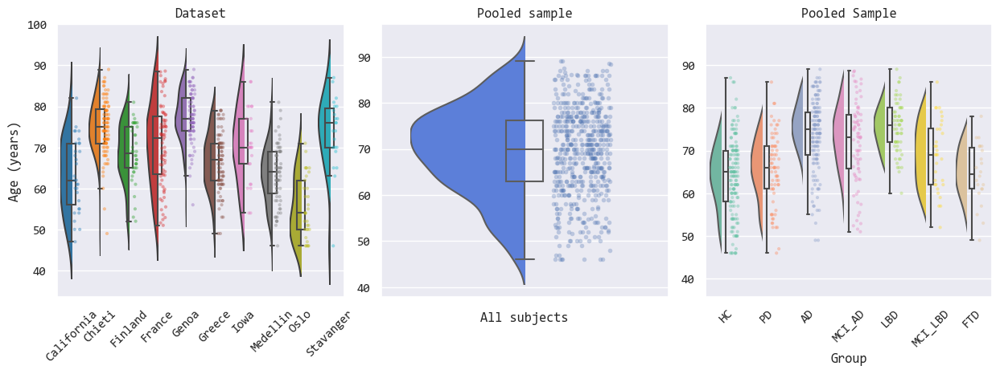

In [24]:
import matplotlib.pyplot as plt

# Set figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Third subplot: Raincloud plot for "age" with grouping by center
sns.set_style('white')
sns.set(font="Consolas")


# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')



palette = 'tab10'

# Raincloud plot for "age" with grouping by center
ax3 = sns.violinplot(x="center", y="age", data=df, hue="center", dodge=False,
                     palette=palette,
                     scale="width", inner=None, ax=axs[0])  # Move to the first position (index 0)
xlim3 = ax3.get_xlim()
ylim3 = ax3.get_ylim()

for violin in ax3.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax3.transData))

sns.boxplot(x="center", y="age", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[0])  # Move to the first position (index 0)

old_len_collections = len(ax3.collections)

sns.stripplot(x="center", y="age", data=df, hue="center", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[0])  # Move to the first position (index 0)

for dots in ax3.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[0].set_xlim(xlim3)
axs[0].set_ylim(ylim3)
axs[0].legend_.remove()
axs[0].set_title("Dataset")
axs[0].set_xlabel("")
axs[0].set_ylabel("Age (years)")
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)
axs[0].set_xticklabels([tick.get_text().capitalize() for tick in axs[0].get_xticklabels()])

# First subplot: Raincloud plot for "age" without grouping
sns.set_style('white')
sns.set(font="Consolas")
sns.set_palette("turbo")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')
# Raincloud plot for "age" without grouping
ax1 = sns.violinplot(y="age", data=df, inner=None, ax=axs[1])  # Move to the last position (index 2)

xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(y="age", data=df, saturation=1, showfliers=False,
            width=0.13, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[1])  # Move to the last position (index 2)

old_len_collections = len(ax1.collections)

sns.stripplot(y="age", data=df, dodge=False,
              alpha=0.3, size=4, ax=axs[1])  # Move to the last position (index 2)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[1].set_xlim(xlim1)
axs[1].set_ylim(ylim1)
axs[1].set_ylabel("")
axs[1].set_xlabel("All subjects")
axs[1].set_title("Pooled sample")

# Second subplot: Raincloud plot for "age" with grouping by gender
sns.set_style('white')
sns.set(font="Consolas")
palette = 'Set2'

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Calculate the count of unique participant_id in each group
group_counts = df.groupby('group')['participant_id'].nunique()

# Raincloud plot for "age" with grouping by gender
ax2 = sns.violinplot(x="group", y="age", data=df, hue="group", dodge=False,
                     palette=palette,
                     scale="width", inner=None, ax=axs[2])  # Place in the middle position (index 1)

xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 3, height, transform=ax2.transData))

sns.boxplot(x="group", y="age", data=df, saturation=1, showfliers=False,
            width=0.12, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[2])  # Place in the middle position (index 1)

old_len_collections = len(ax2.collections)

sns.stripplot(x="group", y="age", data=df, hue="group", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[2])  # Place in the middle position (index 1)

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[2].set_xlim(xlim2)
axs[2].set_ylim(ylim2)
axs[2].set_title("Pooled Sample")
axs[2].set_xlabel("Group")
axs[2].legend_.remove()
axs[2].set_ylabel("")
axs[2].set_xticklabels(axs[2].get_xticklabels(), rotation=45)
# Add count information to the x-axis tick labels
for i, label in enumerate(ax2.get_xticklabels()):
    group = label.get_text()
    count = group_counts.loc[group]
    label.set_text(f"{group}\n n=({count})")
    
axs[2].set_xticklabels([tick.get_text().upper() for tick in axs[2].get_xticklabels()])


# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.13, bottom=0.2)
#plt.savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1a.tiff', format='tiff', dpi=300)

plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('white')
sns.set(font="Consolas")


# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'tab10'

fig, ax = plt.subplots(figsize=(15, 5))

# Countplot with hue="center"
sns.countplot(x="gender", hue="center", data=df, palette=palette, ax=ax)

ax.set_title("")
ax.set_xlabel("Sex")
ax.set_ylabel("Count")


# Annotate each bar with the count value
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.1f}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', size=10)

#plt.savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/sex_by_center.tiff', format='tiff', dpi=300)
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('white')
sns.set(font="Consolas")



# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'tab10'

fig, ax = plt.subplots(figsize=(15, 5))

# Calculate percentages
counts = df.groupby(['center', 'gender']).size().reset_index(name='count')
total_counts = counts.groupby('center')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_counts * 100

# Bar plot with percentages
sns.barplot(x='center', y='percentage', hue='gender', data=counts, palette=palette, ax=ax)

ax.set_title("")
ax.set_xlabel("")
ax.set_ylabel("Percentage")
plt.ylim(0, 100)

# Change legend title
ax.legend(title='Sex')

# Annotate each bar with the percentage value
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', size=10)

# plt.savefig('D:/data_analysis/papers_alberto/combat_eeg/figures/sex_percentages.tiff', format='tiff', dpi=300)
plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'tab10'

# Create a 1x2 grid layout
fig = plt.figure(figsize=(15, 5))
gs = GridSpec(1, 2, figure=fig)

# First subplot
ax1 = fig.add_subplot(gs[0, 0])

sns.countplot(x="gender", hue="center", data=df, palette=palette, ax=ax1)

ax1.set_title("")
ax1.set_xlabel("Sex")
ax1.set_ylabel("Count")
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])

for p in ax1.patches:
    height = p.get_height()
    ax1.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', size=10)

# Move the legend outside
legend1 = ax1.legend(title='Center', bbox_to_anchor=(1, 0.5), loc='center left')
# Capitalize legend items
for text in legend1.get_texts():
    text.set_text(text.get_text().capitalize())

# Second subplot
ax2 = fig.add_subplot(gs[0, 1])

counts = df.groupby(['center', 'gender']).size().reset_index(name='count')
total_counts = counts.groupby('center')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_counts * 100

sns.barplot(x='center', y='percentage', hue='gender', data=counts, palette=palette, ax=ax2)

ax2.set_title("")
ax2.set_xlabel("")
ax2.set_ylabel("Percentage")
ax2.set_ylim(0, 100)
legend2 = ax2.legend(title='Sex', bbox_to_anchor=(1, 0.5), loc='center left')
# Capitalize legend items
for text in legend2.get_texts():
    text.set_text(text.get_text().capitalize())

ax2.set_xticklabels(axs[0].get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])

for p in ax2.patches:
    height = p.get_height()
    ax2.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2, height+3),
                ha='center', va='bottom', size=10, rotation=90)

# Adjust spacing between subplots
fig.tight_layout()

# Save the combined figure
plt.show()  # Or savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1b.tiff', format='tiff', dpi=300)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'Set2'

# Create a 1x2 grid layout
fig = plt.figure(figsize=(15, 5))
gs = GridSpec(1, 2, figure=fig)

# First subplot
ax1 = fig.add_subplot(gs[0, 0])

sns.countplot(x="gender", hue="group", data=df, palette=palette, ax=ax1)

ax1.set_title("")
ax1.set_xlabel("Sex")
ax1.set_ylabel("Count")
ax1.set_xticklabels([tick.get_text().upper() for tick in ax1.get_xticklabels()])

for p in ax1.patches:
    height = p.get_height()
    ax1.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', size=10)

# Move the legend outside
legend1 = ax1.legend(title='Group', bbox_to_anchor=(1, 0.5), loc='center left')
# Capitalize legend items
for text in legend1.get_texts():
    text.set_text(text.get_text().upper())

# Second subplot
ax2 = fig.add_subplot(gs[0, 1])

counts = df.groupby(['group', 'gender']).size().reset_index(name='count')
total_counts = counts.groupby('group')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_counts * 100

sns.barplot(x='group', y='percentage', hue='gender', data=counts, palette='tab10', ax=ax2)

ax2.set_title("")
ax2.set_xlabel("")
ax2.set_ylabel("Percentage")
ax2.set_ylim(0, 100)
legend2 = ax2.legend(title='Sex', bbox_to_anchor=(1, 0.5), loc='center left')
# Capitalize legend items
for text in legend2.get_texts():
    text.set_text(text.get_text().capitalize())

ax2.set_xticklabels(axs[2].get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().upper() for tick in ax2.get_xticklabels()])

for p in ax2.patches:
    height = p.get_height()
    ax2.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2, height+3),
                ha='center', va='bottom', size=10, rotation=90)

# Adjust spacing between subplots
fig.tight_layout()

# Save the combined figure
plt.show()  # Or savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1b.tiff', format='tiff', dpi=300)


In [ ]:
# List of groups to exclude
excluded_values = ['sci']  

# Filter the dataset to exclude rows where 'group' is in the excluded values list
unharmonized = wide[~wide['group'].isin(excluded_values)].reset_index(drop=True)

# Count the occurrences of each value in the 'group' column
group_counts = unharmonized['group'].value_counts()

# Print the group counts
print(group_counts)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

columns_of_interest = ['group', 'center',
                 'permutation', 'sample_ent', 'approximate', 'svd_ent', 'higuchi_fd','hjort_mobility', 'hjort_complexity', 'detrended_fluct', 'katz_fd','petrosian_fd', 
            'unc_delta', 'unc_slowtheta', 'unc_prealpha', 'unc_alpha', 'unc_beta', 'fp_slow_theta', 'fp_prealpha', 'fp_alpha', 
            'dom_freq', 'dom_freq_var', 'beta_cf', 'beta_pw', 'beta_bw','extalphas_cf', 'extalphas_pw', 'extalphas_bw', 
            'exponent', 'offset']

# Filtered DataFrame
filtered_data = data[columns_of_interest].copy()
# List of groups to exclude
excluded_values = ['sci']  

# Filter the dataset to exclude rows where 'group' is in the excluded values list
filtered_data = filtered_data[~filtered_data['group'].isin(excluded_values)]

# Plotting
plt.figure(figsize=(20, 10))
for i, feature in enumerate(filtered_data.columns[2:]):
    plt.subplot(4, 7, i+1)
    sns.boxplot(data=filtered_data, x='group', y=feature, fliersize=3, linewidth=1, saturation=0.7, color='lightgray')
    sns.stripplot(data=filtered_data, x='group', y=feature, dodge=True, alpha=0.5, jitter=True, zorder=1,
                  palette='tab10', marker='o', size=4, color='black')
    plt.xticks(rotation=45)



# Set labels and title
plt.tight_layout()
plt.suptitle('Boxplot with Jitter by Group', y=1.02)
plt.show()


In [ ]:

import matplotlib.pyplot as plt

filtered_data = wide

# Filter the features based on the condition
filtered_data = filtered_data[filtered_data["age"] >= 46]
# List of groups to exclude
excluded_values = ['sci']  

# Filter the dataset to exclude rows where 'group' is in the excluded values list
filtered_data = filtered_data[~filtered_data['group'].isin(excluded_values)]

columns_of_interest = ['group',  'wpli_delta_median', 'wpli_delta_iqr', 'wpli_theta_median',
       'wpli_theta_iqr', 'wpli_alpha_median', 'wpli_alpha_iqr',
       'wpli_beta_median', 'wpli_beta_iqr', 'wpli_global_median',
       'wpli_global_iqr', 'imcoh_delta_median', 'imcoh_delta_iqr',
       'imcoh_theta_median', 'imcoh_theta_iqr', 'imcoh_alpha_median',
       'imcoh_alpha_iqr', 'imcoh_beta_median', 'imcoh_beta_iqr',
       'imcoh_global_median', 'imcoh_global_iqr']
# Filtered DataFrame
filtered_data = filtered_data[columns_of_interest].copy()

# features_filtered = features_filtered[features_long["group"] != 'ftd']


import seaborn as sns
import matplotlib.pyplot as plt


# Filtered DataFrame

# Plotting
plt.figure(figsize=(20, 10))
for i, feature in enumerate(filtered_data.columns[1:]):
    plt.subplot(4, 7, i+1)
    sns.boxplot(data=filtered_data, x='group', y=feature, fliersize=3, linewidth=1, saturation=0.7, color='lightgray')
    sns.stripplot(data=filtered_data, x='group', y=feature, dodge=True, alpha=0.5, jitter=True, zorder=1,
                  palette='tab10', marker='o', size=4, color='black')

# Set labels and title
plt.tight_layout()
plt.suptitle('Boxplot with Jitter by Group', y=1.02)
plt.show()




# EXPLORATORY HARMONIZATION

## RECOMBAT

In [91]:
from reComBat import reComBat

df = wide.copy()
df['age'] = df['age'].round(1)

# Splitting the data into train and test datasets

model = reComBat(parametric=False,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

# Creating a subset of df and renaming the column
covars = df.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)


# Fitting the reComBat model on the train data
model.fit(data=df.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Transforming the train data using the fitted model
transformed_data = model.transform(data=df.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
df_harmonized = pd.concat([df.iloc[:,:5], transformed_data], axis=1)
all_combat = df_harmonized.copy()


2024-03-20 00:18:58,620 - root - INFO - Starting to fot reComBat.
2024-03-20 00:18:58,624 - root - INFO - Fit the linear model.
2024-03-20 00:18:58,817 - root - INFO - Starting the empirical non-parametric optimisation.
100%|██████████| 11/11 [00:04<00:00,  2.27it/s]
2024-03-20 00:19:03,668 - root - INFO - Optimisation finished.
2024-03-20 00:19:03,669 - root - INFO - reComBat is fitted.
2024-03-20 00:19:03,672 - root - INFO - Starting to transform.
2024-03-20 00:19:03,682 - root - INFO - Transform finished.


In [ ]:
all_combat.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/all_features_harmonized_wide.csv', index=False)


## ANCOVA Models Not Harmonized

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt
# Convert 'center' and 'gender' to categorical variables
unharmonized['center'] = unharmonized['center'].astype('category')
unharmonized['gender'] = unharmonized['gender'].astype('category')
# List of features to analyze
features_of_interest = unharmonized.columns[5:]

# Create a DataFrame to store the results
results_df = pd.DataFrame(columns=['Feature', 'Group', 'F-value', 'p-value', 'Corrected p-value', 'Significant'])
# Define your desired rejection threshold
desired_threshold = 0.01

# Loop through each feature
for feature in features_of_interest:
    formula = f"{feature} ~ group + center + age + gender + age*gender + age*center + gender*center"
    model = ols(formula, data=unharmonized).fit()

    # Perform ANCOVA
    anova_table = sm.stats.anova_lm(model, typ=2)

    # Extract F-value and p-value
    f_value = anova_table['F'][0]
    p_value = anova_table['PR(>F)'][0]

    # Correct for multiple testing using FDR correction
    reject, corrected_p_value, _, _ = multipletests([p_value], method='fdr_by')

    # Check if the corrected p-value is below the desired threshold
    if corrected_p_value[0] < desired_threshold:
        # Append results to the DataFrame
        results_df = results_df.append({
            'Feature': feature,
            'Group': formula.split('~')[1].strip(),
            'F-value': f_value,
            'p-value': p_value,
            'Corrected p-value': corrected_p_value[0],
            'Significant': reject[0]
        }, ignore_index=True)

# Filter and sort significant results by F-value
significant_results = results_df[results_df['Significant']].sort_values(by='F-value', ascending=False)


sns.set_style('white')
sns.set(font="Consolas")

# Create a vertical barplot for significant features with a wider figure
plt.figure(figsize=(15, 6))  # Adjust the width (12) and height (6) as needed

plt.bar(significant_results['Feature'], significant_results['F-value'])
plt.xlabel('Feature')
plt.ylabel('F-value')
plt.title(f'Unharmonized - Significant Features after FDR - BY correction (q-val < {desired_threshold})')
plt.xticks(rotation=45, ha='right', size=10)
plt.tight_layout()  # Ensures labels and titles are not cut off
plt.show()

significant_results.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/eda_significant_features_unharmonized.csv', index=False)



In [ ]:
import cmasher as cmr

# Normalize F-values to range [0, 1]
normalized_f_values = (significant_results['F-value'] - significant_results['F-value'].min()) / (
        significant_results['F-value'].max() - significant_results['F-value'].min())

# Use Magma color palette for the barplot based on normalized F-values
cmap = cmr.gem_r

# Create a vertical barplot for significant features with a wider figure
plt.figure(figsize=(15, 6))

# Plotting with color based on normalized F-values
plt.bar(significant_results['Feature'], significant_results['F-value'], color=cmap(normalized_f_values))
plt.xlabel('Feature')
plt.ylabel('F-value')
plt.title(f'Unharmonized - Significant Features after FDR - BY correction (q-val < {desired_threshold})')
plt.xticks(rotation=45, ha='right', size=10)
plt.tight_layout()
plt.show()


In [ ]:
# Create a new column "type_features" based on conditions
significant_results['type_features'] = 'complexity'  # Default value
significant_results.loc[significant_results['Feature'].str.startswith(('fp_', 'unc_', 'extalphas_', 'beta', 'dom_')), 'type_features'] = 'spectral'
significant_results.loc[significant_results['Feature'].str.startswith(('imcoh_', 'wpli_')), 'type_features'] = 'connectivity'


In [ ]:
import matplotlib.pyplot as plt

# Sort F-values within each subplot in descending order
significant_results_sorted = significant_results.sort_values(by=['type_features', 'F-value'], ascending=[True, False])

# Set up colors for different types
type_colors = {'spectral': 'red', 'complexity': 'blue', 'connectivity': 'green' }

# Create a figure and axis with different heights for the subplots
fig, axes = plt.subplots(nrows=len(type_colors), ncols=1, figsize=(10, 6 * len(type_colors)),
                         sharex=True, gridspec_kw={'height_ratios': [0.9, 0.5, 0.1]})

# Loop through types and create horizontal bar plots with different colors
for i, (type_feature, color) in enumerate(type_colors.items()):
    subset = significant_results_sorted[significant_results_sorted['type_features'] == type_feature]
    
    # Adjust subplot size for connectivity
    if type_feature == 'connectivity':
        axes[i].barh(subset['Feature'], subset['F-value'], color=color)
        axes[i].set_xlabel('F-value')
        axes[i].set_title(f'{type_feature.capitalize()} Features - F-values')
        axes[i].tick_params(axis='y', labelrotation=0, size=8)  # Set rotation to 0 for horizontal labels on y-axis
        axes[i].set_ylabel('Feature')
    else:
        axes[i].barh(subset['Feature'], subset['F-value'], color=color)
        axes[i].set_xlabel('F-value')
        axes[i].set_title(f'{type_feature.capitalize()} Features - F-values')
        axes[i].tick_params(axis='y', labelrotation=0, size=8)  # Set rotation to 0 for horizontal labels on y-axis
        axes[i].set_ylabel('Feature')
        axes[i].invert_yaxis()  # Invert y-axis to have higher F-values at the top

# Adjust layout for better appearance
plt.tight_layout()
plt.show()



In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Sort F-values within each subplot in descending order
significant_results_sorted = significant_results.sort_values(by=['type_features', 'F-value'], ascending=[True, False])

# Set up colors for different types
type_colors = {'spectral': 'red', 'complexity': 'blue', 'connectivity': 'green' }

# Create a figure and axis with different heights for the subplots
fig, axes = plt.subplots(nrows=len(type_colors), ncols=1, figsize=(10, 6 * len(type_colors)),
                         sharex=True, gridspec_kw={'height_ratios': [0.9, 0.5, 0.1]})

# Define color map based on feature patterns
feature_patterns = {'_anterior': 'orange', '_posterior': 'purple', '_central': 'pink'}
color_map = lambda feature_name: next((color for pattern, color in feature_patterns.items() if pattern in feature_name), 'gray')

# Loop through types and create horizontal bar plots with different colors
for i, (type_feature, color) in enumerate(type_colors.items()):
    subset = significant_results_sorted[significant_results_sorted['type_features'] == type_feature]
    
    # Apply color map based on feature patterns
    subset['Feature Color'] = subset['Feature'].apply(color_map)
    
    # Adjust subplot size for connectivity
    if type_feature == 'connectivity':
        axes[i].barh(subset['Feature'], subset['F-value'], color=subset['Feature Color'])
        axes[i].set_xlabel('F-value')
        axes[i].set_title(f'{type_feature.capitalize()} Features - F-values')
        axes[i].tick_params(axis='y', labelrotation=0, size=8)  # Set rotation to 0 for horizontal labels on y-axis
        axes[i].set_ylabel('Feature')
    else:
        axes[i].barh(subset['Feature'], subset['F-value'], color=subset['Feature Color'])
        axes[i].set_xlabel('F-value')
        axes[i].set_title(f'{type_feature.capitalize()} Features - F-values')
        axes[i].tick_params(axis='y', labelrotation=0, size=8)  # Set rotation to 0 for horizontal labels on y-axis
        axes[i].set_ylabel('Feature')
        axes[i].invert_yaxis()  # Invert y-axis to have higher F-values at the top

# Manually create legend for Anterior, Central, and Posterior
legend_handles = [
    mpatches.Patch(color='orange', label='Anterior'),
    mpatches.Patch(color='pink', label='Central'),
    mpatches.Patch(color='purple', label='Posterior')
]

# Create a separate axis for the legend outside the subplots
legend_ax = fig.add_axes([1.1, 0.5, 0.1, 0.1])  # Adjust the position and size as needed

# Plot rectangles with specified colors and labels
legend_ax.legend(handles=legend_handles, loc='center', fontsize=15)
legend_ax.axis('off')  # Hide the axis

# Adjust layout for better appearance
plt.tight_layout()
plt.show()


## ANCOVA Models Harmonized

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt
# Convert 'center' and 'gender' to categorical variables
all_combat['center'] = all_combat['center'].astype('category')
all_combat['gender'] = all_combat['gender'].astype('category')
# List of features to analyze
features_of_interest = all_combat.columns[5:]

# Create a DataFrame to store the results
results_df = pd.DataFrame(columns=['Feature', 'Group', 'F-value', 'p-value', 'Corrected p-value', 'Significant'])
# Define your desired rejection threshold
desired_threshold = 0.01

# Loop through each feature
for feature in features_of_interest:
    formula = f"{feature} ~ group + center + age + gender + age*gender + age*center + gender*center"
    model = ols(formula, data=all_combat).fit()

    # Perform ANCOVA
    anova_table = sm.stats.anova_lm(model, typ=2)

    # Extract F-value and p-value
    f_value = anova_table['F'][0]
    p_value = anova_table['PR(>F)'][0]

    # Correct for multiple testing using FDR correction
    reject, corrected_p_value, _, _ = multipletests([p_value], method='fdr_by')

    # Check if the corrected p-value is below the desired threshold
    if corrected_p_value[0] < desired_threshold:
        # Append results to the DataFrame
        results_df = results_df.append({
            'Feature': feature,
            'Group': formula.split('~')[1].strip(),
            'F-value': f_value,
            'p-value': p_value,
            'Corrected p-value': corrected_p_value[0],
            'Significant': reject[0]
        }, ignore_index=True)

# Filter and sort significant results by F-value
significant_results = results_df[results_df['Significant']].sort_values(by='F-value', ascending=False)


sns.set_style('white')
sns.set(font="Consolas")

# Create a vertical barplot for significant features with a wider figure
plt.figure(figsize=(15, 6))  # Adjust the width (12) and height (6) as needed

plt.bar(significant_results['Feature'], significant_results['F-value'])
plt.xlabel('Feature')
plt.ylabel('F-value')
plt.title(f'reComBat - Significant Features after FDR - BY correction (q-val < {desired_threshold})')
plt.xticks(rotation=45, ha='right', size=10)
plt.tight_layout()  # Ensures labels and titles are not cut off
plt.show()

significant_results.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/eda_significant_features_harmonized.csv', index=False)


In [ ]:
import cmasher as cmr

# Normalize F-values to range [0, 1]
normalized_f_values = (significant_results['F-value'] - significant_results['F-value'].min()) / (
        significant_results['F-value'].max() - significant_results['F-value'].min())

# Use Magma color palette for the barplot based on normalized F-values
cmap = cmr.gem_r

# Create a vertical barplot for significant features with a wider figure
plt.figure(figsize=(15, 6))

# Plotting with color based on normalized F-values
plt.bar(significant_results['Feature'], significant_results['F-value'], color=cmap(normalized_f_values))
plt.xlabel('Feature')
plt.ylabel('F-value')
plt.title(f'reComBat - Significant Features after FDR - BY correction (q-val < {desired_threshold})')
plt.xticks(rotation=45, ha='right', size=10)
plt.tight_layout()
plt.show()



In [ ]:
# Create a new column "type_features" based on conditions
significant_results['type_features'] = 'complexity'  # Default value
significant_results.loc[significant_results['Feature'].str.startswith(('fp_', 'unc_', 'extalphas_', 'beta', 'dom_')), 'type_features'] = 'spectral'
significant_results.loc[significant_results['Feature'].str.startswith(('imcoh_', 'wpli_')), 'type_features'] = 'connectivity'


In [ ]:
import matplotlib.pyplot as plt

# Sort F-values within each subplot in descending order
significant_results_sorted = significant_results.sort_values(by=['type_features', 'F-value'], ascending=[True, False])

# Set up colors for different types
type_colors = {'spectral': 'red', 'complexity': 'blue', 'connectivity': 'green' }

# Create a figure and axis with different heights for the subplots
fig, axes = plt.subplots(nrows=len(type_colors), ncols=1, figsize=(10, 6 * len(type_colors)),
                         sharex=True, gridspec_kw={'height_ratios': [0.9, 0.5, 0.1]})

# Loop through types and create horizontal bar plots with different colors
for i, (type_feature, color) in enumerate(type_colors.items()):
    subset = significant_results_sorted[significant_results_sorted['type_features'] == type_feature]
    
    # Adjust subplot size for connectivity
    if type_feature == 'connectivity':
        axes[i].barh(subset['Feature'], subset['F-value'], color=color)
        axes[i].set_xlabel('F-value')
        axes[i].set_title(f'{type_feature.capitalize()} Features - F-values')
        axes[i].tick_params(axis='y', labelrotation=0, size=8)  # Set rotation to 0 for horizontal labels on y-axis
        axes[i].set_ylabel('Feature')
    else:
        axes[i].barh(subset['Feature'], subset['F-value'], color=color)
        axes[i].set_xlabel('F-value')
        axes[i].set_title(f'{type_feature.capitalize()} Features - F-values')
        axes[i].tick_params(axis='y', labelrotation=0, size=8)  # Set rotation to 0 for horizontal labels on y-axis
        axes[i].set_ylabel('Feature')
        axes[i].invert_yaxis()  # Invert y-axis to have higher F-values at the top

# Adjust layout for better appearance
plt.tight_layout()
plt.show()



In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Sort F-values within each subplot in descending order
significant_results_sorted = significant_results.sort_values(by=['type_features', 'F-value'], ascending=[True, False])

# Set up colors for different types
type_colors = {'spectral': 'red', 'complexity': 'blue', 'connectivity': 'green' }

# Create a figure and axis with different heights for the subplots
fig, axes = plt.subplots(nrows=len(type_colors), ncols=1, figsize=(10, 6 * len(type_colors)),
                         sharex=True, gridspec_kw={'height_ratios': [0.9, 0.5, 0.1]})

# Define color map based on feature patterns
feature_patterns = {'_anterior': 'orange', '_posterior': 'purple', '_central': 'pink'}
color_map = lambda feature_name: next((color for pattern, color in feature_patterns.items() if pattern in feature_name), 'gray')

# Loop through types and create horizontal bar plots with different colors
for i, (type_feature, color) in enumerate(type_colors.items()):
    subset = significant_results_sorted[significant_results_sorted['type_features'] == type_feature]
    
    # Apply color map based on feature patterns
    subset['Feature Color'] = subset['Feature'].apply(color_map)
    
    # Adjust subplot size for connectivity
    if type_feature == 'connectivity':
        axes[i].barh(subset['Feature'], subset['F-value'], color=subset['Feature Color'])
        axes[i].set_xlabel('F-value')
        axes[i].set_title(f'{type_feature.capitalize()} Features - F-values')
        axes[i].tick_params(axis='y', labelrotation=0, size=8)  # Set rotation to 0 for horizontal labels on y-axis
        axes[i].set_ylabel('Feature')
    else:
        axes[i].barh(subset['Feature'], subset['F-value'], color=subset['Feature Color'])
        axes[i].set_xlabel('F-value')
        axes[i].set_title(f'{type_feature.capitalize()} Features - F-values')
        axes[i].tick_params(axis='y', labelrotation=0, size=8)  # Set rotation to 0 for horizontal labels on y-axis
        axes[i].set_ylabel('Feature')
        axes[i].invert_yaxis()  # Invert y-axis to have higher F-values at the top

# Manually create legend for Anterior, Central, and Posterior
legend_handles = [
    mpatches.Patch(color='orange', label='Anterior'),
    mpatches.Patch(color='pink', label='Central'),
    mpatches.Patch(color='purple', label='Posterior')
]

# Create a separate axis for the legend outside the subplots
legend_ax = fig.add_axes([1.1, 0.5, 0.1, 0.1])  # Adjust the position and size as needed

# Plot rectangles with specified colors and labels
legend_ax.legend(handles=legend_handles, loc='center', fontsize=15)
legend_ax.axis('off')  # Hide the axis

# Adjust layout for better appearance
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Provide the file paths
file_path_harm = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/eda_significant_features_harmonized.csv'
file_path_unharm = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/eda_significant_features_unharmonized.csv'

# Read the CSV files into Pandas DataFrames
harm = pd.read_csv(file_path_harm)
unharm = pd.read_csv(file_path_unharm)

# Create a new column "type_features" based on conditions for harmonized data
harm['type_features'] = 'complexity'  # Default value
harm.loc[harm['Feature'].str.startswith(('fp_', 'unc_', 'extalphas_', 'beta', 'dom_')), 'type_features'] = 'spectral'
harm.loc[harm['Feature'].str.startswith(('imcoh_', 'wpli_')), 'type_features'] = 'connectivity'

# Create a new column "type_features" based on conditions for unharmonized data
unharm['type_features'] = 'complexity'  # Default value
unharm.loc[unharm['Feature'].str.startswith(('fp_', 'unc_', 'extalphas_', 'beta', 'dom_')), 'type_features'] = 'spectral'
unharm.loc[unharm['Feature'].str.startswith(('imcoh_', 'wpli_')), 'type_features'] = 'connectivity'

# Get the unique features in each DataFrame
unique_features_harm = set(harm['Feature'])
unique_features_unharm = set(unharm['Feature'])

# Find common features
common_features = unique_features_harm.intersection(unique_features_unharm)

# Find features unique to each DataFrame
features_unique_to_harm = unique_features_harm - common_features
features_unique_to_unharm = unique_features_unharm - common_features

# Print the results
print("Features unique to harmonized data:")
print(features_unique_to_harm)

print("\nFeatures unique to unharmonized data:")
print(features_unique_to_unharm)

# Print the counts of features in each type for harmonized data
print("\nType counts for harmonized data:")
print(harm['type_features'].value_counts())

# Print the counts of features in each type for unharmonized data
print("\nType counts for unharmonized data:")
print(unharm['type_features'].value_counts())


In [ ]:
import pandas as pd

# Provide the file paths
file_path_harm = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/eda_significant_features_harmonized.csv'

# Read the CSV file into a Pandas DataFrame
harm = pd.read_csv(file_path_harm)

# Create a new column "type_features" based on conditions for harmonized data
harm['type_features'] = 'complexity'  # Default value
harm.loc[harm['Feature'].str.startswith(('fp_', 'unc_', 'extalphas_', 'beta', 'dom_')), 'type_features'] = 'spectral'
harm.loc[harm['Feature'].str.startswith(('imcoh_', 'wpli_')), 'type_features'] = 'connectivity'

# List of features
provided_features = [
    "fp_slow_theta_posterior","fp_slow_theta_anterior","petrosian_fd_anterior",
    "unc_prealpha_posterior","fp_prealpha_anterior","fp_slow_theta_central",
    "beta_cf_posterior","extalphas_bw_posterior","beta_pw_anterior",
    "fp_prealpha_central","fp_alpha_anterior","petrosian_fd_central",
    "offset_posterior","extalphas_bw_anterior","dom_freq_var_posterior",
    "unc_beta anterior","fp_prealpha_posterior","petrosian_fd_posterior",
    "wpli_alpha_iqr","beta_pw_central","unc_slowtheta_posterior",
    "hjort_mobility_anterior","unc_alpha_anterior","beta_pw_posterior",
    "fp_alpha_central","dom_freq_posterior","katz_fd_anterior",
    "exponent_central","approximate_central","approximate_posterior",
    "unc_prealpha_anterior","wpli_theta_iqr","unc_prealpha_central",
    "detrended_fluct_anterior","unc_delta_anterior","svd_ent_posterior"
]

# Create a DataFrame for the provided features
provided_features_df = pd.DataFrame(provided_features, columns=['Feature'])

# Merge the provided features with the harmonized dataset based on the "Feature" column
merged_df = pd.merge(provided_features_df, harm, on='Feature', how='left')

# Display the differences
differences = merged_df[merged_df['type_features'].isnull()]
print("Features in the provided list that are not in the harmonized dataset:")
print(differences[['Feature']])


In [ ]:
len(provided_features) - len(differences)

In [ ]:
differences['Feature']

# AutoML - Harmonization

In [93]:
np.unique(wide['group'])

array(['ad', 'ftd', 'hc', 'lbd', 'mci_ad', 'mci_lbd', 'pd'], dtype=object)

In [94]:

# List of groups to exclude
excluded_values = ['sci', 'ftd']  # 5 subjects with Subjective cognitive impairment & FTD group

# Filter the dataset to exclude rows where 'group' is in the excluded values list
wide = wide[(~wide['group'].isin(excluded_values)) & (wide['age'] >= 46)].reset_index(drop=True)


# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
wide['group'] = wide['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})

wide

,participant_id,group,age,gender,center,permutation_anterior,permutation_central,permutation_posterior,sample_ent_anterior,sample_ent_central,...,imcoh_delta_median,imcoh_delta_iqr,imcoh_theta_median,imcoh_theta_iqr,imcoh_alpha_median,imcoh_alpha_iqr,imcoh_beta_median,imcoh_beta_iqr,imcoh_global_median,imcoh_global_iqr
0,c_hc1,hc,54.0,f,california,0.892644,0.883550,0.868972,1.551208,1.496210,...,0.259082,0.099464,0.242911,0.118781,0.346242,0.138830,0.293477,0.074443,0.292087,0.061083
1,c_hc10,hc,59.0,f,california,0.877798,0.870240,0.860544,1.473879,1.412852,...,0.262099,0.124326,0.280826,0.138664,0.398039,0.214764,0.384130,0.151124,0.359636,0.118167
2,c_hc18,hc,57.0,m,california,0.854015,0.849011,0.837641,1.283902,1.247317,...,0.259795,0.115318,0.224679,0.078641,0.389869,0.138961,0.292143,0.080795,0.296093,0.062204
3,c_hc2,hc,50.0,f,california,0.876912,0.867798,0.857781,1.439695,1.384215,...,0.273069,0.142818,0.291159,0.130867,0.300742,0.152292,0.310655,0.116546,0.302726,0.073826
4,c_hc20,hc,68.0,m,california,0.892162,0.886515,0.881735,1.468234,1.439295,...,0.255501,0.107055,0.330886,0.215555,0.282009,0.128230,0.249500,0.060956,0.266743,0.052986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,sta_D20167,mci_ad,74.0,m,stavanger,0.809376,0.803629,0.742180,1.094422,1.069585,...,0.267413,0.121784,0.398114,0.190165,0.475859,0.266562,0.252530,0.058678,0.311927,0.072138
621,sta_D20168,mci_ad,70.0,f,stavanger,0.859698,0.845801,0.848768,1.331566,1.261482,...,0.238015,0.091160,0.254678,0.102754,0.286676,0.116694,0.260352,0.057317,0.261630,0.041688
622,sta_D20169,mci_ad,72.0,m,stavanger,0.833413,0.840435,0.816175,1.185775,1.229973,...,0.293423,0.137930,0.356801,0.125144,0.551164,0.206921,0.290960,0.065658,0.345337,0.077970
623,sta_D20170,mci_ad,76.0,f,stavanger,0.827356,0.821391,0.816518,1.128131,1.154807,...,0.563920,0.341285,0.274224,0.123169,0.489611,0.183351,0.266593,0.059968,0.338255,0.060814


In [134]:
from sklearn.model_selection import train_test_split
from reComBat import reComBat

df = wide.copy()
df['age'] = df['age'].round(1)

# Splitting the data into train and test datasets
X_train, X_test, y_train, y_test = train_test_split(df.iloc[:, :], df["group"], test_size=0.3, random_state=1997, stratify=df["group"])

model = reComBat(parametric=True,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

# Creating a subset of X_train and renaming the column
covars = X_train.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)


# Fitting the reComBat model on the train data
model.fit(data=X_train.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Transforming the train data using the fitted model
transformed_train_data = model.transform(data=X_train.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
X_train_harmonized = pd.concat([X_train.iloc[:,:5], transformed_train_data], axis=1)
train_combat = X_train_harmonized.copy()
train_combat['split'] = 'train'

# Creating a subset of X_train and renaming the column
covars = X_test.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)

# Transforming the test data using the fitted model
transformed_test_data = model.transform(data=X_test.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
X_test_harmonized = pd.concat([X_test.iloc[:,:5], transformed_test_data], axis=1)
test_combat = X_test_harmonized.copy()
test_combat['split'] = 'test'


all_combat_df = pd.concat([train_combat, test_combat], axis=0)
all_combat_df

2024-03-20 00:47:12,452 - root - INFO - Starting to fot reComBat.
2024-03-20 00:47:12,455 - root - INFO - Fit the linear model.
2024-03-20 00:47:12,703 - root - INFO - Starting the empirical parametric optimisation.
2024-03-20 00:47:12,708 - root - INFO - Optimisation finished.
2024-03-20 00:47:12,709 - root - INFO - reComBat is fitted.
2024-03-20 00:47:12,710 - root - INFO - Starting to transform.
2024-03-20 00:47:12,716 - root - INFO - Transform finished.
2024-03-20 00:47:12,720 - root - INFO - Starting to transform.
2024-03-20 00:47:12,724 - root - INFO - Transform finished.


,participant_id,group,age,gender,center,permutation_anterior,permutation_central,permutation_posterior,sample_ent_anterior,sample_ent_central,...,imcoh_delta_iqr,imcoh_theta_median,imcoh_theta_iqr,imcoh_alpha_median,imcoh_alpha_iqr,imcoh_beta_median,imcoh_beta_iqr,imcoh_global_median,imcoh_global_iqr,split
505,m_024,hc,62.0,m,medellin,0.852653,0.852891,0.841145,1.308834,1.305363,...,0.226025,0.275341,0.106079,0.380684,0.143710,0.357695,0.181781,0.348217,0.118303,train
381,gre_060,hc,71.0,f,greece,0.878452,0.875560,0.876085,1.363936,1.403216,...,0.134654,0.362248,0.153375,0.287512,0.123612,0.287129,0.072444,0.299050,0.066551,train
366,gre_045,hc,70.0,f,greece,0.856282,0.854531,0.849872,1.198506,1.265575,...,0.154681,0.306546,0.146860,0.298352,0.160771,0.258585,0.068095,0.273645,0.049828,train
71,chi_043,lbd,74.0,m,chieti,0.852474,0.848107,0.838423,1.197626,1.240572,...,0.210594,0.378758,0.147009,0.322967,0.111381,0.317999,0.092885,0.328819,0.067675,train
38,chi_009,ad,83.0,f,chieti,0.868997,0.874619,0.882817,0.953046,1.008839,...,0.151848,0.297247,0.178551,0.484617,0.217627,0.265223,0.057138,0.322432,0.050703,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,c_pd13,pd,62.0,m,california,0.835156,0.853653,0.828227,1.144642,1.263772,...,0.210322,0.470804,0.145885,0.406741,0.170366,0.269185,0.076853,0.311373,0.066664,test
576,o_091,hc,51.0,f,oslo,0.883148,0.892535,0.880482,1.537038,1.573181,...,0.178095,0.243598,0.093030,0.269349,0.101668,0.378469,0.165839,0.346291,0.092978,test
203,fra_MA57,mci_ad,86.2,f,france,0.814407,0.796102,0.803977,1.024867,0.974166,...,0.243020,0.355482,0.127994,0.311907,0.115325,0.277171,0.055464,0.304754,0.055505,test
405,i_020,pd,70.0,m,iowa,0.864586,0.838289,0.821895,1.361480,1.225596,...,0.116988,0.396856,0.291930,0.453676,0.228279,0.326056,0.117298,0.354899,0.107736,test


DESCRIPTIVES & DEMOGRAPHICS

In [96]:
# Use groupby and nunique to count unique participant_id in each group
group_counts = wide.groupby('group')['participant_id'].nunique()

# Print or display the results
print(group_counts)


group
ad         153
hc         219
lbd         71
mci_ad      77
mci_lbd     35
pd          70
Name: participant_id, dtype: int64


In [135]:
# Use groupby, median, and quantile to calculate median and IQR for age in each group
group_stats = wide.groupby('group')['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Print or display the results
print(group_stats)

         median_age   p25_age    p75_age
group                                   
ad        75.000000  69.00000  80.000000
hc        66.000000  61.00000  70.500000
lbd       76.000000  72.00000  80.000000
mci_ad    73.139726  65.69863  78.372603
mci_lbd   69.000000  62.50000  75.500000
pd        66.000000  61.00000  71.000000


In [98]:
import pandas as pd

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = wide.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Convert 'gender' column to lowercase strings
df['gender'] = df['gender'].str.lower()

# Group the dataset by center and gender
#grouped_df = df.groupby(['center', 'gender'])
grouped_df = df.groupby(['center'])


# Calculate the mean and standard deviation of age for each center
summary_df = grouped_df.agg({'age': ['mean', 'std']})

# Reset the index to flatten the grouped columns
summary_df = summary_df.reset_index()

# Calculate the participant count, female count, and male count for each center
summary_df['participant_count'] = grouped_df['participant_id'].count().values
summary_df['female_count'] = grouped_df.apply(lambda x: (x['gender'] == 'f').sum()).values
summary_df['male_count'] = grouped_df.apply(lambda x: (x['gender'] == 'm').sum()).values

# Display Table 1
print(summary_df)


        center        age           participant_count female_count male_count
                     mean       std                                          
0   california  63.387097  8.838090                31           17         14
1       chieti  75.223301  6.855557               103           51         52
2      finland  68.552632  7.081370                38           23         15
3       france  70.703221  9.988504                74           37         37
4        genoa  77.246753  6.266359                77           54         23
5       greece  66.984375  6.908684                64           35         29
6         iowa  70.615385  8.818512                26           14         12
7        lemon  67.572464  5.036102                69           35         34
8     medellin  63.402778  7.108138                72           24         48
9         oslo  55.424242  7.458344                33           21         12
10   stavanger  74.200000  7.490498                38           

In [99]:
# Read the dataset

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = wide.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Convert 'gender' column to lowercase strings
df['gender'] = df['gender'].str.lower()

# Calculate the overall count of males and females
overall_female_count = (df['gender'] == 'f').sum()
overall_male_count = (df['gender'] == 'm').sum()

# Calculate the overall mean and standard deviation of age
overall_age_mean = df['age'].mean()
overall_age_std = df['age'].std()

# Create a summary dataframe for the overall counts and statistics
summary_df = pd.DataFrame({
    'center': ['Overall'],
    'participant_count': [len(df)],
    'female_count': [overall_female_count],
    'male_count': [overall_male_count],
    'age_mean': [overall_age_mean],
    'age_std': [overall_age_std]
})

# Display the summary dataframe
summary_df


,center,participant_count,female_count,male_count,age_mean,age_std
0,Overall,625,328,297,69.595421,9.252171


In [136]:
# Use groupby, median, and quantile to calculate median and IQR for age in each group
group_stats = all_combat_df.groupby('split')['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Print or display the results
print(group_stats)

       median_age  p25_age  p75_age
split                              
test         71.0   63.925     77.0
train        70.0   63.000     76.0


In [101]:
# The example assumes these columns exist in 'all_combat_df'
group_column_name = 'group'
center_column_name = 'center'

# Create a frequency table using pd.crosstab
frequency_table = pd.crosstab(all_combat_df[group_column_name], all_combat_df[center_column_name])

# Display the frequency table
print(frequency_table)

center   california  chieti  finland  france  genoa  greece  iowa  lemon  \
group                                                                      
ad                0      37        0       0     77      36     0      0   
hc               16       0       19       0      0      28    13     69   
lbd               0      63        0       0      0       0     0      0   
mci_ad            0       1        0      58      0       0     0      0   
mci_lbd           0       0        0      16      0       0     2      0   
pd               15       2       19       0      0       0    11      0   

center   medellin  oslo  stavanger  
group                               
ad              0     0          3  
hc             36    33          5  
lbd             0     0          8  
mci_ad          0     0         18  
mci_lbd        14     0          3  
pd             22     0          1  


In [102]:
# Get the colors from the "Set1" palette
colors = sns.color_palette("Set1")

# Convert the colors to hexadecimal codes
hex_codes = colors.as_hex()

# Print the hexadecimal codes
print(hex_codes)


['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00', '#ffff33', '#a65628', '#f781bf', '#999999']


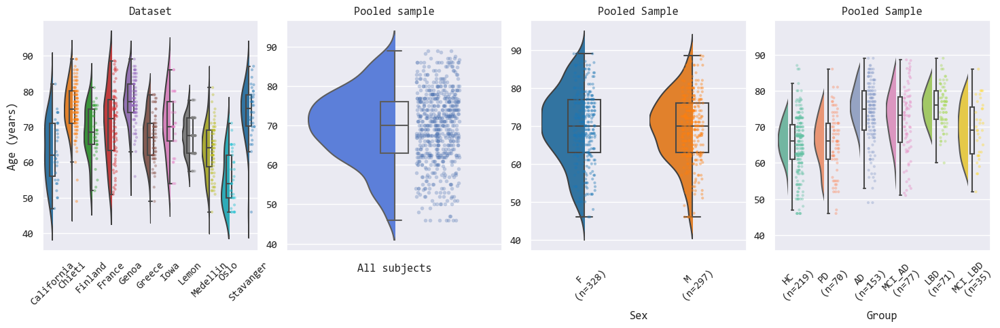

In [103]:
features_filtered = wide

import matplotlib.pyplot as plt

# Set figure and subplots
fig, axs = plt.subplots(1, 4, figsize=(18, 5))

# Third subplot: Raincloud plot for "age" with grouping by center
sns.set_style('white')
sns.set(font="Consolas")


# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')



palette = 'tab10'


# Raincloud plot for "age" with grouping by center
ax3 = sns.violinplot(x="center", y="age", data=df, hue="center", dodge=False,
                     palette=palette,
                     scale="width", inner=None, ax=axs[0])  # Move to the first position (index 0)
xlim3 = ax3.get_xlim()
ylim3 = ax3.get_ylim()

for violin in ax3.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax3.transData))

sns.boxplot(x="center", y="age", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[0])  # Move to the first position (index 0)

old_len_collections = len(ax3.collections)

sns.stripplot(x="center", y="age", data=df, hue="center", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[0])  # Move to the first position (index 0)

for dots in ax3.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[0].set_xlim(xlim3)
axs[0].set_ylim(ylim3)
axs[0].legend_.remove()
axs[0].set_title("Dataset")
axs[0].set_xlabel("")
axs[0].set_ylabel("Age (years)")
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)


axs[0].set_xticklabels([tick.get_text().capitalize() for tick in axs[0].get_xticklabels()])

# First subplot: Raincloud plot for "age" without grouping
sns.set_style('white')
sns.set(font="Consolas")
sns.set_palette("turbo")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')
# Raincloud plot for "age" without grouping
ax1 = sns.violinplot(y="age", data=df, inner=None, ax=axs[1])  # Move to the last position (index 2)

xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(y="age", data=df, saturation=1, showfliers=False,
            width=0.13, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[1])  # Move to the last position (index 2)

old_len_collections = len(ax1.collections)

sns.stripplot(y="age", data=df, dodge=False,
              alpha=0.3, size=4, ax=axs[1])  # Move to the last position (index 2)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[1].set_xlim(xlim1)
axs[1].set_ylim(ylim1)
axs[1].set_ylabel("")
axs[1].set_xlabel("All subjects")
axs[1].set_title("Pooled sample")








# Raincloud plot for "age" with grouping by center
ax4 = sns.violinplot(x="gender", y="age", data=df, hue="gender", dodge=False,
                     palette=palette,
                     scale="width", inner=None, ax=axs[2])  # Move to the first position (index 0)
xlim3 = ax4.get_xlim()
ylim3 = ax4.get_ylim()

for violin in ax4.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax4.transData))

sns.boxplot(x="gender", y="age", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[2])  # Move to the first position (index 0)

old_len_collections = len(ax3.collections)

sns.stripplot(x="gender", y="age", data=df, hue="gender", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[2])  # Move to the first position (index 0)

for dots in ax4.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[2].set_xlim(xlim3)
axs[2].set_ylim(ylim3)
axs[2].legend_.remove()
axs[2].set_title("Pooled Sample")
axs[2].set_xlabel("Sex")
axs[2].set_ylabel("")
axs[2].set_xticklabels(axs[2].get_xticklabels(), rotation=45)
axs[2].set_xticklabels([tick.get_text().capitalize() for tick in axs[2].get_xticklabels()])
sex_counts = features_filtered.groupby('gender')['participant_id'].nunique()
# Create new labels with count information
counts_sex = [f"{gender.upper()}\n (n={sex_counts.loc[gender]})" for gender in df['gender'].unique()]

# Set the new labels to the x-axis
axs[2].set_xticklabels(counts_sex, rotation=45)






# Second subplot: Raincloud plot for "age" with grouping by gender
sns.set_style('white')
sns.set(font="Consolas")
palette = 'Set2'

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Calculate the count of unique participant_id in each group
group_counts = df.groupby('group')['participant_id'].nunique()

# Raincloud plot for "age" with grouping by gender
ax2 = sns.violinplot(x="group", y="age", data=df, hue="group", dodge=False,
                     palette=palette,
                     scale="width", inner=None, ax=axs[3])  # Place in the middle position (index 1)

xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 3, height, transform=ax2.transData))

sns.boxplot(x="group", y="age", data=df, saturation=1, showfliers=False,
            width=0.12, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[3])  # Place in the middle position (index 1)

old_len_collections = len(ax2.collections)

sns.stripplot(x="group", y="age", data=df, hue="group", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[3])  # Place in the middle position (index 1)

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[3].set_xlim(xlim2)
axs[3].set_ylim(ylim2)
axs[3].set_title("Pooled Sample")
axs[3].set_xlabel("Group")
axs[3].legend_.remove()
axs[3].set_ylabel("")

group_counts = features_filtered.groupby('group')['participant_id'].nunique()
# Create new labels with count information
counts_group = [f"{group.upper()}\n (n={group_counts.loc[group]})" for group in df['group'].unique()]

# Set the new labels to the x-axis
axs[3].set_xticklabels(counts_group, rotation=45)

#axs[3].set_xticklabels([tick.get_text().upper() for tick in axs[3].get_xticklabels()], rotation=45)

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.13, bottom=0.2)
#plt.savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1a.tiff', format='tiff', dpi=300)

plt.show()


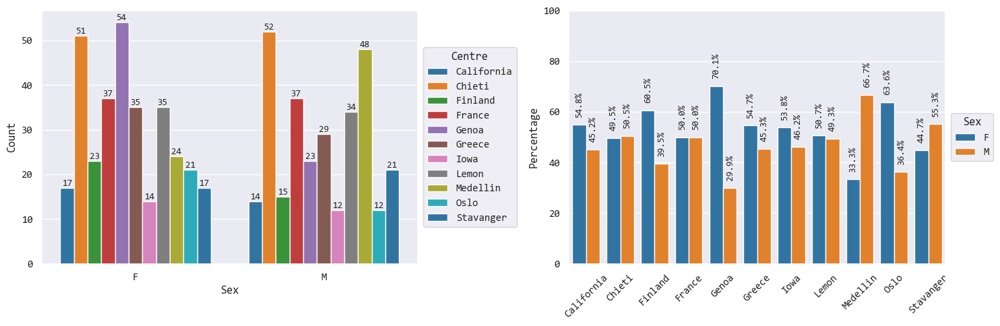

In [104]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'tab10'

# Create a 1x2 grid layout
fig = plt.figure(figsize=(15, 5))
gs = GridSpec(1, 2, figure=fig)

# First subplot
ax1 = fig.add_subplot(gs[0, 0])

sns.countplot(x="gender", hue="center", data=df, palette=palette, ax=ax1)

ax1.set_title("")
ax1.set_xlabel("Sex")
ax1.set_ylabel("Count")
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])

for p in ax1.patches:
    height = p.get_height()
    ax1.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', size=10)

# Move the legend outside
legend1 = ax1.legend(title='Centre', bbox_to_anchor=(1, 0.5), loc='center left')
# Capitalize legend items
for text in legend1.get_texts():
    text.set_text(text.get_text().capitalize())

# Second subplot
ax2 = fig.add_subplot(gs[0, 1])

counts = df.groupby(['center', 'gender']).size().reset_index(name='count')
total_counts = counts.groupby('center')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_counts * 100

sns.barplot(x='center', y='percentage', hue='gender', data=counts, palette=palette, ax=ax2)

ax2.set_title("")
ax2.set_xlabel("")
ax2.set_ylabel("Percentage")
ax2.set_ylim(0, 100)
legend2 = ax2.legend(title='Sex', bbox_to_anchor=(1, 0.5), loc='center left')
# Capitalize legend items
for text in legend2.get_texts():
    text.set_text(text.get_text().capitalize())

ax2.set_xticklabels(axs[0].get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])

for p in ax2.patches:
    height = p.get_height()
    ax2.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2, height+3),
                ha='center', va='bottom', size=10, rotation=90)

# Adjust spacing between subplots
fig.tight_layout()

# Save the combined figure
plt.show()  # Or savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1b.tiff', format='tiff', dpi=300)


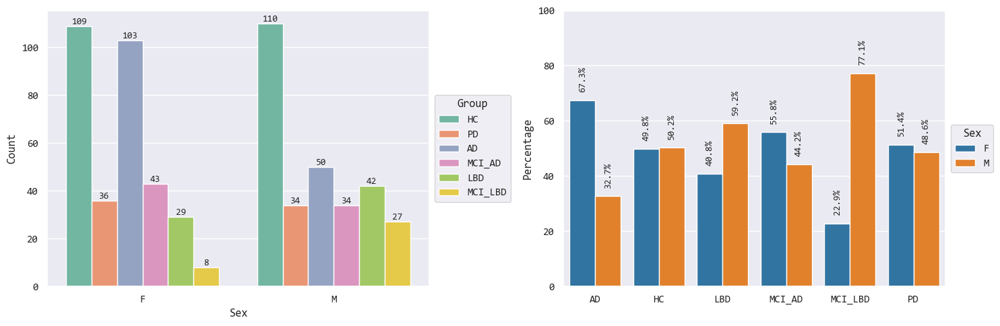

In [105]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'Set2'

# Create a 1x2 grid layout
fig = plt.figure(figsize=(15, 5))
gs = GridSpec(1, 2, figure=fig)

# First subplot
ax1 = fig.add_subplot(gs[0, 0])

sns.countplot(x="gender", hue="group", data=df, palette=palette, ax=ax1)

ax1.set_title("")
ax1.set_xlabel("Sex")
ax1.set_ylabel("Count")
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])

for p in ax1.patches:
    height = p.get_height()
    ax1.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', size=10)

# Move the legend outside
legend1 = ax1.legend(title='Group', bbox_to_anchor=(1, 0.5), loc='center left')
# Capitalize legend items
for text in legend1.get_texts():
    text.set_text(text.get_text().upper())

palette = 'tab10'
# Second subplot
ax2 = fig.add_subplot(gs[0, 1])

counts = df.groupby(['group', 'gender']).size().reset_index(name='count')
total_counts = counts.groupby('group')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_counts * 100

sns.barplot(x='group', y='percentage', hue='gender', data=counts, palette=palette, ax=ax2)

ax2.set_title("")
ax2.set_xlabel("")
ax2.set_ylabel("Percentage")
ax2.set_ylim(0, 100)
legend2 = ax2.legend(title='Sex', bbox_to_anchor=(1, 0.5), loc='center left')
# Capitalize legend items
for text in legend2.get_texts():
    text.set_text(text.get_text().upper())

ax2.set_xticklabels([tick.get_text().upper() for tick in ax2.get_xticklabels()])

for p in ax2.patches:
    height = p.get_height()
    ax2.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2, height+3),
                ha='center', va='bottom', size=10, rotation=90)

# Adjust spacing between subplots
fig.tight_layout()

# Save the combined figure
plt.show()  # Or savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1b.tiff', format='tiff', dpi=300)


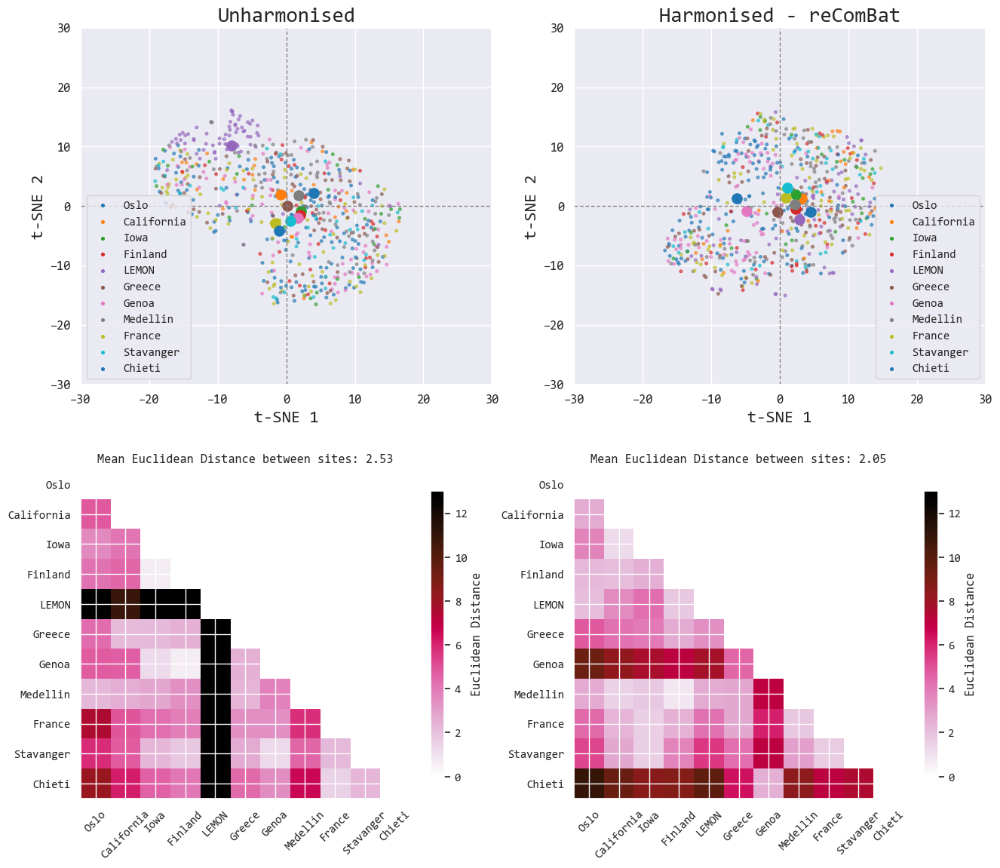

In [111]:
from sklearn.manifold import TSNE
from sklearn.metrics import euclidean_distances
import numpy as np
import cmasher as cmr
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('white')
sns.set(font="Consolas")

cmap_r = cmr.flamingo_r

# Read dataframes and get labels for each center
X_unharmonized = wide.loc[:, ~wide.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_unharmonized = wide['center'].values

X_neurocombat = all_combat_df.loc[:, ~all_combat_df.columns.isin(['participant_id', 'center', 'age', 'gender', 'group', 'split'])].values
labels_neurocombat = all_combat_df['center'].values

# Set palette and labels
group_labels = {'oslo': 'Oslo', 'california': 'California', 
                'iowa': 'Iowa', 'finland': 'Finland', 'lemon': 'LEMON', 
                'greece':'Greece', 'genoa': 'Genoa', 'medellin':'Medellin', 
                'france': 'France', 'stavanger':'Stavanger', 'chieti':'Chieti'}
palette = sns.color_palette('tab10', len(group_labels))
colors = {group: palette[i] for i, group in enumerate(group_labels)}

# Fit tSNE
tsne = TSNE(n_components=2, perplexity=50, learning_rate=200, n_iter=1000, random_state=1994, init="random")
X_tsne_unharmonized = tsne.fit_transform(X_unharmonized)
X_tsne_neurocombat = tsne.fit_transform(X_neurocombat)

# Function to plot tSNEs
def plot_tsne(X_tsne, labels, title):
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], s=7, c=[colors[label] for label in labels], alpha = 0.6)
    # Add a gray dashed line crossing the 0 in both X and Y axes
    plt.axhline(0, color='gray', linestyle='--', linewidth=1)
    plt.axvline(0, color='gray', linestyle='--', linewidth=1)
    for group in colors:
        plt.scatter([], [], s=7, c=[colors[group]], label=group_labels[group])
    
    # Plot center points for each group
    for group in group_labels:
        group_indices = np.where(labels == group)[0]
        center_point = X_tsne[group_indices, :].mean(axis=0)
        plt.scatter(center_point[0], center_point[1], s=90, c=[colors[group]], marker='o')
        
    plt.xlim(-30, 30)
    plt.ylim(-30, 30)
    plt.legend()
    plt.title(title, fontsize=20)
    plt.xlabel('t-SNE 1', fontsize=16)
    plt.ylabel('t-SNE 2', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

# Calculate the Euclidean distances between center points
center_points_unharmonized = {}
center_points_neurocombat = {}
for group in group_labels:
    group_indices_unharmonized = np.where(labels_unharmonized == group)[0]
    group_indices_neurocombat = np.where(labels_neurocombat == group)[0]
    center_points_unharmonized[group] = X_tsne_unharmonized[group_indices_unharmonized, :].mean(axis=0)
    center_points_neurocombat[group] = X_tsne_neurocombat[group_indices_neurocombat, :].mean(axis=0)

distances_unharmonized = euclidean_distances(list(center_points_unharmonized.values()))
distances_neurocombat = euclidean_distances(list(center_points_neurocombat.values()))

# Drop diagonal and keep lower triangle
distances_unharmonized = np.tril(distances_unharmonized, k=-1)
distances_neurocombat = np.tril(distances_neurocombat, k=-1)

# Plot the t-SNE plots and the distance matrices
plt.figure(figsize=(15, 13))

plt.subplot(221)
plot_tsne(X_tsne_unharmonized, labels_unharmonized, 'Unharmonised')

plt.subplot(222)
plot_tsne(X_tsne_neurocombat, labels_neurocombat, 'Harmonised - reComBat')

# Update subplot titles with mean distance between centers
plt.subplot(223)
plt.imshow(distances_unharmonized, cmap=cmap_r, vmax = 13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Euclidean Distance between sites: {:.2f}'.format(np.mean(distances_unharmonized)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=45)
plt.yticks(range(len(group_labels)), list(group_labels.values()))

plt.subplot(224)
plt.imshow(distances_neurocombat, cmap=cmap_r, vmax = 13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Euclidean Distance between sites: {:.2f}'.format(np.mean(distances_neurocombat)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=45)
plt.yticks(range(len(group_labels)), list(group_labels.values()))

# Adjust the figure's position and size to remove the blank space on top
plt.subplots_adjust(top=0.95, bottom=0.15, left=0.18, right=0.98)
#plt.savefig('D:/data_analysis/papers_alberto/final_phd/figures/center_diff.tiff', format='tiff', dpi=300)
plt.show()

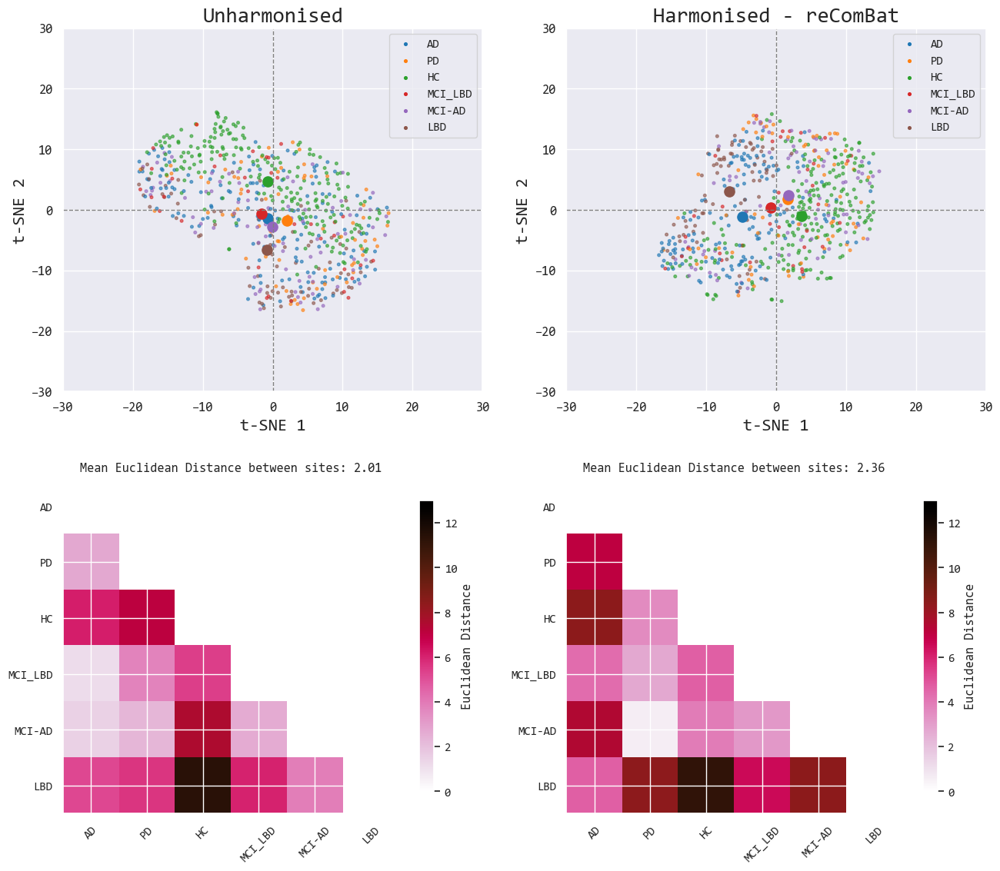

In [124]:
from sklearn.manifold import TSNE
from sklearn.metrics import euclidean_distances
import numpy as np
import cmasher as cmr
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('white')
sns.set(font="Consolas")

cmap_r = cmr.flamingo_r

# Read dataframes and get labels for each group
X_unharmonized = wide.loc[:, ~wide.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_unharmonized = wide['group'].values

X_neurocombat = all_combat_df.loc[:, ~all_combat_df.columns.isin(['participant_id', 'center', 'age', 'gender', 'group', 'split'])].values
labels_neurocombat = all_combat_df['group'].values

# Set palette and labels
group_labels = {'ad': 'AD', 'pd': 'PD', 
                'hc': 'HC', 'mci_lbd': 'MCI_LBD', 'mci_ad': 'MCI-AD', 'lbd':'LBD'}
palette = sns.color_palette('tab10', len(group_labels))
colors = {group: palette[i] for i, group in enumerate(group_labels)}

# Fit tSNE
tsne = TSNE(n_components=2, perplexity=50, learning_rate=200, n_iter=1000, random_state=1994, init="random")
X_tsne_unharmonized = tsne.fit_transform(X_unharmonized)
X_tsne_neurocombat = tsne.fit_transform(X_neurocombat)

# Function to plot tSNEs
def plot_tsne(X_tsne, labels, title):
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], s=7, c=[colors[label] for label in labels], alpha = 0.6)
    # Add a gray dashed line crossing the 0 in both X and Y axes
    plt.axhline(0, color='gray', linestyle='--', linewidth=1)
    plt.axvline(0, color='gray', linestyle='--', linewidth=1)
    for group in colors:
        plt.scatter([], [], s=7, c=[colors[group]], label=group_labels[group])
    
    # Plot group points for each group
    for group in group_labels:
        group_indices = np.where(labels == group)[0]
        group_point = X_tsne[group_indices, :].mean(axis=0)
        plt.scatter(group_point[0], group_point[1], s=90, c=[colors[group]], marker='o')
        
    plt.xlim(-30, 30)
    plt.ylim(-30, 30)
    plt.legend()
    plt.title(title, fontsize=20)
    plt.xlabel('t-SNE 1', fontsize=16)
    plt.ylabel('t-SNE 2', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

# Calculate the Euclidean distances between group points
group_points_unharmonized = {}
group_points_neurocombat = {}
for group in group_labels:
    group_indices_unharmonized = np.where(labels_unharmonized == group)[0]
    group_indices_neurocombat = np.where(labels_neurocombat == group)[0]
    group_points_unharmonized[group] = X_tsne_unharmonized[group_indices_unharmonized, :].mean(axis=0)
    group_points_neurocombat[group] = X_tsne_neurocombat[group_indices_neurocombat, :].mean(axis=0)

distances_unharmonized = euclidean_distances(list(group_points_unharmonized.values()))
distances_neurocombat = euclidean_distances(list(group_points_neurocombat.values()))

# Drop diagonal and keep lower triangle
distances_unharmonized = np.tril(distances_unharmonized, k=-1)
distances_neurocombat = np.tril(distances_neurocombat, k=-1)

# Plot the t-SNE plots and the distance matrices
plt.figure(figsize=(15, 13))

plt.subplot(221)
plot_tsne(X_tsne_unharmonized, labels_unharmonized, 'Unharmonised')

plt.subplot(222)
plot_tsne(X_tsne_neurocombat, labels_neurocombat, 'Harmonised - reComBat')

# Update subplot titles with mean distance between groups
plt.subplot(223)
plt.imshow(distances_unharmonized, cmap=cmap_r, vmax = 13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Euclidean Distance between sites: {:.2f}'.format(np.mean(distances_unharmonized)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=45)
plt.yticks(range(len(group_labels)), list(group_labels.values()))

plt.subplot(224)
plt.imshow(distances_neurocombat, cmap=cmap_r, vmax = 13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Euclidean Distance between sites: {:.2f}'.format(np.mean(distances_neurocombat)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=45)
plt.yticks(range(len(group_labels)), list(group_labels.values()))

# Adjust the figure's position and size to remove the blank space on top
plt.subplots_adjust(top=0.95, bottom=0.15, left=0.18, right=0.98)
#plt.savefig('D:/data_analysis/papers_alberto/final_phd/figures/group_diff.tiff', format='tiff', dpi=300)
plt.show()

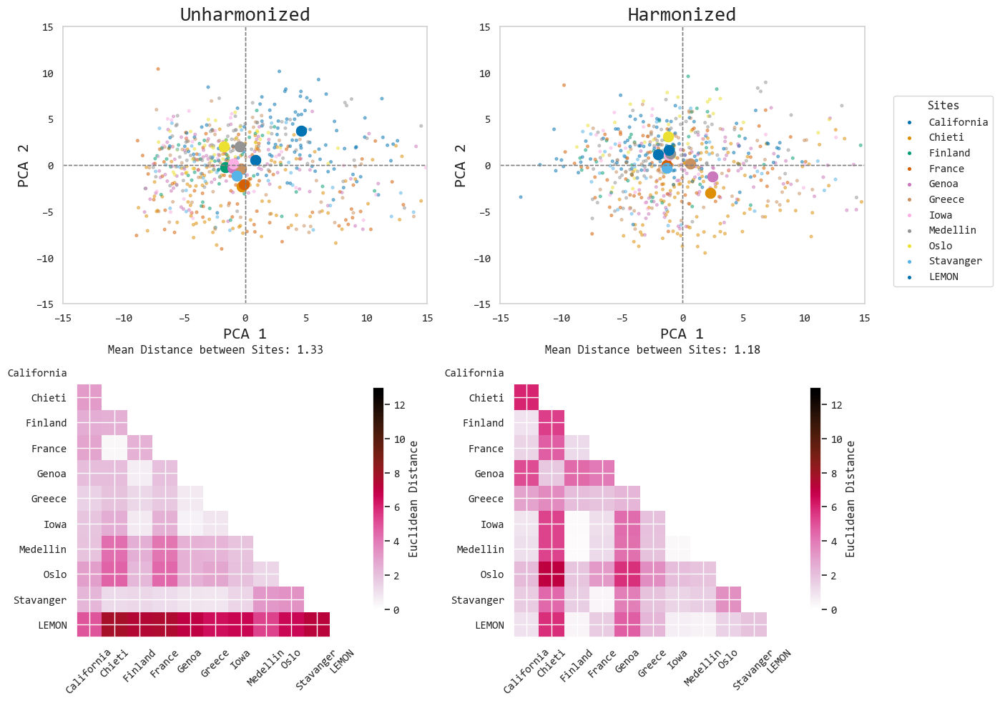

In [127]:
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
import numpy as np
import cmasher as cmr
import seaborn as sns
import matplotlib.pyplot as plt
# Set palette and labels
group_labels = {'california': 'California', 'chieti': 'Chieti', 'finland': 'Finland', 'france': 'France', 'genoa': 'Genoa', 'greece':'Greece', 'iowa': 'Iowa', 'medellin':'Medellin', 'oslo': 'Oslo', 'stavanger':'Stavanger','lemon': 'LEMON'}#'lemon': 'LEMON',

sns.set_style('white')
sns.set(font="Consolas")

cmap_r = cmr.flamingo_r

# Read dataframes and get labels for each center
X_unharmonized = wide.loc[:, ~wide.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_unharmonized = wide['center'].values

X_neurocombat = all_combat_df.loc[:, ~all_combat_df.columns.isin(['participant_id', 'center', 'age', 'gender', 'group', 'split'])].values
labels_neurocombat = all_combat_df['center'].values


palette = sns.color_palette('colorblind', len(group_labels))
colors = {group: palette[i] for i, group in enumerate(group_labels)}
from sklearn.decomposition import PCA

# Fit PCA
pca = PCA(n_components=2, random_state=42)
X_pca_unharmonized = pca.fit_transform(X_unharmonized)
X_pca_neurocombat = pca.fit_transform(X_neurocombat)

# Function to plot PCA results
def plot_pca(X_pca, labels, title, ax):
    ax.scatter(X_pca[:, 0], X_pca[:, 1], s=7, c=[colors[label] for label in labels], alpha=0.25)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.axvline(0, color='gray', linestyle='--', linewidth=1)
    
    # Set spines color
    for spine in ax.spines.values():
        spine.set_edgecolor('lightgray')
    
    for group in group_labels:
        ax.scatter([], [], s=7, c=[colors[group]], label=group_labels[group])
    
    for group in group_labels:
        group_indices = np.where(labels == group)[0]
        center_point = X_pca[group_indices, :].mean(axis=0)
        ax.scatter(center_point[0], center_point[1], s=100, c=[colors[group]], marker='o')
        
    ax.set_xlim(-15, 15)
    ax.set_ylim(-15, 15)
    ax.set_title(title, fontsize=20)
    ax.set_xlabel('PCA 1', fontsize=16)
    ax.set_ylabel('PCA 2', fontsize=16)
    ax.set_facecolor('white')
    ax.grid(False)


# Plot the PCA plots and the distance matrices
fig, axs = plt.subplots(2, 2, figsize=(11, 9))

plot_pca(X_pca_unharmonized, labels_unharmonized, 'Unharmonized', axs[0, 0])
plot_pca(X_pca_neurocombat, labels_neurocombat, 'Harmonized', axs[0, 1])

# Create a single legend for the first two subplots and place it to the right
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.05, 0.85), facecolor='white', ncol=1, title = "Sites")

# Calculate the Euclidean distances between center points for PCA
center_points_pca_unharmonized = {}
center_points_pca_neurocombat = {}
for group in group_labels:
    group_indices_unharmonized = np.where(labels_unharmonized == group)[0]
    group_indices_neurocombat = np.where(labels_neurocombat == group)[0]
    center_points_pca_unharmonized[group] = X_pca_unharmonized[group_indices_unharmonized, :].mean(axis=0)
    center_points_pca_neurocombat[group] = X_pca_neurocombat[group_indices_neurocombat, :].mean(axis=0)

distances_pca_unharmonized = euclidean_distances(list(center_points_pca_unharmonized.values()))
distances_pca_neurocombat = euclidean_distances(list(center_points_pca_neurocombat.values()))

distances_pca_unharmonized = np.tril(distances_pca_unharmonized, k=-1)
distances_pca_neurocombat = np.tril(distances_pca_neurocombat, k=-1)



ax1 = plt.subplot(221)
plot_pca(X_pca_unharmonized, labels_unharmonized, 'Unharmonized', ax1)

ax2 = plt.subplot(222)
plot_pca(X_pca_neurocombat, labels_neurocombat, 'Harmonized', ax2)

plt.subplot(223)
plt.imshow(distances_pca_unharmonized, cmap=cmap_r, vmax=13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Distance between Sites: {:.2f}'.format(np.mean(distances_pca_unharmonized)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=45)
plt.yticks(range(len(group_labels)), list(group_labels.values()))

plt.subplot(224)
plt.imshow(distances_pca_neurocombat, cmap=cmap_r, vmax=13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Distance between Sites: {:.2f}'.format(np.mean(distances_pca_neurocombat)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=45)
plt.yticks(range(len(group_labels)), list(group_labels.values()))


plt.subplots_adjust(top=0.95, bottom=0.0001, left = 0.001, right=1.02)
plt.show()

plt.show();


In [128]:
import autogluon.eda.auto as auto

target_col='group'
auto.covariate_shift_detection(train_data=X_train_harmonized, test_data=X_test_harmonized, label=target_col)

We did not detect a substantial difference between the training and test X distributions.

**`train_data` dataset summary**

,count,unique,top,freq,mean,std,min,25%,50%,75%,max,dtypes,missing_count,missing_ratio,raw_type,variable_type,special_types
age,437,94,,,69.357666,9.175949,46.0,63.0,70.0,76.0,89.0,float64,,,float,numeric,
approximate_anterior,437,436,,,1.098609,0.108304,0.775222,1.023007,1.111371,1.170303,1.346594,float64,,,float,numeric,
approximate_central,437,437,,,1.108278,0.099346,0.777082,1.048359,1.121457,1.185405,1.301963,float64,,,float,numeric,
approximate_posterior,437,437,,,1.043491,0.117338,0.776819,0.955437,1.052495,1.13844,1.303988,float64,,,float,numeric,
beta_bw_anterior,437,436,,,3.761553,1.371351,0.662923,2.786041,3.488563,4.709303,8.38573,float64,,,float,numeric,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wpli_delta_median,437,437,,,0.310693,0.053349,0.207019,0.270261,0.30145,0.340847,0.499488,float64,,,float,numeric,
wpli_global_iqr,437,437,,,0.071614,0.018297,0.028953,0.058527,0.069138,0.081615,0.14713,float64,,,float,numeric,
wpli_global_median,437,437,,,0.32032,0.031914,0.249802,0.29922,0.318711,0.339188,0.430028,float64,,,float,numeric,
wpli_theta_iqr,437,437,,,0.162667,0.059891,0.056904,0.121302,0.151805,0.189901,0.402003,float64,,,float,numeric,


**`test_data` dataset summary**

,count,unique,top,freq,mean,std,min,25%,50%,75%,max,dtypes,missing_count,missing_ratio,raw_type,variable_type,special_types
age,188,60,,,70.148936,9.430588,46.0,63.925,71.0,77.0,89.0,float64,,,float,numeric,
approximate_anterior,188,188,,,1.098026,0.114546,0.787035,1.024139,1.116355,1.183116,1.302652,float64,,,float,numeric,
approximate_central,188,188,,,1.110637,0.110556,0.729286,1.049025,1.116627,1.195786,1.338634,float64,,,float,numeric,
approximate_posterior,188,188,,,1.046774,0.136082,0.714318,0.95937,1.053428,1.147663,1.31383,float64,,,float,numeric,
beta_bw_anterior,188,188,,,3.844838,1.510272,0.733159,2.735206,3.571749,4.809018,9.120888,float64,,,float,numeric,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wpli_delta_median,188,188,,,0.306629,0.050978,0.204497,0.273263,0.298247,0.334148,0.519314,float64,,,float,numeric,
wpli_global_iqr,188,188,,,0.072563,0.022938,0.032079,0.056914,0.067299,0.081942,0.167281,float64,,,float,numeric,
wpli_global_median,188,188,,,0.31848,0.034198,0.241097,0.294642,0.313521,0.337998,0.473669,float64,,,float,numeric,
wpli_theta_iqr,188,188,,,0.160521,0.056586,0.056174,0.117144,0.149758,0.189355,0.327451,float64,,,float,numeric,


### Feature Distance

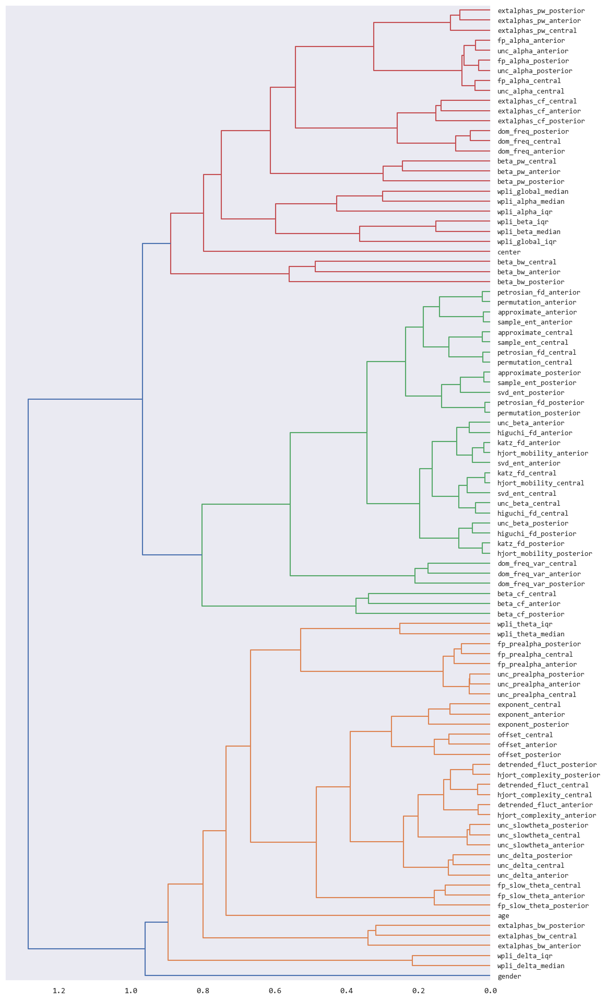

In [129]:
import autogluon.eda.auto as auto

auto.dataset_overview(train_data=X_train_harmonized, test_data=X_test_harmonized, label=target_col)

# HARM - MULTIFEAT - ONLY OLDER

In [6]:
import pandas as pd
# Specify the path to the CSV file
csv_path = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/edlb_all_features_unharm_wide.csv'

# Read the CSV file into a DataFrame
wide = pd.read_csv(csv_path)


# List of groups to exclude
excluded_values = ['sci', 'ftd']  # 5 subjects with Subjective cognitive impairment & FTD group

# Filter the dataset to exclude rows where 'group' is in the excluded values list
wide = wide[(~wide['group'].isin(excluded_values)) & (wide["age"] >= 46)].reset_index(drop=True)

# posterior_roi = ["P3", "P4", "P7", "P8", "Pz", "PO3", "PO4", "Oz", "O1", "O2"]

# # Filter the dataset to exclude rows where 'group' is in the excluded values list
# wide = wide[(wide['channel'].isin(posterior_roi))].reset_index(drop=True)


# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
wide['group'] = wide['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})

wide['group'] = wide['group'].replace({'dlb': 'lbd', 'pdd': 'lbd'})
wide.shape




(625, 109)

In [2]:

# List of groups to exclude
excluded_values = ['iowa', 'california', 'lemon', 'oslo']  # 5 subjects with Subjective cognitive impairment & FTD group

# Filter the dataset to exclude rows where 'group' is in the excluded values list
wide_short = wide[(wide['center'].isin(excluded_values))].reset_index(drop=True)
wide_short.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/short_automl_example.csv', index=False)

In [4]:
X_train

,participant_id,group,age,gender,center,permutation_anterior,permutation_central,permutation_posterior,sample_ent_anterior,sample_ent_central,...,imcoh_delta_median,imcoh_delta_iqr,imcoh_theta_median,imcoh_theta_iqr,imcoh_alpha_median,imcoh_alpha_iqr,imcoh_beta_median,imcoh_beta_iqr,imcoh_global_median,imcoh_global_iqr
0,c_hc1,hc,54.0,f,california,0.892644,0.883550,0.868972,1.551208,1.496210,...,0.259082,0.099464,0.242911,0.118781,0.346242,0.138830,0.293477,0.074443,0.292087,0.061083
1,c_hc10,hc,59.0,f,california,0.877798,0.870240,0.860544,1.473879,1.412852,...,0.262099,0.124326,0.280826,0.138664,0.398039,0.214764,0.384130,0.151124,0.359636,0.118167
5,c_hc21,hc,72.0,m,california,0.856663,0.867882,0.841621,1.290546,1.401691,...,0.247385,0.093947,0.281644,0.127085,0.459189,0.255670,0.312101,0.110396,0.328024,0.091103
7,c_hc25,hc,74.0,f,california,0.914513,0.899587,0.889082,1.635630,1.585295,...,0.245826,0.105089,0.304748,0.179528,0.273169,0.123336,0.309737,0.100121,0.296029,0.069417
8,c_hc29,hc,60.0,f,california,0.863193,0.845586,0.803753,1.398147,1.280216,...,0.233686,0.115769,0.264090,0.106480,0.443722,0.228614,0.257907,0.062938,0.289139,0.046635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,o_096,hc,54.0,m,oslo,0.869322,0.866753,0.848087,1.344826,1.393169,...,0.266059,0.104559,0.250859,0.103348,0.404157,0.222424,0.304596,0.087757,0.310666,0.080457
154,o_099,hc,58.0,m,oslo,0.831432,0.854709,0.821907,1.201120,1.317405,...,0.267428,0.116199,0.327141,0.126241,0.488206,0.139494,0.283393,0.077764,0.322354,0.064347
156,o_104,hc,46.0,m,oslo,0.846713,0.850041,0.834145,1.075473,1.270556,...,0.283113,0.087637,0.363763,0.231947,0.395926,0.216549,0.278897,0.056770,0.312055,0.079349
157,o_108,hc,50.0,f,oslo,0.859418,0.855040,0.863859,1.316553,1.307637,...,0.257407,0.126538,0.253615,0.115041,0.502917,0.149427,0.304206,0.088565,0.325577,0.082878


In [17]:
X_train

,participant_id,group,age,gender,center,permutation_anterior,permutation_central,permutation_posterior,sample_ent_anterior,sample_ent_central,...,imcoh_delta_iqr,imcoh_theta_median,imcoh_theta_iqr,imcoh_alpha_median,imcoh_alpha_iqr,imcoh_beta_median,imcoh_beta_iqr,imcoh_global_median,imcoh_global_iqr,Fold
1,c_hc10,hc,59.0,f,california,0.877798,0.870240,0.860544,1.473879,1.412852,...,0.124326,0.280826,0.138664,0.398039,0.214764,0.384130,0.151124,0.359636,0.118167,3.0
2,c_hc18,hc,57.0,m,california,0.854015,0.849011,0.837641,1.283902,1.247317,...,0.115318,0.224679,0.078641,0.389869,0.138961,0.292143,0.080795,0.296093,0.062204,3.0
3,c_hc2,hc,50.0,f,california,0.876912,0.867798,0.857781,1.439695,1.384215,...,0.142818,0.291159,0.130867,0.300742,0.152292,0.310655,0.116546,0.302726,0.073826,3.0
4,c_hc20,hc,68.0,m,california,0.892162,0.886515,0.881735,1.468234,1.439295,...,0.107055,0.330886,0.215555,0.282009,0.128230,0.249500,0.060956,0.266743,0.052986,3.0
6,c_hc24,hc,61.0,f,california,0.866996,0.858546,0.859601,1.405332,1.361695,...,0.131407,0.336288,0.138188,0.446160,0.155322,0.244018,0.063008,0.289814,0.052277,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,sta_D20167,mci_ad,74.0,m,stavanger,0.809376,0.803629,0.742180,1.094422,1.069585,...,0.121784,0.398114,0.190165,0.475859,0.266562,0.252530,0.058678,0.311927,0.072138,3.0
621,sta_D20168,mci_ad,70.0,f,stavanger,0.859698,0.845801,0.848768,1.331566,1.261482,...,0.091160,0.254678,0.102754,0.286676,0.116694,0.260352,0.057317,0.261630,0.041688,3.0
622,sta_D20169,mci_ad,72.0,m,stavanger,0.833413,0.840435,0.816175,1.185775,1.229973,...,0.137930,0.356801,0.125144,0.551164,0.206921,0.290960,0.065658,0.345337,0.077970,3.0
623,sta_D20170,mci_ad,76.0,f,stavanger,0.827356,0.821391,0.816518,1.128131,1.154807,...,0.341285,0.274224,0.123169,0.489611,0.183351,0.266593,0.059968,0.338255,0.060814,3.0


In [ ]:
from sklearn.model_selection import StratifiedKFold
from reComBat import reComBat
import pandas as pd

# Assuming 'df' and 'wide' are defined and have the same structure
df = wide

# Setup the Stratified K-Fold
n_splits = 5

# Initialize the MinMaxScaler
scaler = StratifiedKFold(n_splits=n_splits, random_state=1997, shuffle=True)

# Prepare a new DataFrame to store scaled data
scaled_df = df.copy()

# Process each fold
for fold in range(5):
    # Split into training and validation based on the fold
    train_df = scaled_df[scaled_df['Fold'] != fold]
    val_df = scaled_df[scaled_df['Fold'] == fold]

    # Fit and transform the scaler on the training data
    scaler.fit(train_df[['Feature1', 'Feature2']])
    train_df[['Feature1', 'Feature2']] = scaler.transform(train_df[['Feature1', 'Feature2']])

    # Transform the validation data using the fitted scaler
    val_df[['Feature1', 'Feature2']] = scaler.transform(val_df[['Feature1', 'Feature2']])

    # Update the scaled DataFrame
    scaled_df.loc[scaled_df['Fold'] != fold, ['Feature1', 'Feature2']] = train_df[['Feature1', 'Feature2']]
    scaled_df.loc[scaled_df['Fold'] == fold, ['Feature1', 'Feature2']] = val_df[['Feature1', 'Feature2']]

scaled_df.head()

In [13]:
from sklearn.model_selection import StratifiedKFold
from reComBat import reComBat
import pandas as pd

# Assuming 'df' and 'wide' are defined and have the same structure
df = wide

# Setup the Stratified K-Fold
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, random_state=1997, shuffle=True)

# Placeholder DataFrame to collect all the transformed data
all_combat_df = pd.DataFrame(index=df.index)  # Same index as the original data

# Iterate over each fold
for fold_number, (train_index, test_index) in enumerate(skf.split(df, df['group'])):
    X_train, X_test = df.iloc[train_index], df.iloc[test_index]

    # Prepare covariates and model
    covars_train = X_train.iloc[:, 1:5].copy()
    covars_train.rename(columns={'age': 'age_numerical'}, inplace=True)
    covars_train.center = covars_train.center.astype(str)
    covars_train.group = covars_train.group.astype(str)
    covars_train.gender = covars_train.gender.astype(str)

    # Prepare covariates for test data
    covars_test = X_test.iloc[:, 1:5].copy()
    covars_test.rename(columns={'age': 'age_numerical'}, inplace=True)
    covars_test.center = covars_test.center.astype(str)
    covars_test.group = covars_test.group.astype(str)
    covars_test.gender = covars_test.gender.astype(str)

    model = reComBat(parametric=True, model='elastic_net', config={'alpha': 1e-5}, n_jobs=7, verbose=True)
    model.fit(data=X_train.iloc[:,5:], batches=covars_train.center, X=covars_train.drop(['center'], axis=1))

    # Transform both training and test data
    transformed_train_data = model.transform(data=X_train.iloc[:,5:], batches=covars_train.center, X=covars_train.drop(['center'], axis=1))
    transformed_test_data = model.transform(data=X_test.iloc[:,5:], batches=covars_test.center, X=covars_test.drop(['center'], axis=1))

    # Collect transformed data
    all_combat_df.loc[train_index, :] = transformed_train_data
    all_combat_df.loc[test_index, :] = transformed_test_data

    # Optionally, mark the fold number
    df.loc[train_index, 'Fold'] = fold_number
    df.loc[test_index, 'Fold'] = fold_number

# Reset index of the final DataFrame if necessary
all_combat_df.reset_index(drop=True, inplace=True)


[reComBat] 2024-04-24 15:25:20,304 Starting to fot reComBat.
[reComBat] 2024-04-24 15:25:20,307 Fit the linear model.
[reComBat] 2024-04-24 15:25:20,601 Starting the empirical parametric optimisation.
[reComBat] 2024-04-24 15:25:20,606 Optimisation finished.
[reComBat] 2024-04-24 15:25:20,608 reComBat is fitted.
[reComBat] 2024-04-24 15:25:20,611 Starting to transform.
[reComBat] 2024-04-24 15:25:20,617 Transform finished.
[reComBat] 2024-04-24 15:25:20,620 Starting to transform.
[reComBat] 2024-04-24 15:25:20,627 Transform finished.
[reComBat] 2024-04-24 15:25:20,639 Starting to fot reComBat.
[reComBat] 2024-04-24 15:25:20,642 Fit the linear model.
C:\Users\data_analysis\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model

In [14]:
all_combat_df.shape

(625, 0)

In [20]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from reComBat import reComBat
from autogluon.tabular import TabularPredictor

# Assuming 'wide_short' is already loaded as df
df = wide  # Make sure df is defined as your dataset

# Initialize Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define reComBat model
model = reComBat(parametric=True,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

# Initialize DataFrame to store transformed data
transformed_data = pd.DataFrame()

# Process each fold
for fold, (train_index, test_index) in enumerate(skf.split(df, df['group'])):
    X_train, X_test = df.iloc[train_index], df.iloc[test_index]
    
    # Define adjustment covariates from X_train
    covars_train = X_train.iloc[:, 1:5].copy()
    covars_train.rename(columns={'age': 'age_numerical'}, inplace=True)
    covars_train.center = covars_train.center.astype(str)
    covars_train.group = covars_train.group.astype(str)
    covars_train.gender = covars_train.gender.astype(str)
    
    # Fitting the re-scaling model on the train data
    model.fit(data=X_train.iloc[:, 5:], batches=covars_train.center, X=covars_train.drop(['center'], axis=1))
    
    # Re-scaling the train and test data
    transformed_train_data = model.transform(data=X_train.iloc[:, 5:], batches=covars_train.center, X=covars_train.drop(['center'], axis=1))
    X_train_harmonized = X_train.iloc[:, :5].join(transformed_train_data)
    
    # Define adjustment covariates from X_test
    covars_test = X_test.iloc[:, 1:5].copy()
    covars_test.rename(columns={'age': 'age_numerical'}, inplace=True)
    covars_test.center = covars_test.center.astype(str)
    covars_test.group = covars_test.group.astype(str)
    covars_test.gender = covars_test.gender.astype(str)
    
    # Re-scaling the test data
    transformed_test_data = model.transform(data=X_test.iloc[:, 5:], batches=covars_test.center, X=covars_test.drop(['center'], axis=1))
    X_test_harmonized = X_test.iloc[:, :5].join(transformed_test_data)
    
    # Optionally collect the results in a new DataFrame (or store them for modeling)
    transformed_data = pd.concat([transformed_data, X_train_harmonized, X_test_harmonized])

# Continue with further modeling or analysis with `transformed_data`
transformed_data.shape

[reComBat] 2024-04-24 15:49:38,448 Starting to fot reComBat.
[reComBat] 2024-04-24 15:49:38,453 Fit the linear model.
[reComBat] 2024-04-24 15:49:38,692 Starting the empirical parametric optimisation.
[reComBat] 2024-04-24 15:49:38,698 Optimisation finished.
[reComBat] 2024-04-24 15:49:38,699 reComBat is fitted.
[reComBat] 2024-04-24 15:49:38,701 Starting to transform.
[reComBat] 2024-04-24 15:49:38,707 Transform finished.
[reComBat] 2024-04-24 15:49:38,711 Starting to transform.
[reComBat] 2024-04-24 15:49:38,716 Transform finished.
[reComBat] 2024-04-24 15:49:38,720 Starting to fot reComBat.
[reComBat] 2024-04-24 15:49:38,723 Fit the linear model.
[reComBat] 2024-04-24 15:49:38,971 Starting the empirical parametric optimisation.
[reComBat] 2024-04-24 15:49:38,976 Optimisation finished.
[reComBat] 2024-04-24 15:49:38,976 reComBat is fitted.
[reComBat] 2024-04-24 15:49:38,978 Starting to transform.
[reComBat] 2024-04-24 15:49:38,983 Transform finished.
[reComBat] 2024-04-24 15:49:38,98

(3125, 110)

In [22]:
from sklearn.model_selection import StratifiedKFold
from reComBat import reComBat

# Assuming 'wide_short' is your DataFrame and already loaded as df
# Initialize Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define reComBat model
model = reComBat(parametric=True,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

# Prepare a new DataFrame to store harmonized data
harmonized_df = wide.copy()

# Process each fold
for fold, (train_index, test_index) in enumerate(skf.split(df, df['group'])):
    X_train, X_test = df.iloc[train_index], df.iloc[test_index]
    
    # Define adjustment covariates for reComBat from X_train
    covars_train = X_train.iloc[:, 1:5].copy()  # Adjust column indexes as needed
    covars_train.rename(columns={'age': 'age_numerical'}, inplace=True)
    covars_train.center = covars_train.center.astype(str)
    covars_train.group = covars_train.group.astype(str)
    covars_train.gender = covars_train.gender.astype(str)
    
    # Fit reComBat on the training data
    model.fit(data=X_train.iloc[:, 5:], batches=covars_train.center, X=covars_train.drop(['center'], axis=1))
    
    # Transform training data
    transformed_train_data = model.transform(data=X_train.iloc[:, 5:], batches=covars_train.center, X=covars_train.drop(['center'], axis=1))
    X_train_harmonized = X_train.iloc[:, :5].join(transformed_train_data)

    # Transform test data
    transformed_test_data = model.transform(data=X_test.iloc[:, 5:], batches=covars_train.center, X=covars_train.drop(['center'], axis=1))
    X_test_harmonized = X_test.iloc[:, :5].join(transformed_test_data)

    # Update the harmonized DataFrame
    harmonized_df.loc[train_index, :] = X_train_harmonized
    harmonized_df.loc[test_index, :] = X_test_harmonized

# harmonized_df now contains the data harmonized across all folds


[reComBat] 2024-04-24 15:59:58,104 Starting to fot reComBat.
[reComBat] 2024-04-24 15:59:58,107 Fit the linear model.
[reComBat] 2024-04-24 15:59:58,430 Starting the empirical parametric optimisation.
[reComBat] 2024-04-24 15:59:58,435 Optimisation finished.
[reComBat] 2024-04-24 15:59:58,435 reComBat is fitted.
[reComBat] 2024-04-24 15:59:58,437 Starting to transform.
[reComBat] 2024-04-24 15:59:58,441 Transform finished.
[reComBat] 2024-04-24 15:59:58,444 Starting to transform.


ValueError: operands could not be broadcast together with shapes (125,105) (500,105) 

In [23]:
#pip install recombat 
from sklearn.model_selection import train_test_split
from reComBat import reComBat
from autogluon.tabular import TabularPredictor

df = wide_short

#Splitting train and test sets
X_train, X_test, y_train, y_test = train_test_split(df.iloc[:, :], df["group"], test_size=0.3, random_state=1997, stratify=df["group"])

#Define my re-scaling model (reComBat) to be used before TabularPredictor.fit()
model = reComBat(parametric=True,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

#Defining adjustment covariates from X_train to perform my desired re-scaling
covars = X_train.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)


#Fitting the re-scaling (reComBat) model on the train data
model.fit(data=X_train.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

#Re-scaling the train data using the fitted model
transformed_train_data = model.transform(data=X_train.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

#Defining adjustment covariates from X_test to perform my desired re-scaling
covars = X_test.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)


#Re-scaling the test data using the fitted model
transformed_test_data = model.transform(data=X_test.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

X_train_harmonized = X_train.iloc[:, :5].join(transformed_train_data.iloc[:, :])
X_test_harmonized = X_test.iloc[:, :5].join(transformed_test_data.iloc[:, :])




[reComBat] 2024-04-24 16:00:29,051 Starting to fot reComBat.
[reComBat] 2024-04-24 16:00:29,053 Fit the linear model.
[reComBat] 2024-04-24 16:00:29,103 Starting the empirical parametric optimisation.
[reComBat] 2024-04-24 16:00:29,106 Optimisation finished.
[reComBat] 2024-04-24 16:00:29,107 reComBat is fitted.
[reComBat] 2024-04-24 16:00:29,110 Starting to transform.
[reComBat] 2024-04-24 16:00:29,115 Transform finished.
[reComBat] 2024-04-24 16:00:29,120 Starting to transform.
[reComBat] 2024-04-24 16:00:29,125 Transform finished.


In [2]:
# Use groupby, min, and max to calculate min and max for age in each group
group_stats = wide.groupby('group')['age'].agg(['min', 'max'])

# Rename the columns for clarity
group_stats.columns = ['min_age', 'max_age']

# Print or display the results
print(group_stats)


           min_age    max_age
group                        
ad       49.000000  89.000000
hc       46.000000  87.000000
lbd      60.000000  89.000000
mci_ad   50.986301  88.558904
mci_lbd  52.000000  86.000000
pd       46.000000  86.000000


In [14]:
np.unique(lemon['center'])

array(['lemon'], dtype=object)

In [12]:
from sklearn.model_selection import train_test_split
from reComBat import reComBat


new_site = ["lemon"]

# # Filter the dataset to exclude rows where 'group' is in the excluded values list
lemon = wide[(wide['center'].isin(new_site))].reset_index(drop=True)
# # Filter the dataset to exclude rows where 'group' is in the excluded values list
not_lemon = wide[~(wide['center'].isin(new_site))].reset_index(drop=True)




model = reComBat(parametric=True,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

# Creating a subset of X_train and renaming the column
covars = not_lemon.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)


# Fitting the reComBat model on the train data
model.fit(data=not_lemon.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Transforming the train data using the fitted model
transformed_train_data = model.transform(data=not_lemon.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
X_train_harmonized = pd.concat([not_lemon.iloc[:,:5], transformed_train_data], axis=1)
train_combat = X_train_harmonized.copy()
train_combat['split'] = 'train'

# Creating a subset of X_train and renaming the column
covars = lemon.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)

# Transforming the test data using the fitted model
transformed_test_data = model.transform(data=lemon.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
X_test_harmonized = pd.concat([lemon.iloc[:,:5], transformed_test_data], axis=1)
test_combat = X_test_harmonized.copy()
test_combat['split'] = 'test'


all_combat_df = pd.concat([train_combat, test_combat], axis=0)
all_combat_df

ValueError: Wrong number of batches.

In [3]:
from sklearn.model_selection import train_test_split
from reComBat import reComBat

df = wide.copy()
df['age'] = df['age'].round(1)

# Splitting the data into train and test datasets
X_train, X_test, y_train, y_test = train_test_split(df.iloc[:, :], df["group"], test_size=0.3, random_state=1997, stratify=df["group"])

model = reComBat(parametric=True,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

# Creating a subset of X_train and renaming the column
covars = X_train.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)


# Fitting the reComBat model on the train data
model.fit(data=X_train.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Transforming the train data using the fitted model
transformed_train_data = model.transform(data=X_train.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
X_train_harmonized = pd.concat([X_train.iloc[:,:5], transformed_train_data], axis=1)
train_combat = X_train_harmonized.copy()
train_combat['split'] = 'train'

# Creating a subset of X_train and renaming the column
covars = X_test.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)

# Transforming the test data using the fitted model
transformed_test_data = model.transform(data=X_test.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
X_test_harmonized = pd.concat([X_test.iloc[:,:5], transformed_test_data], axis=1)
test_combat = X_test_harmonized.copy()
test_combat['split'] = 'test'


all_combat_df = pd.concat([train_combat, test_combat], axis=0)
all_combat_df

[reComBat] 2024-03-20 01:17:47,019 Starting to fot reComBat.
[reComBat] 2024-03-20 01:17:47,021 Fit the linear model.
[reComBat] 2024-03-20 01:17:47,251 Starting the empirical parametric optimisation.
[reComBat] 2024-03-20 01:17:47,257 Optimisation finished.
[reComBat] 2024-03-20 01:17:47,259 reComBat is fitted.
[reComBat] 2024-03-20 01:17:47,262 Starting to transform.
[reComBat] 2024-03-20 01:17:47,270 Transform finished.
[reComBat] 2024-03-20 01:17:47,276 Starting to transform.
[reComBat] 2024-03-20 01:17:47,282 Transform finished.


,participant_id,group,age,gender,center,permutation_anterior,permutation_central,permutation_posterior,sample_ent_anterior,sample_ent_central,...,imcoh_delta_iqr,imcoh_theta_median,imcoh_theta_iqr,imcoh_alpha_median,imcoh_alpha_iqr,imcoh_beta_median,imcoh_beta_iqr,imcoh_global_median,imcoh_global_iqr,split
505,m_024,hc,62.0,m,medellin,0.852653,0.852891,0.841145,1.308834,1.305363,...,0.226025,0.275341,0.106079,0.380684,0.143710,0.357695,0.181781,0.348217,0.118303,train
381,gre_060,hc,71.0,f,greece,0.878452,0.875560,0.876085,1.363936,1.403216,...,0.134654,0.362248,0.153375,0.287512,0.123612,0.287129,0.072444,0.299050,0.066551,train
366,gre_045,hc,70.0,f,greece,0.856282,0.854531,0.849872,1.198506,1.265575,...,0.154681,0.306546,0.146860,0.298352,0.160771,0.258585,0.068095,0.273645,0.049828,train
71,chi_043,lbd,74.0,m,chieti,0.852474,0.848107,0.838423,1.197626,1.240572,...,0.210594,0.378758,0.147009,0.322967,0.111381,0.317999,0.092885,0.328819,0.067675,train
38,chi_009,ad,83.0,f,chieti,0.868997,0.874619,0.882817,0.953046,1.008839,...,0.151848,0.297247,0.178551,0.484617,0.217627,0.265223,0.057138,0.322432,0.050703,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,c_pd13,pd,62.0,m,california,0.835156,0.853653,0.828227,1.144642,1.263772,...,0.210322,0.470804,0.145885,0.406741,0.170366,0.269185,0.076853,0.311373,0.066664,test
576,o_091,hc,51.0,f,oslo,0.883148,0.892535,0.880482,1.537038,1.573181,...,0.178095,0.243598,0.093030,0.269349,0.101668,0.378469,0.165839,0.346291,0.092978,test
203,fra_MA57,mci_ad,86.2,f,france,0.814407,0.796102,0.803977,1.024867,0.974166,...,0.243020,0.355482,0.127994,0.311907,0.115325,0.277171,0.055464,0.304754,0.055505,test
405,i_020,pd,70.0,m,iowa,0.864586,0.838289,0.821895,1.361480,1.225596,...,0.116988,0.396856,0.291930,0.453676,0.228279,0.326056,0.117298,0.354899,0.107736,test


In [4]:
from autogluon.tabular import TabularPredictor

# X_train_harmonized = X_train.iloc[:, :5].join(X_train_selected.iloc[:, :])
# X_test_harmonized = X_test.iloc[:, :5].join(X_test_selected.iloc[:, :])

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = X_train_harmonized.drop(columns=columns_to_drop)
time = 3600 * 4

save_path = 'D:/data_analysis/papers_alberto/edlb_automl/results/harmonized_all_feat'  # specifies folder to store trained models
predictor = TabularPredictor(label=label, path=save_path, eval_metric='balanced_accuracy',
                             sample_weight='auto_weight').fit(train, presets='best_quality', auto_stack=True, time_limit=time)  

Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Dynamic stacking is enabled (dynamic_stacking=True). AutoGluon will try to determine whether the input data is affected by stacked overfitting and enable or disable stacking as a consequence.
Detecting stacked overfitting by sub-fitting AutoGluon on the input data. That is, copies of AutoGluon will be sub-fit on subset(s) of the data. Then, the holdout validation data is used to detect stacked overfitting.
Sub-fit(s) time limit is: 14400 seconds.
Starting holdout-based sub-fit for dynamic stacking. Context path is: D:/data_analysis/papers_alberto/edlb_automl/results/harmonized_all_feat/ds_sub_fit/sub_fit_ho.
Beginning AutoGluon training ... Time limit = 3600s
AutoGluon will save models to "D:/data_analysis/papers_alberto/edlb_automl/results/harmonized_all_feat/ds_sub_fit/sub_fit_ho"
=================== System Info ===================
AutoGluon Version:  1.0.0
P

Load pretrained model below

In [ ]:
from autogluon.tabular import TabularPredictor

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = X_train_harmonized.drop(columns=columns_to_drop)

save_path = 'D:/data_analysis/papers_alberto/edlb_automl/results/harmonized_all_feat'  # specifies folder to open pretrained trained models
predictor = TabularPredictor.load(path=save_path)  

Continue with predictions

In [5]:
test_data = X_test_harmonized.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]))
predictor.evaluate(test_data)

{'balanced_accuracy': 0.5218489240228371,
 'accuracy': 0.675531914893617,
 'mcc': 0.571397504151916}

## EXPLAIN

In [6]:
predictor.fit_summary(show_plot=True)

*** Summary of fit() ***
Estimated performance of each model:
                          model  score_val        eval_metric  pred_time_val     fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0           WeightedEnsemble_L3   0.702800  balanced_accuracy       5.114562  7056.670996                0.001000           1.104994            3       True         76
1     NeuralNetTorch_r79_BAG_L2   0.694686  balanced_accuracy       4.764535  6950.287827                1.205994           9.349460            2       True         63
2            XGBoost_r33_BAG_L2   0.687566  balanced_accuracy       3.617422  7018.776272                0.058881          77.837905            2       True         69
3     NeuralNetTorch_r22_BAG_L2   0.676188  balanced_accuracy       4.928493  6948.576809                1.369952           7.638442            2       True         68
4                XGBoost_BAG_L2   0.664406  balanced_accuracy       3.626543  6963.589217         

{'model_types': {'KNeighborsUnif_BAG_L1': 'StackerEnsembleModel_KNN',
  'KNeighborsDist_BAG_L1': 'StackerEnsembleModel_KNN',
  'NeuralNetFastAI_BAG_L1': 'StackerEnsembleModel_NNFastAiTabular',
  'LightGBMXT_BAG_L1': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1': 'StackerEnsembleModel_LGB',
  'RandomForestGini_BAG_L1': 'StackerEnsembleModel_RF',
  'RandomForestEntr_BAG_L1': 'StackerEnsembleModel_RF',
  'CatBoost_BAG_L1': 'StackerEnsembleModel_CatBoost',
  'ExtraTreesGini_BAG_L1': 'StackerEnsembleModel_XT',
  'ExtraTreesEntr_BAG_L1': 'StackerEnsembleModel_XT',
  'XGBoost_BAG_L1': 'StackerEnsembleModel_XGBoost',
  'NeuralNetTorch_BAG_L1': 'StackerEnsembleModel_TabularNeuralNetTorch',
  'LightGBMLarge_BAG_L1': 'StackerEnsembleModel_LGB',
  'CatBoost_r177_BAG_L1': 'StackerEnsembleModel_CatBoost',
  'NeuralNetTorch_r79_BAG_L1': 'StackerEnsembleModel_TabularNeuralNetTorch',
  'LightGBM_r131_BAG_L1': 'StackerEnsembleModel_LGB',
  'NeuralNetFastAI_r191_BAG_L1': 'StackerEnsembleModel_NNFastAiT

In [8]:
predictor.leaderboard(test_data, silent=True).head(50)

,model,score_test,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetTorch_BAG_L2,0.586784,0.663567,balanced_accuracy,10.681645,4.873584,6948.097398,0.984006,1.315042,7.159031,2,True,60
1,NeuralNetTorch_r79_BAG_L2,0.565923,0.694686,balanced_accuracy,10.720636,4.764535,6950.287827,1.022997,1.205994,9.349460,2,True,63
2,CatBoost_r177_BAG_L2,0.565202,0.633733,balanced_accuracy,9.811644,3.629592,7494.827337,0.114005,0.071051,553.888970,2,True,62
3,LightGBM_r188_BAG_L2,0.564512,0.639890,balanced_accuracy,9.833637,3.604545,6951.837778,0.135998,0.046004,10.899410,2,True,75
4,NeuralNetTorch_r22_BAG_L2,0.564088,0.676188,balanced_accuracy,10.715714,4.928493,6948.576809,1.018076,1.369952,7.638442,2,True,68
5,RandomForestEntr_BAG_L2,0.563821,0.619946,balanced_accuracy,9.774719,3.626592,6941.775985,0.077081,0.068050,0.837618,2,True,55
6,ExtraTrees_r42_BAG_L2,0.563382,0.627572,balanced_accuracy,9.788639,3.629589,6941.827178,0.091000,0.071048,0.888811,2,True,70
7,CatBoost_BAG_L2,0.562676,0.623423,balanced_accuracy,9.758562,3.630533,7626.645120,0.060923,0.071991,685.706753,2,True,56
8,LightGBMXT_BAG_L2,0.560888,0.642191,balanced_accuracy,9.799637,3.600541,6948.433943,0.101998,0.041999,7.495576,2,True,52
9,RandomForest_r195_BAG_L1,0.560779,0.604433,balanced_accuracy,0.071095,0.059977,1.348021,0.071095,0.059977,1.348021,1,True,26


## WANT TO SELECT OTHER MODEL THAN BEST VALIDATION MODEL ???

In [9]:
model='NeuralNetTorch_BAG_L2'

In [10]:
# PREDICT USING USER DEFINED MODEL 
test_data = X_test_harmonized.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]), model = model)
predictor.evaluate(test_data, model = model)


{'balanced_accuracy': 0.586783988957902,
 'accuracy': 0.7021276595744681,
 'mcc': 0.6112995981838387}

## CONF MATRIXES 

In [11]:
print("AutoGluon infers problem type is: ", predictor.problem_type)
print("AutoGluon identified the following types of features:")
print(predictor.feature_metadata)

AutoGluon infers problem type is:  multiclass
AutoGluon identified the following types of features:
('float', []) : 94 | ['permutation_anterior', 'permutation_central', 'permutation_posterior', 'sample_ent_anterior', 'sample_ent_central', ...]


In [ ]:
importance_train = predictor.feature_importance(train, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set_style('white')
sns.set(font="Consolas")

# Filter features based on p-value
significant_features = importance_train[importance_train['p_value'] < 0.05]

# Sort features based on importance_train for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('importance train')
plt.ylabel('Feature')
plt.title('Feature Importance train dataset - Significant Features (p value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
importance = predictor.feature_importance(test_data, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set_style('white')
sns.set(font="Consolas")

# Filter features based on p-value
significant_features = importance[importance['p_value'] < 0.4]

# Sort features based on importance for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Permutation-Based Feature Importance - Test data - ')
plt.grid(axis='x')
plt.show()


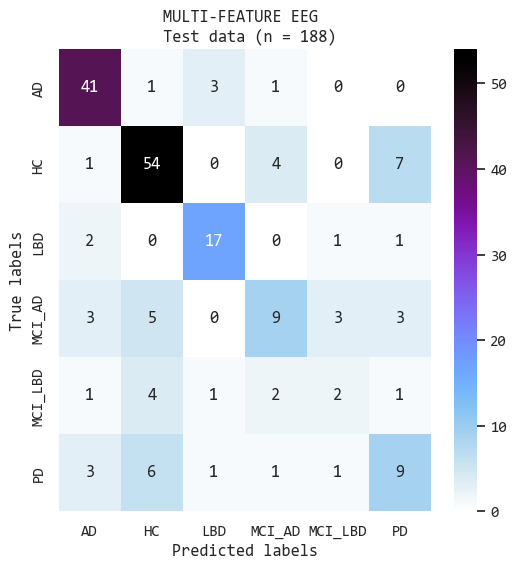

In [17]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import cmasher as cm

sns.set_style('white')
sns.set(font="Consolas")

# Assuming y_test contains the actual class labels
class_labels = sorted(set(y_test))

cmap = cm.voltage_r
    
# convert class labels to uppercase
class_labels_upper = [label.upper() for label in class_labels]

# compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# plot the matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("MULTI-FEATURE EEG \n Test data (n = " f"{len(y_test)})")
plt.show()


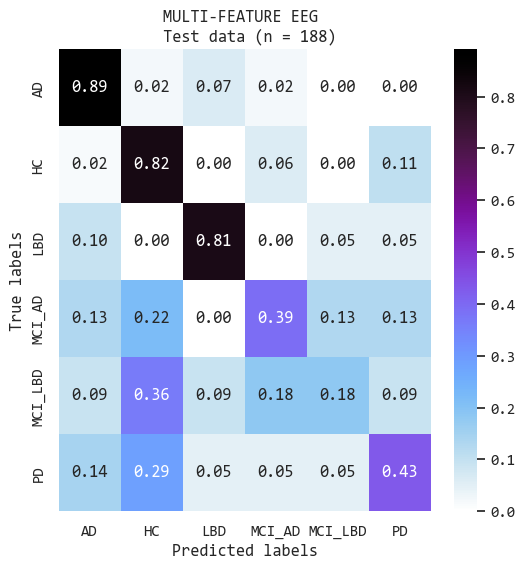

In [18]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cm

sns.set_style('white')
sns.set(font="Consolas")
cmap = cm.voltage_r
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)

plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("MULTI-FEATURE EEG \n Test data (n = " f"{len(y_test)})")
plt.show()


In [15]:
train_pred = predictor.get_oof_pred(train_data=train, model=model)
train_pred_proba = predictor.get_oof_pred_proba(train_data=train, model=model)

train_actual = train['group']


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_11356\2747100437.py:1: DeprecationWarning: `get_oof_pred` has been deprecated and will be removed in version 1.2. Please use `predict_oof` instead. This will raise an error in the future!
  train_pred = predictor.get_oof_pred(train_data=train, model=model)
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_11356\2747100437.py:2: DeprecationWarning: `get_oof_pred_proba` has been deprecated and will be removed in version 1.2. Please use `predict_proba_oof` instead. This will raise an error in the future!
  train_pred_proba = predictor.get_oof_pred_proba(train_data=train, model=model)


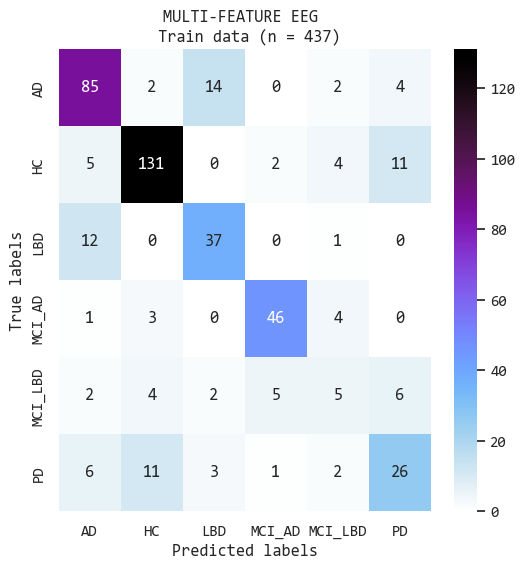

In [19]:
sns.set_style('white')
sns.set(font="Consolas")

# compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)
# # plot the matrix
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("MULTI-FEATURE EEG \n Train data (n = " f"{len(train_actual)})")
plt.show()

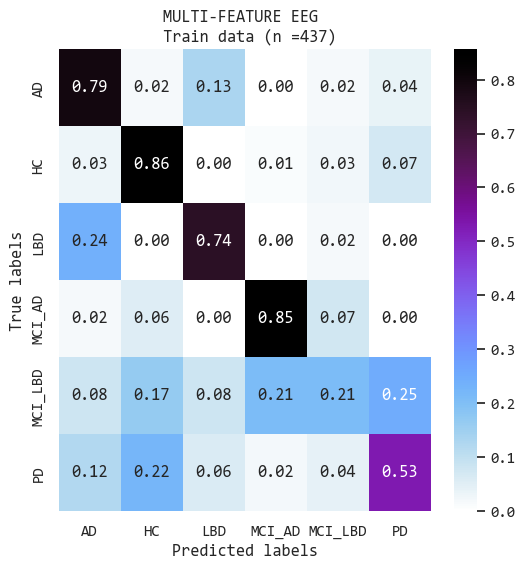

In [20]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


sns.set_style('white')
sns.set(font="Consolas")

# Compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("MULTI-FEATURE EEG \n Train data (n =" f"{len(train_actual)})")
plt.show()


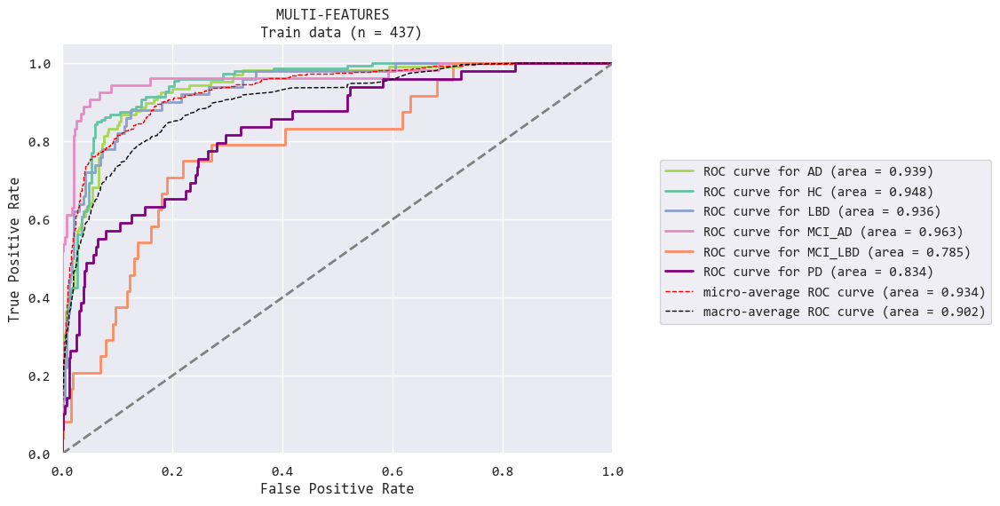

In [21]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, confusion_matrix, balanced_accuracy_score, accuracy_score, precision_recall_curve
import cmasher as cmr
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('white')
sns.set(font="Consolas")

# get predicted probabilities
y_score = train_pred_proba

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(train_actual, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = ["#a6d854","#66c2a5", "#8da0cb","#e78ac3","#fc8d62", "purple"]
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("MULTI-FEATURES \n Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


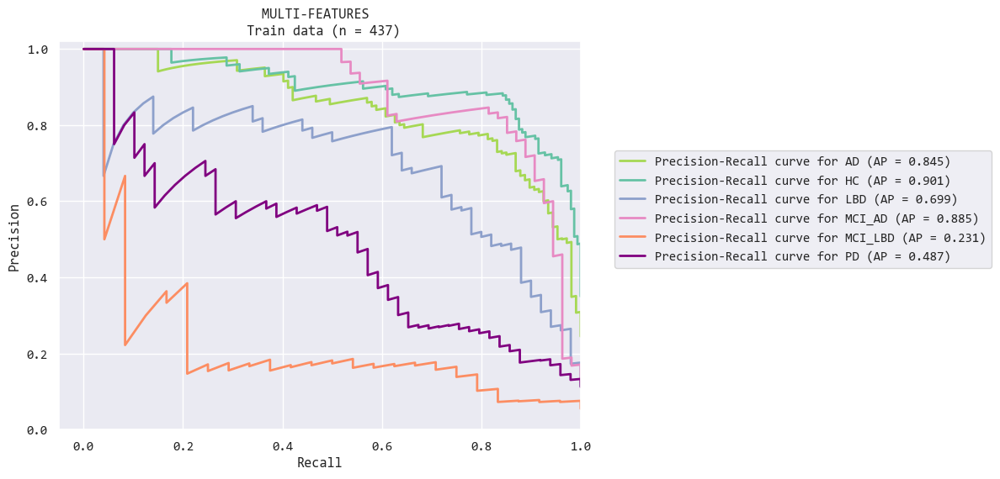

In [22]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([-0.05, 1.0])
plt.ylim([0, 1.02])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("MULTI-FEATURES \n Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


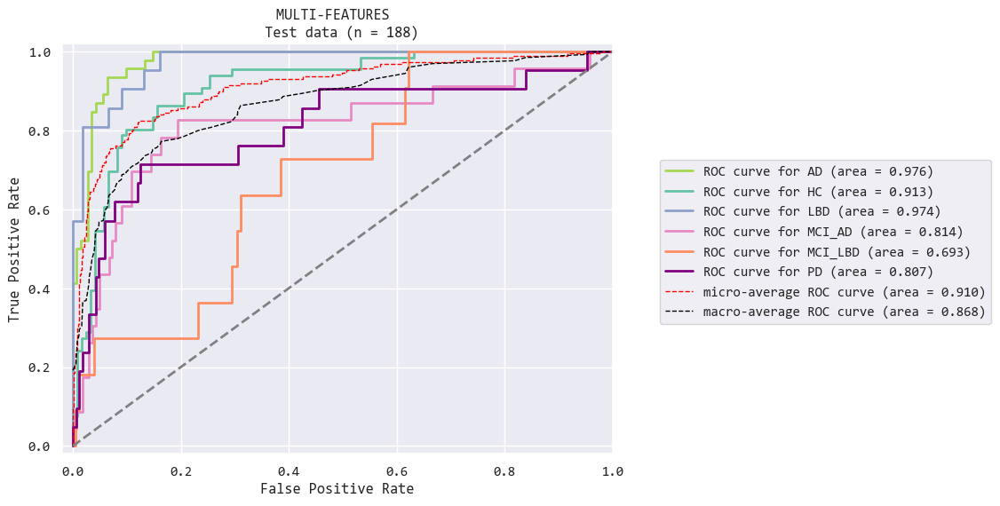

In [23]:
# get predicted probabilities
y_score = predictor.predict_proba(data = test_data, as_multiclass=True, model = model)

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(y_test, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = colors
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("MULTI-FEATURES \n Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


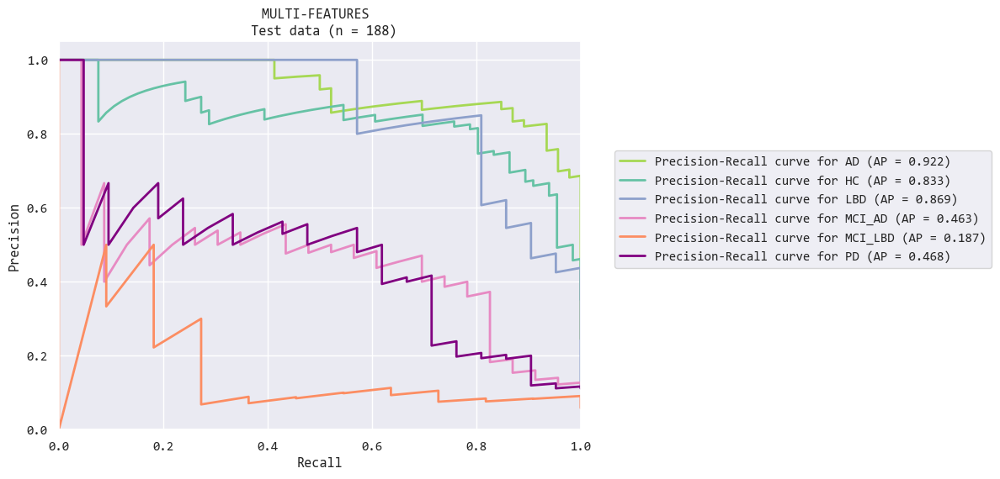

In [24]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("MULTI-FEATURES \n Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


featurewiz

In [4]:
import pandas as pd
# Specify the path to the CSV file
csv_path = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/edlb_all_features_unharm_wide.csv'

# Read the CSV file into a DataFrame
wide = pd.read_csv(csv_path)


# List of groups to exclude
excluded_values = ['sci', 'ftd']  # 5 subjects with Subjective cognitive impairment & FTD group

# Filter the dataset to exclude rows where 'group' is in the excluded values list
wide = wide[(~wide['group'].isin(excluded_values)) & (wide["age"] >= 46)].reset_index(drop=True)

# posterior_roi = ["P3", "P4", "P7", "P8", "Pz", "PO3", "PO4", "Oz", "O1", "O2"]

# # Filter the dataset to exclude rows where 'group' is in the excluded values list
# wide = wide[(wide['channel'].isin(posterior_roi))].reset_index(drop=True)


# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
wide['group'] = wide['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})

wide['group'] = wide['group'].replace({'dlb': 'lbd', 'pdd': 'lbd'})
wide.shape




(625, 109)

In [5]:
from sklearn.model_selection import train_test_split
from reComBat import reComBat

df = wide.copy()
df['age'] = df['age'].round(1)

# Splitting the data into train and test datasets
X_train, X_test, y_train, y_test = train_test_split(df.iloc[:, :], df["group"], test_size=0.3, random_state=1997, stratify=df["group"])

model = reComBat(parametric=True,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

# Creating a subset of X_train and renaming the column
covars = X_train.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)


# Fitting the reComBat model on the train data
model.fit(data=X_train.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Transforming the train data using the fitted model
transformed_train_data = model.transform(data=X_train.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
X_train_harmonized = pd.concat([X_train.iloc[:,:5], transformed_train_data], axis=1)
train_combat = X_train_harmonized.copy()
train_combat['split'] = 'train'

# Creating a subset of X_train and renaming the column
covars = X_test.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)

# Transforming the test data using the fitted model
transformed_test_data = model.transform(data=X_test.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
X_test_harmonized = pd.concat([X_test.iloc[:,:5], transformed_test_data], axis=1)
test_combat = X_test_harmonized.copy()
test_combat['split'] = 'test'


all_combat_df = pd.concat([train_combat, test_combat], axis=0)
all_combat_df

2024-03-22 14:14:45,468 - root - INFO - Starting to fot reComBat.
2024-03-22 14:14:45,472 - root - INFO - Fit the linear model.
2024-03-22 14:14:45,761 - root - INFO - Starting the empirical parametric optimisation.
2024-03-22 14:14:45,765 - root - INFO - Optimisation finished.
2024-03-22 14:14:45,766 - root - INFO - reComBat is fitted.
2024-03-22 14:14:45,767 - root - INFO - Starting to transform.
2024-03-22 14:14:45,774 - root - INFO - Transform finished.
2024-03-22 14:14:45,779 - root - INFO - Starting to transform.
2024-03-22 14:14:45,784 - root - INFO - Transform finished.


,participant_id,group,age,gender,center,permutation_anterior,permutation_central,permutation_posterior,sample_ent_anterior,sample_ent_central,...,imcoh_delta_iqr,imcoh_theta_median,imcoh_theta_iqr,imcoh_alpha_median,imcoh_alpha_iqr,imcoh_beta_median,imcoh_beta_iqr,imcoh_global_median,imcoh_global_iqr,split
505,m_024,hc,62.0,m,medellin,0.852653,0.852891,0.841145,1.308834,1.305363,...,0.226025,0.275341,0.106079,0.380684,0.143710,0.357695,0.181781,0.348217,0.118303,train
381,gre_060,hc,71.0,f,greece,0.878452,0.875560,0.876085,1.363936,1.403216,...,0.134654,0.362248,0.153375,0.287512,0.123612,0.287129,0.072444,0.299050,0.066551,train
366,gre_045,hc,70.0,f,greece,0.856282,0.854531,0.849872,1.198506,1.265575,...,0.154681,0.306546,0.146860,0.298352,0.160771,0.258585,0.068095,0.273645,0.049828,train
71,chi_043,lbd,74.0,m,chieti,0.852474,0.848107,0.838423,1.197626,1.240572,...,0.210594,0.378758,0.147009,0.322967,0.111381,0.317999,0.092885,0.328819,0.067675,train
38,chi_009,ad,83.0,f,chieti,0.868997,0.874619,0.882817,0.953046,1.008839,...,0.151848,0.297247,0.178551,0.484617,0.217627,0.265223,0.057138,0.322432,0.050703,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,c_pd13,pd,62.0,m,california,0.835156,0.853653,0.828227,1.144642,1.263772,...,0.210322,0.470804,0.145885,0.406741,0.170366,0.269185,0.076853,0.311373,0.066664,test
576,o_091,hc,51.0,f,oslo,0.883148,0.892535,0.880482,1.537038,1.573181,...,0.178095,0.243598,0.093030,0.269349,0.101668,0.378469,0.165839,0.346291,0.092978,test
203,fra_MA57,mci_ad,86.2,f,france,0.814407,0.796102,0.803977,1.024867,0.974166,...,0.243020,0.355482,0.127994,0.311907,0.115325,0.277171,0.055464,0.304754,0.055505,test
405,i_020,pd,70.0,m,iowa,0.864586,0.838289,0.821895,1.361480,1.225596,...,0.116988,0.396856,0.291930,0.453676,0.228279,0.326056,0.117298,0.354899,0.107736,test


############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
    Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
    Single_Label Multi_Classification problem 
    Loaded train data. Shape = (437, 107)
    Single_Label Multi_Classification problem 
loading the entire test dataframe - there is no nrows limit applicable #########
    Loaded test data. Shape = (188, 107)
#######################################################################################
######################## C L A S S I F Y I N G  V

    Removing (68) highly correlated variables:


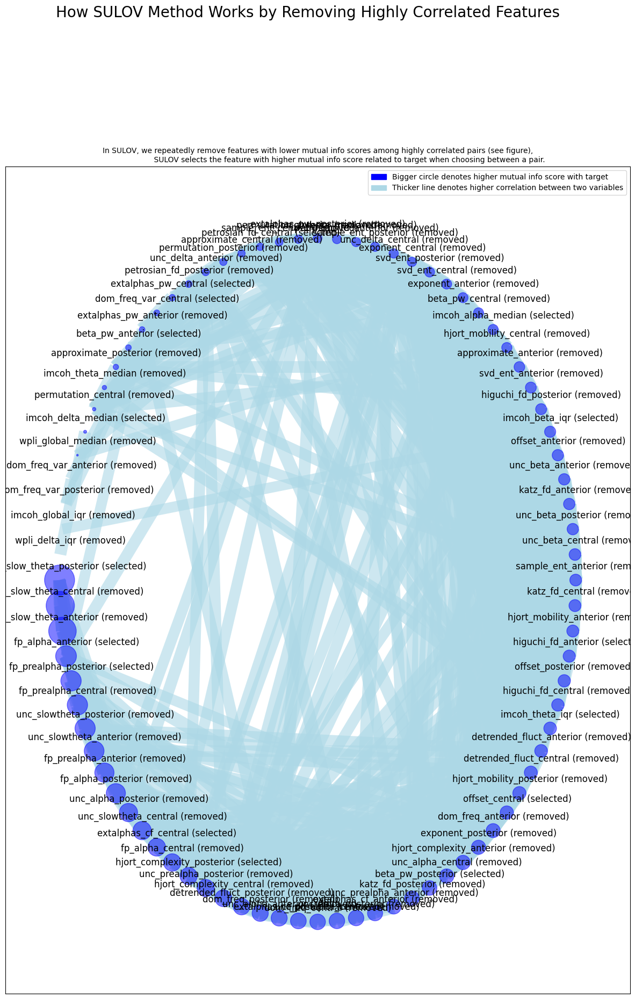

Time taken for SULOV method = 1 seconds
    Adding 1 categorical variables to reduced numeric variables  of 37
Finally 38 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
    there were no mixed data types or object columns that errored. Data is all numeric...
Shape of train data after adding missing values flags = (437, 39)
    Shape of test data after adding missing values flags  = (188, 38)
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 9 features per iteration...
    Number of booster rounds = 100
        Selected: ['fp_slow_theta_posterior', 'fp_alpha_anterior', 'fp_prealpha_posterior', 'beta_cf_posterior', 'hjort_complexity_posterior', 'extalphas_bw_anterior', 'extalphas_cf_central', 'a

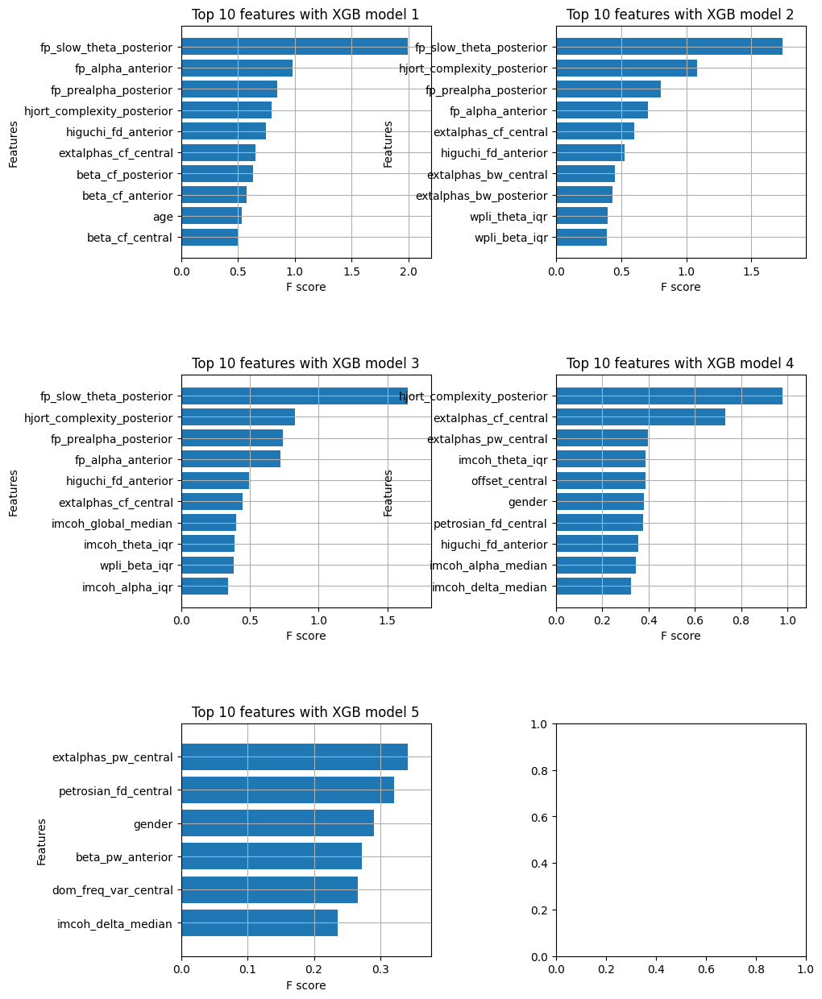

    Completed XGBoost feature selection in 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 24 important features:
['fp_slow_theta_posterior', 'fp_alpha_anterior', 'fp_prealpha_posterior', 'beta_cf_posterior', 'hjort_complexity_posterior', 'extalphas_bw_anterior', 'extalphas_cf_central', 'age', 'higuchi_fd_anterior', 'extalphas_bw_posterior', 'wpli_theta_iqr', 'wpli_beta_iqr', 'imcoh_theta_iqr', 'imcoh_delta_iqr', 'offset_central', 'imcoh_alpha_median', 'imcoh_beta_iqr', 'beta_pw_anterior', 'beta_pw_posterior', 'petrosian_fd_central', 'extalphas_pw_central', 'dom_freq_var_central', 'imcoh_delta_median', 'gender']
Total Time taken for featurewiz selection = 3 seconds
Output contains two dataframes: train and test with 24 important features.


In [11]:
import featurewiz as fwiz

outputs = fwiz.featurewiz(dataname=X_train_harmonized.drop(['center', 'participant_id'],axis=1), target='group', corr_limit=0.70, verbose=2, sep=',', 
		test_data=X_test_harmonized.drop(['center', 'participant_id'],axis=1),feature_engg='', category_encoders='',
		dask_xgboost_flag=False, skip_sulov=False, skip_xgboost=False)

In [25]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder

# Verify shapes of y_test and y_pred
print(y_test.shape)
print(y_pred.shape)

# Convert labels to numerical values
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array(class_labels)  # Set the classes explicitly based on your problem


# Encode labels
y_test_encoded = label_encoder.transform(y_test)
y_pred_encoded = label_encoder.transform(y_pred)

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)

# Compute balanced accuracy
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_pred_encoded)

# Compute precision
precision = precision_score(y_test_encoded, y_pred_encoded, average=None)

# Compute recall
recall = recall_score(y_test_encoded, y_pred_encoded, average=None)

# Compute F1 score
f1 = f1_score(y_test_encoded, y_pred_encoded, average=None)

# Create a table to display the metrics
import pandas as pd

metrics_table = pd.DataFrame({'Class': label_encoder.classes_,
                              'Precision': precision,
                              'Recall': recall,
                              'F1 Score': f1})

metrics_table.loc[len(metrics_table)] = ['Micro-average', precision_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='micro')]

metrics_table.loc[len(metrics_table)] = ['Macro-average', precision_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='macro')]

metrics_table.loc[len(metrics_table)] = ['Weighted-average', precision_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='weighted')]

metrics_table

(188,)
(188,)


,Class,Precision,Recall,F1 Score
0,ad,0.803922,0.891304,0.845361
1,hc,0.771429,0.818182,0.794118
2,lbd,0.772727,0.809524,0.790698
3,mci_ad,0.529412,0.391304,0.450000
4,mci_lbd,0.285714,0.181818,0.222222
5,pd,0.428571,0.428571,0.428571
6,Micro-average,0.702128,0.702128,0.702128
7,Macro-average,0.598629,0.586784,0.588495
8,Weighted-average,0.683198,0.702128,0.689880


In [26]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming you have calculated the confusion matrix
confusion_matrix = confusion_matrix(y_test_encoded, y_pred_encoded)

FP = confusion_matrix.sum(axis=0) - np.diag(confusion_matrix)  
FN = confusion_matrix.sum(axis=1) - np.diag(confusion_matrix)
TP = np.diag(confusion_matrix)
TN = confusion_matrix.sum() - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP / (TP + FN)

# Specificity or true negative rate
TNR = TN / (TN + FP)

# Precision or positive predictive value
PPV = TP / (TP + FP)

# Negative predictive value
NPV = TN / (TN + FN)

# Construct a DataFrame with the results
res = pd.DataFrame({
    'Class': label_encoder.classes_,
    'Sensitivity': TPR,
    'Specificity': TNR,
    'PPV': PPV,
    'NPV': NPV
})

res


,Class,Sensitivity,Specificity,PPV,NPV
0,ad,0.891304,0.929577,0.803922,0.963504
1,hc,0.818182,0.868852,0.771429,0.898305
2,lbd,0.809524,0.970060,0.772727,0.975904
3,mci_ad,0.391304,0.951515,0.529412,0.918129
4,mci_lbd,0.181818,0.971751,0.285714,0.950276
5,pd,0.428571,0.928144,0.428571,0.928144


In [ ]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np
import sklearn
import shap

shap.initjs()

import warnings
warnings.filterwarnings('ignore')

In [ ]:
label = 'group'

y_train = train[label]
y_test = test_data[label]
X_train = pd.DataFrame(train.drop(columns=[label]))
X_test = pd.DataFrame(test_data.drop(columns=[label]))

display(train.head())
print("Possible classes: \n Train", train[label].value_counts())
print("Possible classes: \n Test", test_data[label].value_counts())

In [ ]:
class AutogluonWrapper:
    def __init__(self, predictor, feature_names, target_class=None):
        self.ag_model = predictor
        self.feature_names = feature_names
        self.target_class = target_class
        if target_class is None and predictor.problem_type != 'regression':
            print("Since target_class not specified, SHAP will explain predictions for each class")
    
    def predict_proba(self, X):
        if isinstance(X, pd.Series):
            X = X.values.reshape(1,-1)
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)
        preds = self.ag_model.predict_proba(X, model = model)
        if predictor.problem_type == "regression" or self.target_class is None:
            return preds
        else:
            return preds[self.target_class]  

In [ ]:
baseline = X_test

ag_wrapper = AutogluonWrapper(predictor, X_test.columns)
explainer = shap.KernelExplainer(ag_wrapper.predict_proba, baseline)
print("Baseline prediction: \n", ag_wrapper.predict_proba(baseline).mean())  # this is the same as explainer.expected_value

NSHAP_SAMPLES = 100  # how many samples to use to approximate each Shapely value, larger values will be slower
shap.initjs()

In [ ]:
y_pred.head(20)

In [ ]:
test_data.head(20)

In [ ]:
ROW_INDEX = 3  # index of an example datapoint
class_of_interest = 'ad'  # can be any value in set(y_test)
class_index = predictor.class_labels.index(class_of_interest)

single_datapoint = X_test.iloc[[ROW_INDEX]]
single_prediction = ag_wrapper.predict_proba(single_datapoint)

shap_values_single = explainer.shap_values(single_datapoint, nsamples=NSHAP_SAMPLES)
print("Shapely values: \n", {predictor.class_labels[i]:shap_values_single[i] for i in range(len(predictor.class_labels))})

print(f"Force_plot for class: {class_of_interest}")
shap.force_plot(explainer.expected_value[class_index], shap_values_single[class_index], X_test.iloc[ROW_INDEX,:])#, matplotlib=True)

In [ ]:
from IPython.display import HTML
import shap

# Assuming you have already computed the shap_values and explainer

# Set the class index for which you want to display the force plot
class_of_interest = 'ad'  # can be any value in set(y_train)
class_index = predictor.class_labels.index(class_of_interest)

# Assuming ROW_INDEX is defined and corresponds to the desired row
individual_forceplot = shap.force_plot(
    explainer.expected_value[class_index],
    shap_values_single[class_index],
    X_test.iloc[ROW_INDEX,:]
)

# Construct HTML with a white background and a header title
html_content = f"""
<div style='background-color:white; padding: 20px;'>
    <h2 style='text-align: center; color: black;'>Probability for AD</h2>
    {shap.getjs()}
    {individual_forceplot.html()}
</div>
"""

HTML(html_content)


In [ ]:
# WHITE BACKGROUND 
from IPython.display import HTML
shap.initjs()
individual_forceplot = shap.force_plot(explainer.expected_value[class_index], shap_values_single[class_index], X_test.iloc[ROW_INDEX,:])
HTML(f"<div style='background-color:white;'>{shap.getjs() + individual_forceplot.html()}</div>")

In [ ]:
shap_values = explainer.shap_values(X_test, nsamples=NSHAP_SAMPLES)

print(f"Force_plot for class: {class_of_interest}")
shap.force_plot(explainer.expected_value[class_index], shap_values[class_index], X_test)

In [ ]:
# WHITE BACKGROUND 
from IPython.display import HTML
shap.initjs()
dataset_forceplot = shap.force_plot(explainer.expected_value[class_index], shap_values[class_index], X_test)
HTML(f"<div style='background-color:white;'>{shap.getjs() + dataset_forceplot.html()}</div>")

In [ ]:
predictor.class_labels

In [ ]:
shap.summary_plot(shap_values, X_test, class_names=['AD', 'HC', 'MCI-AD', 'MCI-LBD', 'PD'])
print({"Class "+str(i) : predictor.class_labels[i] for i in range(len(predictor.class_labels))})

# HARM - SPECTRAL ONLY

In [27]:
sp_comp_train = X_train_harmonized.iloc[:,5:89].join(X_train_harmonized.iloc[:,0:5])
sp_only_train = X_train_harmonized.iloc[:,35:89].join(X_train_harmonized.iloc[:,0:5])
sp_comp_test = X_test_harmonized.iloc[:,5:89].join(X_test_harmonized.iloc[:,0:5])
sp_only_test = X_test_harmonized.iloc[:,35:89].join(X_test_harmonized.iloc[:,0:5])


In [29]:
from autogluon.tabular import TabularPredictor

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = sp_only_train.drop(columns=columns_to_drop)
time = 3600 * 4

save_path = 'D:/data_analysis/papers_alberto/edlb_automl/results/harmonized_spect_only'  # specifies folder to store trained models
predictor = TabularPredictor(label=label, path=save_path, eval_metric='balanced_accuracy',
                             sample_weight='auto_weight').fit(train, presets='best_quality', auto_stack=True, time_limit=time)  

Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
Dynamic stacking is enabled (dynamic_stacking=True). AutoGluon will try to determine whether the input data is affected by stacked overfitting and enable or disable stacking as a consequence.
Detecting stacked overfitting by sub-fitting AutoGluon on the input data. That is, copies of AutoGluon will be sub-fit on subset(s) of the data. Then, the holdout validation data is used to detect stacked overfitting.
Sub-fit(s) time limit is: 14400 seconds.
Starting holdout-based sub-fit for dynamic stacking. Context path is: D:/data_analysis/papers_alberto/edlb_automl/results/harmonized_spect_only/ds_sub_fit/sub_fit_ho.
Running the sub-fit in a ray process to avoid memory leakage.
Spend 3629 seconds for the sub-fit(s) during dynamic stacking.
Time left for full fit of AutoGluon: 10771 seconds.
Starting full fit now with num_stack_levels 0.
Beginning AutoGluon training ..

Load pretrained model below

In [ ]:
from autogluon.tabular import TabularPredictor

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = sp_only_train.drop(columns=columns_to_drop)

save_path = 'D:/data_analysis/papers_alberto/edlb_automl/results/harmonized_spect_only'  # specifies folder to open pretrained trained models
predictor = TabularPredictor.load(path=save_path)  

Continue with predictions

In [30]:
test_data = sp_only_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]))
predictor.evaluate(test_data)

{'balanced_accuracy': 0.530804943848422,
 'accuracy': 0.6968085106382979,
 'mcc': 0.6005849573302146}

## EXPLAIN

In [ ]:
predictor.fit_summary(show_plot=True)

In [31]:
predictor.leaderboard(test_data, silent=True).head(50)

,model,score_test,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,RandomForest_r16_BAG_L1,0.572056,0.617533,balanced_accuracy,0.113999,0.070000,1.545003,0.113999,0.070000,1.545003,1,True,94
1,CatBoost_r137_BAG_L1,0.562974,0.618903,balanced_accuracy,0.084813,0.025011,111.183901,0.084813,0.025011,111.183901,1,True,23
2,CatBoost_r5_BAG_L1,0.562974,0.601622,balanced_accuracy,0.113002,0.021992,58.747804,0.113002,0.021992,58.747804,1,True,71
3,RandomForest_r127_BAG_L1,0.558991,0.597622,balanced_accuracy,0.133001,0.075999,1.128329,0.133001,0.075999,1.128329,1,True,58
4,RandomForest_r15_BAG_L1,0.558332,0.611695,balanced_accuracy,0.092000,0.096000,1.003724,0.092000,0.096000,1.003724,1,True,81
5,XGBoost_BAG_L1,0.557485,0.672993,balanced_accuracy,0.701861,0.043114,6.709587,0.701861,0.043114,6.709587,1,True,11
6,XGBoost_r49_BAG_L1,0.557485,0.635085,balanced_accuracy,0.903999,0.051999,11.194126,0.903999,0.051999,11.194126,1,True,70
7,CatBoost_r6_BAG_L1,0.556826,0.617728,balanced_accuracy,0.095997,0.022999,29.994289,0.095997,0.022999,29.994289,1,True,85
8,XGBoost_r98_BAG_L1,0.556418,0.625941,balanced_accuracy,0.917994,0.052066,20.130627,0.917994,0.052066,20.130627,1,True,49
9,CatBoost_r70_BAG_L1,0.555728,0.585088,balanced_accuracy,0.177003,0.032531,200.092590,0.177003,0.032531,200.092590,1,True,42


## WANT TO SELECT OTHER MODEL THAN BEST VALIDATION MODEL ???

In [32]:
model='RandomForest_r16_BAG_L1'

In [33]:
# PREDICT USING USER DEFINED MODEL 
test_data = sp_only_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]), model = model)
predictor.evaluate(test_data, model = model)


{'balanced_accuracy': 0.5720559633603112,
 'accuracy': 0.7074468085106383,
 'mcc': 0.6147653178902925}

## CONF MATRIXES 

In [ ]:
print("AutoGluon infers problem type is: ", predictor.problem_type)
print("AutoGluon identified the following types of features:")
print(predictor.feature_metadata)

In [ ]:
importance_train = predictor.feature_importance(train, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance_train[importance_train['p_value'] < 0.05]

# Sort features based on importance_train for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('importance train')
plt.ylabel('Feature')
plt.title('Feature Importance train dataset - Significant Features (p value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
importance = predictor.feature_importance(test_data, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance[importance['p_value'] < 0.05]

# Sort features based on importance for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance test dataset - Significant Features (p_value < 0.05)')
plt.grid(axis='x')
plt.show()


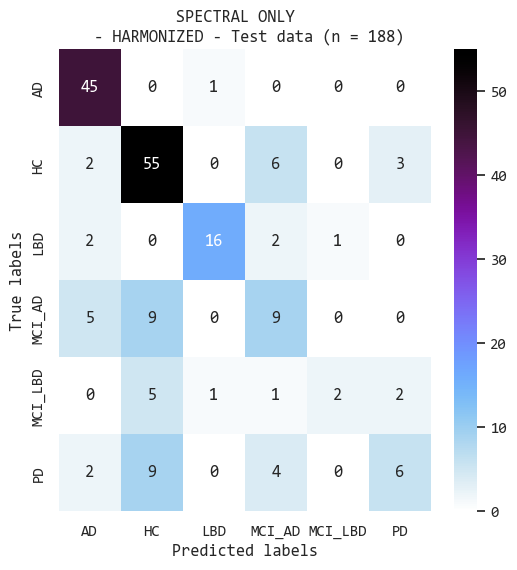

In [34]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import cmasher as cm

# Assuming y_test contains the actual class labels
class_labels = sorted(set(y_test))

cmap = cm.voltage_r

# convert class labels to uppercase
class_labels_upper = [label.upper() for label in class_labels]

# compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# plot the matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL ONLY  \n - HARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


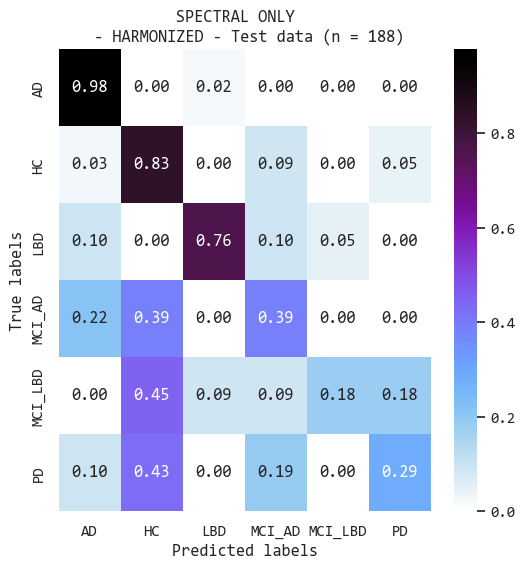

In [35]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cm

cmap = cm.voltage_r
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)

plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL ONLY  \n - HARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


In [ ]:
train_pred = predictor.get_oof_pred(train_data=train, model=model)
train_pred_proba = predictor.get_oof_pred_proba(train_data=train, model=model)

train_actual = train['group']


In [ ]:
# compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)
# # plot the matrix
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL ONLY  \n - HARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL ONLY  \n - HARMONIZED - Train data (n =" f"{len(train_actual)})")
plt.show()


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, confusion_matrix, balanced_accuracy_score, accuracy_score, precision_recall_curve

# get predicted probabilities
y_score = train_pred_proba

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(train_actual, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = ["#a6d854","#66c2a5", "#8da0cb","#e78ac3","#fc8d62"]
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("SPECTRAL ONLY  \n - HARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([-0.05, 1.0])
plt.ylim([0, 1.02])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("SPECTRAL ONLY  \n - HARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


In [ ]:
# get predicted probabilities
y_score = predictor.predict_proba(data = test_data, as_multiclass=True, model = model)

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(y_test, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = colors
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("SPECTRAL ONLY  \n - HARMONIZED - Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("SPECTRAL ONLY  \n - HARMONIZED - Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder

# Verify shapes of y_test and y_pred
print(y_test.shape)
print(y_pred.shape)

# Convert labels to numerical values
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array(class_labels)  # Set the classes explicitly based on your problem


# Encode labels
y_test_encoded = label_encoder.transform(y_test)
y_pred_encoded = label_encoder.transform(y_pred)

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)

# Compute balanced accuracy
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_pred_encoded)

# Compute precision
precision = precision_score(y_test_encoded, y_pred_encoded, average=None)

# Compute recall
recall = recall_score(y_test_encoded, y_pred_encoded, average=None)

# Compute F1 score
f1 = f1_score(y_test_encoded, y_pred_encoded, average=None)

# Create a table to display the metrics
import pandas as pd

metrics_table = pd.DataFrame({'Class': label_encoder.classes_,
                              'Precision': precision,
                              'Recall': recall,
                              'F1 Score': f1})

metrics_table.loc[len(metrics_table)] = ['Micro-average', precision_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='micro')]

metrics_table.loc[len(metrics_table)] = ['Macro-average', precision_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='macro')]

metrics_table.loc[len(metrics_table)] = ['Weighted-average', precision_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='weighted')]

metrics_table

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming you have calculated the confusion matrix
confusion_matrix = confusion_matrix(y_test_encoded, y_pred_encoded)

FP = confusion_matrix.sum(axis=0) - np.diag(confusion_matrix)  
FN = confusion_matrix.sum(axis=1) - np.diag(confusion_matrix)
TP = np.diag(confusion_matrix)
TN = confusion_matrix.sum() - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP / (TP + FN)

# Specificity or true negative rate
TNR = TN / (TN + FP)

# Precision or positive predictive value
PPV = TP / (TP + FP)

# Negative predictive value
NPV = TN / (TN + FN)

# Construct a DataFrame with the results
res = pd.DataFrame({
    'Class': label_encoder.classes_,
    'Sensitivity': TPR,
    'Specificity': TNR,
    'PPV': PPV,
    'NPV': NPV
})

res


# HARM - SPECTRAL + COMPLEXITY

In [ ]:
sp_comp_train = X_train_harmonized.iloc[:,5:89].join(X_train_harmonized.iloc[:,0:5])
sp_only_train = X_train_harmonized.iloc[:,35:89].join(X_train_harmonized.iloc[:,0:5])
sp_comp_test = X_test_harmonized.iloc[:,5:89].join(X_test_harmonized.iloc[:,0:5])
sp_only_test = X_test_harmonized.iloc[:,35:89].join(X_test_harmonized.iloc[:,0:5])


In [ ]:
from autogluon.tabular import TabularPredictor

# X_train_harmonized = X_train.iloc[:, :5].join(X_train_selected.iloc[:, :])
# X_test_harmonized = X_test.iloc[:, :5].join(X_test_selected.iloc[:, :])

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = sp_comp_train.drop(columns=columns_to_drop)
time = 3600 * 4

save_path = 'D:/data_analysis/papers_alberto/final_phd/scripts/autogluon_thesis_multiclass_older_harm_sp_comp'  # specifies folder to store trained models
predictor = TabularPredictor(label=label, path=save_path, eval_metric='balanced_accuracy',
                             sample_weight='auto_weight').fit(train, presets='best_quality', auto_stack=True, time_limit=time)  

Load pretrained model below

In [ ]:
from autogluon.tabular import TabularPredictor

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = sp_comp_train.drop(columns=columns_to_drop)

save_path = 'D:/data_analysis/papers_alberto/final_phd/scripts/autogluon_thesis_multiclass_older_harm_sp_comp'  # specifies folder to open pretrained trained models
predictor = TabularPredictor.load(path=save_path)  

Continue with predictions

In [ ]:
test_data = sp_comp_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]))
predictor.evaluate(test_data)

## EXPLAIN

In [ ]:
predictor.fit_summary(show_plot=True)

In [ ]:
predictor.leaderboard(test_data, silent=True)

## WANT TO SELECT OTHER MODEL THAN BEST VALIDATION MODEL ???

In [ ]:
model='XGBoost_BAG_L1'

In [ ]:
# PREDICT USING USER DEFINED MODEL 
test_data = sp_comp_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]), model = model)
predictor.evaluate(test_data, model = model)


## CONF MATRIXES 

In [ ]:
print("AutoGluon infers problem type is: ", predictor.problem_type)
print("AutoGluon identified the following types of features:")
print(predictor.feature_metadata)

In [ ]:
importance_train = predictor.feature_importance(train, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance_train[importance_train['p_value'] < 0.05]

# Sort features based on importance_train for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('importance train')
plt.ylabel('Feature')
plt.title('Feature Importance train dataset - Significant Features (p value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
importance = predictor.feature_importance(test_data, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance[importance['p_value'] < 0.05]

# Sort features based on importance for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance test dataset - Significant Features (p_value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import cmasher as cm

# Assuming y_test contains the actual class labels
class_labels = sorted(set(y_test))

cmap = cm.voltage_r

# convert class labels to uppercase
class_labels_upper = [label.upper() for label in class_labels]

# compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# plot the matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL + COMPLEXITY EEG \n - HARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cm

cmap = cm.voltage_r
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)

plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL + COMPLEXITY EEG \n - HARMONIZED - Test data (n = "  f"{len(y_test)})")
plt.show()


In [ ]:
train_pred = predictor.get_oof_pred(train_data=train, model=model)
train_pred_proba = predictor.get_oof_pred_proba(train_data=train, model=model)

train_actual = train['group']


In [ ]:
# compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)
# # plot the matrix
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL + COMPLEXITY EEG \n - HARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL + COMPLEXITY EEG \n - HARMONIZED - Train data (n =" f"{len(train_actual)})")
plt.show()


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, confusion_matrix, balanced_accuracy_score, accuracy_score, precision_recall_curve

# get predicted probabilities
y_score = train_pred_proba

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(train_actual, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = ["#a6d854","#66c2a5", "#8da0cb","#e78ac3","#fc8d62"]
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("SPECTRAL + COMPLEXITY EEG \n - HARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([-0.05, 1.0])
plt.ylim([0, 1.02])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("SPECTRAL + COMPLEXITY EEG \n - HARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


In [ ]:
# get predicted probabilities
y_score = predictor.predict_proba(data = test_data, as_multiclass=True, model = model)

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(y_test, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = colors
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("SPECTRAL + COMPLEXITY EEG \n - HARMONIZED - Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("SPECTRAL + COMPLEXITY EEG \n - HARMONIZED - Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder

# Verify shapes of y_test and y_pred
print(y_test.shape)
print(y_pred.shape)

# Convert labels to numerical values
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array(class_labels)  # Set the classes explicitly based on your problem


# Encode labels
y_test_encoded = label_encoder.transform(y_test)
y_pred_encoded = label_encoder.transform(y_pred)

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)

# Compute balanced accuracy
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_pred_encoded)

# Compute precision
precision = precision_score(y_test_encoded, y_pred_encoded, average=None)

# Compute recall
recall = recall_score(y_test_encoded, y_pred_encoded, average=None)

# Compute F1 score
f1 = f1_score(y_test_encoded, y_pred_encoded, average=None)

# Create a table to display the metrics
import pandas as pd

metrics_table = pd.DataFrame({'Class': label_encoder.classes_,
                              'Precision': precision,
                              'Recall': recall,
                              'F1 Score': f1})

metrics_table.loc[len(metrics_table)] = ['Micro-average', precision_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='micro')]

metrics_table.loc[len(metrics_table)] = ['Macro-average', precision_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='macro')]

metrics_table.loc[len(metrics_table)] = ['Weighted-average', precision_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='weighted')]

metrics_table

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming you have calculated the confusion matrix
confusion_matrix = confusion_matrix(y_test_encoded, y_pred_encoded)

FP = confusion_matrix.sum(axis=0) - np.diag(confusion_matrix)  
FN = confusion_matrix.sum(axis=1) - np.diag(confusion_matrix)
TP = np.diag(confusion_matrix)
TN = confusion_matrix.sum() - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP / (TP + FN)

# Specificity or true negative rate
TNR = TN / (TN + FP)

# Precision or positive predictive value
PPV = TP / (TP + FP)

# Negative predictive value
NPV = TN / (TN + FN)

# Construct a DataFrame with the results
res = pd.DataFrame({
    'Class': label_encoder.classes_,
    'Sensitivity': TPR,
    'Specificity': TNR,
    'PPV': PPV,
    'NPV': NPV
})

res


In [ ]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np
import sklearn
import shap

shap.initjs()

import warnings
warnings.filterwarnings('ignore')

In [ ]:
label = 'group'

y_train = train[label]
y_test = test_data[label]
X_train = pd.DataFrame(train.drop(columns=[label]))
X_test = pd.DataFrame(test_data.drop(columns=[label]))

display(train.head())
print("Possible classes: \n Train", train[label].value_counts())
print("Possible classes: \n Test", test_data[label].value_counts())

In [ ]:
class AutogluonWrapper:
    def __init__(self, predictor, feature_names, target_class=None):
        self.ag_model = predictor
        self.feature_names = feature_names
        self.target_class = target_class
        if target_class is None and predictor.problem_type != 'regression':
            print("Since target_class not specified, SHAP will explain predictions for each class")
    
    def predict_proba(self, X):
        if isinstance(X, pd.Series):
            X = X.values.reshape(1,-1)
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)
        preds = self.ag_model.predict_proba(X, model = model)
        if predictor.problem_type == "regression" or self.target_class is None:
            return preds
        else:
            return preds[self.target_class]  

In [ ]:
baseline = X_test

ag_wrapper = AutogluonWrapper(predictor, X_test.columns)
explainer = shap.KernelExplainer(ag_wrapper.predict_proba, baseline)
print("Baseline prediction: \n", ag_wrapper.predict_proba(baseline).mean())  # this is the same as explainer.expected_value

NSHAP_SAMPLES = 100  # how many samples to use to approximate each Shapely value, larger values will be slower
shap.initjs()

In [ ]:
y_pred.head(20)

In [ ]:
test_data.head(20)

In [ ]:
ROW_INDEX = 3  # index of an example datapoint
class_of_interest = 'ad'  # can be any value in set(y_test)
class_index = predictor.class_labels.index(class_of_interest)

single_datapoint = X_test.iloc[[ROW_INDEX]]
single_prediction = ag_wrapper.predict_proba(single_datapoint)

shap_values_single = explainer.shap_values(single_datapoint, nsamples=NSHAP_SAMPLES)
print("Shapely values: \n", {predictor.class_labels[i]:shap_values_single[i] for i in range(len(predictor.class_labels))})

print(f"Force_plot for class: {class_of_interest}")
shap.force_plot(explainer.expected_value[class_index], shap_values_single[class_index], X_test.iloc[ROW_INDEX,:])#, matplotlib=True)

In [ ]:
from IPython.display import HTML
import shap

# Assuming you have already computed the shap_values and explainer

# Set the class index for which you want to display the force plot
class_of_interest = 'ad'  # can be any value in set(y_train)
class_index = predictor.class_labels.index(class_of_interest)

# Assuming ROW_INDEX is defined and corresponds to the desired row
individual_forceplot = shap.force_plot(
    explainer.expected_value[class_index],
    shap_values_single[class_index],
    X_test.iloc[ROW_INDEX,:]
)

# Construct HTML with a white background and a header title
html_content = f"""
<div style='background-color:white; padding: 20px;'>
    <h2 style='text-align: center; color: black;'>Probability for AD</h2>
    {shap.getjs()}
    {individual_forceplot.html()}
</div>
"""

HTML(html_content)


In [ ]:
# WHITE BACKGROUND 
from IPython.display import HTML
shap.initjs()
individual_forceplot = shap.force_plot(explainer.expected_value[class_index], shap_values_single[class_index], X_test.iloc[ROW_INDEX,:])
HTML(f"<div style='background-color:white;'>{shap.getjs() + individual_forceplot.html()}</div>")

In [ ]:
shap_values = explainer.shap_values(X_test, nsamples=NSHAP_SAMPLES)

print(f"Force_plot for class: {class_of_interest}")
shap.force_plot(explainer.expected_value[class_index], shap_values[class_index], X_test)

In [ ]:
# WHITE BACKGROUND 
from IPython.display import HTML
shap.initjs()
dataset_forceplot = shap.force_plot(explainer.expected_value[class_index], shap_values[class_index], X_test)
HTML(f"<div style='background-color:white;'>{shap.getjs() + dataset_forceplot.html()}</div>")

In [ ]:
predictor.class_labels

In [ ]:
shap.summary_plot(shap_values, X_test, class_names=['AD', 'HC', 'MCI-AD', 'MCI-LBD', 'PD'])
print({"Class "+str(i) : predictor.class_labels[i] for i in range(len(predictor.class_labels))})

# UNHARMONIZED - MULTIFEAT

In [ ]:

# List of groups to exclude
excluded_values = ['sci', 'ftd']  # 5 subjects with Subjective cognitive impairment & FTD group

# Filter the dataset to exclude rows where 'group' is in the excluded values list
wide = wide[(~wide['group'].isin(excluded_values)) & (wide['age'] >= 46)].reset_index(drop=True)


# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
wide['group'] = wide['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})

wide

In [ ]:
from sklearn.model_selection import train_test_split
from reComBat import reComBat

df = wide.copy()
df['age'] = df['age'].round(1)

# Splitting the data into train and test datasets
X_train, X_test, y_train, y_test = train_test_split(df.iloc[:, :], df["group"], test_size=0.3, random_state=42, stratify=df["group"])


In [ ]:
from autogluon.tabular import TabularPredictor

# X_train_harmonized = X_train.iloc[:, :5].join(X_train_selected.iloc[:, :])
# X_test_harmonized = X_test.iloc[:, :5].join(X_test_selected.iloc[:, :])

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = X_train.drop(columns=columns_to_drop)
time = 3600 * 4

save_path = 'D:/data_analysis/papers_alberto/final_phd/scripts/autogluon_thesis_multiclass_older_unharm'  # specifies folder to store trained models
predictor = TabularPredictor(label=label, path=save_path, eval_metric='balanced_accuracy',
                             sample_weight='auto_weight').fit(train, presets='best_quality', auto_stack=True, time_limit=time)  

Load pretrained model below

In [ ]:
from autogluon.tabular import TabularPredictor

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = X_train.drop(columns=columns_to_drop)

save_path = 'D:/data_analysis/papers_alberto/final_phd/scripts/autogluon_thesis_multiclass_older_unharm'  # specifies folder to open pretrained trained models
predictor = TabularPredictor.load(path=save_path)  

Continue with predictions

In [ ]:
test_data = X_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]))
predictor.evaluate(test_data)

## EXPLAIN

In [ ]:
predictor.fit_summary(show_plot=True)

In [ ]:
# PREDICT USING BEST VALIDATION MODEL 
test_data = X_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]))
predictor.evaluate(test_data)


In [ ]:
predictor.leaderboard(test_data, silent=True)

## WANT TO SELECT OTHER MODEL THAN BEST VALIDATION MODEL ???

In [ ]:
model='NeuralNetTorch_BAG_L1'

In [ ]:
# PREDICT USING USER DEFINED MODEL 
test_data = X_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]), model = model)
predictor.evaluate(test_data, model = model)


## CONF MATRIXES 

In [ ]:
print("AutoGluon infers problem type is: ", predictor.problem_type)
print("AutoGluon identified the following types of features:")
print(predictor.feature_metadata)

In [ ]:
importance_train = predictor.feature_importance(train, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance_train[importance_train['p_value'] < 0.05]

# Sort features based on importance_train for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('importance train')
plt.ylabel('Feature')
plt.title('Feature Importance - UNHARMONIZED - train dataset - Significant Features (p value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
importance = predictor.feature_importance(test_data, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance[importance['p_value'] < 0.05]

# Sort features based on importance for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance - UNHARMONIZED - test dataset - Significant Features (p_value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import cmasher as cm

# Assuming y_test contains the actual class labels
class_labels = sorted(set(y_test))

cmap = cm.voltage_r

# convert class labels to uppercase
class_labels_upper = [label.upper() for label in class_labels]

# compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# plot the matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("MULTI-FEATURE EEG \n - UNHARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cm

cmap = cm.voltage_r
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)

plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("MULTI-FEATURE EEG \n - UNHARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


In [ ]:
train_pred = predictor.get_oof_pred(train_data=train, model=model)
train_pred_proba = predictor.get_oof_pred_proba(train_data=train, model=model)

train_actual = train['group']


In [ ]:
# compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)
# # plot the matrix
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("MULTI-FEATURE EEG \n - UNHARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("MULTI-FEATURE EEG \n - UNHARMONIZED - Train data (n =" f"{len(train_actual)})")
plt.show()


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, confusion_matrix, balanced_accuracy_score, accuracy_score, precision_recall_curve

sns.set_style('white')
sns.set(font="Consolas")

# get predicted probabilities
y_score = train_pred_proba

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(train_actual, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = ["#a6d854","#66c2a5", "#8da0cb","#e78ac3","#fc8d62"]
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("MULTI-FEATURES - UNHARMONIZED -\n Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([-0.05, 1.0])
plt.ylim([0, 1.02])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("MULTI-FEATURES - UNHARMONIZED - \n Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


In [ ]:
# get predicted probabilities
y_score = predictor.predict_proba(data = test_data, as_multiclass=True, model = model)

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(y_test, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = colors
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("MULTI-FEATURES - UNHARMONIZED -\n Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder

# Verify shapes of y_test and y_pred
print(y_test.shape)
print(y_pred.shape)

# Convert labels to numerical values
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array(class_labels)  # Set the classes explicitly based on your problem


# Encode labels
y_test_encoded = label_encoder.transform(y_test)
y_pred_encoded = label_encoder.transform(y_pred)

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)

# Compute balanced accuracy
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_pred_encoded)

# Compute precision
precision = precision_score(y_test_encoded, y_pred_encoded, average=None)

# Compute recall
recall = recall_score(y_test_encoded, y_pred_encoded, average=None)

# Compute F1 score
f1 = f1_score(y_test_encoded, y_pred_encoded, average=None)

# Create a table to display the metrics
import pandas as pd

metrics_table = pd.DataFrame({'Class': label_encoder.classes_,
                              'Precision': precision,
                              'Recall': recall,
                              'F1 Score': f1})

metrics_table.loc[len(metrics_table)] = ['Micro-average', precision_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='micro')]

metrics_table.loc[len(metrics_table)] = ['Macro-average', precision_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='macro')]

metrics_table.loc[len(metrics_table)] = ['Weighted-average', precision_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='weighted')]

metrics_table

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming you have calculated the confusion matrix
confusion_matrix = confusion_matrix(y_test_encoded, y_pred_encoded)

FP = confusion_matrix.sum(axis=0) - np.diag(confusion_matrix)  
FN = confusion_matrix.sum(axis=1) - np.diag(confusion_matrix)
TP = np.diag(confusion_matrix)
TN = confusion_matrix.sum() - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP / (TP + FN)

# Specificity or true negative rate
TNR = TN / (TN + FP)

# Precision or positive predictive value
PPV = TP / (TP + FP)

# Negative predictive value
NPV = TN / (TN + FN)

# Construct a DataFrame with the results
res = pd.DataFrame({
    'Class': label_encoder.classes_,
    'Sensitivity': TPR,
    'Specificity': TNR,
    'PPV': PPV,
    'NPV': NPV
})

res


# UNHARMONIZED - SPECTRAL ONLY

In [ ]:
sp_comp_train = X_train.iloc[:,5:89].join(X_train.iloc[:,0:5])
sp_only_train = X_train.iloc[:,35:89].join(X_train.iloc[:,0:5])
sp_comp_test = X_test.iloc[:,5:89].join(X_test.iloc[:,0:5])
sp_only_test = X_test.iloc[:,35:89].join(X_test.iloc[:,0:5])


In [ ]:
from autogluon.tabular import TabularPredictor

# X_train_harmonized = X_train.iloc[:, :5].join(X_train_selected.iloc[:, :])
# X_test_harmonized = X_test.iloc[:, :5].join(X_test_selected.iloc[:, :])

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = sp_only_train.drop(columns=columns_to_drop)
time = 3600 * 4

save_path = 'D:/data_analysis/papers_alberto/final_phd/scripts/autogluon_thesis_multiclass_older_unharm_sp_only'  # specifies folder to store trained models
predictor = TabularPredictor(label=label, path=save_path, eval_metric='balanced_accuracy',
                             sample_weight='auto_weight').fit(train, presets='best_quality', auto_stack=True, time_limit=time)  

Load pretrained model below

In [ ]:
from autogluon.tabular import TabularPredictor

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = X_train.drop(columns=columns_to_drop)

save_path = 'D:/data_analysis/papers_alberto/final_phd/scripts/autogluon_thesis_multiclass_older_unharm_sp_only'  # specifies folder to open pretrained trained models
predictor = TabularPredictor.load(path=save_path)  

Continue with predictions

In [ ]:
test_data = sp_only_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]))
predictor.evaluate(test_data)

## EXPLAIN

In [ ]:
predictor.fit_summary(show_plot=True)

In [ ]:
# PREDICT USING BEST VALIDATION MODEL 
test_data = sp_only_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]))
predictor.evaluate(test_data)


In [ ]:
predictor.leaderboard(test_data, silent=True)

## WANT TO SELECT OTHER MODEL THAN BEST VALIDATION MODEL ???

In [ ]:
model='RandomForestGini_BAG_L1'

In [ ]:
# PREDICT USING USER DEFINED MODEL 
test_data = sp_only_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]), model = model)
predictor.evaluate(test_data, model = model)


## CONF MATRIXES 

In [ ]:
print("AutoGluon infers problem type is: ", predictor.problem_type)
print("AutoGluon identified the following types of features:")
print(predictor.feature_metadata)

In [ ]:
importance_train = predictor.feature_importance(train, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance_train[importance_train['p_value'] < 1]

# Sort features based on importance_train for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('importance train')
plt.ylabel('Feature')
plt.title('Sp Only - F. Importance - UNHARMONIZED - train dataset - Significant Features (p value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
importance = predictor.feature_importance(test_data, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance[importance['p_value'] < 0.05]

# Sort features based on importance for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Sp Only - F.  Importance - UNHARMONIZED - test dataset - Significant Features (p_value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import cmasher as cm

# Assuming y_test contains the actual class labels
class_labels = sorted(set(y_test))

cmap = cm.voltage_r

# convert class labels to uppercase
class_labels_upper = [label.upper() for label in class_labels]

# compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# plot the matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL ONLY \n - UNHARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cm

cmap = cm.voltage_r
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)

plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL ONLY \n - UNHARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


In [ ]:
train_pred = predictor.get_oof_pred(train_data=train, model=model)
train_pred_proba = predictor.get_oof_pred_proba(train_data=train, model=model)

train_actual = train['group']


In [ ]:
# compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)
# # plot the matrix
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL ONLY \n - UNHARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL ONLY \n - UNHARMONIZED - Train data (n =" f"{len(train_actual)})")
plt.show()


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, confusion_matrix, balanced_accuracy_score, accuracy_score, precision_recall_curve

sns.set_style('white')
sns.set(font="Consolas")

# get predicted probabilities
y_score = train_pred_proba

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(train_actual, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = ["#a6d854","#66c2a5", "#8da0cb","#e78ac3","#fc8d62"]
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("SPECTRAL ONLY - UNHARMONIZED -\n Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([-0.05, 1.0])
plt.ylim([0, 1.02])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("SPECTRAL ONLY - UNHARMONIZED - \n Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


In [ ]:
# get predicted probabilities
y_score = predictor.predict_proba(data = test_data, as_multiclass=True, model = model)

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(y_test, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = colors
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("SPECTRAL ONLY - UNHARMONIZED -\n Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder

# Verify shapes of y_test and y_pred
print(y_test.shape)
print(y_pred.shape)

# Convert labels to numerical values
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array(class_labels)  # Set the classes explicitly based on your problem


# Encode labels
y_test_encoded = label_encoder.transform(y_test)
y_pred_encoded = label_encoder.transform(y_pred)

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)

# Compute balanced accuracy
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_pred_encoded)

# Compute precision
precision = precision_score(y_test_encoded, y_pred_encoded, average=None)

# Compute recall
recall = recall_score(y_test_encoded, y_pred_encoded, average=None)

# Compute F1 score
f1 = f1_score(y_test_encoded, y_pred_encoded, average=None)

# Create a table to display the metrics
import pandas as pd

metrics_table = pd.DataFrame({'Class': label_encoder.classes_,
                              'Precision': precision,
                              'Recall': recall,
                              'F1 Score': f1})

metrics_table.loc[len(metrics_table)] = ['Micro-average', precision_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='micro')]

metrics_table.loc[len(metrics_table)] = ['Macro-average', precision_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='macro')]

metrics_table.loc[len(metrics_table)] = ['Weighted-average', precision_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='weighted')]

metrics_table

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming you have calculated the confusion matrix
confusion_matrix = confusion_matrix(y_test_encoded, y_pred_encoded)

FP = confusion_matrix.sum(axis=0) - np.diag(confusion_matrix)  
FN = confusion_matrix.sum(axis=1) - np.diag(confusion_matrix)
TP = np.diag(confusion_matrix)
TN = confusion_matrix.sum() - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP / (TP + FN)

# Specificity or true negative rate
TNR = TN / (TN + FP)

# Precision or positive predictive value
PPV = TP / (TP + FP)

# Negative predictive value
NPV = TN / (TN + FN)

# Construct a DataFrame with the results
res = pd.DataFrame({
    'Class': label_encoder.classes_,
    'Sensitivity': TPR,
    'Specificity': TNR,
    'PPV': PPV,
    'NPV': NPV
})

res


# UNHARM. - SPECTRAL + COMPLEXITY

In [ ]:
sp_comp_train = X_train.iloc[:,5:89].join(X_train.iloc[:,0:5])
sp_only_train = X_train.iloc[:,35:89].join(X_train.iloc[:,0:5])
sp_comp_test = X_test.iloc[:,5:89].join(X_test.iloc[:,0:5])
sp_only_test = X_test.iloc[:,35:89].join(X_test.iloc[:,0:5])


In [ ]:
from autogluon.tabular import TabularPredictor

# X_train_harmonized = X_train.iloc[:, :5].join(X_train_selected.iloc[:, :])
# X_test_harmonized = X_test.iloc[:, :5].join(X_test_selected.iloc[:, :])

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = sp_comp_train.drop(columns=columns_to_drop)
time = 3600 * 4

save_path = 'D:/data_analysis/papers_alberto/final_phd/scripts/autogluon_thesis_multiclass_older_unharm_sp_comp'  # specifies folder to store trained models
predictor = TabularPredictor(label=label, path=save_path, eval_metric='balanced_accuracy',
                             sample_weight='auto_weight').fit(train, presets='best_quality', auto_stack=True, time_limit=time)  

Load pretrained model below

In [ ]:
from autogluon.tabular import TabularPredictor

label = 'group'

# List of columns to drop
columns_to_drop = ['participant_id', 'age', 'gender', 'center']

# Drop the specified columns
train = sp_comp_train.drop(columns=columns_to_drop)

save_path = 'D:/data_analysis/papers_alberto/final_phd/scripts/autogluon_thesis_multiclass_older_unharm_sp_comp'  # specifies folder to open pretrained trained models
predictor = TabularPredictor.load(path=save_path)  

Continue with predictions

In [ ]:
test_data = sp_comp_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]))
predictor.evaluate(test_data)

## EXPLAIN

In [ ]:
predictor.fit_summary(show_plot=True)

In [ ]:
predictor.leaderboard(test_data, silent=True)

## WANT TO SELECT OTHER MODEL THAN BEST VALIDATION MODEL ???

In [ ]:
model='ExtraTreesGini_BAG_L1'

In [ ]:
# PREDICT USING USER DEFINED MODEL 
test_data = sp_comp_test.drop(columns=columns_to_drop)
y_test = test_data[label]
y_pred = predictor.predict(test_data.drop(columns=[label]), model = model)
predictor.evaluate(test_data, model = model)


## CONF MATRIXES 

In [ ]:
print("AutoGluon infers problem type is: ", predictor.problem_type)
print("AutoGluon identified the following types of features:")
print(predictor.feature_metadata)

In [ ]:
importance_train = predictor.feature_importance(train, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance_train[importance_train['p_value'] < 1]

# Sort features based on importance_train for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('importance train')
plt.ylabel('Feature')
plt.title('Spectral + Complexity - F. Importance - UNHARMONIZED - train dataset - Significant Features (p value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
importance = predictor.feature_importance(test_data, model=model)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Filter features based on p-value
significant_features = importance[importance['p_value'] < 0.05]

# Sort features based on importance for a nicer visualization
significant_features = significant_features.sort_values(by='importance')

# Generate different colors for each feature
colors = plt.cm.plasma_r(np.linspace(0, 1, len(significant_features)))

# Plotting
plt.figure(figsize=(10, 12))
bars = plt.barh(significant_features.index, significant_features['importance'], color=colors)

# Customize the bars with different colors for each feature
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Spectral + Complexity - F.  Importance - UNHARMONIZED - test dataset - Significant Features (p_value < 0.05)')
plt.grid(axis='x')
plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import cmasher as cm

# Assuming y_test contains the actual class labels
class_labels = sorted(set(y_test))

cmap = cm.voltage_r

# convert class labels to uppercase
class_labels_upper = [label.upper() for label in class_labels]

# compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# plot the matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL + COMPLEXITY \n - UNHARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cm

cmap = cm.voltage_r
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)

plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL + COMPLEXITY \n - UNHARMONIZED - Test data (n = " f"{len(y_test)})")
plt.show()


In [ ]:
train_pred = predictor.get_oof_pred(train_data=train, model=model)
train_pred_proba = predictor.get_oof_pred_proba(train_data=train, model=model)

train_actual = train['group']


In [ ]:
# compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)
# # plot the matrix
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, cmap=cmap, fmt='g', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL + COMPLEXITY \n - UNHARMONIZED - Train data (n = " f"{len(train_actual)})")
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(train_actual, train_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm_normalized, annot=True, cmap=cmap, fmt='.2f', xticklabels=class_labels_upper, yticklabels=class_labels_upper)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("SPECTRAL + COMPLEXITY  \n - UNHARMONIZED - Train data (n =" f"{len(train_actual)})")
plt.show()


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, confusion_matrix, balanced_accuracy_score, accuracy_score, precision_recall_curve

sns.set_style('white')
sns.set(font="Consolas")

# get predicted probabilities
y_score = train_pred_proba

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(train_actual, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = ["#a6d854","#66c2a5", "#8da0cb","#e78ac3","#fc8d62"]
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("SPECTRAL + COMPLEXITY - UNHARMONIZED -\n Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
# Import necessary libraries
from sklearn.metrics import precision_recall_curve, average_precision_score


# Compute Precision-Recall curves for each class
precision = {}
recall = {}
average_precision = {}


for i in range(len(classes)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[y_score.columns[i]])

# Compute micro-average Precision-Recall curve
precision_micro, recall_micro, _ = precision_recall_curve(y_test_bin.ravel(), y_score_flattened)
average_precision_micro = average_precision_score(y_test_bin.ravel(), y_score_flattened)



# Plot the Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(classes)):
    plt.plot(recall[i], precision[i], color=colors[i], lw=2, label='Precision-Recall curve for %s (AP = %0.3f)' % (classes[i].upper(), average_precision[i]))

# Plot micro-average Precision-Recall curve with dashed style
#plt.plot(recall_micro, precision_micro, color='#000080', linestyle='--', lw=2, label='micro-average Precision-Recall curve (AP = %0.3f)' % average_precision_micro)

plt.xlim([-0.05, 1.0])
plt.ylim([0, 1.02])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title("SPECTRAL + COMPLEXITY  - UNHARMONIZED - \n Train data (n = " f"{len(train_actual)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.8,0.4))
plt.show()


In [ ]:
# get predicted probabilities
y_score = predictor.predict_proba(data = test_data, as_multiclass=True, model = model)

# Binarize labels
classes = class_labels
y_test_bin = label_binarize(y_test, classes=class_labels)

# Get ROC curves for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[y_score.columns[i]])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Flatten the true binary labels
y_test_bin_flattened = y_test_bin.ravel()

# Flatten the predicted probabilities
y_score_flattened = y_score.values.ravel()

# Compute micro-average ROC curve
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin_flattened, y_score_flattened)
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Compute macro-average ROC curve
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
fpr_macro = all_fpr
tpr_macro = mean_tpr
roc_auc_macro = auc(fpr_macro, tpr_macro)

# Plot the ROC curves
plt.figure(figsize=(8, 6))
colors = colors
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2, label='ROC curve for %s (area = %0.3f)' % (classes[i].upper(), roc_auc[i]))

# Plot micro-average ROC curve with dashed style
plt.plot(fpr_micro, tpr_micro, color='red', linestyle='--', lw=1, label='micro-average ROC curve (area = %0.3f)' % roc_auc_micro)

# Plot macro-average ROC curve with dashed style
plt.plot(fpr_macro, tpr_macro, color='black', linestyle='--', lw=1, label='macro-average ROC curve (area = %0.3f)' % roc_auc_macro)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("SPECTRAL + COMPLEXITY  - UNHARMONIZED -\n Test data (n = " f"{len(y_test)})")
plt.legend(loc="lower right", bbox_to_anchor=(1.7,0.3))
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder

# Verify shapes of y_test and y_pred
print(y_test.shape)
print(y_pred.shape)

# Convert labels to numerical values
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array(class_labels)  # Set the classes explicitly based on your problem


# Encode labels
y_test_encoded = label_encoder.transform(y_test)
y_pred_encoded = label_encoder.transform(y_pred)

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)

# Compute balanced accuracy
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_pred_encoded)

# Compute precision
precision = precision_score(y_test_encoded, y_pred_encoded, average=None)

# Compute recall
recall = recall_score(y_test_encoded, y_pred_encoded, average=None)

# Compute F1 score
f1 = f1_score(y_test_encoded, y_pred_encoded, average=None)

# Create a table to display the metrics
import pandas as pd

metrics_table = pd.DataFrame({'Class': label_encoder.classes_,
                              'Precision': precision,
                              'Recall': recall,
                              'F1 Score': f1})

metrics_table.loc[len(metrics_table)] = ['Micro-average', precision_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='micro')]

metrics_table.loc[len(metrics_table)] = ['Macro-average', precision_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='macro')]

metrics_table.loc[len(metrics_table)] = ['Weighted-average', precision_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='weighted')]

metrics_table

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming you have calculated the confusion matrix
confusion_matrix = confusion_matrix(y_test_encoded, y_pred_encoded)

FP = confusion_matrix.sum(axis=0) - np.diag(confusion_matrix)  
FN = confusion_matrix.sum(axis=1) - np.diag(confusion_matrix)
TP = np.diag(confusion_matrix)
TN = confusion_matrix.sum() - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP / (TP + FN)

# Specificity or true negative rate
TNR = TN / (TN + FP)

# Precision or positive predictive value
PPV = TP / (TP + FP)

# Negative predictive value
NPV = TN / (TN + FN)

# Construct a DataFrame with the results
res = pd.DataFrame({
    'Class': label_encoder.classes_,
    'Sensitivity': TPR,
    'Specificity': TNR,
    'PPV': PPV,
    'NPV': NPV
})

res


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import string
import pandas as pd

def joyplot(data, variable, hue, quantile_colors):
    # Initialize the figure
    
    sns.set_style('white')
    sns.set(font="Consolas")
    plt.figure(figsize=(15, 10))

    # The vertical offset for each subsequent plot
    offset = 0
    offsets = []

    # Get unique values of the hue variable for y-axis labels
    unique_values = data[hue].unique()

    # Loop over each category in the hue variable
    for category in unique_values:
        category_data = data[data[hue] == category]

        # Calculate the quantiles for each distribution
        q1 = np.percentile(category_data[variable], 25)
        q2 = np.percentile(category_data[variable], 50)
        q3 = np.percentile(category_data[variable], 75)
        q4 = np.percentile(category_data[variable], 100)

        # Create a KDE plot for the data
        kde = sns.kdeplot(category_data[variable], color='grey', alpha=0.5, bw_adjust=0.5)

        # Get the line data from the plot
        kde_x, kde_y = kde.lines[0].get_data()
        kde_y += offset  # Offset the y-values by the current offset

        # Plot the filled quantiles
        plt.fill_between(kde_x, offset, kde_y, where=(kde_x <= q1), color=quantile_colors[0], alpha=0.5)
        plt.fill_between(kde_x, offset, kde_y, where=(kde_x > q1) & (kde_x <= q2), color=quantile_colors[1], alpha=0.5)
        plt.fill_between(kde_x, offset, kde_y, where=(kde_x > q2) & (kde_x <= q3), color=quantile_colors[2], alpha=0.5)
        plt.fill_between(kde_x, offset, kde_y, where=(kde_x > q3), color=quantile_colors[3], alpha=0.5)
        offsets.append(offset)

        # Increment the offset for the next plot
        offset += kde_y.max() - offset

        # Remove the original line
        kde.lines[0].remove()

    # Set the limits and labels of the plot
    plt.xlabel(variable)
    plt.ylabel(hue)

    # Set y-ticks as labels from the unique values of the hue variable in uppercase
    plt.yticks(offsets, [str(value).upper() for value in unique_values])

    # Hide the grid
    plt.grid(False)

    # Show the plot
    plt.show()




In [ ]:
wide.columns[30:90]

In [ ]:

# Test example

# Define the colors for each quantile
quantile_colors = ['blue', 'green', 'yellow', 'orange']

# Call the joyplot function
joyplot(wide, 'offset_posterior', 'group', quantile_colors)


# END

In [ ]:
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
import numpy as np
import sklearn
import shap

# shap.initjs()

import warnings
warnings.filterwarnings('ignore')

In [ ]:
label = 'group'

y_train = train[label]
y_test = test_data[label]
X_train = pd.DataFrame(train.drop(columns=[label]))
X_test = pd.DataFrame(test_data.drop(columns=[label]))

display(train.head())
print("Possible classes: \n Train", train[label].value_counts())
print("Possible classes: \n Test", test_data[label].value_counts())

In [ ]:
class AutogluonWrapper:
    def __init__(self, predictor, feature_names, target_class=None):
        self.ag_model = predictor
        self.feature_names = feature_names
        self.target_class = target_class
        if target_class is None and predictor.problem_type != 'regression':
            print("Since target_class not specified, SHAP will explain predictions for each class")
    
    def predict_proba(self, X):
        if isinstance(X, pd.Series):
            X = X.values.reshape(1,-1)
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)
        preds = self.ag_model.predict_proba(X, model = model)
        if predictor.problem_type == "regression" or self.target_class is None:
            return preds
        else:
            return preds[self.target_class]  

In [ ]:
baseline = X_test

ag_wrapper = AutogluonWrapper(predictor, X_test.columns)
explainer = shap.KernelExplainer(ag_wrapper.predict_proba, baseline)
print("Baseline prediction: \n", ag_wrapper.predict_proba(baseline).mean())  # this is the same as explainer.expected_value

NSHAP_SAMPLES = 100  # how many samples to use to approximate each Shapely value, larger values will be slower
shap.initjs()

In [ ]:
y_pred.head(5)

In [ ]:
test_data.head(5)

In [ ]:
ROW_INDEX = 3  # index of an example datapoint
class_of_interest = 'ad'  # can be any value in set(y_train)
class_index = predictor.class_labels.index(class_of_interest)

single_datapoint = X_test.iloc[[ROW_INDEX]]
single_prediction = ag_wrapper.predict_proba(single_datapoint)

shap_values_single = explainer.shap_values(single_datapoint, nsamples=NSHAP_SAMPLES)
print("Shapely values: \n", {predictor.class_labels[i]:shap_values_single[i] for i in range(len(predictor.class_labels))})

print(f"Force_plot for class: {class_of_interest}")
shap.force_plot(explainer.expected_value[class_index], shap_values_single[class_index], X_test.iloc[ROW_INDEX,:])#, matplotlib=True)

In [ ]:
from IPython.display import HTML
import shap

# Assuming you have already computed the shap_values and explainer

# Set the class index for which you want to display the force plot
class_of_interest = 'hc'  # can be any value in set(y_train)
class_index = predictor.class_labels.index(class_of_interest)

# Assuming ROW_INDEX is defined and corresponds to the desired row
individual_forceplot = shap.force_plot(
    explainer.expected_value[class_index],
    shap_values_single[class_index],
    X_test.iloc[ROW_INDEX,:]
)

# Construct HTML with a white background and a header title
html_content = f"""
<div style='background-color:white; padding: 20px;'>
    <h2 style='text-align: center; color: black;'>Probability for HC</h2>
    {shap.getjs()}
    {individual_forceplot.html()}
</div>
"""

HTML(html_content)


In [ ]:
# WHITE BACKGROUND 
from IPython.display import HTML
shap.initjs()
individual_forceplot = shap.force_plot(explainer.expected_value[class_index], shap_values_single[class_index], X_test.iloc[ROW_INDEX,:])
HTML(f"<div style='background-color:white;'>{shap.getjs() + individual_forceplot.html()}</div>")

In [ ]:
shap_values = explainer.shap_values(X_test, nsamples=NSHAP_SAMPLES)

print(f"Force_plot for class: {class_of_interest}")
shap.force_plot(explainer.expected_value[class_index], shap_values[class_index], X_test)

In [ ]:
# WHITE BACKGROUND 
from IPython.display import HTML
shap.initjs()
dataset_forceplot = shap.force_plot(explainer.expected_value[class_index], shap_values[class_index], X_test)
HTML(f"<div style='background-color:white;'>{shap.getjs() + dataset_forceplot.html()}</div>")

In [ ]:
shap.summary_plot(shap_values, X_test, class_names=['AD', 'HC', 'PD'])
print({"Class "+str(i) : predictor.class_labels[i] for i in range(len(predictor.class_labels))})

In [ ]:
test_data.columns

In [ ]:
dependence_feature = "fp_prealpha_anterior"
class_of_interest = "ad"
print(f"Dependence_plot for class: {class_of_interest}  and for feature: {dependence_feature} \n")

shap.dependence_plot(dependence_feature, shap_values[class_index], X_test, interaction_index= 'fp_slow_theta_central')

In [ ]:
predictor.predict_proba(data = test_data, as_multiclass=True, model = model)

In [ ]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder

# Verify shapes of y_test and y_pred
print(y_test.shape)
print(y_pred.shape)

# Convert labels to numerical values
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array(class_labels)  # Set the classes explicitly based on your problem


# Encode labels
y_test_encoded = label_encoder.transform(y_test)
y_pred_encoded = label_encoder.transform(y_pred)

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)

# Compute balanced accuracy
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_pred_encoded)

# Compute precision
precision = precision_score(y_test_encoded, y_pred_encoded, average=None)

# Compute recall
recall = recall_score(y_test_encoded, y_pred_encoded, average=None)

# Compute F1 score
f1 = f1_score(y_test_encoded, y_pred_encoded, average=None)

# Create a table to display the metrics
import pandas as pd

metrics_table = pd.DataFrame({'Class': label_encoder.classes_,
                              'Precision': precision,
                              'Recall': recall,
                              'F1 Score': f1})

metrics_table.loc[len(metrics_table)] = ['Micro-average', precision_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='micro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='micro')]

metrics_table.loc[len(metrics_table)] = ['Macro-average', precision_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='macro'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='macro')]

metrics_table.loc[len(metrics_table)] = ['Weighted-average', precision_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          recall_score(y_test_encoded, y_pred_encoded, average='weighted'),
                                          f1_score(y_test_encoded, y_pred_encoded, average='weighted')]



In [ ]:
metrics_table

# Harmonize PSD-FOOOF FIT

In [1]:
# Read the Dataset participants.tsv metadata and merge demographic variables with features (for ComBat control of biological covariates)
import pandas as pd
power_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/all_edlb_spect_ent_long.csv'

power_long = pd.read_csv(power_file, sep=",")


## ALL AVAILABLE CASES

In [2]:
# Grouping the data by 'center' and 'group', and counting unique 'participant_id'
freq_table = power_long.groupby(['center', 'group'])['participant_id'].nunique().unstack(fill_value=0)

freq_table

group,ad,dlb,ftd,hc,lbd,mci_ad,mci_lb,mci_lbd,pd,pd_mci,pdd,sci
center,,,,,,,,,,,,
california,0,0,0,16,0,0,0,0,15,0,0,0
chieti,38,61,0,0,0,1,0,0,2,0,2,0
finland,0,0,0,19,0,0,0,0,19,0,0,0
france,0,0,0,0,0,58,16,0,0,0,0,0
genoa,77,0,0,0,0,0,0,0,0,0,0,0
greece,36,0,23,28,0,0,0,0,0,0,0,0
iowa,0,0,0,13,0,0,0,0,11,2,0,0
lemon,0,0,0,213,0,0,0,0,0,0,0,0
medellin,0,0,0,36,0,0,0,0,22,14,0,0


In [42]:
# PSD VECTORS #
bandpowers_file = 'D:/data_analysis/papers_alberto/eeg_ndd_automl/derivatives_data/spectrum_fooof_oslo.feather'
oslo_spectrum = pd.read_feather(bandpowers_file)
oslo_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/eeg_ndd_automl/derivatives_data/spectrum_fooof_california.feather'
cali_spectrum = pd.read_feather(bandpowers_file)
cali_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/eeg_ndd_automl/derivatives_data/spectrum_fooof_iowa.feather'
iowa_spectrum = pd.read_feather(bandpowers_file)
iowa_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/eeg_ndd_automl/derivatives_data/spectrum_fooof_finland.feather'
finland_spectrum = pd.read_feather(bandpowers_file)
finland_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/eeg_ndd_automl/derivatives_data/spectrum_fooof_lemon.feather'
lemon_spectrum = pd.read_feather(bandpowers_file)
lemon_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/eeg_ndd_automl/derivatives_data/spectrum_fooof_medellin.feather'
medellin_spectrum = pd.read_feather(bandpowers_file)
medellin_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/eeg_ndd_automl/derivatives_data/spectrum_fooof_genoa.feather'
genoa_spectrum = pd.read_feather(bandpowers_file)
genoa_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/eeg_ndd_automl/derivatives_data/spectrum_fooof_greece.feather'
greece_spectrum = pd.read_feather(bandpowers_file)
greece_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)


bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_chieti.feather'
chieti_spectrum = pd.read_feather(bandpowers_file)
chieti_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_france.feather'
france_spectrum = pd.read_feather(bandpowers_file)
france_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_stavanger.feather'
stavanger_spectrum = pd.read_feather(bandpowers_file)
stavanger_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_stavanger_nordlb.feather'
stavanger_nordlb_spectrum = pd.read_feather(bandpowers_file)
stavanger_nordlb_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

bandpowers_file = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/spectrum_fooof_newcastle.feather'
newcastle_spectrum = pd.read_feather(bandpowers_file)
newcastle_spectrum.rename(columns = {'subject':'participant_id'}, inplace = True)

common_cols = list(set(oslo_spectrum.columns).intersection(cali_spectrum.columns).intersection(iowa_spectrum.columns).intersection(finland_spectrum.columns).intersection(lemon_spectrum.columns).intersection(medellin_spectrum.columns).intersection(genoa_spectrum.columns).intersection(greece_spectrum.columns).intersection(france_spectrum.columns).intersection(chieti_spectrum.columns).intersection(stavanger_spectrum.columns))

#Merge all datasets based on common cols
df_merged = pd.merge(oslo_spectrum[common_cols], cali_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, iowa_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, finland_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, lemon_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, medellin_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, genoa_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, greece_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, stavanger_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, chieti_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, france_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, stavanger_nordlb_spectrum[common_cols], on=common_cols, how='outer')
df_merged = pd.merge(df_merged, newcastle_spectrum[common_cols], on=common_cols, how='outer')


keep_cols = ['participant_id', 'group', 'age', 'gender', 'channel', 'r_squared']
original_metadata = power_long[keep_cols]
original_metadata = original_metadata.iloc[:,:].drop_duplicates()
bandpowers_file = pd.merge(original_metadata, df_merged, on=['participant_id','channel'])
# bandpowers_file = bandpowers_file[bandpowers_file['r_squared'] >= 0.8]
bandpowers_file = bandpowers_file[bandpowers_file['group'] != 'sci']
bandpowers_file = bandpowers_file[bandpowers_file['age'] >= 46]

In [43]:
bandpowers_file.to_feather('D:/data_analysis/papers_alberto/final_phd/derivatives_data/all_psd_vectors.feather')


# LOAD FOR PSD ANALYSIS

In [70]:
import pandas as pd 

path = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/all_psd_vectors.feather'
bandpowers_file = pd.read_feather(path)
# Now, recode some country names to be cities
bandpowers_file['center'] = bandpowers_file['center'].replace({'finland': 'turku', 'france': 'paris','greece': 'thessaloniki'})


Aggregate MCI-LBD and LBD groups
Drop LEMON

In [71]:

# List of groups to exclude
excluded_values = ['sci']  # 5 subjects with Subjective cognitive impairment & FTD group

# Filter the dataset to exclude rows where 'group' is in the excluded values list
bandpowers_file = bandpowers_file[(~bandpowers_file['group'].isin(excluded_values)) & (bandpowers_file['age'] >= 46)].reset_index(drop=True)

# posterior_roi = ["P3", "P4", "P7", "P8", "Pz", "PO3", "PO4", "Oz", "O1", "O2"]

# # Filter the dataset to exclude rows where 'group' is in the excluded values list
# bandpowers_file = bandpowers_file[(bandpowers_file['channel'].isin(posterior_roi))].reset_index(drop=True)


# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
bandpowers_file['group'] = bandpowers_file['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})

bandpowers_file['group'] = bandpowers_file['group'].replace({'dlb': 'lbd', 'pdd': 'lbd'})


bandpowers_file = bandpowers_file[bandpowers_file['center'] != 'lemon']


In [72]:
#bandpowers_file = bandpowers_file[bandpowers_file['center'] != 'lemon']

# Calculate the median psd values across channels per participant
median_psd = bandpowers_file.groupby(['participant_id', 'center', 'group', 'age', 'gender', 'frequency'])['psd'].median().reset_index()

# Pivot the dataframe
pivoted_df = median_psd.pivot(index=['participant_id', 'center', 'group', 'age', 'gender'], columns='frequency', values='psd').reset_index()

# Rename the frequency columns
pivoted_df.columns = ['participant_id', 'center', 'group', 'age', 'gender'] + ['frequency {} '.format(col) for col in pivoted_df.columns[5:]]



Rearray to long format df

In [73]:
import pandas as pd

# Assume you have a DataFrame called unharm_psd
unharm_psd = pd.melt(pivoted_df, id_vars=['participant_id', 'center', 'group', 'age', 'gender'], 
                     value_vars=pivoted_df.columns[5:], var_name='frequency', value_name='psd')

# Remove "frequency" word and brackets from the frequency column
#unharm_psd['frequency'] = unharm_psd['frequency'].str.replace('frequency[', '').str.rstrip(']')
unharm_psd['frequency'] = unharm_psd['frequency'].str.replace('frequency ', '').str.rstrip(' ')

# Round the frequency values to 1 decimal place
unharm_psd['frequency'] = unharm_psd['frequency'].astype(float).round(1)
# Sort the dataframe by participant_id
unharm_psd = unharm_psd.sort_values(by=['participant_id', 'frequency'])
# Reset the index
unharm_psd = unharm_psd.reset_index(drop=True)

unharm_psd

,participant_id,center,group,age,gender,frequency,psd
0,c_hc1,california,hc,54.0,f,1.0,-9.010123
1,c_hc1,california,hc,54.0,f,1.2,-8.967919
2,c_hc1,california,hc,54.0,f,1.4,-8.949833
3,c_hc1,california,hc,54.0,f,1.6,-9.015330
4,c_hc1,california,hc,54.0,f,1.8,-9.068488
...,...,...,...,...,...,...,...
92851,sta_D20171K,stavanger,hc,65.0,f,29.2,-11.312963
92852,sta_D20171K,stavanger,hc,65.0,f,29.4,-11.332560
92853,sta_D20171K,stavanger,hc,65.0,f,29.6,-11.331462
92854,sta_D20171K,stavanger,hc,65.0,f,29.8,-11.339185


Joyplot unharmonized

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import string
import pandas as pd

def joyplot(data, variable, hue, quantile_colors, size, title="", x_label="", y_label=""):
    # Initialize the figure and get the Axes object
    sns.set(font="Consolas")

    fig, ax = plt.subplots(figsize=size)

    # The vertical offset for each subsequent plot
    offset = 0
    offsets = []

    # Get unique values of the hue variable for y-axis labels
    unique_values = data[hue].unique()

    # Loop over each category in the hue variable
    for category in unique_values:
        category_data = data[data[hue] == category]

        # Calculate the quantiles for each distribution
        q1 = np.percentile(category_data[variable], 25)
        q2 = np.percentile(category_data[variable], 50)
        q3 = np.percentile(category_data[variable], 75)
        q4 = np.percentile(category_data[variable], 100)
        sns.set(font='Consolas')
        sns.set_style(rc={'axes.facecolor': 'white'})

        # Create a KDE plot for the data
        kde = sns.kdeplot(category_data[variable], color='grey', alpha=0.5, bw_adjust=0.5, ax=ax)

        # Get the line data from the plot
        kde_x, kde_y = kde.lines[-1].get_data()
        kde_y += offset  # Offset the y-values by the current offset

        # Plot the filled quantiles
        ax.fill_between(kde_x, offset, kde_y, where=(kde_x <= q1), color=quantile_colors[0], alpha=0.5)
        ax.fill_between(kde_x, offset, kde_y, where=(kde_x > q1) & (kde_x <= q2), color=quantile_colors[1], alpha=0.5)
        ax.fill_between(kde_x, offset, kde_y, where=(kde_x > q2) & (kde_x <= q3), color=quantile_colors[2], alpha=0.5)
        ax.fill_between(kde_x, offset, kde_y, where=(kde_x > q3), color=quantile_colors[3], alpha=0.5)
        offsets.append(offset)

        # Increment the offset for the next plot
        offset += (kde_y.max() - kde_y.min())

        # Remove the original line
        kde.lines[-1].remove()

    # Set the title, and x and y labels of the plot
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel(x_label if x_label else str(variable).upper(), fontweight='bold')
    ax.set_ylabel(y_label if y_label else str(hue).upper(), fontweight='bold')

    # Set y-ticks as labels from the unique values of the hue variable in uppercase
    ax.set_yticks(offsets)
    ax.set_yticklabels([str(value).capitalize() for value in unique_values], fontweight='bold')
    ax.set_facecolor('white')
    # Set spines color
    for spine in ax.spines.values():
        spine.set_edgecolor('lightgray')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # Hide the grid
    ax.grid(False)

    # Show the plot
    plt.show()


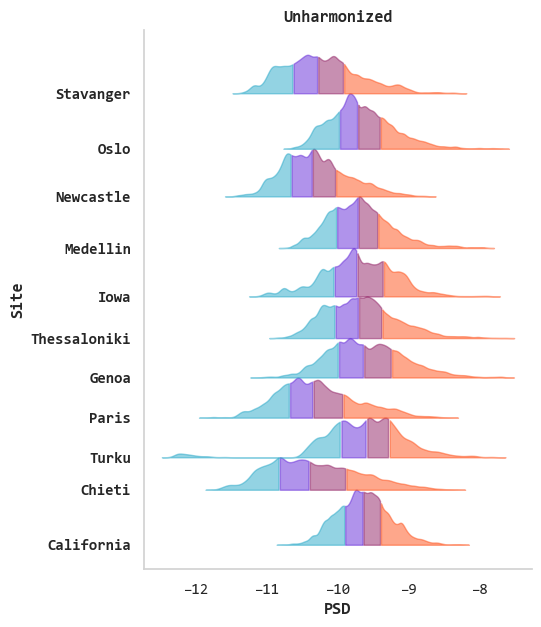

In [7]:
# Define the colors for each quantile
import cmasher as cmr

quantile_colors = cmr.take_cmap_colors('cmr.guppy_r', N=4, cmap_range=(0.1, 0.9), return_fmt='hex')

# Call the joyplot function
joyplot(unharm_psd, 'psd', 'center', quantile_colors, size = (5,7), title="Unharmonized", x_label="PSD", y_label="Site")

# reComBat psd

In [8]:
from reComBat import reComBat
import numpy as np


df = pivoted_df.copy()
df['age'] = df['age'].round(1)

# Splitting the data into train and test datasets

model = reComBat(parametric=False,
                 model='elastic_net',
                 config={'alpha': 1e-5},
                 n_jobs=7,
                 verbose=True)

# Creating a subset of df and renaming the column
covars = df.iloc[:, 1:5].copy()
covars.rename(columns={'age': 'age_numerical'}, inplace=True)
covars.center = covars.center.astype(str)
covars.group = covars.group.astype(str)
covars.gender = covars.gender.astype(str)


# Fitting the reComBat model on the train data
model.fit(data=df.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Transforming the train data using the fitted model
transformed_data = model.transform(data=df.iloc[:,5:], batches=covars.center,X=covars.drop(['center'],axis=1))

# Merging covariates and transformed train data
df_harmonized = pd.concat([df.iloc[:,:5], transformed_data], axis=1)
all_combat = df_harmonized.copy()


[reComBat] 2024-06-13 13:36:07,920 Starting to fot reComBat.
[reComBat] 2024-06-13 13:36:07,923 Fit the linear model.
[reComBat] 2024-06-13 13:36:08,258 Starting the empirical non-parametric optimisation.
100%|██████████| 11/11 [00:02<00:00,  4.13it/s]
[reComBat] 2024-06-13 13:36:10,935 Optimisation finished.
[reComBat] 2024-06-13 13:36:10,935 reComBat is fitted.
[reComBat] 2024-06-13 13:36:10,938 Starting to transform.
[reComBat] 2024-06-13 13:36:10,948 Transform finished.


# Descriptives psd

In [1]:
import pandas as pd 

path = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/all_psd_vectors.feather'
path = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/all_edlb_spect_ent_long.csv'


bandpowers_file = pd.read_csv(path)
#bandpowers_file = bandpowers_file[bandpowers_file['center'] != 'medellin']

# Drop rows where 'participant_id' starts with 'sta_D'
#bandpowers_file = bandpowers_file[~bandpowers_file['participant_id'].str.startswith('sta_D')]



# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
bandpowers_file['group'] = bandpowers_file['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})

bandpowers_file['group'] = bandpowers_file['group'].replace({'dlb': 'lbd', 'pdd': 'lbd'})
bandpowers_file['group'] = bandpowers_file['group'].replace({'sci': 'hc'})

bandpowers_file

,participant_id,group,center,age,gender,channel,permutation,sample_ent,approximate,svd_ent,...,beta_cf,beta_pw,beta_bw,extalphas_cf,extalphas_pw,extalphas_bw,exponent,offset,r_squared,error
0,chi_078,lbd,chieti,77.0,m,P7,0.674182,0.659042,0.656698,0.540875,...,15.760777,0.237290,1.000753,6.379569,1.667264,2.581701,2.131321,-7.849646,0.994687,0.050923
1,chi_073,lbd,chieti,66.0,m,O2,0.680522,0.725517,0.692581,0.609273,...,15.459215,0.917350,1.031173,7.745493,2.322641,1.561020,1.298698,-9.392536,0.979808,0.085024
2,sta_D20033,mci_ad,stavanger,81.0,m,O2,0.682157,0.680667,0.654237,0.610653,...,17.078456,1.157418,1.962014,8.380025,2.429753,1.928506,1.238761,-9.279056,0.972018,0.099429
3,fra_MCL6,mci_lbd,france,61.0,m,O1,0.684639,0.612982,0.634782,0.512794,...,NaN,NaN,NaN,7.633638,0.933295,6.835019,2.416969,-7.491902,0.972122,0.137982
4,chi_056,lbd,chieti,82.0,m,O1,0.685817,0.687548,0.674086,0.570948,...,NaN,NaN,NaN,6.345049,1.627773,2.606155,1.832666,-8.554309,0.989837,0.066803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16789,l_010010,hc,lemon,27.5,m,F7,0.938530,1.740404,1.311424,0.863254,...,25.932647,0.787425,8.000000,NaN,NaN,NaN,-0.062882,-11.029680,0.672642,0.163136
16790,l_010100,hc,lemon,27.5,m,T8,0.939731,1.318262,1.070037,0.830323,...,NaN,NaN,NaN,NaN,NaN,NaN,-3.844558,-14.253250,0.920322,0.209696
16791,l_010261,hc,lemon,22.5,m,F8,0.941313,1.626733,1.223408,0.852274,...,26.722935,0.864685,8.000000,NaN,NaN,NaN,-0.936487,-11.982601,0.885820,0.135735
16792,chi_072,lbd,chieti,76.0,f,Fz,0.942235,1.859842,1.378778,0.861225,...,13.650686,0.361600,7.016068,9.727090,0.893035,2.347743,0.454249,-9.424864,0.472591,0.159027


In [8]:
#bandpowers_file = bandpowers_file[bandpowers_file['center'] != 'lemon']

# Calculate the median psd values across channels per participant
median_psd = bandpowers_file.groupby(['participant_id', 'center', 'group', 'age', 'gender', 'frequency'])['psd'].median().reset_index()

# Pivot the dataframe
pivoted_df = median_psd.pivot(index=['participant_id', 'center', 'group', 'age', 'gender'], columns='frequency', values='psd').reset_index()

# Rename the frequency columns
pivoted_df.columns = ['participant_id', 'center', 'group', 'age', 'gender'] + ['frequency[{}]'.format(col) for col in pivoted_df.columns[5:]]

pivoted_df

,participant_id,center,group,age,gender,frequency[1.0],frequency[1.2000000000000002],frequency[1.4000000000000001],frequency[1.6],frequency[1.8],...,frequency[28.200000000000003],frequency[28.400000000000002],frequency[28.6],frequency[28.8],frequency[29.0],frequency[29.200000000000003],frequency[29.400000000000002],frequency[29.6],frequency[29.8],frequency[30.0]
0,c_hc1,california,hc,54.0,f,-9.010123,-8.967919,-8.949833,-9.015330,-9.068488,...,-9.789703,-9.812194,-9.848420,-9.846739,-9.868959,-9.868541,-9.871114,-9.872689,-9.875356,-9.886861
1,c_hc10,california,hc,59.0,f,-9.000371,-8.941203,-8.970201,-9.020352,-9.101820,...,-9.732240,-9.757948,-9.757734,-9.776569,-9.819564,-9.836277,-9.824384,-9.813606,-9.834690,-9.870767
2,c_hc18,california,hc,57.0,m,-9.299848,-9.259207,-9.269094,-9.326513,-9.429628,...,-10.571848,-10.608802,-10.600357,-10.627322,-10.611304,-10.633009,-10.644257,-10.647263,-10.679308,-10.654449
3,c_hc2,california,hc,50.0,f,-9.248021,-9.220313,-9.212376,-9.259367,-9.333134,...,-10.306332,-10.292239,-10.307189,-10.341865,-10.342621,-10.336865,-10.359679,-10.388050,-10.386304,-10.396278
4,c_hc20,california,hc,68.0,m,-9.140897,-9.106232,-9.097458,-9.132093,-9.165924,...,-10.079271,-10.062527,-10.113211,-10.111927,-10.106762,-10.091307,-10.088023,-10.098262,-10.067717,-10.093886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,sta_D20167,stavanger,mci_ad,74.0,m,-9.238961,-9.239836,-9.228118,-9.259390,-9.316229,...,-10.876583,-10.872060,-10.889032,-10.905700,-10.902270,-10.903189,-10.915511,-10.907631,-10.911273,-10.890934
701,sta_D20168,stavanger,mci_ad,70.0,f,-9.675921,-9.640287,-9.671377,-9.682521,-9.798791,...,-10.835293,-10.869166,-10.875111,-10.889647,-10.857254,-10.871522,-10.873425,-10.857148,-10.851398,-10.871472
702,sta_D20169,stavanger,mci_ad,72.0,m,-9.551655,-9.539130,-9.529131,-9.569005,-9.668463,...,-10.927394,-10.931414,-10.912310,-10.916418,-10.965757,-11.001154,-11.021961,-10.996781,-10.993401,-10.987570
703,sta_D20170,stavanger,mci_ad,76.0,f,-9.539571,-9.541411,-9.514712,-9.560055,-9.639041,...,-10.949349,-10.970881,-10.973267,-10.997712,-10.968713,-10.978943,-11.014142,-11.019589,-11.052422,-11.087419


In [7]:
import pandas as pd 

path = 'D:/data_analysis/papers_alberto/final_phd/derivatives_data/all_psd_vectors.feather'
bandpowers_file = pd.read_feather(path)
bandpowers_file.head(50)

# List of groups to exclude
excluded_values = ['sci']  # 5 subjects with Subjective cognitive impairment & FTD group


# posterior_roi = ["P3", "P4", "P7", "P8", "Pz", "PO3", "PO4", "Oz", "O1", "O2"]

# # Filter the dataset to exclude rows where 'group' is in the excluded values list
# bandpowers_file = bandpowers_file[(bandpowers_file['channel'].isin(posterior_roi))].reset_index(drop=True)


# Now, you can proceed with merging "PD-MCI" and "DLB-MCI" as you did in your example
#bandpowers_file['group'] = bandpowers_file['group'].replace({'mci_lb': 'mci_lbd', 'pd_mci': 'mci_lbd'})

#bandpowers_file['group'] = bandpowers_file['group'].replace({'dlb': 'lbd', 'pdd': 'lbd'})

#bandpowers_file = bandpowers_file[bandpowers_file['center'] != 'medellin']
bandpowers_file = bandpowers_file[bandpowers_file['age'] >= 46]
bandpowers_file


,participant_id,group,age,gender,channel,r_squared,psd,center,frequency,psd_fit,osc_fit,ap,osc,ap_fit
0,chi_078,dlb,77.0,m,P7,0.994687,-11.230047,chieti,29.6,-10.985441,4.651707e-14,-11.230047,-0.244606,-10.985441
1,chi_078,dlb,77.0,m,P7,0.994687,-11.197747,chieti,29.8,-10.991674,1.690772e-14,-11.197747,-0.206073,-10.991674
2,chi_078,dlb,77.0,m,P7,0.994687,-11.197308,chieti,30.0,-10.997865,6.058093e-15,-11.197308,-0.199443,-10.997865
3,chi_078,dlb,77.0,m,P7,0.994687,-11.165276,chieti,29.4,-10.979165,1.260370e-13,-11.165276,-0.186111,-10.979165
4,chi_078,dlb,77.0,m,P7,0.994687,-11.150414,chieti,29.2,-10.972847,3.360735e-13,-11.150414,-0.177567,-10.972847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2451773,m_071,pd,62.0,m,Fp1,0.624445,-9.147964,medellin,1.2,-9.201000,4.228572e-01,-9.570821,0.475893,-9.623857
2451774,m_071,pd,62.0,m,Fp1,0.624445,-9.147196,medellin,30.0,-9.432766,5.646774e-01,-9.711873,0.850247,-9.997443
2451775,m_071,pd,62.0,m,Fp1,0.624445,-9.146470,medellin,29.8,-9.415410,5.812565e-01,-9.727727,0.850196,-9.996667
2451776,m_071,pd,62.0,m,Fp1,0.624445,-9.146066,medellin,1.4,-9.196205,4.455427e-01,-9.591609,0.495681,-9.641748


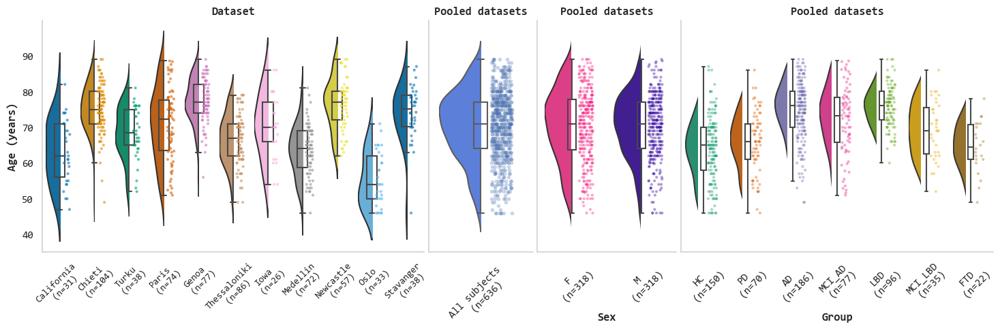

In [69]:
features_filtered = bandpowers_file

import matplotlib.pyplot as plt
import seaborn as sns

# Set figure and subplots
fig, axs = plt.subplots(1, 4, figsize=(18, 5), sharey=True, gridspec_kw={'width_ratios': [2.2, 0.6, 0.8, 1.8]})

# Third subplot: Raincloud plot for "age" with grouping by center
sns.set_style('white')
sns.set(font="Consolas")


# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')



palette = 'colorblind'


# Raincloud plot for "age" with grouping by center
ax3 = sns.violinplot(x="center", y="age", data=df, hue="center", dodge=False,
                     palette=palette,
                     scale="width", inner=None, ax=axs[0])  # Move to the first position (index 0)
xlim3 = ax3.get_xlim()
ylim3 = ax3.get_ylim()

for violin in ax3.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax3.transData))

sns.boxplot(x="center", y="age", data=df, saturation=1, showfliers=False,
            width=0.3, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[0])  # Move to the first position (index 0)

old_len_collections = len(ax3.collections)

sns.stripplot(x="center", y="age", data=df, hue="center", palette=palette, dodge=False,
              alpha=0.6, size=3, ax=axs[0])  # Move to the first position (index 0)

for dots in ax3.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[0].set_xlim(xlim3)
axs[0].set_ylim(ylim3)
axs[0].legend_.remove()
axs[0].set_title("Dataset", fontweight='bold')
axs[0].set_xlabel("")
axs[0].set_ylabel("Age (years)", fontweight='bold')
axs[0].set_facecolor('white')


group_counts = features_filtered.groupby('center')['participant_id'].nunique()
# Create new labels with count information
counts_group = [f"{group.upper()}\n (n={group_counts.loc[group]})" for group in df['center'].unique()]

#axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)

# Set the new labels to the x-axis
axs[0].set_xticklabels(counts_group, rotation=45,size=10)
# Set spines color
for spine in axs[0].spines.values():
    spine.set_edgecolor('lightgray')
    axs[0].spines['top'].set_visible(False)
    axs[0].spines['right'].set_visible(False)



axs[0].set_xticklabels([tick.get_text().capitalize() for tick in axs[0].get_xticklabels()])
# Set spines color
for spine in axs[0].spines.values():
    spine.set_edgecolor('lightgray')
    axs[0].spines['top'].set_visible(False)
    axs[0].spines['right'].set_visible(False)


# First subplot: Raincloud plot for "age" without grouping
sns.set_style('white')
sns.set(font="Consolas")
sns.set_palette("turbo")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])
palette = ["#F72585", "#3A0CA3"]# "#7209B7",

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')
# Raincloud plot for "age" without grouping
ax1 = sns.violinplot(y="age", data=df, inner=None, ax=axs[1], scale="width")  # Move to the last position (index 2)

xlim1 = ax1.get_xlim()
ylim1 = ax1.get_ylim()

for violin in ax1.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2, height, transform=ax1.transData))

sns.boxplot(y="age", data=df, saturation=1, showfliers=False,
            width=0.13, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[1])  # Move to the last position (index 2)

old_len_collections = len(ax1.collections)

sns.stripplot(y="age", data=df, dodge=False,
              alpha=0.3, size=4, ax=axs[1])  # Move to the last position (index 2)

for dots in ax1.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[1].set_xlim(xlim1)
axs[1].set_ylim(ylim1)
axs[1].set_ylabel("")
axs[1].set_xlabel("")
axs[1].set_title("Pooled datasets", fontweight='bold')
axs[1].set_facecolor('white')

group_counts = features_filtered['participant_id'].nunique()
# Create new labels with count information
counts_group = [f"All subjects \n (n={group_counts})"]


# Set spines color
for spine in axs[1].spines.values():
    spine.set_edgecolor('lightgray')
    axs[1].spines['top'].set_visible(False)
    axs[1].spines['right'].set_visible(False)


# Set the new labels to the x-axis
axs[1].set_xticklabels(counts_group, rotation=45)







# Raincloud plot for "age" with grouping by center
ax4 = sns.violinplot(x="gender", y="age", data=df, hue="gender", dodge=False,
                     palette=palette, scale="width", inner=None, ax=axs[2])  # Move to the first position (index 0)
xlim3 = ax4.get_xlim()
ylim3 = ax4.get_ylim()

for violin in ax4.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 2.1, height, transform=ax4.transData))

sns.boxplot(x="gender", y="age", data=df, saturation=1, showfliers=False,
            width=0.12, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[2])  # Move to the first position (index 0)

old_len_collections = len(ax4.collections)

sns.stripplot(x="gender", y="age", data=df, hue="gender", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[2])  # Move to the first position (index 0)

for dots in ax4.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[2].set_xlim(xlim3)
axs[2].set_ylim(ylim3)
axs[2].legend_.remove()
axs[2].set_title("Pooled datasets", fontweight='bold')
axs[2].set_xlabel("Sex", fontweight='bold')
axs[2].set_ylabel("")
axs[2].set_xticklabels(axs[2].get_xticklabels(), rotation=45)
axs[2].set_xticklabels([tick.get_text().capitalize() for tick in axs[2].get_xticklabels()])
axs[2].set_facecolor('white')


sex_counts = features_filtered.groupby('gender')['participant_id'].nunique()
# Create new labels with count information
counts_sex = [f"{gender.upper()}\n (n={sex_counts.loc[gender]})" for gender in df['gender'].unique()]

# Set the new labels to the x-axis
axs[2].set_xticklabels(counts_sex, rotation=45)
# Set spines color
for spine in axs[2].spines.values():
    spine.set_edgecolor('lightgray')
    axs[2].spines['top'].set_visible(False)
    axs[2].spines['right'].set_visible(False)





# Second subplot: Raincloud plot for "age" with grouping by gender
sns.set_style('white')
sns.set(font="Consolas")
palette = 'Dark2'

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Calculate the count of unique participant_id in each group
group_counts = df.groupby('group')['participant_id'].nunique()

# Raincloud plot for "age" with grouping by gender
ax2 = sns.violinplot(x="group", y="age", data=df, hue="group", dodge=False,
                     palette=palette,
                     scale="width", inner=None, ax=axs[3])  # Place in the middle position (index 1)

xlim2 = ax2.get_xlim()
ylim2 = ax2.get_ylim()

for violin in ax2.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width / 3, height, transform=ax2.transData))

sns.boxplot(x="group", y="age", data=df, saturation=1, showfliers=False,
            width=0.12, boxprops={'zorder': 3, 'facecolor': 'none'}, ax=axs[3])  # Place in the middle position (index 1)

old_len_collections = len(ax2.collections)

sns.stripplot(x="group", y="age", data=df, hue="group", palette=palette, dodge=False,
              alpha=0.4, size=3, ax=axs[3])  # Place in the middle position (index 1)

for dots in ax2.collections[old_len_collections:]:
    dots.set_offsets(dots.get_offsets() + np.array([0.2, 0]))

axs[3].set_xlim(xlim2)
axs[3].set_ylim(ylim2)
axs[3].set_title("Pooled datasets", fontweight='bold')
axs[3].set_xlabel("Group", fontweight='bold')
axs[3].legend_.remove()
axs[3].set_ylabel("")
axs[3].set_facecolor('white')

group_counts = features_filtered.groupby('group')['participant_id'].nunique()
# Create new labels with count information
counts_group = [f"{group.upper()}\n (n={group_counts.loc[group]})" for group in df['group'].unique()]

# Set the new labels to the x-axis
axs[3].set_xticklabels(counts_group, rotation=45)
# Set spines color
for spine in axs[3].spines.values():
    spine.set_edgecolor('lightgray')
    axs[3].spines['top'].set_visible(False)
    axs[3].spines['right'].set_visible(False)

#axs[3].set_xticklabels([tick.get_text().upper() for tick in axs[3].get_xticklabels()], rotation=45)

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.02, bottom=0.2)
#plt.savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1a.tiff', format='tiff', dpi=300)

plt.show()


In [14]:
# Use groupby, median, and quantile to calculate median and IQR for age in each group
group_stats = all_combat.groupby('group')['age'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Rename the columns for clarity
group_stats.columns = ['median_age', 'p25_age', 'p75_age']

# Print or display the results
print(group_stats)

         median_age  p25_age  p75_age
group                                
ad             76.0     70.0    80.00
ftd            64.5     61.0    70.75
hc             65.0     58.0    70.00
lbd            76.0     72.0    80.00
mci_ad         73.1     65.7    78.40
mci_lbd        69.0     62.5    75.50
pd             66.0     61.0    71.00


Descriptives

In [15]:
import pandas as pd

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = all_combat.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Convert 'gender' column to lowercase strings
df['gender'] = df['gender'].str.lower()

# Group the dataset by center and gender
#grouped_df = df.groupby(['center', 'gender'])
grouped_df = df.groupby(['center'])


# Calculate the mean and standard deviation of age for each center
summary_df = grouped_df.agg({'age': ['mean', 'std']})

# Reset the index to flatten the grouped columns
summary_df = summary_df.reset_index()

# Calculate the participant count, female count, and male count for each center
summary_df['participant_count'] = grouped_df['participant_id'].count().values
summary_df['female_count'] = grouped_df.apply(lambda x: (x['gender'] == 'f').sum()).values
summary_df['male_count'] = grouped_df.apply(lambda x: (x['gender'] == 'm').sum()).values

# Display Table 1
summary_df


center        age           participant_count female_count  \
                       mean       std                                  
0     california  63.387097  8.838090                31           17   
1         chieti  75.211538  6.823251               104           52   
2          genoa  77.246753  6.266359                77           54   
3           iowa  70.615385  8.818512                26           14   
4       medellin  63.402778  7.108138                72           24   
5      newcastle  76.421053  7.053235                57           15   
6           oslo  55.424242  7.458344                33           21   
7          paris  70.705405  9.993476                74           37   
8      stavanger  74.200000  7.490498                38           17   
9   thessaloniki  66.360465  7.019155                86           44   
10         turku  68.552632  7.081370                38           23   

   male_count  
               
0          14  
1          52  
2          23  
3          12  
4          48  
5          42  
6          12  
7          37  
8          21  
9          42  
10         15

In [9]:
# Read the dataset

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = all_combat.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

# Convert 'gender' column to lowercase strings
df['gender'] = df['gender'].str.lower()

# Calculate the overall count of males and females
overall_female_count = (df['gender'] == 'f').sum()
overall_male_count = (df['gender'] == 'm').sum()

# Calculate the overall mean and standard deviation of age
overall_age_mean = df['age'].mean()
overall_age_std = df['age'].std()

# Create a summary dataframe for the overall counts and statistics
summary_df = pd.DataFrame({
    'center': ['Overall'],
    'participant_count': [len(df)],
    'female_count': [overall_female_count],
    'male_count': [overall_male_count],
    'age_mean': [overall_age_mean],
    'age_std': [overall_age_std]
})

# Display the summary dataframe
summary_df


,center,participant_count,female_count,male_count,age_mean,age_std
0,Overall,636,318,318,70.259119,9.577031


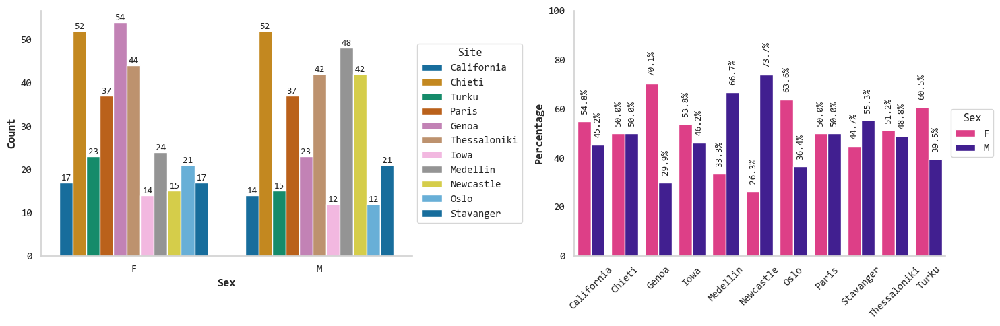

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'colorblind'

# Create a 1x2 grid layout
fig = plt.figure(figsize=(15, 5))
gs = GridSpec(1, 2, figure=fig)

# First subplot
ax1 = fig.add_subplot(gs[0, 0])

sns.countplot(x="gender", hue="center", data=df, palette=palette, ax=ax1)

ax1.set_title("")
ax1.set_xlabel("Sex", fontweight='bold')
ax1.set_ylabel("Count", fontweight='bold')
ax1.set_xticklabels([tick.get_text().capitalize() for tick in ax1.get_xticklabels()])
ax1.set_facecolor('white')


# Set spines color
for spine in ax1.spines.values():
    spine.set_edgecolor('lightgray')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

for p in ax1.patches:
    height = p.get_height()
    ax1.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', size=10)

# Move the legend outside
legend1 = ax1.legend(title='Site', bbox_to_anchor=(1, 0.5), loc='center left', facecolor='white')
# Capitalize legend items
for text in legend1.get_texts():
    text.set_text(text.get_text().capitalize())

# Second subplot
ax2 = fig.add_subplot(gs[0, 1])

palette = ["#F72585", "#3A0CA3"]# "#7209B7",

counts = df.groupby(['center', 'gender']).size().reset_index(name='count')
total_counts = counts.groupby('center')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_counts * 100

sns.barplot(x='center', y='percentage', hue='gender', data=counts, palette=palette, ax=ax2)

ax2.set_title("")
ax2.set_xlabel("")
ax2.set_ylabel("Percentage", fontweight='bold')
ax2.set_ylim(0, 100)
legend2 = ax2.legend(title='Sex', bbox_to_anchor=(1, 0.5), loc='center left', facecolor='white')
# Capitalize legend items
for text in legend2.get_texts():
    text.set_text(text.get_text().capitalize())

ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
ax2.set_xticklabels([tick.get_text().capitalize() for tick in ax2.get_xticklabels()])

ax2.set_facecolor('white')

# Set spines color
for spine in ax2.spines.values():
    spine.set_edgecolor('lightgray')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

for p in ax2.patches:
    height = p.get_height()
    ax2.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2, height+3),
                ha='center', va='bottom', size=10, rotation=90)

# Adjust spacing between subplots
fig.tight_layout()

# Save the combined figure
plt.show()  # Or savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1b.tiff', format='tiff', dpi=300)


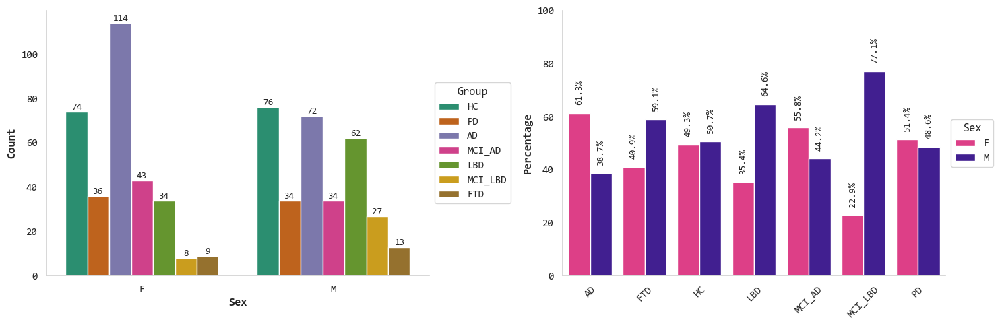

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set_style('white')
sns.set(font="Consolas")

# Read the dataset
# Sorting the DataFrame by participant_id and any other necessary columns
features_filtered = features_filtered.sort_values(by=['participant_id'])

# Keeping only the first row for each unique participant_id
df = features_filtered.drop_duplicates(subset='participant_id', keep='first')

palette = 'Dark2'

# Create a 1x2 grid layout
fig = plt.figure(figsize=(15, 5))
gs = GridSpec(1, 2, figure=fig)

# First subplot
ax1 = fig.add_subplot(gs[0, 0])

sns.countplot(x="gender", hue="group", data=df, palette=palette, ax=ax1)

ax1.set_title("")
ax1.set_xlabel("Sex", fontweight='bold')
ax1.set_ylabel("Count", fontweight='bold')
ax1.set_xticklabels([tick.get_text().upper() for tick in ax1.get_xticklabels()])
ax1.set_facecolor('white')


# Set spines color
for spine in ax1.spines.values():
    spine.set_edgecolor('lightgray')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

for p in ax1.patches:
    height = p.get_height()
    ax1.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', size=10)

# Move the legend outside
legend1 = ax1.legend(title='Group', bbox_to_anchor=(1, 0.5), loc='center left', facecolor='white')
# Capitalize legend items
for text in legend1.get_texts():
    text.set_text(text.get_text().upper())


palette = ["#F72585", "#3A0CA3"]# "#7209B7",

# Second subplot
ax2 = fig.add_subplot(gs[0, 1])

counts = df.groupby(['group', 'gender']).size().reset_index(name='count')
total_counts = counts.groupby('group')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_counts * 100

sns.barplot(x='group', y='percentage', hue='gender', data=counts, palette=palette, ax=ax2)

ax2.set_title("")
ax2.set_xlabel("")
ax2.set_ylabel("Percentage", fontweight='bold')
ax2.set_ylim(0, 100)
legend2 = ax2.legend(title='Sex', bbox_to_anchor=(1, 0.5), loc='center left', facecolor='white')
# Capitalize legend items
for text in legend2.get_texts():
    text.set_text(text.get_text().capitalize())

ax2.set_xticklabels([tick.get_text().upper() for tick in ax2.get_xticklabels()], rotation=45)

ax2.set_facecolor('white')


# Set spines color
for spine in ax2.spines.values():
    spine.set_edgecolor('lightgray')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

for p in ax2.patches:
    height = p.get_height()
    ax2.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2, height+3),
                ha='center', va='bottom', size=10, rotation=90)

# Adjust spacing between subplots
fig.tight_layout()

# Save the combined figure
plt.show()  # Or savefig('D:/data_analysis/papers_alberto/eeg_ndd_automl/figures/fig1b.tiff', format='tiff', dpi=300)


BATCH PCA

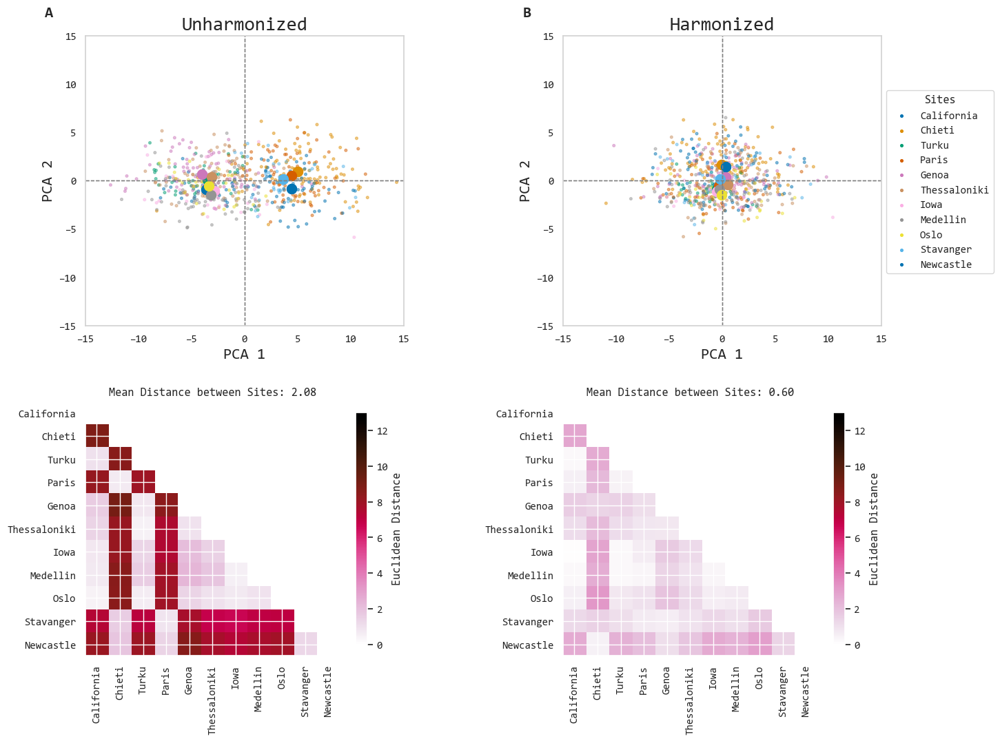

In [43]:
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
import numpy as np
import cmasher as cmr
import seaborn as sns
import matplotlib.pyplot as plt
# Set palette and labels
group_labels = {'california': 'California', 'chieti': 'Chieti', 'turku': 'Turku', 'paris': 'Paris', 'genoa': 'Genoa', 'thessaloniki':'Thessaloniki', 'iowa': 'Iowa', 'medellin':'Medellin', 'oslo': 'Oslo', 'stavanger':'Stavanger', 'newcastle':'Newcastle'}#'lemon': 'LEMON',

sns.set_style('white')
sns.set(font="Consolas")

cmap_r = cmr.flamingo_r

# Read dataframes and get labels for each center
X_unharmonized = pivoted_df.loc[:, ~pivoted_df.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_unharmonized = pivoted_df['center'].values

X_neurocombat = all_combat.loc[:, ~all_combat.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_neurocombat = all_combat['center'].values


palette = sns.color_palette('colorblind', len(group_labels))
colors = {group: palette[i] for i, group in enumerate(group_labels)}
from sklearn.decomposition import PCA

# Fit PCA
pca = PCA(n_components=2, random_state=42)
X_pca_unharmonized = pca.fit_transform(X_unharmonized)
X_pca_neurocombat = pca.fit_transform(X_neurocombat)

# Function to plot PCA results
def plot_pca(X_pca, labels, title, ax):
    ax.scatter(X_pca[:, 0], X_pca[:, 1], s=7, c=[colors[label] for label in labels], alpha=0.25)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.axvline(0, color='gray', linestyle='--', linewidth=1)
    
    # Set spines color
    for spine in ax.spines.values():
        spine.set_edgecolor('lightgray')
    
    for group in group_labels:
        ax.scatter([], [], s=7, c=[colors[group]], label=group_labels[group])
    
    for group in group_labels:
        group_indices = np.where(labels == group)[0]
        center_point = X_pca[group_indices, :].mean(axis=0)
        ax.scatter(center_point[0], center_point[1], s=100, c=[colors[group]], marker='o')
        
    ax.set_xlim(-15, 15)
    ax.set_ylim(-15, 15)
    ax.set_title(title, fontsize=20)
    ax.set_xlabel('PCA 1', fontsize=16)
    ax.set_ylabel('PCA 2', fontsize=16)
    ax.set_facecolor('white')
    ax.grid(False)


# Plot the PCA plots and the distance matrices
fig, axs = plt.subplots(2, 2, figsize=(11, 9))

plot_pca(X_pca_unharmonized, labels_unharmonized, 'Unharmonized', axs[0, 0])
plot_pca(X_pca_neurocombat, labels_neurocombat, 'Harmonized', axs[0, 1])

# Create a single legend for the first two subplots and place it to the right
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.05, 0.95), facecolor='white', ncol=1, title = "Sites")

# Calculate the Euclidean distances between center points for PCA
center_points_pca_unharmonized = {}
center_points_pca_neurocombat = {}
for group in group_labels:
    group_indices_unharmonized = np.where(labels_unharmonized == group)[0]
    group_indices_neurocombat = np.where(labels_neurocombat == group)[0]
    center_points_pca_unharmonized[group] = X_pca_unharmonized[group_indices_unharmonized, :].mean(axis=0)
    center_points_pca_neurocombat[group] = X_pca_neurocombat[group_indices_neurocombat, :].mean(axis=0)

distances_pca_unharmonized = euclidean_distances(list(center_points_pca_unharmonized.values()))
distances_pca_neurocombat = euclidean_distances(list(center_points_pca_neurocombat.values()))

distances_pca_unharmonized = np.tril(distances_pca_unharmonized, k=-1)
distances_pca_neurocombat = np.tril(distances_pca_neurocombat, k=-1)



ax1 = plt.subplot(221)
plot_pca(X_pca_unharmonized, labels_unharmonized, 'Unharmonized', ax1)

ax2 = plt.subplot(222)
plot_pca(X_pca_neurocombat, labels_neurocombat, 'Harmonized', ax2)

plt.subplot(223)
plt.imshow(distances_pca_unharmonized, cmap=cmap_r, vmax=13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Distance between Sites: {:.2f}'.format(np.mean(distances_pca_unharmonized)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=90)
plt.yticks(range(len(group_labels)), list(group_labels.values()))

plt.subplot(224)
plt.imshow(distances_pca_neurocombat, cmap=cmap_r, vmax=13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Distance between Sites: {:.2f}'.format(np.mean(distances_pca_neurocombat)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=90)
plt.yticks(range(len(group_labels)), list(group_labels.values()))


# Annotations for each subplot
annotations = ['A', 'B', '', '']

# Add annotations and adjust subplots' layout
for i, ax in enumerate(axs.flatten()):
    ax.text(-0.1, 1.1, annotations[i], transform=ax.transAxes, fontsize=16, fontweight='bold', va='top', ha='right')

# Adjust the spacing of the subplots
plt.subplots_adjust(top=1.03, bottom=0.0005, left=0.00009, right=1.05, hspace=0.2, wspace=0.5)


plt.show();


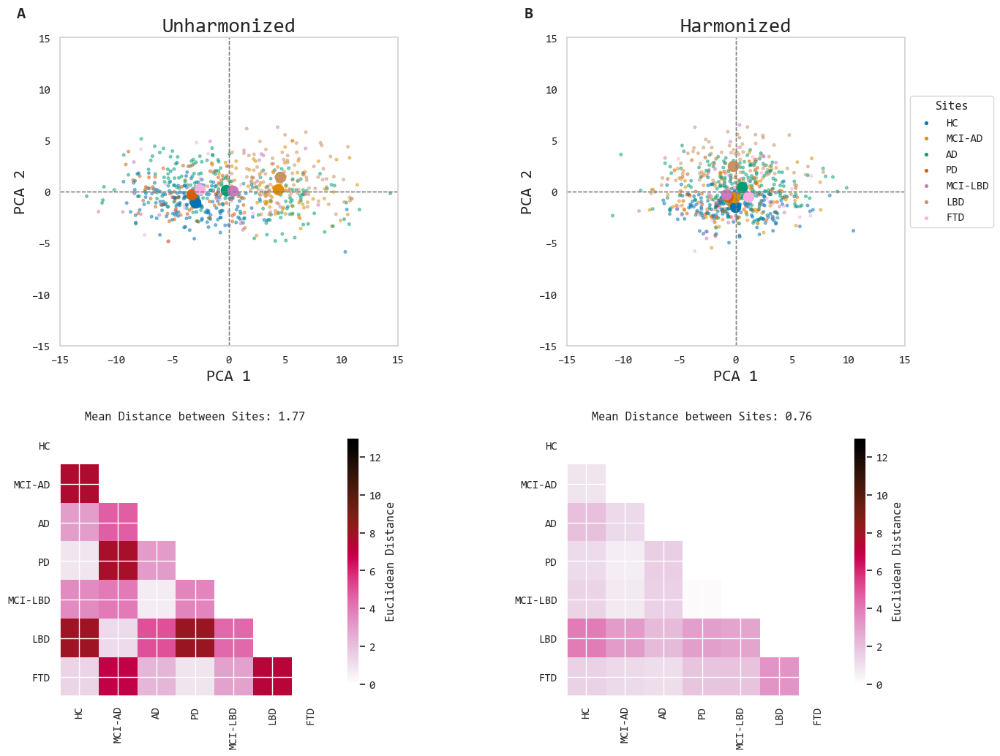

In [47]:
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
import numpy as np
import cmasher as cmr
import seaborn as sns
import matplotlib.pyplot as plt
# Set palette and labels
group_labels = {'hc':'HC','mci_ad':'MCI-AD', 'ad':'AD', 'pd':'PD','mci_lbd':'MCI-LBD','lbd':'LBD', 'ftd':'FTD'}

sns.set_style('white')
sns.set(font="Consolas")

cmap_r = cmr.flamingo_r

# Read dataframes and get labels for each center
X_unharmonized = pivoted_df.loc[:, ~pivoted_df.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_unharmonized = pivoted_df['group'].values

X_neurocombat = all_combat.loc[:, ~all_combat.columns.isin(['participant_id', 'center', 'age', 'gender', 'group'])].values
labels_neurocombat = all_combat['group'].values


palette = sns.color_palette('colorblind', len(group_labels))
colors = {group: palette[i] for i, group in enumerate(group_labels)}
from sklearn.decomposition import PCA

# Fit PCA
pca = PCA(n_components=2, random_state=42)
X_pca_unharmonized = pca.fit_transform(X_unharmonized)
X_pca_neurocombat = pca.fit_transform(X_neurocombat)

# Function to plot PCA results
def plot_pca(X_pca, labels, title, ax):
    ax.scatter(X_pca[:, 0], X_pca[:, 1], s=7, c=[colors[label] for label in labels], alpha=0.25)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.axvline(0, color='gray', linestyle='--', linewidth=1)
    
    # Set spines color
    for spine in ax.spines.values():
        spine.set_edgecolor('lightgray')
    
    for group in group_labels:
        ax.scatter([], [], s=7, c=[colors[group]], label=group_labels[group])
    
    for group in group_labels:
        group_indices = np.where(labels == group)[0]
        center_point = X_pca[group_indices, :].mean(axis=0)
        ax.scatter(center_point[0], center_point[1], s=100, c=[colors[group]], marker='o')
        
    ax.set_xlim(-15, 15)
    ax.set_ylim(-15, 15)
    ax.set_title(title, fontsize=20)
    ax.set_xlabel('PCA 1', fontsize=16)
    ax.set_ylabel('PCA 2', fontsize=16)
    ax.set_facecolor('white')
    ax.grid(False)


# Plot the PCA plots and the distance matrices
fig, axs = plt.subplots(2, 2, figsize=(11, 9))

plot_pca(X_pca_unharmonized, labels_unharmonized, 'Unharmonized', axs[0, 0])
plot_pca(X_pca_neurocombat, labels_neurocombat, 'Harmonized', axs[0, 1])

# Create a single legend for the first two subplots and place it to the right
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.05, 0.95), facecolor='white', ncol=1, title = "Sites")

# Calculate the Euclidean distances between center points for PCA
center_points_pca_unharmonized = {}
center_points_pca_neurocombat = {}
for group in group_labels:
    group_indices_unharmonized = np.where(labels_unharmonized == group)[0]
    group_indices_neurocombat = np.where(labels_neurocombat == group)[0]
    center_points_pca_unharmonized[group] = X_pca_unharmonized[group_indices_unharmonized, :].mean(axis=0)
    center_points_pca_neurocombat[group] = X_pca_neurocombat[group_indices_neurocombat, :].mean(axis=0)

distances_pca_unharmonized = euclidean_distances(list(center_points_pca_unharmonized.values()))
distances_pca_neurocombat = euclidean_distances(list(center_points_pca_neurocombat.values()))

distances_pca_unharmonized = np.tril(distances_pca_unharmonized, k=-1)
distances_pca_neurocombat = np.tril(distances_pca_neurocombat, k=-1)



ax1 = plt.subplot(221)
plot_pca(X_pca_unharmonized, labels_unharmonized, 'Unharmonized', ax1)

ax2 = plt.subplot(222)
plot_pca(X_pca_neurocombat, labels_neurocombat, 'Harmonized', ax2)

plt.subplot(223)
plt.imshow(distances_pca_unharmonized, cmap=cmap_r, vmax=13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Distance between Sites: {:.2f}'.format(np.mean(distances_pca_unharmonized)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=90)
plt.yticks(range(len(group_labels)), list(group_labels.values()))

plt.subplot(224)
plt.imshow(distances_pca_neurocombat, cmap=cmap_r, vmax=13)
plt.colorbar(label='Euclidean Distance', shrink=0.8)
plt.title('Mean Distance between Sites: {:.2f}'.format(np.mean(distances_pca_neurocombat)))

plt.xticks(range(len(group_labels)), list(group_labels.values()), rotation=90)
plt.yticks(range(len(group_labels)), list(group_labels.values()))


# Annotations for each subplot
annotations = ['A', 'B', '', '']

# Add annotations and adjust subplots' layout
for i, ax in enumerate(axs.flatten()):
    ax.text(-0.1, 1.1, annotations[i], transform=ax.transAxes, fontsize=16, fontweight='bold', va='top', ha='right')

# Adjust the spacing of the subplots
plt.subplots_adjust(top=1.03, bottom=0.0005, left=0.00009, right=1.05, hspace=0.2, wspace=0.5)


plt.show();


Rearray to long format df

In [50]:
import pandas as pd

# Assume you have a DataFrame called combat_psd
combat_psd = pd.melt(all_combat, id_vars=['participant_id', 'center', 'group', 'age', 'gender'], 
                     value_vars=all_combat.columns[5:], var_name='frequency', value_name='psd')

# Remove "frequency" word and brackets from the frequency column
combat_psd['frequency'] = combat_psd['frequency'].str.replace('frequency', '').str.rstrip('')
# Round the frequency values to 1 decimal place
combat_psd['frequency'] = combat_psd['frequency'].astype(float).round(1)
# Sort the dataframe by participant_id
combat_psd = combat_psd.sort_values(by=['participant_id', 'frequency'])
# Reset the index
combat_psd = combat_psd.reset_index(drop=True)

# Print the final unpivoted dataframe
print(combat_psd)


      participant_id      center group   age gender  frequency        psd
0              c_hc1  california    hc  54.0      f        1.0  -9.262776
1              c_hc1  california    hc  54.0      f        1.2  -9.223074
2              c_hc1  california    hc  54.0      f        1.4  -9.207956
3              c_hc1  california    hc  54.0      f        1.6  -9.220279
4              c_hc1  california    hc  54.0      f        1.8  -9.245544
...              ...         ...   ...   ...    ...        ...        ...
92851    sta_D20171K   stavanger    hc  65.0      f       29.2 -11.116745
92852    sta_D20171K   stavanger    hc  65.0      f       29.4 -11.135124
92853    sta_D20171K   stavanger    hc  65.0      f       29.6 -11.128259
92854    sta_D20171K   stavanger    hc  65.0      f       29.8 -11.133267
92855    sta_D20171K   stavanger    hc  65.0      f       30.0 -11.124254

[92856 rows x 7 columns]


Joyplot harmonized

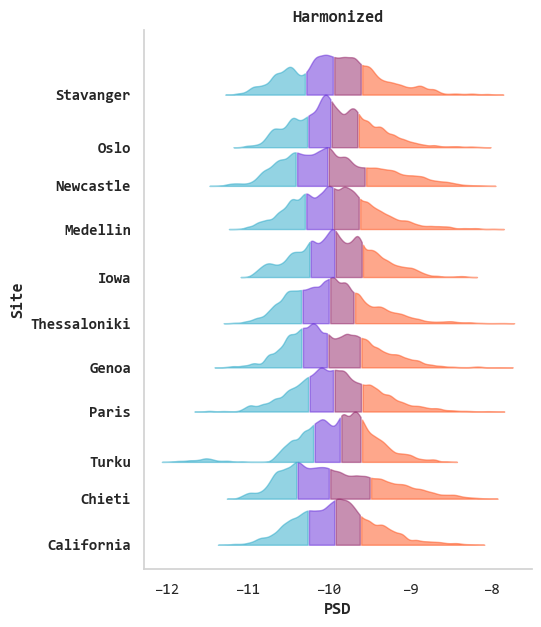

In [51]:
# Define the colors for each quantile
import cmasher as cmr

quantile_colors = cmr.take_cmap_colors('cmr.guppy_r', N=4, cmap_range=(0.1, 0.9), return_fmt='hex')

# Call the joyplot function
joyplot(combat_psd, 'psd', 'center', quantile_colors, size = (5,7), title="Harmonized", x_label="PSD", y_label="Site")

Histograms unharmonized vs harmonized

[reComBat] 2024-06-13 14:19:57,519 No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[reComBat] 2024-06-13 14:19:58,682 No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


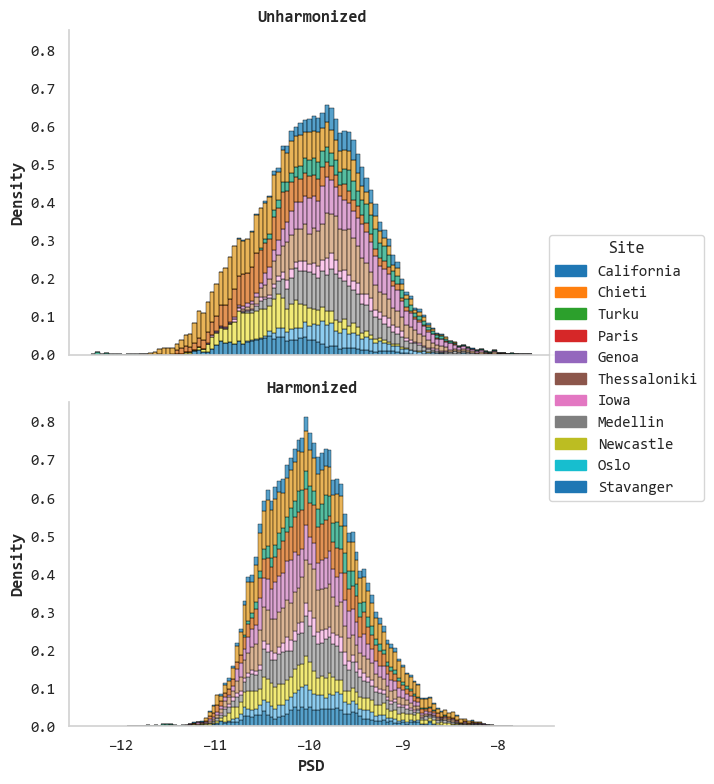

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming `unharm_psd` is the DataFrame we previously worked with and has been loaded with log10 transformed 'psd' values


sns.set(font="Consolas")

# Now create the subplots
fig, axes = plt.subplots(2, 1, figsize=(6, 8), sharex=True, sharey = True)

# First subplot without hue
sns.histplot(data=unharm_psd, x='psd', hue="center", element="bars", multiple='stack', fill=True, ax=axes[0], alpha = 0.666, palette="colorblind", bins=100, stat='density', edgecolor="black")
axes[0].set_title('Unharmonized', fontweight='bold')
axes[0].set_xlabel('PSD', fontweight='bold')
axes[0].set_ylabel('Density', fontweight='bold')
axes[0].set_facecolor('white')  # Set the background color
axes[0].legend(handles=None, labels=None, title='', loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
axes[0].grid(False)  # Turn off the grid
# Set spines color
for spine in axes[0].spines.values():
    spine.set_edgecolor('lightgray')
    axes[0].spines['top'].set_visible(False)
    axes[0].spines['right'].set_visible(False)



# Second subplot with hue by 'center'
sns.histplot(data=combat_psd, x='psd', hue="center", element="bars", 
             multiple='stack', fill=True, ax=axes[1], alpha = 0.666, palette="colorblind", bins=100, stat='density', edgecolor="black")
axes[1].set_title('Harmonized', fontweight='bold')
axes[1].set_xlabel('PSD', fontweight='bold')
axes[1].set_ylabel('Density', fontweight='bold')
axes[1].set_facecolor('white')  # Set the background color
axes[1].grid(False)  # Turn off the grid
axes[1].legend(handles=None, labels=None, title='', loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

# Set spines color
for spine in axes[1].spines.values():
    spine.set_edgecolor('lightgray')
    axes[1].spines['top'].set_visible(False)
    axes[1].spines['right'].set_visible(False)

# Creating custom handles for the legend
centers = unharm_psd['center'].unique().tolist()
palette = sns.color_palette("tab10", len(centers))
handles = [plt.Rectangle((0,0),1,1, color=palette[i]) for i in range(len(centers))]
labels = [element.capitalize() for element in centers]  # Ensure labels are a list

# Creating custom legend
fig.legend(handles=handles, labels=labels, title='Site', loc='right', bbox_to_anchor=(1.2, 0.53) , facecolor='white',  frameon=True, ncol=1)

plt.tight_layout()
plt.show()




Plot PSD batches by group

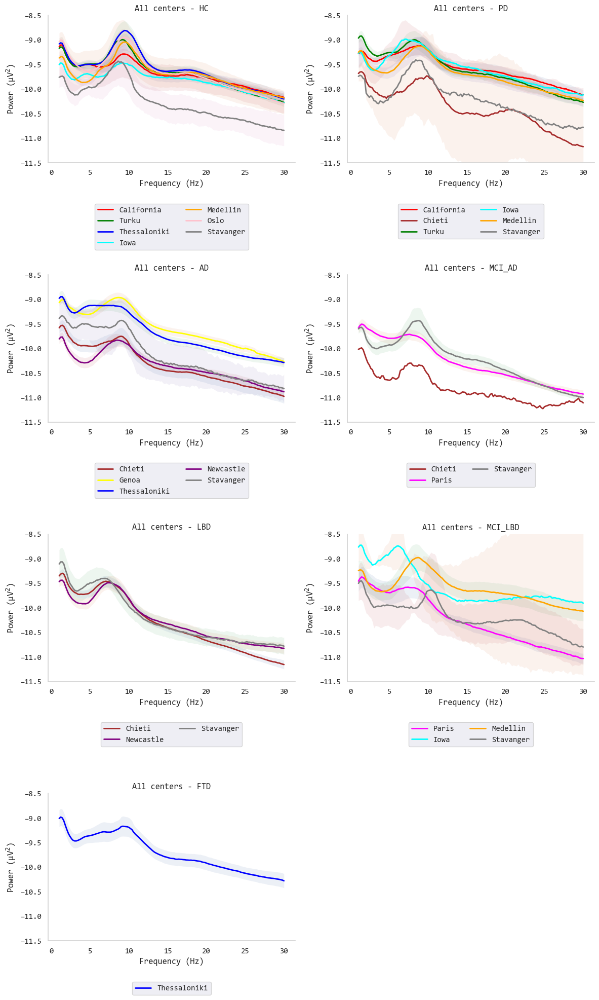

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_batches(df, color_dict=None, plot='psd', n_cols=5, dispersion='std'):
    group_categories = df['group'].unique()
    num_groups = len(group_categories)

    # Define the number of columns for subplots based on the number of groups and n_cols
    num_cols = min(num_groups, n_cols)
    num_rows = -(-num_groups // num_cols)  # Ceiling division to calculate rows needed

    # Create subplots based on the calculated rows and columns
    fig, axs = plt.subplots(figsize=(12, 20), ncols=num_cols, nrows=num_rows)
    axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

    sns.set_style("white")
    sns.set(font="Consolas")
    plt.rcParams["font.family"] = "Consolas"

    for idx, (group, ax) in enumerate(zip(group_categories, axs)):
        ax.set_title('All centers - ' + group.upper())
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power (μV$^2$)')
        ax.set_facecolor('white') 
        # Set spines color
        for spine in ax.spines.values():
            spine.set_edgecolor('lightgray')
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)


        center_df = df[df['group'] == group]

        centers = center_df['center'].unique()

        for center in centers:
            mean_center = center_df[center_df['center'] == center].groupby(['frequency'])[plot].mean()
            if dispersion == 'std':
                dispersion_values = center_df[center_df['center'] == center].groupby(['frequency'])[plot].std()
            elif dispersion == 'sem':
                dispersion_values = center_df[center_df['center'] == center].groupby(['frequency'])[plot].sem()
            else:
                raise ValueError("dispersion must be 'std' or 'sem'")

            # Assign a default color if color_dict is not provided or group is not in the list
            color = color_dict.get(center, 'gray') if color_dict else 'gray'

            ax.plot(mean_center.index, mean_center.values, linewidth=2, label=center.capitalize(), color=color)
            ax.fill_between(mean_center.index, mean_center.values - 1.96 * dispersion_values.values,
                            mean_center.values + 1.96 * dispersion_values.values, alpha=0.1)  # Plot dispersion (either std or sem)

        ax.set_ylim(-11.5,-8.5)
        ax.legend(loc='upper center', ncol=2, bbox_to_anchor=(0.5, -0.25))
        

    # Hide empty subplots
    for idx in range(num_groups, len(axs)):
        fig.delaxes(axs[idx])


    plt.tight_layout()
    plt.show()





# Call the function with your DataFrame and specified parameters
batch_color_dict = {'california': 'red', 'turku': 'green', 'thessaloniki': 'blue',
              'iowa': 'cyan',  'medellin': 'orange', 
              'oslo': 'pink', 'paris': 'magenta', 'genoa': 'yellow', 'chieti':'brown', 'newcastle': 'purple'}  # 'lemon': 'purple',Replace with your colors

# Example usage with dispersion as SEM
plot_batches(unharm_psd, color_dict=batch_color_dict, n_cols=2, dispersion='sem');


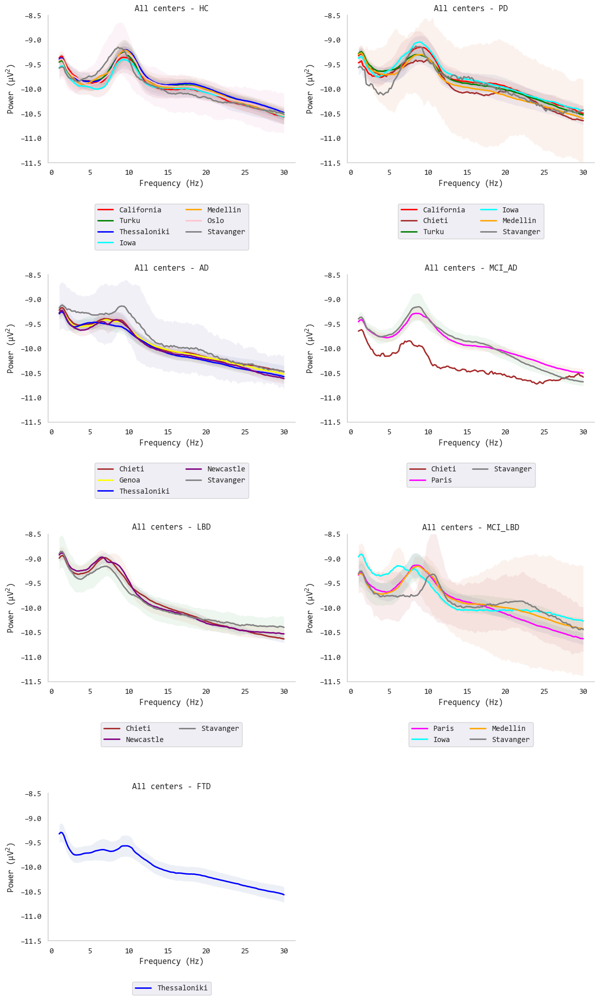

In [96]:
plot_batches(combat_psd, color_dict=batch_color_dict, n_cols=2, dispersion='sem');


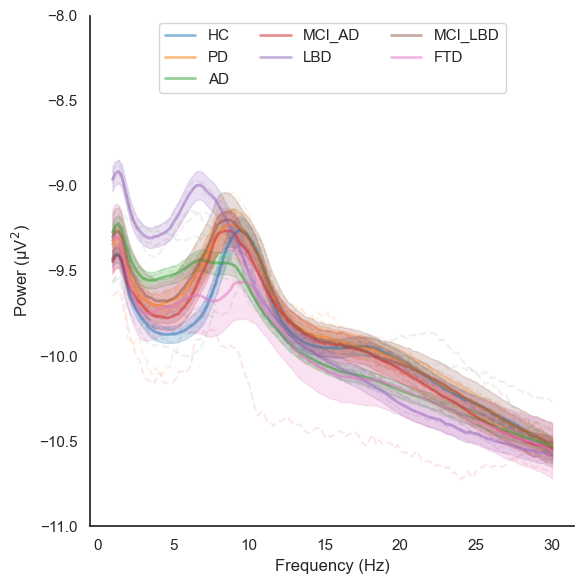

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_channel_power(df):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")

    # Get unique groups and assign colors from the sns palette
    group_categories = df['group'].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df['group'] == group]
        mean_group = group_df.groupby(['frequency'])['psd'].mean()
        std_group = group_df.groupby(['frequency'])['psd'].std()
        num_samples = group_df.groupby(['frequency'])['psd'].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df['center'].unique()
        for center in centers:
            center_mean = group_df[group_df['center'] == center].groupby(['frequency'])['psd'].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.1)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(-11, -8)
    plt.legend(loc='upper center', ncol=3)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()


plot_channel_power(combat_psd)


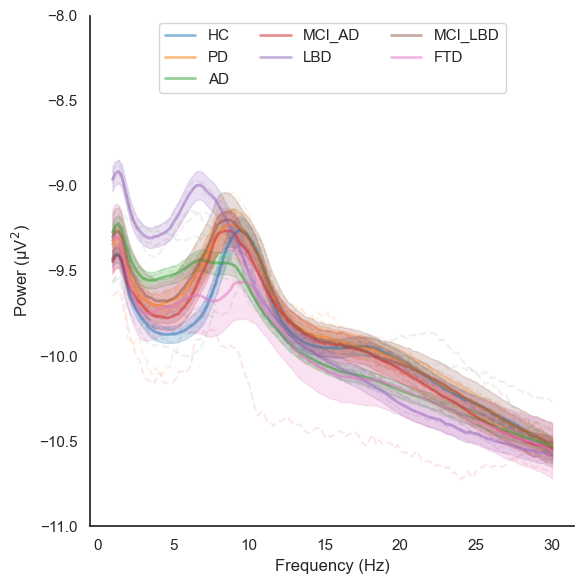

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_channel_power(df):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")

    # Get unique groups and assign colors from the sns palette
    group_categories = df['group'].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df['group'] == group]
        mean_group = group_df.groupby(['frequency'])['psd'].mean()
        std_group = group_df.groupby(['frequency'])['psd'].std()
        num_samples = group_df.groupby(['frequency'])['psd'].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df['center'].unique()
        for center in centers:
            center_mean = group_df[group_df['center'] == center].groupby(['frequency'])['psd'].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.1)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(-11, -8)
    plt.legend(loc='upper center', ncol=3)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()


plot_channel_power(combat_psd)


GROUP DIFFERENCES PLOT WITH TICKS

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
import matplotlib.ticker as ticker

def permutation_test(x, y, n_permutations=1000):
    """ Perform a permutation test to compute the p-value """
    observed_diff = np.abs(np.mean(x) - np.mean(y))
    combined = np.concatenate([x, y])
    count = 0

    for _ in range(n_permutations):
        np.random.shuffle(combined)
        new_x = combined[:len(x)]
        new_y = combined[len(x):]
        new_diff = np.abs(np.mean(new_x) - np.mean(new_y))
        count += (new_diff >= observed_diff)

    p_value = count / n_permutations
    return p_value

def plot_group_diffs(df, plot='psd', fig_title = ''):
    group_categories = df['group'].unique()
    pairwise_comparisons = set()  # Use a set to keep track of unique comparisons

    # Determine the grid layout based on the number of pairwise comparisons
    num_pairs = 0
    num_cols = 3  # Fixed number of columns for each row
    num_rows = 0

    for group1 in group_categories:
        for group2 in group_categories:
            if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
                pairwise_comparisons.add((group1, group2))
                num_pairs += 1

    # Calculate the number of rows needed based on the number of pairs
    num_rows = -(-num_pairs // num_cols)  # Ceiling division to calculate rows needed

    fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows)
    axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

    plt.rcParams['font.family'] = 'Consolas'
    sns.set(font="Consolas")

    # Create a color map from Seaborn palette
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
        ax = axs[i-1]  # Index is zero-based

        group1_data = df[df['group'] == group1][plot]
        group2_data = df[df['group'] == group2][plot]

        mean_group1 = group1_data.groupby(df['frequency']).mean()
        mean_group2 = group2_data.groupby(df['frequency']).mean()

        sem_group1 = group1_data.groupby(df['frequency']).sem()
        sem_group2 = group2_data.groupby(df['frequency']).sem()


        # Calculate p-values for each frequency point using permutation test
        p_vals = []
        for freq in mean_group1.index:
            group1_freq_data = group1_data[df['frequency'] == freq]
            group2_freq_data = group2_data[df['frequency'] == freq]
            p_value = permutation_test(group1_freq_data, group2_freq_data, n_permutations=1000)
            p_vals.append(p_value)

        # Correct p-values using fdr_by multiple testing correction
        _, p_vals_corrected, _, _ = multipletests(p_vals, method='fdr_by', alpha = 0.01)

        group1_color = color_map[group1]
        group2_color = color_map[group2]

        ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=group1_color)
        ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=group2_color)

        # Shade SEM for each group
        ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=group1_color)
        ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=group2_color)

        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power (μV$^2$)')
        ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
        ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6)
        if plot == 'osc_fit':
            ax.set_ylim(-0.16, 1.2)
            # Mask areas where p-value < 0.05 after correction with gray color
            for j in range(len(p_vals_corrected)):
                if p_vals_corrected[j] < 0.01:
                    ax.fill_between([mean_group1.index[j]], -0.19, -0.06, alpha=0.3, color='gray')
        else:
            ax.set_ylim(-11.0, -8.5)
            # Mask areas where p-value < 0.05 after correction with gray color
            for j in range(len(p_vals_corrected)):
                if p_vals_corrected[j] < 0.01:
                    ax.fill_between([mean_group1.index[j]], -11.02, -10.82, alpha=0.3, color='gray')
        
        ax.set_title(' ', size = 20)#f'{group1.upper()} vs {group2.upper()}')
        ax.legend(loc='upper center', ncol=2, bbox_to_anchor=(0.52, 1.1), frameon=False, fontsize=9)
        # Set the spines to only show the bottom and left axis
        ax.grid(False)  # Turn off the grid
        ax.set_facecolor('white')
        # Set spines color
        for spine in ax.spines.values():
            spine.set_edgecolor('k')
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

    # Hide empty subplots
    for i in range(num_pairs, num_cols * num_rows):
        fig.delaxes(axs[i])


    plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # Adjust the rect parameter as needed
    plt.suptitle(fig_title, size=20)
    plt.show()



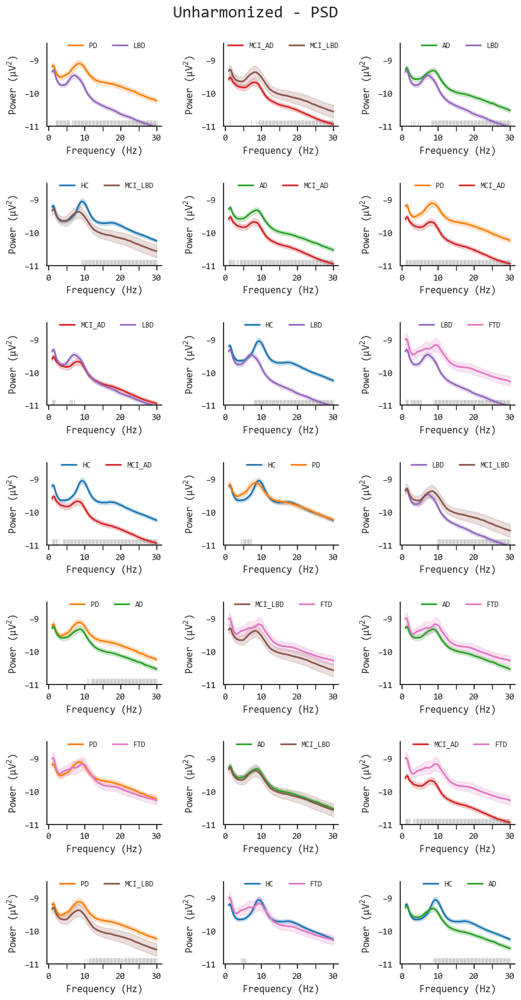

In [99]:
plot_group_diffs(unharm_psd, plot='psd', fig_title='Unharmonized - PSD')

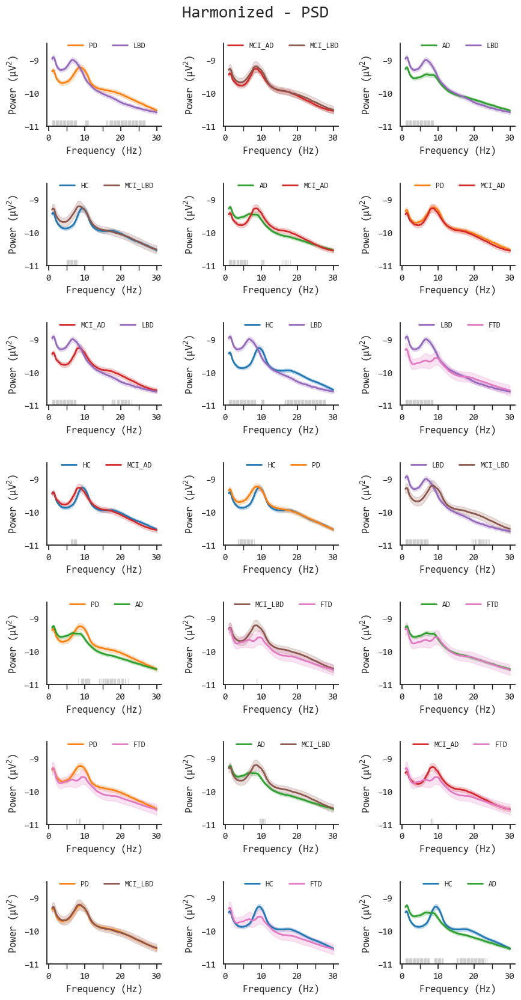

In [98]:
# Example usage with a custom plot parameter
plot_group_diffs(combat_psd, plot='psd', fig_title='Harmonized - PSD')


In [ ]:
# ### NO PERMUTATION
# import matplotlib.pyplot as plt
# import seaborn as sns
# from scipy.stats import ttest_ind
# from statsmodels.stats.multitest import multipletests
# import matplotlib.ticker as ticker


# def plot_group_diffs(df, plot='psd', fig_title=''):
#     group_categories = df['group'].unique()
#     pairwise_comparisons = set()  # Use a set to keep track of unique comparisons

#     # Determine the grid layout based on the number of pairwise comparisons
#     num_pairs = 0
#     num_cols = 3  # Fixed number of columns for each row
#     num_rows = 0

#     for group1 in group_categories:
#         for group2 in group_categories:
#             if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
#                 pairwise_comparisons.add((group1, group2))
#                 num_pairs += 1

#     # Calculate the number of rows needed based on the number of pairs
#     num_rows = -(-num_pairs // num_cols)  # Ceiling division to calculate rows needed

#     fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows)
#     axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

#     plt.rcParams['font.family'] = 'Consolas'
#     sns.set(font="Consolas")

#     # Create a color map from Seaborn palette
#     palette = sns.color_palette("tab10", len(group_categories))
#     color_map = dict(zip(group_categories, palette))

#     for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
#         ax = axs[i-1]  # Index is zero-based

#         group1_data = df[df['group'] == group1][plot]
#         group2_data = df[df['group'] == group2][plot]

#         mean_group1 = group1_data.groupby(df['frequency']).mean()
#         mean_group2 = group2_data.groupby(df['frequency']).mean()

#         sem_group1 = group1_data.groupby(df['frequency']).sem()
#         sem_group2 = group2_data.groupby(df['frequency']).sem()


#         # Calculate p-values for each frequency point
#         p_vals = []
#         for freq in mean_group1.index:
#             p_value = ttest_ind(group1_data[df['frequency'] == freq], group2_data[df['frequency'] == freq])[1]
#             p_vals.append(p_value)

#         # Correct p-values using fdr_by multiple testing correction
#         _, p_vals_corrected, _, _ = multipletests(p_vals, method='fdr_by', alpha = 0.01)

#         group1_color = color_map[group1]
#         group2_color = color_map[group2]

#         ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=group1_color)
#         ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=group2_color)

#         # Shade SEM for each group
#         ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=group1_color)
#         ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=group2_color)


#         # Mask areas where p-value < 0.05 after correction with gray color
#         for j in range(len(p_vals_corrected)):
#             if p_vals_corrected[j] < 0.01:
#                 ax.fill_between([mean_group1.index[j]], -11.02, -10.82, alpha=0.3, color='gray')

#         ax.set_xlabel('Frequency (Hz)')
#         ax.set_ylabel('Power (μV$^2$)')
#         ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
#         ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6)
#         if plot == 'osc_fit':
#             ax.set_ylim(-0.05, 1.5)
#         else:
#             ax.set_ylim(-11.0, -8)
#         ax.set_title(' ', size = 20)#f'{group1.upper()} vs {group2.upper()}')
#         ax.legend(loc='upper center', ncol=2, bbox_to_anchor=(0.52, 1.1), frameon=False, fontsize=9)
#         # Set the spines to only show the bottom and left axis
#         ax.set_facecolor('white')  # Set the background color
#         ax.grid(False)  # Turn off the grid
#         ax.set_facecolor('white')
#         # Set spines color
#         for spine in ax.spines.values():
#             spine.set_edgecolor('lightgray')
#             ax.spines['top'].set_visible(False)
#             ax.spines['right'].set_visible(False)

#     # Hide empty subplots
#     for i in range(num_pairs, num_cols * num_rows):
#         fig.delaxes(axs[i])


#     plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # Adjust the rect parameter as needed
#     plt.suptitle(fig_title, size=20)
#     plt.show()


# # Example usage with a custom plot parameter
# plot_group_diffs(combat_psd, plot='psd', fig_title='Harmonized - PSD')


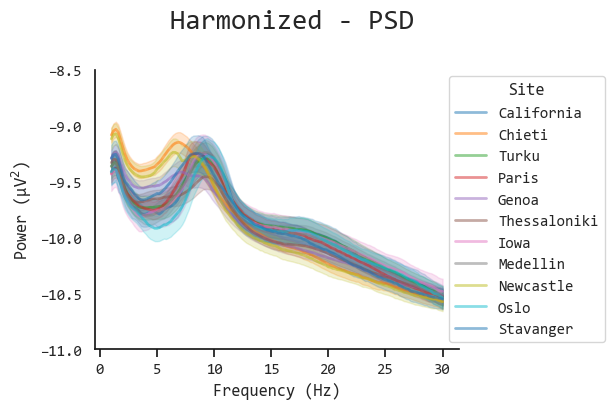

In [105]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import numpy as np

def plot_channel_power(df, fig_title= '', plot_variable = '', group_by = '', ylim = (-11, -8.5), legend_title = ''):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")
    sns.set(font="Consolas")
    sns.set_style(rc={'axes.facecolor': 'white'})

 
    # Get unique groups and assign colors from the sns palette
    group_categories = df[group_by].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df[group_by] == group]
        mean_group = group_df.groupby(['frequency'])[plot_variable].mean()
        std_group = group_df.groupby(['frequency'])[plot_variable].std()
        num_samples = group_df.groupby(['frequency'])[plot_variable].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.capitalize(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df[group_by].unique()
        for center in centers:
            center_mean = group_df[group_df[group_by] == center].groupby(['frequency'])[plot_variable].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.2)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(ylim)
    plt.grid(False)  # Turn off the grid

    plt.legend(loc='center right', bbox_to_anchor=(1.42, 0.5), ncol=1,frameon=True, title= legend_title)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines
    # Set the spines color and visibility
    ax = plt.gca()  # Get the current axes
    for spine in ax.spines.values():
        spine.set_edgecolor('k')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_minor_locator(ticker.FixedLocator([5, 15, 25]))
    ax.tick_params(direction="out", which='both', bottom=True, color='k', length=6)
    plt.suptitle(fig_title, size=20)
    plt.tight_layout(rect=[0, 0.3, 1, 0.99])  # Adjust the rect parameter as needed

    plt.show()


plot_channel_power(combat_psd, fig_title= 'Harmonized - PSD', plot_variable='psd', group_by='center', legend_title='Site')


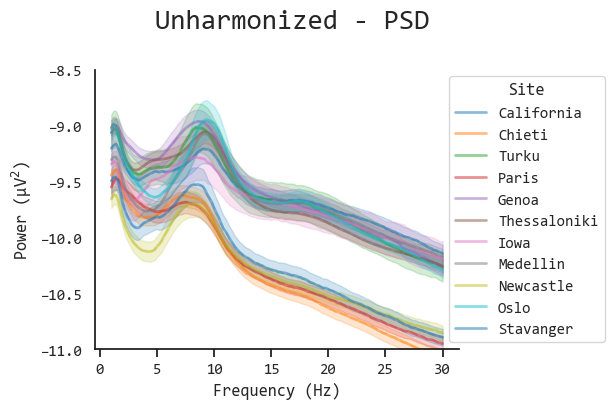

In [107]:
plot_channel_power(unharm_psd, fig_title= 'Unharmonized - PSD', plot_variable='psd', group_by='center', legend_title='Site')


# FOOOF on harmonized psd

FOOOF FITTING ALL PSDs

In [109]:
import pandas as pd
import numpy as np
from fooof import FOOOF
from fooof.bands import Bands
from fooof.analysis import get_band_peak_fm
# Initialize lists to store the data
features_list = []
fooof_params_list = []

# Define frequency range and bands
freqs = np.unique(bandpowers_file['frequency'])
freq_range = [1, 30]
bands = Bands({'extalpha': [5, 14], 'beta': [13, 30]})

# Iterate over each row in the pivoted DataFrame
for idx, row in all_combat.iterrows():
    participant_id = row['participant_id']
    center = row['center']
    group = row['group']
    age = row['age']
    gender = row['gender']
    
    # Retrieve PSD and frequency values
    psd_log10 = row[5:].values  # Assuming PSD values start from the 6th column

    # Convert log10 scaled PSD back to linear space for FOOOF
    psd_linear = 10 ** psd_log10

    # Check and handle any NaNs or Infs in the linear PSD data
    #psd_linear = np.nan_to_num(psd_linear, nan=1e-10, posinf=1e-10, neginf=1e-10)

    # Initialize and fit the FOOOF model
    fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
    fm.fit(freqs, psd_linear, freq_range)


    psd_fit = fm.fooofed_spectrum_
    ap_fit = fm._ap_fit
    spect_flat = fm._spectrum_flat
    aperiodic = fm._spectrum_peak_rm

    if psd_fit is not None:
        for freq in freqs:
            features_dict = {
                'participant_id': participant_id,
                'center': center,
                'group': group,
                'age': age,
                'gender': gender,
                'frequency': freq,
                'psd': np.log10(psd_linear[freqs==freq][0]),
                'psd_fit': psd_fit[freqs==freq][0],
                'osc': spect_flat[freqs==freq][0],
                'osc_fit': fm._peak_fit[freqs==freq][0],
                'ap': aperiodic[freqs==freq][0],
                'ap_fit': ap_fit[freqs==freq][0]
            }
            features_list.append(features_dict)
        
        # Extract specific parameters
        betas = get_band_peak_fm(fm, bands.beta)
        extalphas = get_band_peak_fm(fm, bands.extalpha)
        aperiodic_params = fm.get_params('aperiodic_params')
        fit_params = [fm.get_params('r_squared'), fm.get_params('error')]

        fooof_params_dict = {
            'participant_id': participant_id,
            'center': center,
            'group': group,
            'age': age,
            'gender': gender,
            'beta_cf': betas[0],
            'beta_pw': betas[1],
            'beta_bw': betas[2],
            'extalphas_cf': extalphas[0],
            'extalphas_pw': extalphas[1],
            'extalphas_bw': extalphas[2],
            'exponent': aperiodic_params[1],
            'offset': aperiodic_params[0],
            'r_squared': fit_params[0],
            'error': fit_params[1]}
        fooof_params_list.append(fooof_params_dict)

# Create DataFrames from the lists
features_df = pd.DataFrame(features_list)
fooof_params_df = pd.DataFrame(fooof_params_list)


## FOOOF from unharmonized data

In [129]:
import pandas as pd
import numpy as np
from fooof import FOOOF
from fooof.bands import Bands
from fooof.analysis import get_band_peak_fm
# Initialize lists to store the data
features_list = []
fooof_params_list = []

# Define frequency range and bands
freqs = np.unique(unharm_psd['frequency'])
freq_range = [1, 30]
bands = Bands({'extalpha': [5, 14], 'beta': [13, 30]})

# Iterate over each row in the pivoted DataFrame
for idx, row in pivoted_df.iterrows():
    participant_id = row['participant_id']
    center = row['center']
    group = row['group']
    age = row['age']
    gender = row['gender']
    
    # Retrieve PSD and frequency values
    psd_log10 = row[5:].values  # Assuming PSD values start from the 6th column

    # Convert log10 scaled PSD back to linear space for FOOOF
    psd_linear = 10 ** psd_log10

    # Check and handle any NaNs or Infs in the linear PSD data
    #psd_linear = np.nan_to_num(psd_linear, nan=1e-10, posinf=1e-10, neginf=1e-10)

    # Initialize and fit the FOOOF model
    fm = FOOOF(peak_width_limits=[1, 8], min_peak_height=0.05, max_n_peaks=6)
    fm.fit(freqs, psd_linear, freq_range)


    psd_fit = fm.fooofed_spectrum_
    ap_fit = fm._ap_fit
    spect_flat = fm._spectrum_flat
    aperiodic = fm._spectrum_peak_rm

    if psd_fit is not None:
        for freq in freqs:
            features_dict = {
                'participant_id': participant_id,
                'center': center,
                'group': group,
                'age': age,
                'gender': gender,
                'frequency': freq,
                'psd': np.log10(psd_linear[freqs==freq][0]),
                'psd_fit': psd_fit[freqs==freq][0],
                'osc': spect_flat[freqs==freq][0],
                'osc_fit': fm._peak_fit[freqs==freq][0],
                'ap': aperiodic[freqs==freq][0],
                'ap_fit': ap_fit[freqs==freq][0]
            }
            features_list.append(features_dict)
        
        # Extract specific parameters
        betas = get_band_peak_fm(fm, bands.beta)
        extalphas = get_band_peak_fm(fm, bands.extalpha)
        aperiodic_params = fm.get_params('aperiodic_params')
        fit_params = [fm.get_params('r_squared'), fm.get_params('error')]

        fooof_params_dict = {
            'participant_id': participant_id,
            'center': center,
            'group': group,
            'age': age,
            'gender': gender,
            'beta_cf': betas[0],
            'beta_pw': betas[1],
            'beta_bw': betas[2],
            'extalphas_cf': extalphas[0],
            'extalphas_pw': extalphas[1],
            'extalphas_bw': extalphas[2],
            'exponent': aperiodic_params[1],
            'offset': aperiodic_params[0],
            'r_squared': fit_params[0],
            'error': fit_params[1]}
        fooof_params_list.append(fooof_params_dict)

# Create DataFrames from the lists
features_df_unharm = pd.DataFrame(features_list)
fooof_params_df_unharm = pd.DataFrame(fooof_params_list)


In [59]:
good_r_squared_df = fooof_params_df[fooof_params_df['r_squared'] >= 0.8]

# Calculating the median of extalphas_cf, extalphas_pw, and extalphas_bw for each group
group_medians = good_r_squared_df.groupby('group')[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].median()

# Replacing missing values in the dataset with the corresponding group median
for col in ['extalphas_cf', 'extalphas_pw', 'extalphas_bw']:
    good_r_squared_df[col] = good_r_squared_df.groupby('group')[col].transform(lambda x: x.fillna(x.median()))

# # Checking if the missing values are replaced
# missing_values_after_replacement = good_r_squared_df[['extalphas_cf', 'extalphas_pw', 'extalphas_bw']].isnull().sum()


good_r_squared_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/specparams_lmm.csv', index=False)

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_12104\2227738862.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  good_r_squared_df[col] = good_r_squared_df.groupby('group')[col].transform(lambda x: x.fillna(x.median()))
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_12104\2227738862.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  good_r_squared_df[col] = good_r_squared_df.groupby('group')[col].transform(lambda x: x.fillna(x.median()))
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_1210

In [55]:
fooof_params_df# Filter the DataFrame to find participants with r_squared < 0.8
low_r_squared_df = fooof_params_df[fooof_params_df['r_squared'] < 0.8]

# Display the filtered DataFrame
low_r_squared_df

,participant_id,center,group,age,gender,beta_cf,beta_pw,beta_bw,extalphas_cf,extalphas_pw,extalphas_bw,exponent,offset,r_squared,error
48,chi_019,chieti,ad,74.0,f,25.438372,0.342627,8.000000,NaN,NaN,NaN,0.270977,-8.811764,0.603403,0.086087
183,fra_MA21,france,mci_ad,71.1,f,18.801729,0.430091,3.079006,9.576071,0.100507,1.834632,0.280237,-9.912900,0.761231,0.067223
344,gre_021,greece,ad,79.0,m,NaN,NaN,NaN,8.562168,0.423179,2.756765,0.219454,-9.737558,0.714117,0.067435
364,gre_041,greece,hc,77.0,f,21.881565,0.234512,5.731076,10.537878,0.530817,1.273133,0.129820,-9.917103,0.627673,0.068984
377,gre_055,greece,hc,67.0,m,15.728300,0.463219,5.401985,11.420708,0.803929,1.910131,0.258085,-9.589895,0.739981,0.102995
481,m_046,medellin,pd,72.0,m,23.951441,0.508149,2.948157,10.213996,0.307477,2.158285,0.148371,-9.710788,0.764743,0.058743
551,n_CAT080,newcastle,ad,87.0,m,19.123421,0.172036,6.321223,8.665391,0.418647,2.003654,0.253268,-9.754432,0.679961,0.054369
587,o_091,oslo,hc,51.0,f,18.515202,0.515876,6.559139,NaN,NaN,NaN,0.157067,-9.859584,0.783619,0.076668
591,o_097,oslo,hc,56.0,m,NaN,NaN,NaN,9.625455,0.706330,2.188663,0.324674,-9.593429,0.779757,0.089741


In [112]:
features_df.to_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/fooof_vectors_multisitecombat.csv', index=False)

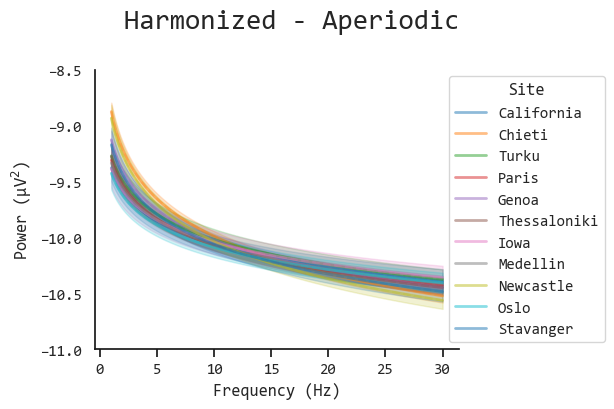

In [ ]:
plot_channel_power(features_df, fig_title= 'Harmonized - Aperiodic', plot_variable='ap_fit', group_by='center', legend_title='Site')


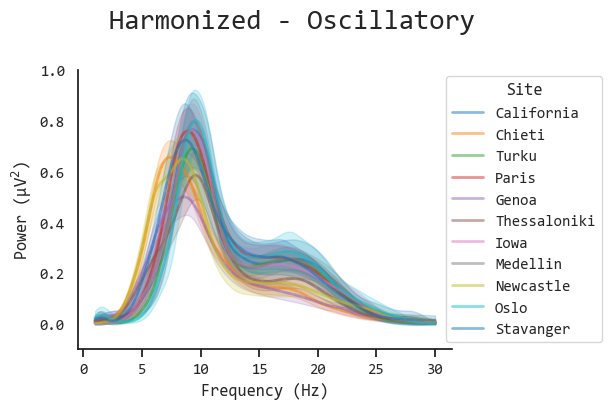

In [ ]:
plot_channel_power(features_df, fig_title= 'Harmonized - Oscillatory', plot_variable='osc_fit', ylim=(-0.1,1), group_by='center', legend_title='Site')


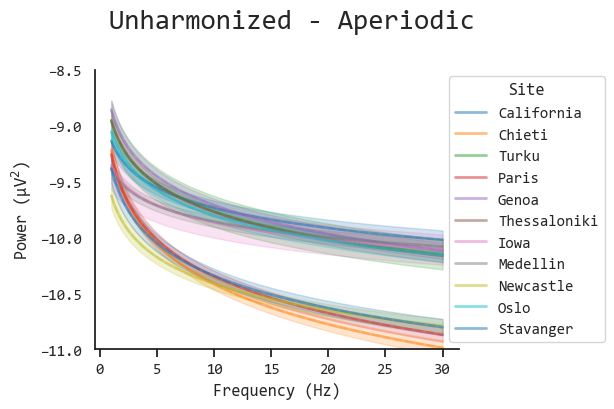

In [134]:
plot_channel_power(features_df_unharm, fig_title= 'Unharmonized - Aperiodic', plot_variable='ap_fit', group_by='center', legend_title='Site')


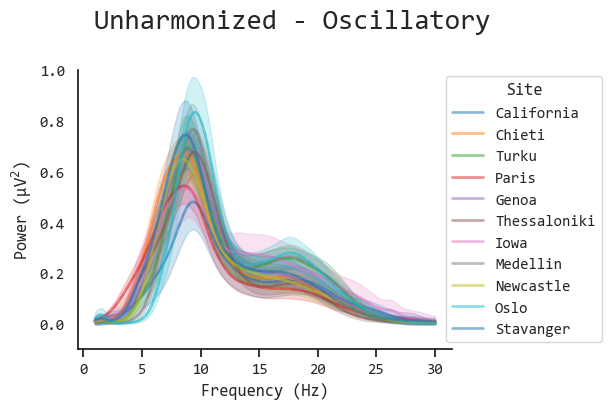

In [133]:
plot_channel_power(features_df_unharm, fig_title= 'Unharmonized - Oscillatory', plot_variable='osc_fit', ylim=(-0.1,1), group_by='center', legend_title='Site')


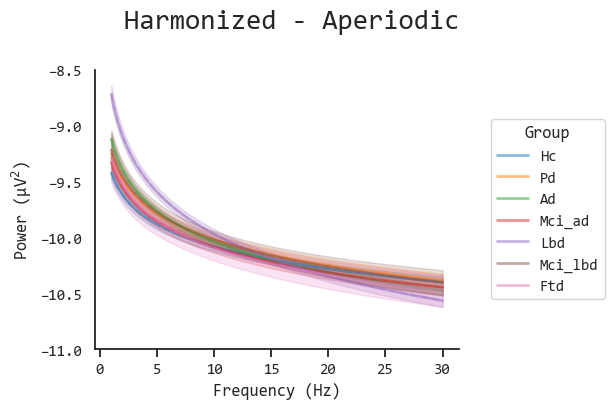

In [110]:
plot_channel_power(features_df, fig_title= 'Harmonized - Aperiodic', plot_variable='ap_fit', group_by='group', legend_title='Group')


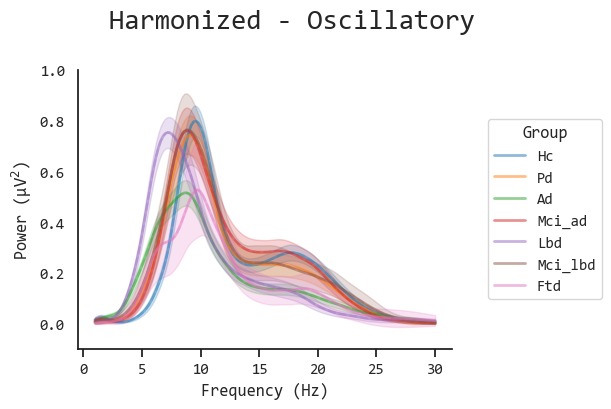

In [113]:
plot_channel_power(features_df, fig_title= 'Harmonized - Oscillatory', plot_variable='osc_fit', ylim=(-0.1,1), group_by='group', legend_title='Group')


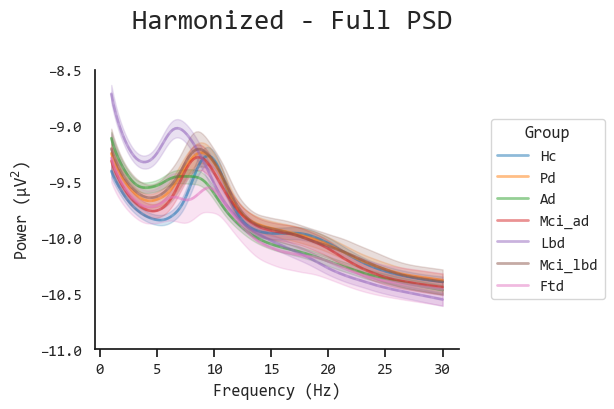

In [114]:
plot_channel_power(features_df, fig_title= 'Harmonized - Full PSD', plot_variable='psd_fit', ylim=(-11,-8.5), group_by='group', legend_title='Group')


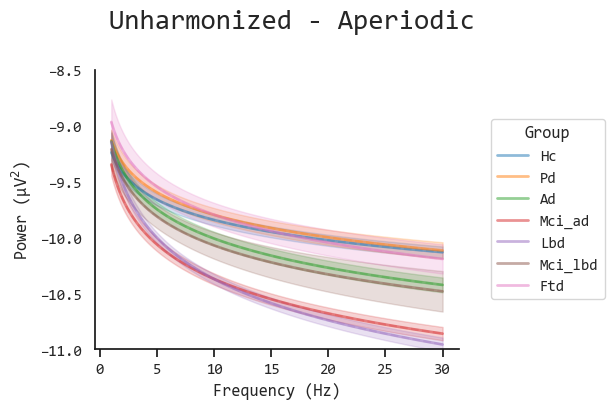

In [135]:
plot_channel_power(features_df_unharm, fig_title= 'Unharmonized - Aperiodic', plot_variable='ap_fit', group_by='group', legend_title='Group')


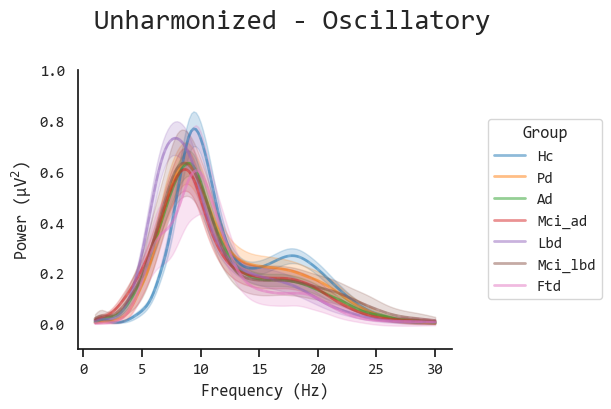

In [136]:
plot_channel_power(features_df_unharm, fig_title= 'Unharmonized - Oscillatory', plot_variable='osc_fit', ylim=(-0.1,1), group_by='group', legend_title='Group')


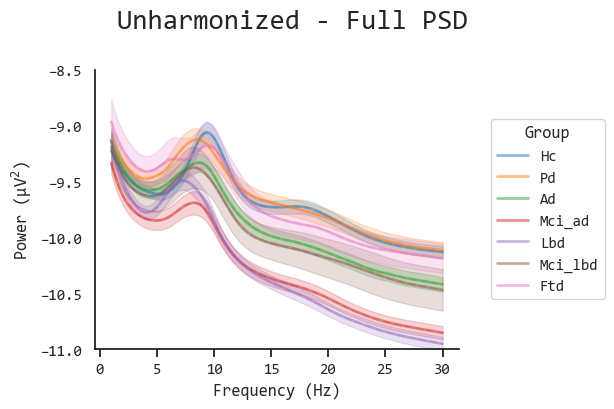

In [137]:
plot_channel_power(features_df_unharm, fig_title= 'Unharmonized - Full PSD', plot_variable='psd_fit', ylim=(-11,-8.5), group_by='group', legend_title='Group')


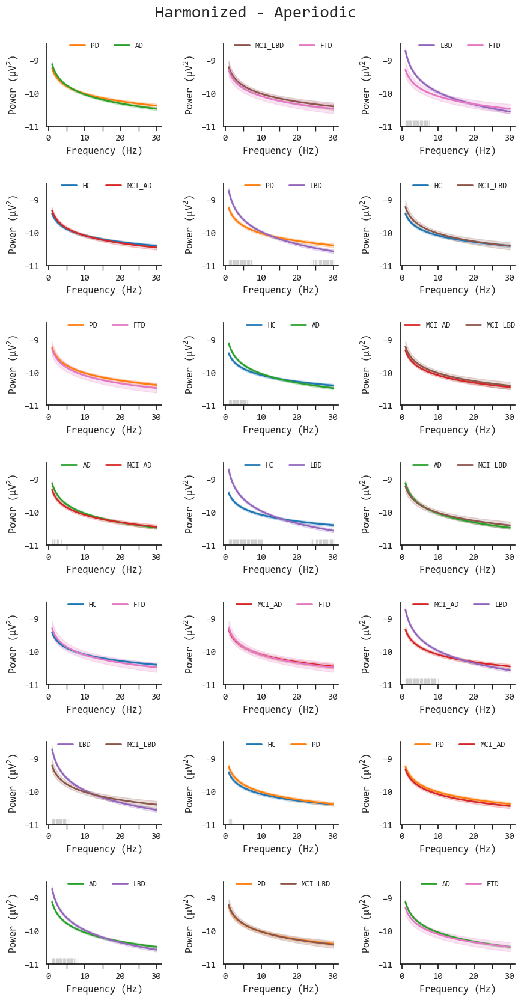

In [80]:
# Example usage with a custom plot parameter
plot_group_diffs(features_df, plot='ap_fit', fig_title='Harmonized - Aperiodic')

group differences oscillatory

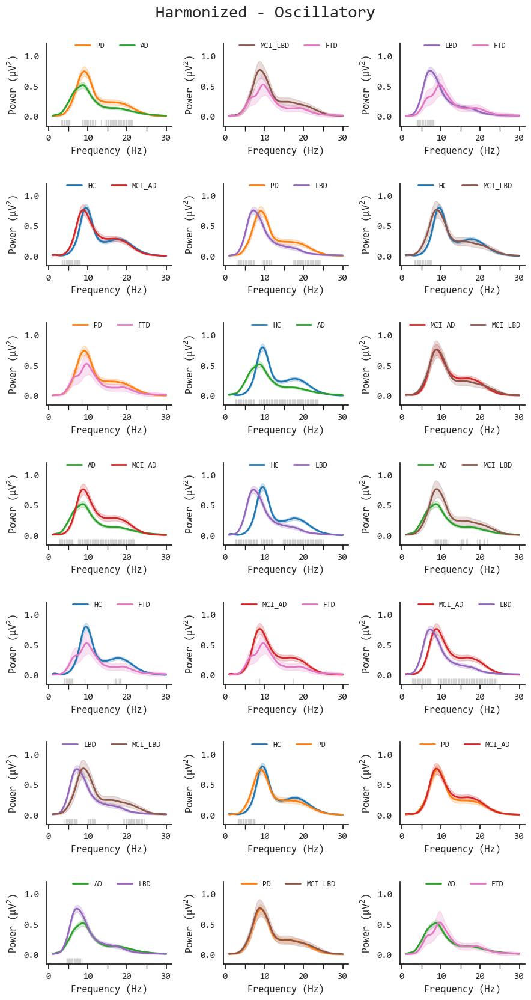

In [81]:
# Example usage with a custom plot parameter
plot_group_diffs(features_df, plot='osc_fit', fig_title='Harmonized - Oscillatory')

## ANCOVA ##

In [139]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg

good_r_squared_df = pd.DataFrame(pd.read_csv('D:/data_analysis/papers_alberto/final_phd/derivatives_data/specparams_lmm.csv'))

# Set the reference category for 'group' to be 'hc'
good_r_squared_df['group'] = pd.Categorical(good_r_squared_df['group'], categories=['hc', 'pd', 'mci_lbd', 'lbd', 'mci_ad', 'ad', 'ftd'], ordered=True)

# Set the color palette to 'colorblind'
palette = sns.color_palette("colorblind", len(good_r_squared_df['group'].cat.categories))

In [152]:


# Function to fit a robust linear model with 'hc' as reference and return the summary
def fit_robust_model_with_reference(data, feature):
    # Define the formula for the linear model
    formula = f'{feature} ~ C(group, Treatment(reference="hc")) + age + gender'
    
    # Fit the model with robust standard errors to account for heteroscedasticity
    model = smf.ols(formula, data=data).fit(cov_type='HC3')
    
    return model


def plot_observed(feature, data, palette):

    # Plotting the observed values
    plt.figure(figsize=(10, 6))
    sns.stripplot(x='group', y=feature, data=data, palette=palette, alpha=0.2, jitter=True)
    sns.pointplot(x='group', y=feature, data=data, join=False, capsize=.1, 
                  errorbar='se', errwidth=1, scale=0.6, color='k')
    
    plt.xlabel('group')
    plt.ylabel(feature)
    plt.title(f'{feature}')
    plt.grid(True)
    ax = plt.gca()  # Get the current axes
    ax.set_facecolor('white')
    # Set spines color
    for spine in ax.spines.values():
        spine.set_edgecolor('k')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
    
    ax.set_xticklabels([label.get_text().upper() for label in ax.get_xticklabels()], fontweight='bold')

    # Show the plot

    plt.title('')
    plt.ylabel(feature.capitalize())
    plt.xlabel('')
    # Show the plot
    plt.show()



C:\Users\data_analysis\AppData\Local\Temp\ipykernel_16012\1619562620.py:16: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(x='group', y=feature, data=data, palette=palette, alpha=0.2, jitter=True)


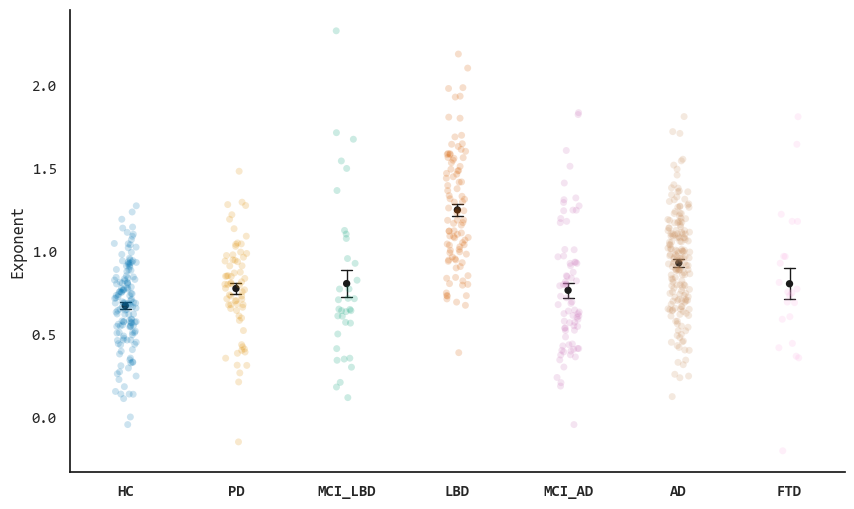

In [153]:
# Set the color palette to 'colorblind'
palette = sns.color_palette("colorblind", len(good_r_squared_df['group'].cat.categories))

model_exponent_ref = fit_robust_model_with_reference(good_r_squared_df, 'exponent')
plot_observed('exponent', good_r_squared_df, palette)


In [154]:
# Summary of the model for 'exponent'
model_exponent_summary = model_exponent_ref.summary()
model_exponent_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               exponent   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                  0.248
Method:                 Least Squares   F-statistic:                     28.74
Date:                Fri, 14 Jun 2024   Prob (F-statistic):           3.64e-38
Time:                        13:38:20   Log-Likelihood:                -186.02
No. Observations:                 627   AIC:                             390.0
Df Residuals:                     618   BIC:                             430.0
Df Model:                           8                                         
Covariance Type:                  HC3                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
Intercept                                          0.6881      0.102      6.723      0.000       0.487       0.889
C(group, Treatment(reference="hc"))[T.pd]          0.1079      0.041      2.619      0.009       0.027       0.189
C(group, Treatment(reference="hc"))[T.mci_lbd]     0.1138      0.086      1.328      0.184      -0.054       0.282
C(group, Treatment(reference="hc"))[T.lbd]         0.5751      0.046     12.512      0.000       0.485       0.665
C(group, Treatment(reference="hc"))[T.mci_ad]      0.1058      0.049      2.138      0.033       0.009       0.203
C(group, Treatment(reference="hc"))[T.ad]          0.2791      0.035      8.000      0.000       0.211       0.347
C(group, Treatment(reference="hc"))[T.ftd]         0.1248      0.098      1.278      0.201      -0.067       0.316
gender[T.m]                                        0.0922      0.026      3.509      0.000       0.041       0.144
age                                               -0.0010      0.002     -0.646      0.518      -0.004       0.002
==============================================================================
Omnibus:                       27.306   Durbin-Watson:                   1.948
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               37.863
Skew:                           0.386   Prob(JB):                     6.00e-09
Kurtosis:                       3.924   Cond. No.                         581.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC3)
"""

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_16012\3691522998.py:61: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])


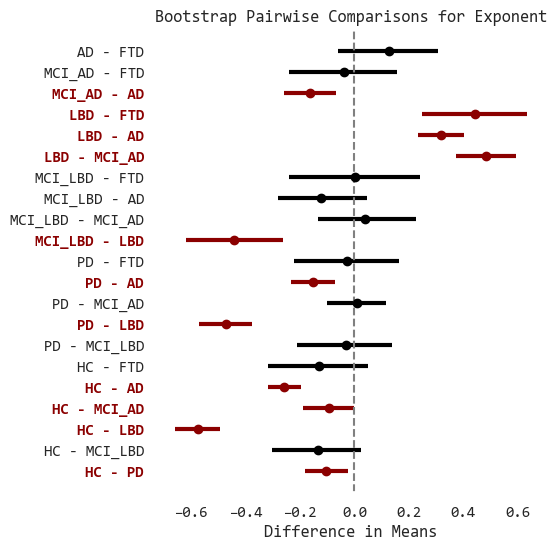

In [147]:
# Modify the bootstrap function to return mean differences as well
def bootstrap_pairwise_comparisons(data, feature, groups, num_bootstrap=10000, alpha=0.05):
    group_combinations = [(g1, g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]
    bootstrap_results = []

    for g1, g2 in group_combinations:
        group1_data = data[data['group'] == g1][feature]
        group2_data = data[data['group'] == g2][feature]
        mean_diffs = []

        for _ in range(num_bootstrap):
            sample1 = np.random.choice(group1_data, size=len(group1_data), replace=True)
            sample2 = np.random.choice(group2_data, size=len(group2_data), replace=True)
            mean_diffs.append(np.mean(sample1) - np.mean(sample2))

        mean_diff = np.mean(mean_diffs)
        lower_bound = np.percentile(mean_diffs, 100*alpha/2)
        upper_bound = np.percentile(mean_diffs, 100*(1-alpha/2))
        bootstrap_results.append([f"{g1} - {g2}", mean_diff, lower_bound, upper_bound])

    return pd.DataFrame(bootstrap_results, columns=['Group Pair', 'Mean Difference', 'Lower Bound', 'Upper Bound'])


# Generate bootstrap results
groups = good_r_squared_df['group'].cat.categories

# Generate bootstrap results
bootstrap_results_df = bootstrap_pairwise_comparisons(good_r_squared_df, 'exponent', groups)

# Plotting
plt.figure(figsize=(5, 6))
ax = plt.gca()

# List to store labels for significant comparisons
significant_labels = []

# Iterate through the rows to plot each pair
for _, row in bootstrap_results_df.iterrows():
    is_significant = row['Lower Bound'] > 0 or row['Upper Bound'] < 0
    color = 'darkred' if is_significant else 'black'
    if is_significant:
        significant_labels.append(row['Group Pair'].upper())
    plt.errorbar(x=row['Mean Difference'], 
                 y=row['Group Pair'], 
                 xerr=[[row['Mean Difference'] - row['Lower Bound']],
                       [row['Upper Bound'] - row['Mean Difference']]],
                 fmt='o', color=color, ecolor=color, elinewidth=3, capsize=0)

plt.axvline(x=0, color='gray', linestyle='--')
plt.xlabel('Difference in Means')
plt.ylabel('')
plt.title('Bootstrap Pairwise Comparisons for Exponent')
ax.set_facecolor('white')
ax.xaxis.grid(False)  # Turn off the vertical grid

# Apply bold font only to significant labels
for label in ax.get_yticklabels():
    if label.get_text().upper() in significant_labels:
        label.set_fontweight('bold')
        label.set_color('darkred')
ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])

plt.show()

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_16012\1619562620.py:16: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(x='group', y=feature, data=data, palette=palette, alpha=0.2, jitter=True)


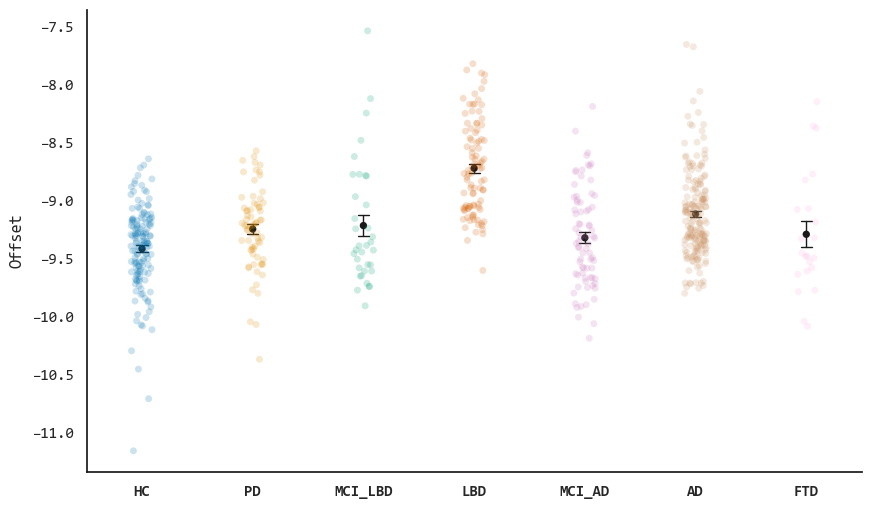

In [157]:
model_offset_ref = fit_robust_model_with_reference(good_r_squared_df, 'offset')
plot_observed('offset', good_r_squared_df, palette)

In [156]:
# Summary of the model for 'offset'
model_offset_summary = model_offset_ref.summary()
model_offset_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 offset   R-squared:                       0.240
Model:                            OLS   Adj. R-squared:                  0.230
Method:                 Least Squares   F-statistic:                     24.67
Date:                Fri, 14 Jun 2024   Prob (F-statistic):           4.69e-33
Time:                        13:39:55   Log-Likelihood:                -309.04
No. Observations:                 627   AIC:                             636.1
Df Residuals:                     618   BIC:                             676.1
Df Model:                           8                                         
Covariance Type:                  HC3                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
Intercept                                         -9.4393      0.129    -73.169      0.000      -9.692      -9.186
C(group, Treatment(reference="hc"))[T.pd]          0.1691      0.052      3.230      0.001       0.067       0.272
C(group, Treatment(reference="hc"))[T.mci_lbd]     0.1940      0.097      2.003      0.045       0.004       0.384
C(group, Treatment(reference="hc"))[T.lbd]         0.6876      0.055     12.596      0.000       0.581       0.795
C(group, Treatment(reference="hc"))[T.mci_ad]      0.0930      0.059      1.584      0.113      -0.022       0.208
C(group, Treatment(reference="hc"))[T.ad]          0.2974      0.046      6.533      0.000       0.208       0.387
C(group, Treatment(reference="hc"))[T.ftd]         0.1227      0.118      1.042      0.297      -0.108       0.354
gender[T.m]                                        0.0146      0.032      0.460      0.646      -0.048       0.077
age                                                0.0003      0.002      0.135      0.892      -0.003       0.004
==============================================================================
Omnibus:                       28.173   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               48.379
Skew:                           0.323   Prob(JB):                     3.12e-11
Kurtosis:                       4.198   Cond. No.                         581.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC3)
"""

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_16012\3272155352.py:61: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])


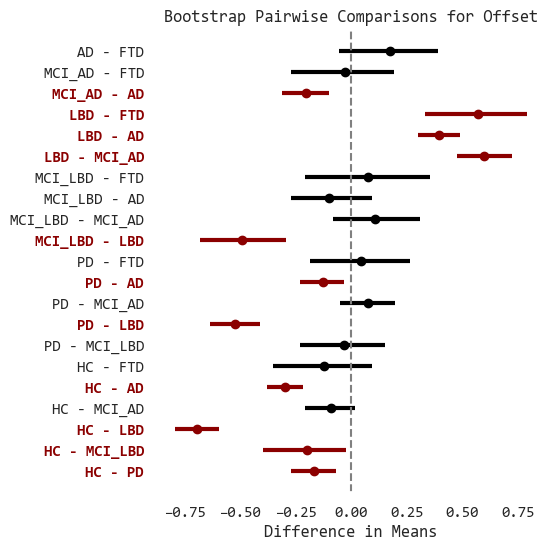

In [150]:
# Modify the bootstrap function to return mean differences as well
def bootstrap_pairwise_comparisons(data, feature, groups, num_bootstrap=10000, alpha=0.05):
    group_combinations = [(g1, g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]
    bootstrap_results = []

    for g1, g2 in group_combinations:
        group1_data = data[data['group'] == g1][feature]
        group2_data = data[data['group'] == g2][feature]
        mean_diffs = []

        for _ in range(num_bootstrap):
            sample1 = np.random.choice(group1_data, size=len(group1_data), replace=True)
            sample2 = np.random.choice(group2_data, size=len(group2_data), replace=True)
            mean_diffs.append(np.mean(sample1) - np.mean(sample2))

        mean_diff = np.mean(mean_diffs)
        lower_bound = np.percentile(mean_diffs, 100*alpha/2)
        upper_bound = np.percentile(mean_diffs, 100*(1-alpha/2))
        bootstrap_results.append([f"{g1} - {g2}", mean_diff, lower_bound, upper_bound])

    return pd.DataFrame(bootstrap_results, columns=['Group Pair', 'Mean Difference', 'Lower Bound', 'Upper Bound'])


# Generate bootstrap results
groups = good_r_squared_df['group'].cat.categories

# Generate bootstrap results
bootstrap_results_df = bootstrap_pairwise_comparisons(good_r_squared_df, 'offset', groups)

# Plotting
plt.figure(figsize=(5, 6))
ax = plt.gca()

# List to store labels for significant comparisons
significant_labels = []

# Iterate through the rows to plot each pair
for _, row in bootstrap_results_df.iterrows():
    is_significant = row['Lower Bound'] > 0 or row['Upper Bound'] < 0
    color = 'darkred' if is_significant else 'black'
    if is_significant:
        significant_labels.append(row['Group Pair'].upper())
    plt.errorbar(x=row['Mean Difference'], 
                 y=row['Group Pair'], 
                 xerr=[[row['Mean Difference'] - row['Lower Bound']],
                       [row['Upper Bound'] - row['Mean Difference']]],
                 fmt='o', color=color, ecolor=color, elinewidth=3, capsize=0)

plt.axvline(x=0, color='gray', linestyle='--')
plt.xlabel('Difference in Means')
plt.ylabel('')
plt.title('Bootstrap Pairwise Comparisons for Offset')
ax.set_facecolor('white')
ax.xaxis.grid(False)  # Turn off the vertical grid

# Apply bold font only to significant labels
for label in ax.get_yticklabels():
    if label.get_text().upper() in significant_labels:
        label.set_fontweight('bold')
        label.set_color('darkred')
ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])

plt.show()

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_16012\1938636652.py:16: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(x='group', y=feature, data=data, palette=palette, alpha=0.2, jitter=True)


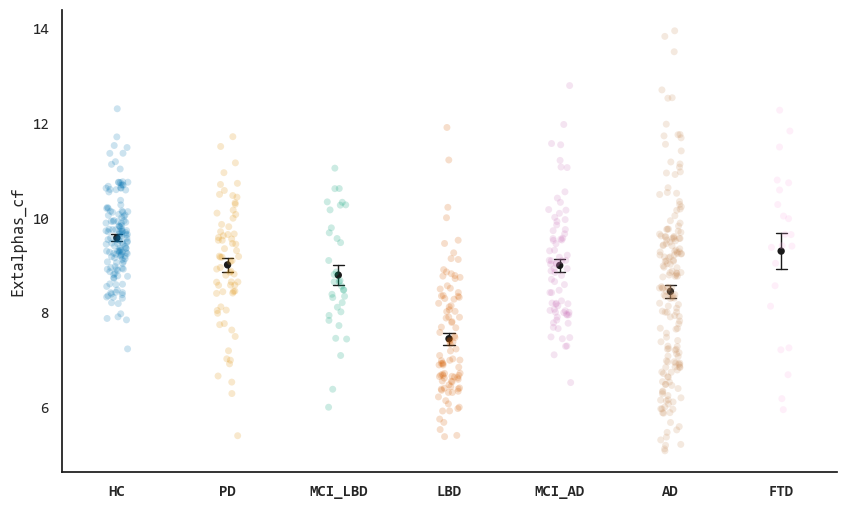

In [142]:
model_extalphas_cf_ref = fit_robust_model_with_reference(good_r_squared_df, 'extalphas_cf')
plot_observed('extalphas_cf', good_r_squared_df, palette)


In [116]:
# Summary of the model for 'extalphas_cf'
model_extalphas_cf_summary = model_extalphas_cf_ref.summary()
model_extalphas_cf_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           extalphas_cf   R-squared:                       0.196
Model:                            OLS   Adj. R-squared:                  0.184
Method:                 Least Squares   F-statistic:                     23.11
Date:                Thu, 29 Feb 2024   Prob (F-statistic):           1.25e-30
Time:                        03:51:37   Log-Likelihood:                -988.00
No. Observations:                 566   AIC:                             1994.
Df Residuals:                     557   BIC:                             2033.
Df Model:                           8                                         
Covariance Type:                  HC3                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
Intercept                                         10.7009      0.473     22.626      0.000       9.774      11.628
C(group, Treatment(reference="hc"))[T.pd]         -0.4788      0.170     -2.812      0.005      -0.812      -0.145
C(group, Treatment(reference="hc"))[T.mci_lbd]    -0.6942      0.225     -3.084      0.002      -1.135      -0.253
C(group, Treatment(reference="hc"))[T.lbd]        -1.8830      0.199     -9.462      0.000      -2.273      -1.493
C(group, Treatment(reference="hc"))[T.mci_ad]     -0.3673      0.184     -1.996      0.046      -0.728      -0.007
C(group, Treatment(reference="hc"))[T.ad]         -1.0396      0.189     -5.504      0.000      -1.410      -0.669
C(group, Treatment(reference="hc"))[T.ftd]        -0.1682      0.418     -0.402      0.688      -0.988       0.652
gender[T.m]                                       -0.0758      0.120     -0.633      0.527      -0.310       0.159
age                                               -0.0175      0.007     -2.419      0.016      -0.032      -0.003
==============================================================================
Omnibus:                       27.372   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               33.007
Skew:                           0.470   Prob(JB):                     6.80e-08
Kurtosis:                       3.719   Cond. No.                         567.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC3)
"""

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_12104\172993553.py:61: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])


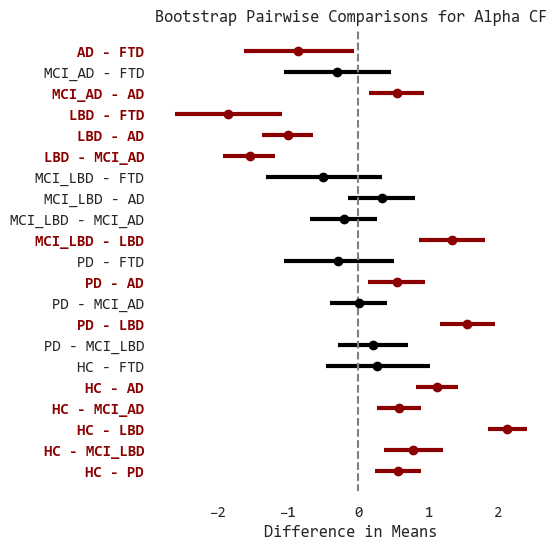

In [ ]:
# Modify the bootstrap function to return mean differences as well
def bootstrap_pairwise_comparisons(data, feature, groups, num_bootstrap=10000, alpha=0.05):
    group_combinations = [(g1, g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]
    bootstrap_results = []

    for g1, g2 in group_combinations:
        group1_data = data[data['group'] == g1][feature]
        group2_data = data[data['group'] == g2][feature]
        mean_diffs = []

        for _ in range(num_bootstrap):
            sample1 = np.random.choice(group1_data, size=len(group1_data), replace=True)
            sample2 = np.random.choice(group2_data, size=len(group2_data), replace=True)
            mean_diffs.append(np.mean(sample1) - np.mean(sample2))

        mean_diff = np.mean(mean_diffs)
        lower_bound = np.percentile(mean_diffs, 100*alpha/2)
        upper_bound = np.percentile(mean_diffs, 100*(1-alpha/2))
        bootstrap_results.append([f"{g1} - {g2}", mean_diff, lower_bound, upper_bound])

    return pd.DataFrame(bootstrap_results, columns=['Group Pair', 'Mean Difference', 'Lower Bound', 'Upper Bound'])


# Generate bootstrap results
groups = good_r_squared_df['group'].cat.categories

# Generate bootstrap results
bootstrap_results_df = bootstrap_pairwise_comparisons(good_r_squared_df, 'extalphas_cf', groups)

# Plotting
plt.figure(figsize=(5, 6))
ax = plt.gca()

# List to store labels for significant comparisons
significant_labels = []

# Iterate through the rows to plot each pair
for _, row in bootstrap_results_df.iterrows():
    is_significant = row['Lower Bound'] > 0 or row['Upper Bound'] < 0
    color = 'darkred' if is_significant else 'black'
    if is_significant:
        significant_labels.append(row['Group Pair'].upper())
    plt.errorbar(x=row['Mean Difference'], 
                 y=row['Group Pair'], 
                 xerr=[[row['Mean Difference'] - row['Lower Bound']],
                       [row['Upper Bound'] - row['Mean Difference']]],
                 fmt='o', color=color, ecolor=color, elinewidth=3, capsize=0)

plt.axvline(x=0, color='gray', linestyle='--')
plt.xlabel('Difference in Means')
plt.ylabel('')
plt.title('Bootstrap Pairwise Comparisons for Alpha CF')
ax.set_facecolor('white')
ax.xaxis.grid(False)  # Turn off the vertical grid

# Apply bold font only to significant labels
for label in ax.get_yticklabels():
    if label.get_text().upper() in significant_labels:
        label.set_fontweight('bold')
        label.set_color('darkred')
ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])

plt.show()

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_16012\1938636652.py:16: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(x='group', y=feature, data=data, palette=palette, alpha=0.2, jitter=True)


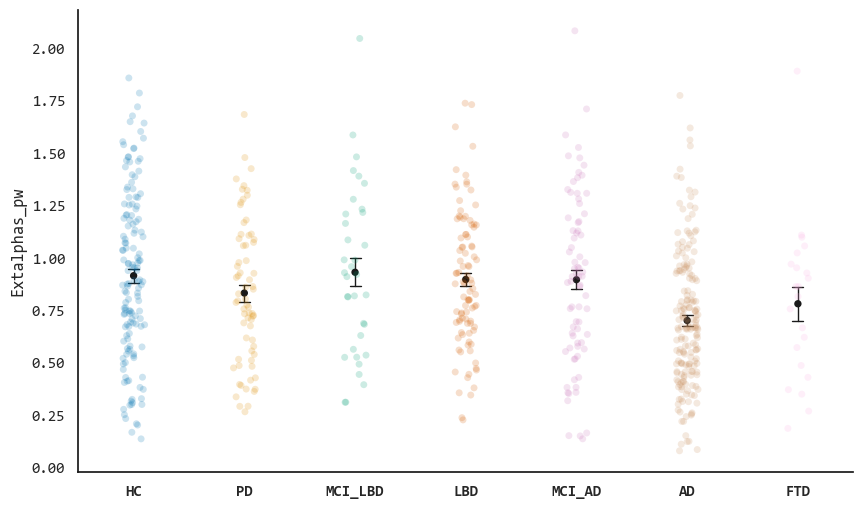

In [143]:
model_extalphas_pw_ref = fit_robust_model_with_reference(good_r_squared_df, 'extalphas_pw')
plot_observed('extalphas_pw', good_r_squared_df, palette)


In [117]:
# Summary of the model for 'extalphas_pw'
model_extalphas_pw_summary = model_extalphas_pw_ref.summary()
model_extalphas_pw_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           extalphas_pw   R-squared:                       0.066
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     5.590
Date:                Thu, 29 Feb 2024   Prob (F-statistic):           7.89e-07
Time:                        03:52:11   Log-Likelihood:                -237.45
No. Observations:                 566   AIC:                             492.9
Df Residuals:                     557   BIC:                             532.0
Df Model:                           8                                         
Covariance Type:                  HC3                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
Intercept                                          0.7567      0.119      6.366      0.000       0.524       0.990
C(group, Treatment(reference="hc"))[T.pd]         -0.0858      0.054     -1.576      0.115      -0.193       0.021
C(group, Treatment(reference="hc"))[T.mci_lbd]    -0.0065      0.079     -0.083      0.934      -0.161       0.148
C(group, Treatment(reference="hc"))[T.lbd]        -0.0271      0.058     -0.465      0.642      -0.141       0.087
C(group, Treatment(reference="hc"))[T.mci_ad]     -0.0277      0.061     -0.458      0.647      -0.146       0.091
C(group, Treatment(reference="hc"))[T.ad]         -0.2216      0.045     -4.884      0.000      -0.311      -0.133
C(group, Treatment(reference="hc"))[T.ftd]        -0.1185      0.091     -1.308      0.191      -0.296       0.059
gender[T.m]                                        0.0622      0.032      1.928      0.054      -0.001       0.125
age                                                0.0020      0.002      1.135      0.256      -0.001       0.005
==============================================================================
Omnibus:                       10.052   Durbin-Watson:                   1.988
Prob(Omnibus):                  0.007   Jarque-Bera (JB):               10.376
Skew:                           0.323   Prob(JB):                      0.00558
Kurtosis:                       2.851   Cond. No.                         567.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC3)
"""

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_12104\2142947167.py:61: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])


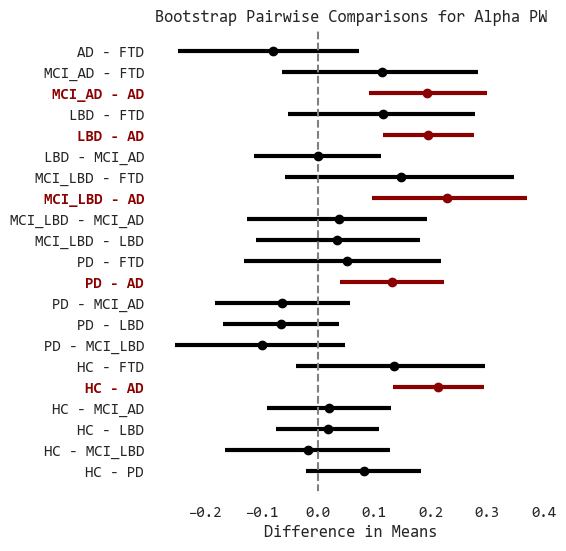

In [ ]:
# Modify the bootstrap function to return mean differences as well
def bootstrap_pairwise_comparisons(data, feature, groups, num_bootstrap=10000, alpha=0.05):
    group_combinations = [(g1, g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]
    bootstrap_results = []

    for g1, g2 in group_combinations:
        group1_data = data[data['group'] == g1][feature]
        group2_data = data[data['group'] == g2][feature]
        mean_diffs = []

        for _ in range(num_bootstrap):
            sample1 = np.random.choice(group1_data, size=len(group1_data), replace=True)
            sample2 = np.random.choice(group2_data, size=len(group2_data), replace=True)
            mean_diffs.append(np.mean(sample1) - np.mean(sample2))

        mean_diff = np.mean(mean_diffs)
        lower_bound = np.percentile(mean_diffs, 100*alpha/2)
        upper_bound = np.percentile(mean_diffs, 100*(1-alpha/2))
        bootstrap_results.append([f"{g1} - {g2}", mean_diff, lower_bound, upper_bound])

    return pd.DataFrame(bootstrap_results, columns=['Group Pair', 'Mean Difference', 'Lower Bound', 'Upper Bound'])


# Generate bootstrap results
groups = good_r_squared_df['group'].cat.categories

# Generate bootstrap results
bootstrap_results_df = bootstrap_pairwise_comparisons(good_r_squared_df, 'extalphas_pw', groups)

# Plotting
plt.figure(figsize=(5, 6))
ax = plt.gca()

# List to store labels for significant comparisons
significant_labels = []

# Iterate through the rows to plot each pair
for _, row in bootstrap_results_df.iterrows():
    is_significant = row['Lower Bound'] > 0 or row['Upper Bound'] < 0
    color = 'darkred' if is_significant else 'black'
    if is_significant:
        significant_labels.append(row['Group Pair'].upper())
    plt.errorbar(x=row['Mean Difference'], 
                 y=row['Group Pair'], 
                 xerr=[[row['Mean Difference'] - row['Lower Bound']],
                       [row['Upper Bound'] - row['Mean Difference']]],
                 fmt='o', color=color, ecolor=color, elinewidth=3, capsize=0)

plt.axvline(x=0, color='gray', linestyle='--')
plt.xlabel('Difference in Means')
plt.ylabel('')
plt.title('Bootstrap Pairwise Comparisons for Alpha PW')
ax.set_facecolor('white')
ax.xaxis.grid(False)  # Turn off the vertical grid

# Apply bold font only to significant labels
for label in ax.get_yticklabels():
    if label.get_text().upper() in significant_labels:
        label.set_fontweight('bold')
        label.set_color('darkred')
ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])

plt.show()

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_16012\1938636652.py:16: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(x='group', y=feature, data=data, palette=palette, alpha=0.2, jitter=True)


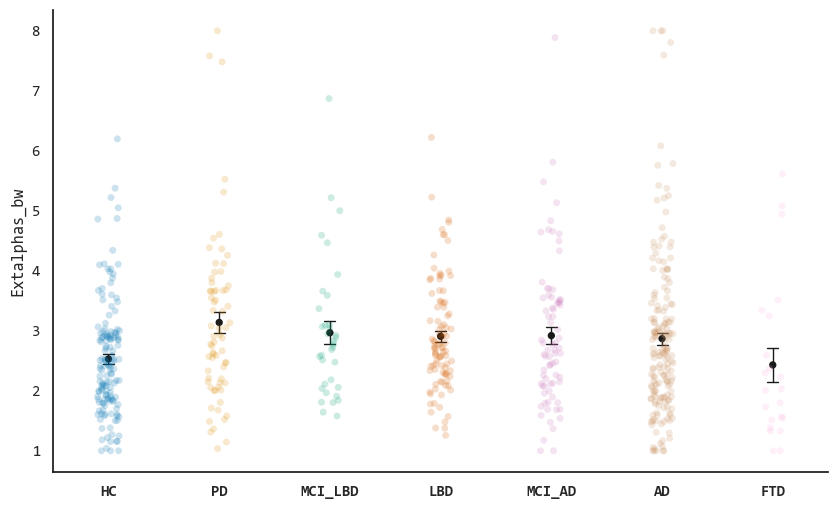

In [144]:
model_extalphas_bw_ref = fit_robust_model_with_reference(good_r_squared_df, 'extalphas_bw')
plot_observed('extalphas_bw', good_r_squared_df, palette)


In [145]:
# Summary of the model for 'extalphas_bw'
model_extalphas_bw_summary = model_extalphas_bw_ref.summary()
model_extalphas_bw_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           extalphas_bw   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.024
Method:                 Least Squares   F-statistic:                     3.160
Date:                Fri, 14 Jun 2024   Prob (F-statistic):            0.00162
Time:                        13:28:01   Log-Likelihood:                -992.15
No. Observations:                 627   AIC:                             2002.
Df Residuals:                     618   BIC:                             2042.
Df Model:                           8                                         
Covariance Type:                  HC3                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
Intercept                                          3.2907      0.425      7.747      0.000       2.458       4.123
C(group, Treatment(reference="hc"))[T.pd]          0.6245      0.188      3.325      0.001       0.256       0.993
C(group, Treatment(reference="hc"))[T.mci_lbd]     0.5267      0.215      2.449      0.014       0.105       0.948
C(group, Treatment(reference="hc"))[T.lbd]         0.5236      0.139      3.759      0.000       0.251       0.797
C(group, Treatment(reference="hc"))[T.mci_ad]      0.4682      0.173      2.713      0.007       0.130       0.807
C(group, Treatment(reference="hc"))[T.ad]          0.4392      0.137      3.195      0.001       0.170       0.709
C(group, Treatment(reference="hc"))[T.ftd]        -0.0833      0.302     -0.276      0.783      -0.676       0.509
gender[T.m]                                       -0.1149      0.097     -1.183      0.237      -0.305       0.075
age                                               -0.0110      0.006     -1.740      0.082      -0.023       0.001
==============================================================================
Omnibus:                      169.510   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              441.227
Skew:                           1.361   Prob(JB):                     1.54e-96
Kurtosis:                       6.078   Cond. No.                         581.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC3)
"""

C:\Users\data_analysis\AppData\Local\Temp\ipykernel_16012\1934025716.py:61: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])


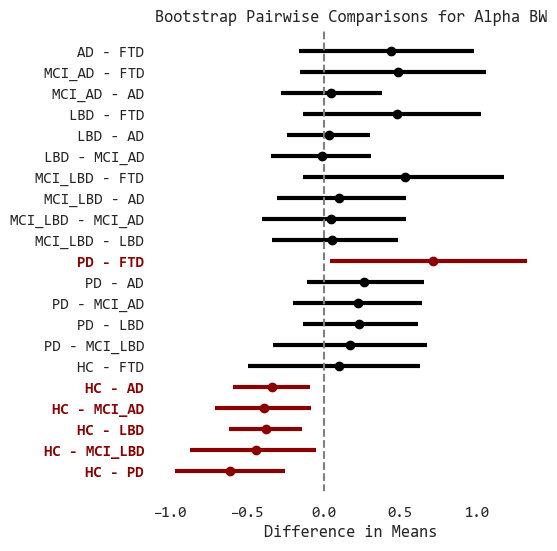

In [151]:
# Modify the bootstrap function to return mean differences as well
def bootstrap_pairwise_comparisons(data, feature, groups, num_bootstrap=10000, alpha=0.05):
    group_combinations = [(g1, g2) for i, g1 in enumerate(groups) for g2 in groups[i+1:]]
    bootstrap_results = []

    for g1, g2 in group_combinations:
        group1_data = data[data['group'] == g1][feature]
        group2_data = data[data['group'] == g2][feature]
        mean_diffs = []

        for _ in range(num_bootstrap):
            sample1 = np.random.choice(group1_data, size=len(group1_data), replace=True)
            sample2 = np.random.choice(group2_data, size=len(group2_data), replace=True)
            mean_diffs.append(np.mean(sample1) - np.mean(sample2))

        mean_diff = np.mean(mean_diffs)
        lower_bound = np.percentile(mean_diffs, 100*alpha/2)
        upper_bound = np.percentile(mean_diffs, 100*(1-alpha/2))
        bootstrap_results.append([f"{g1} - {g2}", mean_diff, lower_bound, upper_bound])

    return pd.DataFrame(bootstrap_results, columns=['Group Pair', 'Mean Difference', 'Lower Bound', 'Upper Bound'])


# Generate bootstrap results
groups = good_r_squared_df['group'].cat.categories

# Generate bootstrap results
bootstrap_results_df = bootstrap_pairwise_comparisons(good_r_squared_df, 'extalphas_bw', groups)

# Plotting
plt.figure(figsize=(5, 6))
ax = plt.gca()

# List to store labels for significant comparisons
significant_labels = []

# Iterate through the rows to plot each pair
for _, row in bootstrap_results_df.iterrows():
    is_significant = row['Lower Bound'] > 0 or row['Upper Bound'] < 0
    color = 'darkred' if is_significant else 'black'
    if is_significant:
        significant_labels.append(row['Group Pair'].upper())
    plt.errorbar(x=row['Mean Difference'], 
                 y=row['Group Pair'], 
                 xerr=[[row['Mean Difference'] - row['Lower Bound']],
                       [row['Upper Bound'] - row['Mean Difference']]],
                 fmt='o', color=color, ecolor=color, elinewidth=3, capsize=0)

plt.axvline(x=0, color='gray', linestyle='--')
plt.xlabel('Difference in Means')
plt.ylabel('')
plt.title('Bootstrap Pairwise Comparisons for Alpha BW')
ax.set_facecolor('white')
ax.xaxis.grid(False)  # Turn off the vertical grid

# Apply bold font only to significant labels
for label in ax.get_yticklabels():
    if label.get_text().upper() in significant_labels:
        label.set_fontweight('bold')
        label.set_color('darkred')
ax.set_yticklabels([label.get_text().upper() for label in ax.get_yticklabels()])

plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_channel_power(df):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")

    # Get unique groups and assign colors from the sns palette
    group_categories = df['center'].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df['center'] == group]
        mean_group = group_df.groupby(['frequency'])['ap_fit'].mean()
        std_group = group_df.groupby(['frequency'])['ap_fit'].std()
        num_samples = group_df.groupby(['frequency'])['ap_fit'].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df['center'].unique()
        for center in centers:
            center_mean = group_df[group_df['center'] == center].groupby(['frequency'])['ap_fit'].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.1)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(-11.5, -8.5)
    plt.legend(loc='upper center', ncol=3)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()


plot_channel_power(features_df)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_channel_power(df):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")

    # Get unique groups and assign colors from the sns palette
    group_categories = df['group'].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df['group'] == group]
        mean_group = group_df.groupby(['frequency'])['ap_fit'].mean()
        std_group = group_df.groupby(['frequency'])['ap_fit'].std()
        num_samples = group_df.groupby(['frequency'])['ap_fit'].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.1, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df['center'].unique()
        for center in centers:
            center_mean = group_df[group_df['center'] == center].groupby(['frequency'])['ap_fit'].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.15)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(-11, -8.5)
    plt.legend(loc='upper center', ncol=3)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()


plot_channel_power(features_df)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_channel_power(df):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")

    # Get unique groups and assign colors from the sns palette
    group_categories = df['center'].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df['center'] == group]
        mean_group = group_df.groupby(['frequency'])['osc_fit'].mean()
        std_group = group_df.groupby(['frequency'])['osc_fit'].std()
        num_samples = group_df.groupby(['frequency'])['osc_fit'].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df['center'].unique()
        for center in centers:
            center_mean = group_df[group_df['center'] == center].groupby(['frequency'])['osc_fit'].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.1)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(0, 1.5)
    plt.legend(loc='upper center', ncol=3)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()


plot_channel_power(features_df)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_power_groups(df, plot='psd_fit', dispersion='sem'):
    plt.figure(figsize=(6, 5))
    sns.set_style("white")

    # Create a color palette with the same number of colors as there are unique groups
    palette = sns.color_palette("tab10", len(df['group'].unique()))

    # Plot each group
    for i, group in enumerate(df['group'].unique()):
        group_df = df[df['group'] == group]
        mean_group = group_df.groupby(['frequency'])[plot].mean()
        
        if dispersion == 'sem':
            std_group = group_df.groupby(['frequency'])[plot].std()
            num_samples = group_df.groupby(['frequency'])[plot].count()
            dispersion_values = 1.96 * (std_group / np.sqrt(num_samples))
        elif dispersion == 'std':
            dispersion_values = 1.96 * group_df.groupby(['frequency'])[plot].std()
        else:
            raise ValueError("dispersion must be 'sem' or 'std'")
        
        plt.plot(mean_group.index, mean_group.values, linewidth=2, alpha = 0.8, label=group.upper(), color=palette[i])
        plt.fill_between(mean_group.index, mean_group.values - dispersion_values, mean_group.values + dispersion_values, alpha=0.05, color=palette[i])

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.legend(loc='upper right', ncol=2)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines
    

    plt.show()

# Example usage without specifying colors
# Replace `combat_psd` with your actual DataFrame
plot_power_groups(features_df, plot='psd', dispersion='sem')


In [ ]:
plot_power_groups(features_df, plot='ap_fit', dispersion='sem')

In [ ]:
plot_power_groups(features_df, plot='osc_fit', dispersion='sem')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_power_groups(df, plot='psd_fit', dispersion='sem'):
    plt.figure(figsize=(6, 5))
    sns.set_style("white")

    # Create a color palette with the same number of colors as there are unique groups
    palette = sns.color_palette("tab10", len(df['group'].unique()))

    # Plot each group
    for i, group in enumerate(df['group'].unique()):
        group_df = df[df['group'] == group]
        mean_group = group_df.groupby(['frequency'])[plot].mean()
        
        if dispersion == 'sem':
            std_group = group_df.groupby(['frequency'])[plot].std()
            num_samples = group_df.groupby(['frequency'])[plot].count()
            dispersion_values = 1.96 * (std_group / np.sqrt(num_samples))
        elif dispersion == 'std':
            dispersion_values = 1.96 * group_df.groupby(['frequency'])[plot].std()
        else:
            raise ValueError("dispersion must be 'sem' or 'std'")
        
        plt.plot(mean_group.index, mean_group.values, linewidth=2, alpha = 0.8, label=group.upper(), color=palette[i])
        plt.fill_between(mean_group.index, mean_group.values - dispersion_values, mean_group.values + dispersion_values, alpha=0.05, color=palette[i])

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.legend(loc='upper right', ncol=2)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()

# Example usage without specifying colors
# Replace `combat_psd` with your actual DataFrame
plot_power_groups(features_df, plot='psd_fit', dispersion='sem')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_channel_power(df):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")

    # Get unique groups and assign colors from the sns palette
    group_categories = df['group'].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df['group'] == group]
        mean_group = group_df.groupby(['frequency'])['osc_fit'].mean()
        std_group = group_df.groupby(['frequency'])['osc_fit'].std()
        num_samples = group_df.groupby(['frequency'])['osc_fit'].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.1, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df['center'].unique()
        for center in centers:
            center_mean = group_df[group_df['center'] == center].groupby(['frequency'])['osc_fit'].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.15)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(0, 2)
    plt.legend(loc='upper center', ncol=3)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()


plot_channel_power(features_df)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

def plot_group_diffs(df, plot='psd'):
    group_categories = df['group'].unique()
    pairwise_comparisons = set()  # Use a set to keep track of unique comparisons

    # Determine the grid layout based on the number of pairwise comparisons
    num_pairs = 0
    num_cols = 3  # Fixed number of columns for each row
    num_rows = 0

    for group1 in group_categories:
        for group2 in group_categories:
            if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
                pairwise_comparisons.add((group1, group2))
                num_pairs += 1

    # Calculate the number of rows needed based on the number of pairs
    num_rows = -(-num_pairs // num_cols)  # Ceiling division to calculate rows needed

    fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows)
    axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

    sns.set_style("white")

    # Create a color map from Seaborn palette
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
        ax = axs[i-1]  # Index is zero-based

        group1_data = df[df['group'] == group1][plot]
        group2_data = df[df['group'] == group2][plot]

        mean_group1 = group1_data.groupby(df['frequency']).mean()
        mean_group2 = group2_data.groupby(df['frequency']).mean()

        sem_group1 = group1_data.groupby(df['frequency']).sem()
        sem_group2 = group2_data.groupby(df['frequency']).sem()

        # Calculate p-values for each frequency point
        p_vals = []
        for freq in mean_group1.index:
            p_value = ttest_ind(group1_data[df['frequency'] == freq], group2_data[df['frequency'] == freq])[1]
            p_vals.append(p_value)

        # Correct p-values using fdr_by multiple testing correction
        _, p_vals_corrected, _, _ = multipletests(p_vals, method='fdr_by')

        group1_color = color_map[group1]
        group2_color = color_map[group2]

        ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=group1_color)
        ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=group2_color)

        # Shade SEM for each group
        ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=group1_color)
        ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=group2_color)

        # Mask areas where p-value < 0.05 after correction with gray color
        for j in range(len(p_vals_corrected)):
            if p_vals_corrected[j] < 0.05:
                ax.fill_between([mean_group1.index[j]], -11.02, -10.82, alpha=0.3, color='gray')

        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power (μV$^2$)')
        if plot == 'osc_fit':
            ax.set_ylim(-0.05, 2)
        else:
            ax.set_ylim(-11, -8)
        ax.set_title(f'{group1.upper()} vs {group2.upper()}')
        ax.legend(loc='upper right')

    # Hide empty subplots
    for i in range(num_pairs, num_cols * num_rows):
        fig.delaxes(axs[i])

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()

# Example usage with a custom plot parameter
plot_group_diffs(features_df, plot='psd')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

def plot_group_diffs(df, plot='psd'):
    group_categories = df['group'].unique()
    pairwise_comparisons = set()  # Use a set to keep track of unique comparisons

    # Determine the grid layout based on the number of pairwise comparisons
    num_pairs = 0
    num_cols = 3  # Fixed number of columns for each row
    num_rows = 0

    for group1 in group_categories:
        for group2 in group_categories:
            if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
                pairwise_comparisons.add((group1, group2))
                num_pairs += 1

    # Calculate the number of rows needed based on the number of pairs
    num_rows = -(-num_pairs // num_cols)  # Ceiling division to calculate rows needed

    fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows)
    axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

    sns.set_style("white")

    # Create a color map from Seaborn palette
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
        ax = axs[i-1]  # Index is zero-based

        group1_data = df[df['group'] == group1][plot]
        group2_data = df[df['group'] == group2][plot]

        mean_group1 = group1_data.groupby(df['frequency']).mean()
        mean_group2 = group2_data.groupby(df['frequency']).mean()

        sem_group1 = group1_data.groupby(df['frequency']).sem()
        sem_group2 = group2_data.groupby(df['frequency']).sem()

        # Calculate p-values for each frequency point
        p_vals = []
        for freq in mean_group1.index:
            p_value = ttest_ind(group1_data[df['frequency'] == freq], group2_data[df['frequency'] == freq])[1]
            p_vals.append(p_value)

        # Correct p-values using fdr_by multiple testing correction
        _, p_vals_corrected, _, _ = multipletests(p_vals, method='fdr_by')

        group1_color = color_map[group1]
        group2_color = color_map[group2]

        ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=group1_color)
        ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=group2_color)

        # Shade SEM for each group
        ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=group1_color)
        ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=group2_color)

        # Mask areas where p-value < 0.05 after correction with gray color
        for j in range(len(p_vals_corrected)):
            if p_vals_corrected[j] < 0.05:
                ax.fill_between([mean_group1.index[j]], -11.52, -11.25, alpha=0.3, color='gray')

        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power (μV$^2$)')
        if plot == 'osc_fit':
            ax.set_ylim(-0.05, 2)
        else:
            ax.set_ylim(-11.5, -8.5)
        ax.set_title(f'{group1.upper()} vs {group2.upper()}')
        ax.legend(loc='upper right')

    # Hide empty subplots
    for i in range(num_pairs, num_cols * num_rows):
        fig.delaxes(axs[i])

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()

# Example usage with a custom plot parameter
plot_group_diffs(features_df, plot='ap_fit')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

def plot_group_diffs(df, plot='psd'):
    group_categories = df['group'].unique()
    pairwise_comparisons = set()  # Use a set to keep track of unique comparisons

    # Determine the grid layout based on the number of pairwise comparisons
    num_pairs = 0
    num_cols = 3  # Fixed number of columns for each row
    num_rows = 0

    for group1 in group_categories:
        for group2 in group_categories:
            if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
                pairwise_comparisons.add((group1, group2))
                num_pairs += 1

    # Calculate the number of rows needed based on the number of pairs
    num_rows = -(-num_pairs // num_cols)  # Ceiling division to calculate rows needed

    fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows)
    axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

    sns.set_style("white")

    # Create a color map from Seaborn palette
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
        ax = axs[i-1]  # Index is zero-based

        group1_data = df[df['group'] == group1][plot]
        group2_data = df[df['group'] == group2][plot]

        mean_group1 = group1_data.groupby(df['frequency']).mean()
        mean_group2 = group2_data.groupby(df['frequency']).mean()

        sem_group1 = group1_data.groupby(df['frequency']).sem()
        sem_group2 = group2_data.groupby(df['frequency']).sem()

        # Calculate p-values for each frequency point
        p_vals = []
        for freq in mean_group1.index:
            p_value = ttest_ind(group1_data[df['frequency'] == freq], group2_data[df['frequency'] == freq])[1]
            p_vals.append(p_value)

        # Correct p-values using fdr_by multiple testing correction
        _, p_vals_corrected, _, _ = multipletests(p_vals, method='fdr_by')

        group1_color = color_map[group1]
        group2_color = color_map[group2]

        ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=group1_color)
        ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=group2_color)

        # Shade SEM for each group
        ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=group1_color)
        ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=group2_color)

        # Mask areas where p-value < 0.05 after correction with gray color
        for j in range(len(p_vals_corrected)):
            if p_vals_corrected[j] < 0.01:
                ax.fill_between([mean_group1.index[j]], -0.19, -0.05, alpha=0.3, color='gray')

        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power (μV$^2$)')
        if plot == 'osc_fit':
            ax.set_ylim(-0.2, 2)
        else:
            ax.set_ylim(-11.5, -8.5)
        ax.set_title(f'{group1.upper()} vs {group2.upper()}')
        ax.legend(loc='upper right')

    # Hide empty subplots
    for i in range(num_pairs, num_cols * num_rows):
        fig.delaxes(axs[i])

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()

# Example usage with a custom plot parameter
plot_group_diffs(features_df, plot='osc_fit')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_batches(df, color_dict=None, plot='psd', n_cols=5, dispersion='std'):
    group_categories = df['group'].unique()
    num_groups = len(group_categories)

    # Define the number of columns for subplots based on the number of groups and n_cols
    num_cols = min(num_groups, n_cols)
    num_rows = -(-num_groups // num_cols)  # Ceiling division to calculate rows needed

    # Create subplots based on the calculated rows and columns
    fig, axs = plt.subplots(figsize=(12, 20), ncols=num_cols, nrows=num_rows)
    axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

    sns.set_style("white")

    for idx, (group, ax) in enumerate(zip(group_categories, axs)):
        ax.set_title('All centers - ' + group.upper())
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power (μV$^2$)')

        center_df = df[df['group'] == group]

        centers = center_df['center'].unique()

        for center in centers:
            mean_center = center_df[center_df['center'] == center].groupby(['frequency'])[plot].mean()
            if dispersion == 'std':
                dispersion_values = center_df[center_df['center'] == center].groupby(['frequency'])[plot].std()
            elif dispersion == 'sem':
                dispersion_values = center_df[center_df['center'] == center].groupby(['frequency'])[plot].sem()
            else:
                raise ValueError("dispersion must be 'std' or 'sem'")

            # Assign a default color if color_dict is not provided or group is not in the list
            color = color_dict.get(center, 'gray') if color_dict else 'gray'

            ax.plot(mean_center.index, mean_center.values, linewidth=2, label=center.capitalize(), color=color)
            ax.fill_between(mean_center.index, mean_center.values - 1.96 * dispersion_values.values,
                            mean_center.values + 1.96 * dispersion_values.values, alpha=0.1)  # Plot dispersion (either std or sem)

        if plot == 'osc_fit':
            ax.set_ylim(-0.05, 1.5)
        ax.set_ylim(-11,-8.5)
        ax.legend(loc='upper center', ncol=2, bbox_to_anchor=(0.5, -0.25))

    # Hide empty subplots
    for idx in range(num_groups, len(axs)):
        fig.delaxes(axs[idx])

    plt.tight_layout()
    sns.despine()
    plt.show()

# Call the function with your DataFrame and specified parameters
batch_color_dict = {'california': 'red', 'finland': 'green', 'greece': 'blue',
              'iowa': 'cyan', 'lemon': 'purple', 'medellin': 'orange', 
              'oslo': 'pink', 'france': 'magenta', 'genoa': 'yellow', 'chieti':'brown'}  # Replace with your colors

# Example usage with dispersion as SEM
plot_batches(bandpowers_file, color_dict=batch_color_dict, n_cols=3, dispersion='sem');


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_batches(df, color_dict=None, plot='psd', n_cols=5, dispersion='std'):
    group_categories = df['group'].unique()
    num_groups = len(group_categories)

    # Define the number of columns for subplots based on the number of groups and n_cols
    num_cols = min(num_groups, n_cols)
    num_rows = -(-num_groups // num_cols)  # Ceiling division to calculate rows needed

    # Create subplots based on the calculated rows and columns
    fig, axs = plt.subplots(figsize=(12, 20), ncols=num_cols, nrows=num_rows)
    axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

    sns.set_style("white")

    for idx, (group, ax) in enumerate(zip(group_categories, axs)):
        ax.set_title('All centers - ' + group.upper())
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power (μV$^2$)')

        center_df = df[df['group'] == group]

        centers = center_df['center'].unique()

        for center in centers:
            mean_center = center_df[center_df['center'] == center].groupby(['frequency'])[plot].mean()
            if dispersion == 'std':
                dispersion_values = center_df[center_df['center'] == center].groupby(['frequency'])[plot].std()
            elif dispersion == 'sem':
                dispersion_values = center_df[center_df['center'] == center].groupby(['frequency'])[plot].sem()
            else:
                raise ValueError("dispersion must be 'std' or 'sem'")

            # Assign a default color if color_dict is not provided or group is not in the list
            color = color_dict.get(center, 'gray') if color_dict else 'gray'

            ax.plot(mean_center.index, mean_center.values, linewidth=2, label=center.capitalize(), color=color)
            ax.fill_between(mean_center.index, mean_center.values - 1.96 * dispersion_values.values,
                            mean_center.values + 1.96 * dispersion_values.values, alpha=0.1)  # Plot dispersion (either std or sem)

        if plot == 'osc_fit':
            ax.set_ylim(-0.05, 1.5)
        ax.set_ylim(-11,-8.5)
        ax.legend(loc='upper center', ncol=2, bbox_to_anchor=(0.5, -0.25))

    # Hide empty subplots
    for idx in range(num_groups, len(axs)):
        fig.delaxes(axs[idx])

    plt.tight_layout()
    sns.despine()
    plt.show()

# Call the function with your DataFrame and specified parameters
batch_color_dict = {'california': 'red', 'finland': 'green', 'greece': 'blue',
              'iowa': 'cyan', 'lemon': 'purple', 'medellin': 'orange', 
              'oslo': 'pink', 'france': 'magenta', 'genoa': 'yellow', 'chieti':'brown'}  # Replace with your colors

# Example usage with dispersion as SEM
plot_batches(bandpowers_file, color_dict=batch_color_dict, n_cols=3, dispersion='sem');


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_channel_power(df):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")

    # Get unique groups and assign colors from the sns palette
    group_categories = df['group'].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df['group'] == group]
        mean_group = group_df.groupby(['frequency'])['psd'].mean()
        std_group = group_df.groupby(['frequency'])['psd'].std()
        num_samples = group_df.groupby(['frequency'])['psd'].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df['center'].unique()
        for center in centers:
            center_mean = group_df[group_df['center'] == center].groupby(['frequency'])['psd'].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.1)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(-11, -8)
    plt.legend(loc='upper center', ncol=3)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()


plot_channel_power(bandpowers_file)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_channel_power(df):
    plt.figure(figsize=(6, 6))
    sns.set_style("white")

    # Get unique groups and assign colors from the sns palette
    group_categories = df['group'].unique()
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for group in group_categories:
        group_df = df[df['group'] == group]
        mean_group = group_df.groupby(['frequency'])['psd'].mean()
        std_group = group_df.groupby(['frequency'])['psd'].std()
        num_samples = group_df.groupby(['frequency'])['psd'].count()
        sem_group = std_group / np.sqrt(num_samples)

        # Get color for the group from the color map
        color = color_map[group]

        # Plot the mean and SEM
        plt.plot(mean_group.index, mean_group.values, linewidth=2, label=group.upper(),alpha=0.5, color=color)
        plt.fill_between(mean_group.index, mean_group.values - 1.96 * sem_group.values, mean_group.values + 1.96 * sem_group.values, alpha=0.2, color=color)

        # Plot dashed lines for mean of each center (for each group)
        centers = group_df['center'].unique()
        for center in centers:
            center_mean = group_df[group_df['center'] == center].groupby(['frequency'])['psd'].mean()
            plt.plot(center_mean.index, center_mean.values, '--', color=color, alpha=0.1)

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (μV$^2$)')
    plt.ylim(-11, -8)
    plt.legend(loc='upper center', ncol=3)

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()


plot_channel_power(bandpowers_file2)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

def plot_group_diffs(df, plot='psd'):
    group_categories = df['group'].unique()
    pairwise_comparisons = set()  # Use a set to keep track of unique comparisons

    # Determine the grid layout based on the number of pairwise comparisons
    num_pairs = 0
    num_cols = 3  # Fixed number of columns for each row
    num_rows = 0

    for group1 in group_categories:
        for group2 in group_categories:
            if group1 != group2 and (group1, group2) not in pairwise_comparisons and (group2, group1) not in pairwise_comparisons:
                pairwise_comparisons.add((group1, group2))
                num_pairs += 1

    # Calculate the number of rows needed based on the number of pairs
    num_rows = -(-num_pairs // num_cols)  # Ceiling division to calculate rows needed

    fig, axs = plt.subplots(figsize=(9, num_rows * 2.5), ncols=num_cols, nrows=num_rows)
    axs = axs.flatten()  # Flatten the subplots array to handle varying number of groups

    sns.set_style("white")

    # Create a color map from Seaborn palette
    palette = sns.color_palette("tab10", len(group_categories))
    color_map = dict(zip(group_categories, palette))

    for i, (group1, group2) in enumerate(pairwise_comparisons, start=1):
        ax = axs[i-1]  # Index is zero-based

        group1_data = df[df['group'] == group1][plot]
        group2_data = df[df['group'] == group2][plot]

        mean_group1 = group1_data.groupby(df['frequency']).mean()
        mean_group2 = group2_data.groupby(df['frequency']).mean()

        sem_group1 = group1_data.groupby(df['frequency']).sem()
        sem_group2 = group2_data.groupby(df['frequency']).sem()

        # Calculate p-values for each frequency point
        p_vals = []
        for freq in mean_group1.index:
            p_value = ttest_ind(group1_data[df['frequency'] == freq], group2_data[df['frequency'] == freq])[1]
            p_vals.append(p_value)

        # Correct p-values using fdr_by multiple testing correction
        _, p_vals_corrected, _, _ = multipletests(p_vals, method='fdr_by')

        group1_color = color_map[group1]
        group2_color = color_map[group2]

        ax.plot(mean_group1.index, mean_group1.values, linewidth=2, label=group1.upper(), color=group1_color)
        ax.plot(mean_group2.index, mean_group2.values, linewidth=2, label=group2.upper(), color=group2_color)

        # Shade SEM for each group
        ax.fill_between(mean_group1.index, mean_group1 - 1.96 * sem_group1, mean_group1 + 1.96 * sem_group1, alpha=0.2, color=group1_color)
        ax.fill_between(mean_group2.index, mean_group2 - 1.96 * sem_group2, mean_group2 + 1.96 * sem_group2, alpha=0.2, color=group2_color)

        # Mask areas where p-value < 0.05 after correction with gray color
        for j in range(len(p_vals_corrected)):
            if p_vals_corrected[j] < 0.05:
                ax.fill_between([mean_group1.index[j]], -11.52, -11.25, alpha=0.3, color='gray')

        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power (μV$^2$)')
        if plot == 'osc_fit':
            ax.set_ylim(-0.05, 1.5)
        else:
            ax.set_ylim(-11.5, -8.5)
        ax.set_title(f'{group1.upper()} vs {group2.upper()}')
        ax.legend(loc='upper right')

    # Hide empty subplots
    for i in range(num_pairs, num_cols * num_rows):
        fig.delaxes(axs[i])

    plt.tight_layout()
    sns.despine()  # Remove the top and right spines

    plt.show()

# Example usage with a custom plot parameter
plot_group_diffs(bandpowers_file2, plot='psd')


# Literature search

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

# Import LISC code
from lisc import Counts
from lisc.utils import save_object, load_object
from lisc.plts.counts import plot_matrix
from lisc.plts.utils import get_cmap

import cmasher as cmr

cmap = cmr.flamingo_r

c:\Users\data_analysis\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
c:\Users\data_analysis\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from pycirclize import Circos

# Initialize circos sector
sectors = {
    "Protein accumulation/aggregation": 45,
    "Synaptic and neuronal network dysfunction": 45,
    "Aberrant proteostasis": 45,
    "Cytoskeletal abnormalities": 45,
    "Altered energy homeostasis": 45,
    "DNA and RNA defects": 45,
    "Inflammation": 45,
    "Neuronal cell death": 45
}

plt.rcParams['font.family'] = 'Consolas'

import seaborn as sns

# Define the tab10 palette colors as RGB tuples
tab10_palette = sns.color_palette("tab10", n_colors=10)

# Convert RGB tuples to hex values
sector_colors_tab10_hex = {sector: "#{:02x}{:02x}{:02x}".format(int(r * 255), int(g * 255), int(b * 255))
                           for sector, (r, g, b) in zip(sectors.keys(), tab10_palette)}


# Function to plot links for a given set of links and axis
def plot_links(links, ax, title):
    circos = Circos(sectors, space=2)

    for sector in circos.sectors:
        # Plot sector axis & name text
        sector.axis(fc="none", lw=2, ec='None', alpha=1)
        # Set Track01 (Radius: 75 - 100)
        track1 = sector.add_track((75, 100))
        track1.axis(fc=sector_colors_tab10_hex[sector.name], alpha=0.5)

    # Plot links
    for link in links:
        circos.link(link[:3], link[3:], ec="k", lw=1, alpha=0.3, ls='dotted', height_ratio=0.2)

    circos.plotfig(ax=ax)
    ax.set_title(title)  # Adjust the fontsize as needed
    ax.spines['polar'].set_visible(False)  # Hide the polar spines
    ax.xaxis.set_visible(False)  # Hide x-axis ticks and labels
    ax.yaxis.set_visible(False)  # Hide y-axis ticks and labels

fig = plt.figure(figsize=(15, 5), dpi=150)

# First subplot - AD
ax1 = fig.add_subplot(141, polar=True)
links_ad = [("Protein accumulation/aggregation", 0, 5, "Synaptic and neuronal network dysfunction", 5, 10),
             ("Protein accumulation/aggregation", 5, 10, "Aberrant proteostasis", 7, 6),
             ("Protein accumulation/aggregation", 15, 20, "Cytoskeletal abnormalities", 7, 8),
             ("Protein accumulation/aggregation", 20, 25, "Inflammation", 7, 6),
             ("Synaptic and neuronal network dysfunction", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Synaptic and neuronal network dysfunction", 5, 10, "Cytoskeletal abnormalities", 7, 6),
             ("Synaptic and neuronal network dysfunction", 15, 20, "Neuronal cell death", 7, 8),
             ("Synaptic and neuronal network dysfunction", 20, 25, "Inflammation", 7, 6),
             ("Aberrant proteostasis", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Aberrant proteostasis", 15, 20, "Neuronal cell death", 7, 8),
             ("Inflammation", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Inflammation", 5, 10, "Synaptic and neuronal network dysfunction", 7, 6),
             ("Inflammation", 15, 20, "Neuronal cell death", 7, 8),
             ("Neuronal cell death", 0, 5, "Aberrant proteostasis", 5, 10),
             ("Neuronal cell death", 5, 10, "Inflammation", 7, 6),
             ("Neuronal cell death", 15, 20, "Synaptic and neuronal network dysfunction", 7, 8)]
plot_links(links_ad, ax1, 'AD')

# Second subplot - LBD
ax2 = fig.add_subplot(142, polar=True)
links_lbd = [("Protein accumulation/aggregation", 0, 5, "Synaptic and neuronal network dysfunction", 5, 10),
             ("Protein accumulation/aggregation", 5, 10, "Aberrant proteostasis", 7, 6),
             ("Protein accumulation/aggregation", 15, 20, "Altered energy homeostasis", 7, 8),
             ("Protein accumulation/aggregation", 20, 25, "Inflammation", 7, 6),
             ("Synaptic and neuronal network dysfunction", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Synaptic and neuronal network dysfunction", 5, 10, "Aberrant proteostasis", 7, 6),
             ("Aberrant proteostasis", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Aberrant proteostasis", 15, 20, "Neuronal cell death", 7, 8),
             ("Aberrant proteostasis", 15, 20, "Synaptic and neuronal network dysfunction", 7, 8),
             ("Altered energy homeostasis", 15, 20, "Protein accumulation/aggregation", 7, 8),
             ("Altered energy homeostasis", 15, 20, "Neuronal cell death", 7, 8),
             ("Inflammation", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Inflammation", 15, 20, "Neuronal cell death", 7, 8),
             ("Neuronal cell death", 0, 5, "Aberrant proteostasis", 5, 10),
             ("Neuronal cell death", 5, 10, "Inflammation", 7, 6),
             ("Neuronal cell death", 15, 20, "Altered energy homeostasis", 7, 8)]

plot_links(links_lbd, ax2, 'LBD')

# Third subplot - FTD
ax3 = fig.add_subplot(143, polar=True)
links_ftd = [("Protein accumulation/aggregation", 0, 5, "Synaptic and neuronal network dysfunction", 5, 10),
             ("Protein accumulation/aggregation", 15, 20, "Cytoskeletal abnormalities", 7, 8),
             ("Protein accumulation/aggregation", 5, 10, "DNA and RNA defects", 7, 6),
             ("Protein accumulation/aggregation", 15, 20, "Altered energy homeostasis", 7, 8),
             ("Protein accumulation/aggregation", 20, 25, "Inflammation", 7, 6),
             ("Synaptic and neuronal network dysfunction", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Synaptic and neuronal network dysfunction", 5, 10, "Neuronal cell death", 7, 6),
             ("Synaptic and neuronal network dysfunction", 20, 25, "Inflammation", 7, 6),
             ("Cytoskeletal abnormalities", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Cytoskeletal abnormalities", 15, 20, "Neuronal cell death", 7, 8),
             ("Altered energy homeostasis", 15, 20, "Protein accumulation/aggregation", 7, 8),
             ("Altered energy homeostasis", 15, 20, "Neuronal cell death", 7, 8),
             ("DNA and RNA defects", 15, 20, "Protein accumulation/aggregation", 7, 8),
             ("DNA and RNA defects", 15, 20, "Neuronal cell death", 7, 8),
             ("Inflammation", 0, 5, "Protein accumulation/aggregation", 5, 10),
             ("Inflammation", 15, 20, "Neuronal cell death", 7, 8),
             ("Inflammation", 5, 10, "Synaptic and neuronal network dysfunction", 7, 6),
             ("Neuronal cell death", 0, 5, "Cytoskeletal abnormalities", 5, 10),
             ("Neuronal cell death", 5, 10, "Inflammation", 7, 6),
             ("Neuronal cell death", 15, 20, "DNA and RNA defects", 7, 8),
             ("Neuronal cell death", 15, 20, "Altered energy homeostasis", 7, 8)]
plot_links(links_ftd, ax3, 'FTD')

# Fourth subplot - Others
ax4 = fig.add_subplot(144)
# Create a custom legend
legend_elements = [Patch(fc=sector_colors_tab10_hex[sector], label=sector, alpha = 0.5) for sector in sectors.keys()]
ax4.legend(handles=legend_elements, loc='center')
ax4.axis('off')
plt.tight_layout()
plt.savefig('D:/data_analysis/thesis/figures/chapter_1/hallmarks_overlap_boldlinks.tiff', dpi=500, format='tiff')

plt.show()


In [ ]:
# Initialize counts object
counts = Counts()

# Settings for literature collection
db = 'pubmed'

In [ ]:
# # AUTOML terms list
# #   Note: each set of terms within a list is a defined as a set of synonyms
# br_terms = [['autoML'],
#             ['H2O AutoML'],
#             ['MLJAR AutoML'],            
#             ['auto-sklearn'],
#             ['TPOT AutoML'],
#             ['AutoGluon AutoML']
#            ]

# # Set inclusion terms
# #   Some ratios have specific inclusions, to restrict to relevant papers
# #   This is because there is a lot of synonymous use of some of the terms
# br_inclusions = [['EEG', 'electroencephalography'], ['EEG', 'electroencephalography'], 
#                  ['EEG', 'electroencephalography'], ['EEG', 'electroencephalography'], 
#                  ['EEG', 'electroencephalography'], ['EEG', 'electroencephalography']]

# # br_inclusions = [[], [], 
# #                  [], [], 
# #                  [], []]

# # Check that the search terms and inclusions line up
# assert len(br_terms) == len(br_inclusions)

In [ ]:
# Set terms list
#   Note: each set of terms within a list is a defined as a set of synonyms
br_terms = [['Delta Power'],
            ['Theta Power'],
            ['Alpha Power'],            
            ['Beta Power'],
            ['Aperiodic', '1/f', 'fractal power-spectra']]

# Set inclusion terms
#   Some ratios have specific inclusions, to restrict to relevant papers
#   This is because there is a lot of synonymous use of some of the terms
br_inclusions = [['EEG', 'electroencephalography', 'power-spectra', 'power-spectrum', 'Spectral', 'Spectrum'], 
                 ['EEG', 'electroencephalography', 'power-spectra', 'power-spectrum', 'Spectral', 'Spectrum'],
                 ['EEG', 'electroencephalography', 'power-spectra', 'power-spectrum', 'Spectral', 'Spectrum'],
                 ['EEG', 'electroencephalography', 'power-spectra', 'power-spectrum', 'Spectral', 'Spectrum'],
                 ['EEG', 'electroencephalography', 'power-spectra', 'power-spectrum', 'Spectral', 'Spectrum']]


# Check that the search terms and inclusions line up
assert len(br_terms) == len(br_inclusions)

In [ ]:
# Set list of association terms of interest
assoc_terms = [
    ['neurodegenerative','neurodegeneration'],
    ['dementia', 'cognitive decline'],
    ['MCI', 'mild cognitive impairment', 'mild neurocognitive disorder'],
    ['AD', 'alzheimer disease'],
    ['PD', 'parkinson disease'],
    ['LBD', 'dementia with lewy bodies', 'DLB', 'PDD'],
    ['FTD', 'frontotemporal dementia', 'bvFTD']]

In [ ]:
# Add band-ratio terms to the LISC object
counts.add_terms(br_terms)
counts.add_terms(br_inclusions, term_type='inclusions')

# Add association terms to the LISC object
counts.add_terms(assoc_terms, dim='B')

# Check terms
counts.terms['A'].check_terms()

Unloading terms.
Unloading inclusions.
Unloading terms.
List of terms used: 

Delta Power  : Delta Power
Theta Power  : Theta Power
Alpha Power  : Alpha Power
Beta Power   : Beta Power
Aperiodic    : Aperiodic, 1/f, fractal power-spectra


In [ ]:
# Check terms
counts.terms['B'].check_terms()

List of terms used: 

neurodegenerative  : neurodegenerative, neurodegeneration
dementia           : dementia, cognitive decline
MCI                : MCI, mild cognitive impairment, mild neurocognitive disorder
AD                 : AD, alzheimer disease
PD                 : PD, parkinson disease
LBD                : LBD, dementia with lewy bodies, DLB, PDD
FTD                : FTD, frontotemporal dementia, bvFTD


In [ ]:
counts.run_collection(db=db)

c:\Users\data_analysis\anaconda3\lib\site-packages\bs4\builder\__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML parser will be more reliable. To parse this document as XML, make sure you have the lxml package installed, and pass the keyword argument `features="xml"` into the BeautifulSoup constructor.
  warnings.warn(


In [ ]:
# Check how many papers were found for each ratio search term
counts.check_counts()

The number of documents found for each search term is:
  'Delta Power'   -    970
  'Theta Power'   -   1479
  'Alpha Power'   -   2041
  'Beta Power'    -   1104
  'Aperiodic'     -   1304


In [ ]:
# Check the total number of papers across all ratio terms
n_total = sum(counts.terms['A'].counts)
print('Total number of papers is: \t', n_total)

Total number of papers is: 	 6898


In [ ]:
# Since different ratios have different numbers of results, we will normalize the association results
counts.compute_score('normalize', dim='A')

In [ ]:
# Set adapted versions of the labels to use as plot labels
ratio_labels = ['Delta', 'Theta', 'Alpha','Beta','Aperiodic']
assoc_labels = ['NDD','Dementia', 'MCI', 'AD', 'PD', 'LBD', 'FTD']

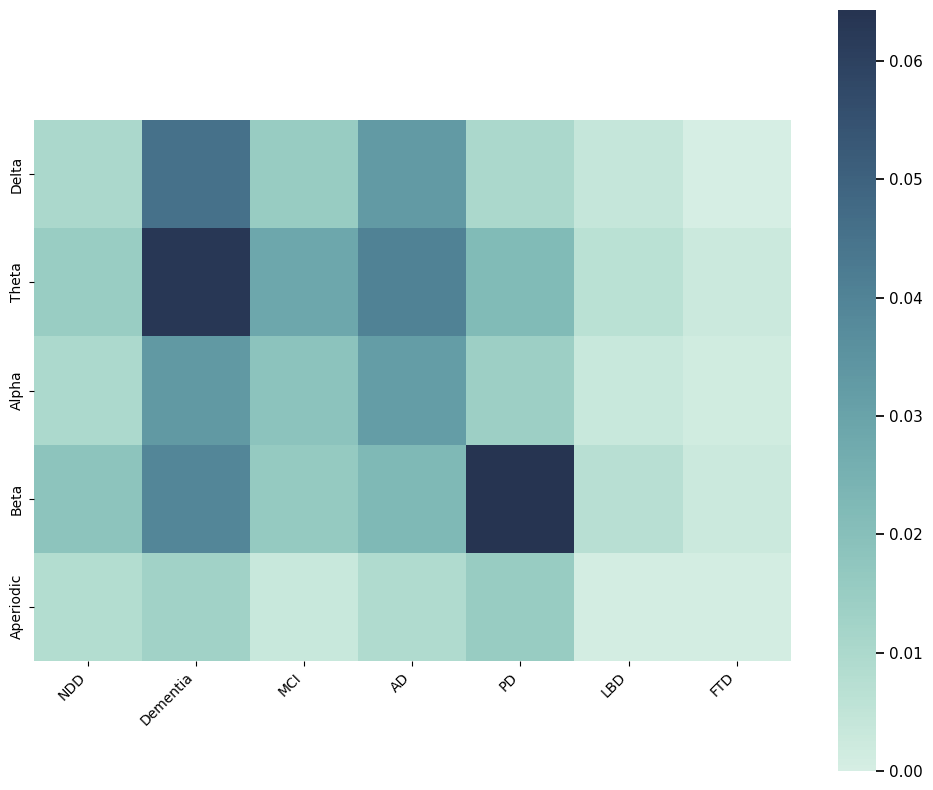

In [ ]:
# Plot the associations of band ratio measures in the literature
fig, ax = plt.subplots(figsize=(10, 8))
plot_matrix(counts.score, assoc_labels, ratio_labels, cmap='blue', square=True, ax=ax)
plt.xticks(rotation=45, horizontalalignment='right');
plt.show()

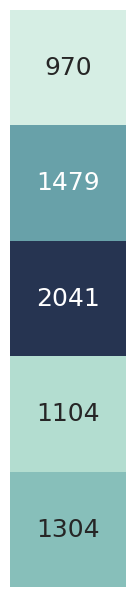

In [ ]:
# Plot the number of papers found per ratio measure
dat = np.expand_dims(counts.terms['A'].counts, 1)

fig, ax = plt.subplots(figsize=(2.5, 7.5))
sns.heatmap(dat,
            cmap=get_cmap('blue'),
            xticklabels=[],
            yticklabels=[],
            annot=True, annot_kws={"size": 18}, cbar=False, fmt='d', square=True);

## END ##

ACID WMH

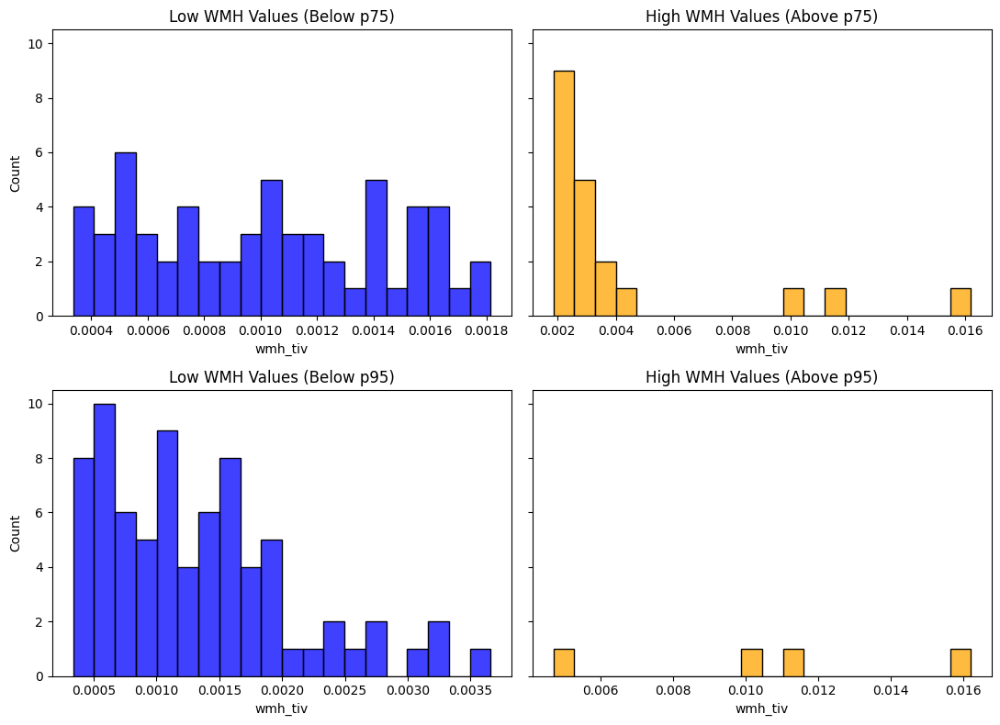

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_1 = 'C:/Users/data_analysis/Desktop/wmtiv.csv'
file_2 = 'C:/Users/data_analysis/Desktop/acid_hcs.csv'
file_1 = pd.DataFrame(pd.read_csv(file_1, sep = ','))
file_2 = pd.DataFrame(pd.read_csv(file_2, sep = ';'))
# Filter the wmh_tiv_df to keep only rows where TimePoint == 'v1'
file_1 = file_1[file_1['TimePoint'] == 'v1']
file_2 = file_2.rename(columns={'Subject': 'Individual'})

# Now merge the filtered dataframe with acid_hcs_df
merged_df = pd.merge(file_1, file_2, on='Individual')

# Calculating the 75th and 95th percentiles for WM-hypointensities values
percentile_75 = merged_df['wmh_tiv'].quantile(0.75)
percentile_95 = merged_df['wmh_tiv'].quantile(0.95)

# Creating binary variables for deviation based on the 75th and 95th percentiles
merged_df['deviation_p75'] = (merged_df['wmh_tiv'] > percentile_75).astype(int)
merged_df['deviation_p95'] = (merged_df['wmh_tiv'] > percentile_95).astype(int)

# Selecting only the three specified columns: 'wmh_tiv', 'Diagnosis', and 'deviation_from_normality'
selected_columns_df = merged_df[['Individual', 'wmh_tiv', 'Diagnosis', 'deviation_p75','deviation_p95']]
selected_columns_df.to_csv('C:/Users/data_analysis/Desktop/hc_wmh_acid.csv', index=False)

# Creating the plot
fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)

# p75 low WMH values
sns.histplot(merged_df[merged_df['deviation_p75'] == 0]['wmh_tiv'], bins=20, kde=False, ax=axes[0, 0], color='blue')
axes[0, 0].set_title('Low WMH Values (Below p75)')

# p75 high WMH values
sns.histplot(merged_df[merged_df['deviation_p75'] == 1]['wmh_tiv'], bins=20, kde=False, ax=axes[0, 1], color='orange')
axes[0, 1].set_title('High WMH Values (Above p75)')

# p95 low WMH values
sns.histplot(merged_df[merged_df['deviation_p95'] == 0]['wmh_tiv'], bins=20, kde=False, ax=axes[1, 0], color='blue')
axes[1, 0].set_title('Low WMH Values (Below p95)')

# p95 high WMH values
sns.histplot(merged_df[merged_df['deviation_p95'] == 1]['wmh_tiv'], bins=20, kde=False, ax=axes[1, 1], color='orange')
axes[1, 1].set_title('High WMH Values (Above p95)')

plt.tight_layout()
plt.show()

In [207]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_1 = 'C:/Users/data_analysis/Desktop/wmtiv.csv'
file_2 = 'C:/Users/data_analysis/Desktop/acid_hcs.csv'

file_1 = pd.read_csv(file_1, sep=',')
file_2 = pd.read_csv(file_2, sep=';')

# Filter the wmh_tiv_df to keep only rows where TimePoint == 'v1'
file_1 = file_1[file_1['TimePoint'] == 'v1']
file_2 = file_2.rename(columns={'Subject': 'Individual'})

# Merge the filtered dataframe with acid_hcs_df
merged_df = pd.merge(file_1, file_2, on='Individual')

# Calculate and create binary variables for deviation based on percentiles from p50 to p95
for p in range(50, 100, 5):
    percentile_value = merged_df['wmh_tiv'].quantile(p/100.0)
    column_name = f'deviation_p{p}'
    merged_df[column_name] = (merged_df['wmh_tiv'] > percentile_value).astype(int)

# Selecting the specified columns along with the newly created percentile columns
selected_columns = ['Individual', 'wmh_tiv', 'Diagnosis'] + [f'deviation_p{p}' for p in range(50, 100, 5)]
selected_columns_df = merged_df[selected_columns]

# Save the modified dataframe to a CSV file
selected_columns_df.to_csv('C:/Users/data_analysis/Desktop/hc_wmh_acid.csv', index=False)


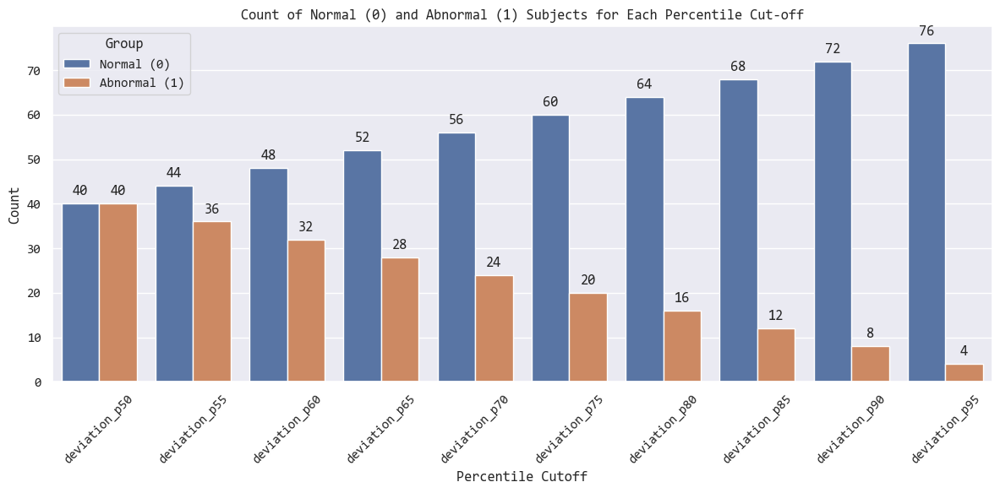

In [210]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming merged_df is your final dataframe from the previous steps
percentile_columns = [f'deviation_p{p}' for p in range(50, 100, 5)]
melted_df = pd.melt(merged_df, id_vars=['Individual', 'wmh_tiv', 'Diagnosis'], 
                    value_vars=percentile_columns, 
                    var_name='Percentile', value_name='Group')

plt.figure(figsize=(12, 6))
ax = sns.countplot(data=melted_df, x='Percentile', hue='Group')
plt.title('Count of Normal (0) and Abnormal (1) Subjects for Each Percentile Cut-off')
plt.ylabel('Count')
plt.xlabel('Percentile Cutoff')
plt.xticks(rotation=45)
plt.legend(title='Group', labels=['Normal (0)', 'Abnormal (1)'])

# Annotating each bar with its count value
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 10), 
                textcoords = 'offset points')

plt.tight_layout()
plt.show()


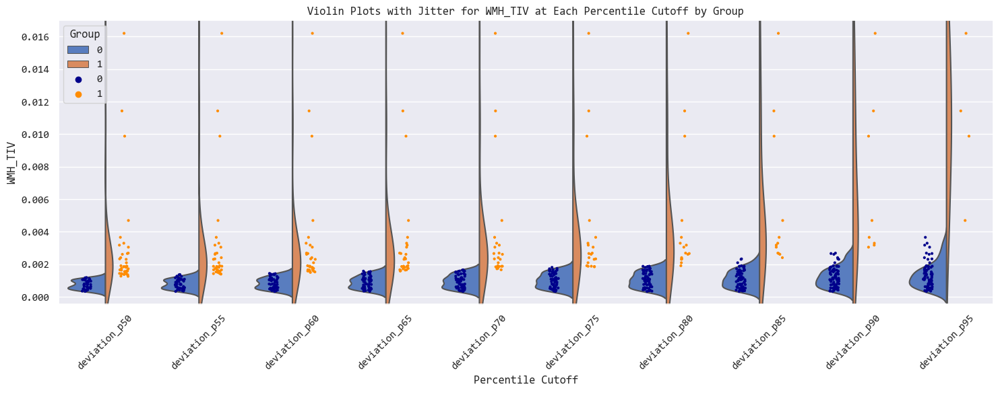

In [222]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming merged_df is your final dataframe from the previous steps
percentile_columns = [f'deviation_p{p}' for p in range(50, 100, 5)]
melted_df = pd.melt(merged_df, id_vars=['Individual', 'wmh_tiv', 'Diagnosis'], 
                    value_vars=percentile_columns, 
                    var_name='Percentile', value_name='Group')

plt.figure(figsize=(15, 6))
# Create a violin plot for each group within each percentile
palette = sns.color_palette("muted", n_colors=2)  # Define a color palette
palette2 = ['darkblue', 'darkorange']
sns.violinplot(data=melted_df, x='Percentile', y='wmh_tiv', hue='Group', split=True, inner=None, palette=palette, alpha = 0.01)
sns.stripplot(data=melted_df, x='Percentile', y='wmh_tiv', hue='Group', dodge=True, palette=palette2, size=3, jitter=True)

plt.title('Violin Plots with Jitter for WMH_TIV at Each Percentile Cutoff by Group')
plt.ylabel('WMH_TIV')
plt.xlabel('Percentile Cutoff')
plt.xticks(rotation=45)
plt.legend(title='Group')
plt.tight_layout()
plt.show()


In [224]:
import pandas as pd

# Assuming merged_df is your final dataframe from the previous steps
percentile_columns = [f'deviation_p{p}' for p in range(50, 100, 5)]
melted_df = pd.melt(merged_df, id_vars=['Individual', 'wmh_tiv', 'Diagnosis'], 
                    value_vars=percentile_columns, 
                    var_name='Percentile', value_name='Group')

# Function to calculate IQR
def iqr(series):
    return series.quantile(0.75) - series.quantile(0.25)

# Group by 'Percentile' and 'Group', then calculate mean, std, median, and IQR
grouped_stats = melted_df.groupby(['Percentile', 'Group'])['wmh_tiv'].agg(['mean', 'std', 'median', iqr]).reset_index()

# Display the table
grouped_stats


,Percentile,Group,mean,std,median,iqr
0,deviation_p50,0,0.000760,0.000269,0.000760,0.000502
1,deviation_p50,1,0.002814,0.002983,0.001833,0.001076
2,deviation_p55,0,0.000811,0.000304,0.000779,0.000518
3,deviation_p55,1,0.002980,0.003104,0.001875,0.001066
4,deviation_p60,0,0.000862,0.000337,0.000851,0.000550
5,deviation_p60,1,0.003175,0.003244,0.001901,0.001118
6,deviation_p65,0,0.000915,0.000373,0.000920,0.000613
7,deviation_p65,1,0.003408,0.003411,0.002204,0.001288
8,deviation_p70,0,0.000966,0.000404,0.000978,0.000692
9,deviation_p70,1,0.003704,0.003607,0.002374,0.001333


<p style="background-color:white; color:black;">

<code style="white-space: pre-wrap; background-color:white; color:black;">
📁 site_name/
├─📄 participants.csv/xls
├─📁 sub-001/
│  └─🧠〰 sub-001_eyesclosed.EDF
├─📁 sub-002/
│  └─🧠〰 sub-002_eyesclosed.EDF
│...
│...
└─📁 sub-XXX/
   └─🧠〰 sub-XXX_eyesclosed.EDF



</code>
</p>

<p style="background-color:white; color:black;">
<code style="white-space: pre-wrap; background-color:white; color:black;">
participant_id	gender	age	group	MMSE
sub-001     	F	67	AD	20
sub-002     	F	87	DLB	14
sub-XXX	        M	70	AD	16    

</code>
</p>

<p style="background-color:white; color:black;">

<code style="white-space: pre-wrap; background-color:white; color:black;">
📁 site_name/
├─📄 participants.csv/xls
├─📁 sub-001/
│  ├─📁 session_1/
│  │  └─🧠〰 sub-001_eyesclosed.EDF
│  └─📁 session_2/
│     └─🧠〰 sub-001_eyesclosed.EDF
│
├─📁 sub-002/
│  └─🧠〰 sub-002_eyesclosed.EDF
│...
│...
└─📁 sub-XXX/
   └─🧠〰 sub-XXX_eyesclosed.EDF



</code>
</p>

<p style="background-color:white; color:black;">
<code style="white-space: pre-wrap; background-color:white; color:black;">
participant_id	gender	age	group	MMSE    session
sub-001     	F	67	AD	20          1   
sub-001     	F	68	AD	15          2
sub-002     	F	87	DLB	14          1



</code>
</p>

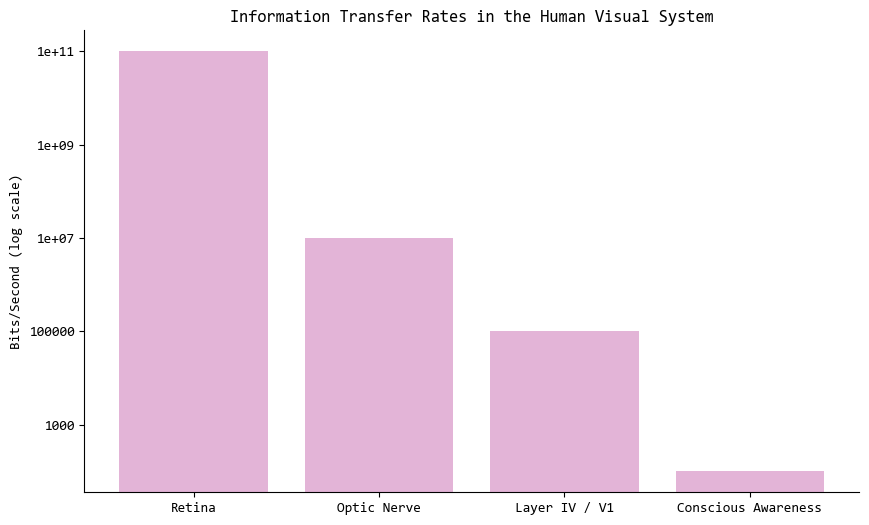

In [17]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Data for the bars
names = ["Retina", "Optic Nerve", "Layer IV / V1", "Conscious Awareness"]
values = [10e10, 10e6, 10e4, 100]  # in bits/second

# Creating the plot
plt.figure(figsize=(10, 6))
bars = plt.bar(names, values, color='#e3b4d7')

# Setting the y-axis to logarithmic scale to better represent the wide range of values
plt.yscale('log')

# Formatting the y-axis labels to represent bits/second in a readable format
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))

# Setting the font style to "Consolas" for all the text in the plot
plt.rcParams['font.family'] = 'Consolas'
plt.grid(False)  # Disabling the grid


# Hiding the top and right axes, showing only left and bottom
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adding labels and title
plt.ylabel('Bits/Second (log scale)')
plt.title('Information Transfer Rates in the Human Visual System')

# Show the plot
plt.show()


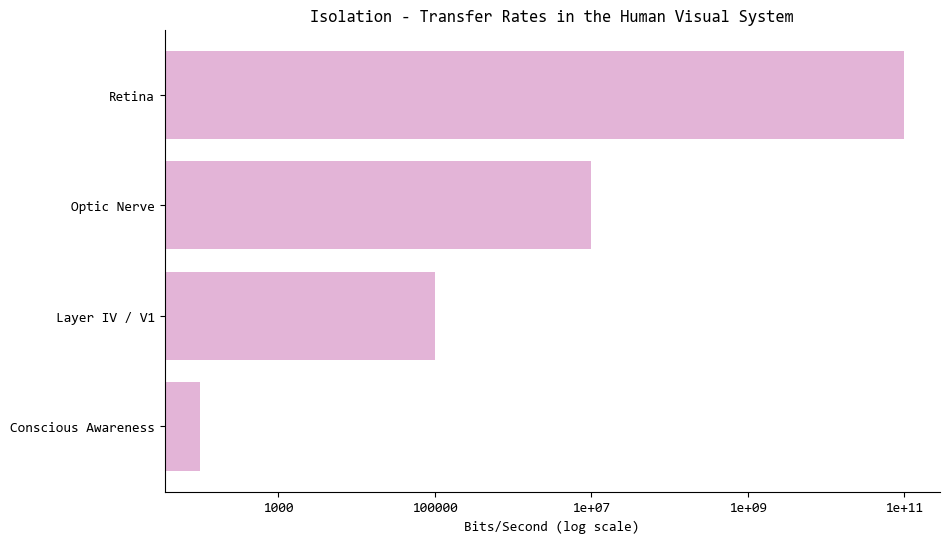

In [22]:
# Sorting the data from greater to lower
sorted_indices = sorted(range(len(values)), key=lambda i: values[i], reverse=True)
sorted_names = [names[i] for i in sorted_indices]
sorted_values = [values[i] for i in sorted_indices]
# Inverting the sorting (from lowest to greatest)
inverted_indices = sorted(range(len(values)), key=lambda i: values[i])
inverted_names = [names[i] for i in inverted_indices]
inverted_values = [values[i] for i in inverted_indices]

# Creating the plot with inverted sorted data
plt.figure(figsize=(10, 6))
bars = plt.barh(inverted_names, inverted_values, color='#e3b4d7')

# Setting the x-axis to logarithmic scale
plt.xscale('log')

# Formatting the x-axis labels
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: '{:g}'.format(x)))

# Setting the font style to "Consolas"
plt.rcParams['font.family'] = 'Consolas'
plt.grid(False)  # Disabling the grid

# Hiding the top and right axes
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adding labels and title
plt.xlabel('Bits/Second (log scale)')
plt.title('Isolation - Transfer Rates in the Human Visual System')

# Show the plot
plt.show()



C:\Users\data_analysis\AppData\Local\Temp\ipykernel_6648\2336279070.py:7: RuntimeWarning: Could not properly use low_bias, keeping lowest-bias taper
  psd, freqs = mne.time_frequency.psd_array_multitaper(signal, sfreq=sfreq, bandwidth = 1, fmin=0, fmax=30, adaptive=True, normalization='full', verbose=0)
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_6648\2336279070.py:7: RuntimeWarning: Not adaptively combining the spectral estimators due to a low number of tapers (1 < 3).
  psd, freqs = mne.time_frequency.psd_array_multitaper(signal, sfreq=sfreq, bandwidth = 1, fmin=0, fmax=30, adaptive=True, normalization='full', verbose=0)
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_6648\2336279070.py:7: RuntimeWarning: Could not properly use low_bias, keeping lowest-bias taper
  psd, freqs = mne.time_frequency.psd_array_multitaper(signal, sfreq=sfreq, bandwidth = 1, fmin=0, fmax=30, adaptive=True, normalization='full', verbose=0)
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_6648

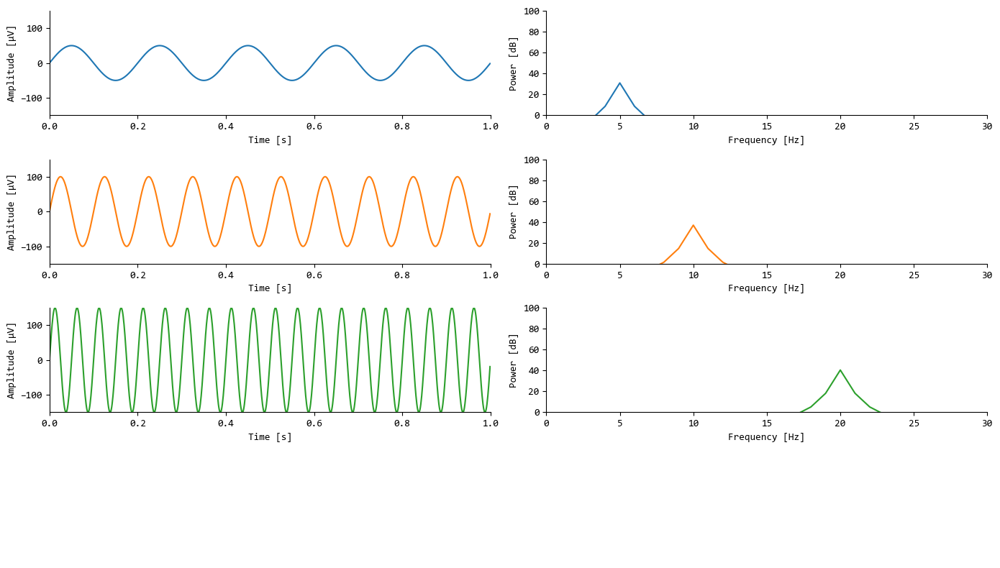

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import mne

# Function to calculate power using Multitaper
def multitaper_psd(signal, sfreq):
    psd, freqs = mne.time_frequency.psd_array_multitaper(signal, sfreq=sfreq, bandwidth = 1, fmin=0, fmax=30, adaptive=True, normalization='full', verbose=0)
    return psd, freqs

# Set the plot style
plt.rcParams.update({'font.family': 'Consolas'})

# Parameters
duration = 1.0  # seconds
sampling_frequency = 1000  # Hz
frequencies = [5, 10, 20]  # Hz
amplitudes_uV = [50, 100, 150]  # microvolts

# Time vector
t = np.linspace(0, duration, int(sampling_frequency * duration), endpoint=False)

# Create sinusoids
signals = [amp * np.sin(2 * np.pi * f * t) for amp, f in zip(amplitudes_uV, frequencies)]

# Create the figure and axes
fig, axs = plt.subplots(4, 2, figsize=(14, 8), dpi=100)

# Colors for different signals
colors = ['C0', 'C1', 'C2']

# Plot sinusoids in the time domain
for i, (signal, color) in enumerate(zip(signals, colors)):
    axs[i, 0].plot(t, signal, color=color)
    axs[i, 0].set_xlim([0, 1])
    axs[i, 0].set_ylim([-max(amplitudes_uV), max(amplitudes_uV)])
    axs[i, 0].spines['top'].set_visible(False)
    axs[i, 0].spines['right'].set_visible(False)
    axs[i, 0].spines['bottom'].set_visible(True)
    axs[i, 0].spines['left'].set_visible(True)
    axs[i, 0].set_xlabel('Time [s]')
    axs[i, 0].set_ylabel('Amplitude [µV]')
    axs[i, 0].grid(False)

# Hide the last row in the first column to maintain layout consistency
axs[-1, 0].axis('off')

# Plot the power spectrums using Multitaper
for i, (signal, color) in enumerate(zip(signals, colors)):
    psd, freqs = multitaper_psd(signal, sampling_frequency)
    psd_dB = 10 * np.log10(psd)

    axs[i, 1].plot(freqs, psd_dB, color=color)
    axs[i, 1].set_xlim([0, 30])
    axs[i, 1].set_ylim([0, 100])
    axs[i, 1].spines['top'].set_visible(False)
    axs[i, 1].spines['right'].set_visible(False)
    axs[i, 1].spines['bottom'].set_visible(True)
    axs[i, 1].spines['left'].set_visible(True)
    axs[i, 1].set_xlabel('Frequency [Hz]')
    axs[i, 1].set_ylabel('Power [dB]')
    axs[i, 1].grid(False)

# Hide the last row in the second column to maintain layout consistency
axs[-1, 1].axis('off')

plt.tight_layout()
plt.show()


In [113]:
import matplotlib.pyplot as plt
import numpy as np
import mne

# Function to calculate power using Multitaper
def multitaper_psd(signal, sfreq):
    psd, freqs = mne.time_frequency.psd_array_multitaper(signal, sfreq=sfreq, bandwidth = 1, fmin=0, fmax=60, adaptive=True, normalization='full', verbose=0)
    return psd, freqs

# Set the plot style
plt.rcParams.update({'font.family': 'Consolas'})

# Parameters
duration = 1.0  # seconds
sampling_frequency = 1000  # Hz
frequencies = [1, 10, 50]  # Hz
amplitudes_uV = [250, 350, 650]  # microvolts

# Time vector
t = np.linspace(0, duration, int(sampling_frequency * duration), endpoint=False)

# Create sinusoids
signals = [amp * np.sin(2 * np.pi * f * t) for amp, f in zip(amplitudes_uV, frequencies)]

# Create the figure and axes
fig, axs = plt.subplots(4, 2, figsize=(14, 8), dpi=100)

# Colors for different signals
colors = ['C0', 'C1', 'C2']

# Plot sinusoids in the time domain
for i, (signal, color) in enumerate(zip(signals, colors)):
    axs[i, 0].plot(t, signal, color=color)
    axs[i, 0].set_xlim([0, 1])
    axs[i, 0].set_ylim([-sum(amplitudes_uV), sum(amplitudes_uV)])
    axs[i, 0].spines['top'].set_visible(False)
    axs[i, 0].spines['right'].set_visible(False)
    axs[i, 0].spines['bottom'].set_visible(True)
    axs[i, 0].spines['left'].set_visible(True)
    axs[i, 0].set_xlabel('Time[s]')
    axs[i, 0].set_ylabel('A[µV]')
    axs[i, 0].grid(False)


# Combine the signals
mixed_signal = np.sum(signals, axis=0)

# Plot mixed signal
axs[3, 0].plot(t, mixed_signal, color='C3')
axs[3, 0].set_xlim([0, 1])
axs[3, 0].set_ylim([-sum(amplitudes_uV), sum(amplitudes_uV)])
axs[3, 0].spines['top'].set_visible(False)
axs[3, 0].spines['right'].set_visible(False)
axs[3, 0].spines['bottom'].set_visible(True)
axs[3, 0].spines['left'].set_visible(True)
axs[3, 0].set_xlabel('Time[s]')
axs[3, 0].set_ylabel('A[µV]')
axs[3, 0].grid(False)

# Plot the power spectrums using Multitaper
for i, (signal, color) in enumerate(zip(signals, colors)):
    psd, freqs = multitaper_psd(signal, sampling_frequency)
    psd_dB = 10 * np.log10(psd)

    axs[i, 1].plot(freqs, psd_dB, color=color)
    axs[i, 1].set_xlim([0, 60])
    axs[i, 1].set_ylim([0, 50])
    axs[i, 1].spines['top'].set_visible(False)
    axs[i, 1].spines['right'].set_visible(False)
    axs[i, 1].spines['bottom'].set_visible(True)
    axs[i, 1].spines['left'].set_visible(True)
    axs[i, 1].set_xlabel('Frequency[Hz]')
    axs[i, 1].set_ylabel('Power[dB]')
    axs[i, 1].grid(False)



# Calculate and Plot Power Spectrum for Mixed Signal
psd, freqs = multitaper_psd(mixed_signal, sampling_frequency)
psd_dB = 10 * np.log10(psd)
axs[3, 1].plot(freqs, psd_dB, color='C3')
axs[3, 1].set_xlim([0, 60])
axs[3, 1].set_ylim([0, 50])
axs[3, 1].spines['top'].set_visible(False)
axs[3, 1].spines['right'].set_visible(False)
axs[3, 1].spines['bottom'].set_visible(True)
axs[3, 1].spines['left'].set_visible(True)
axs[3, 1].set_xlabel('Frequency[Hz]')
axs[3, 1].set_ylabel('Power[dB]')
axs[3, 1].grid(False)
# Hide the last row in the second column to maintain layout consistency
#axs[-1, 1].axis('off')

plt.tight_layout()
plt.show()


    Using multitaper spectrum estimation with 1 DPSS windows
    Using multitaper spectrum estimation with 1 DPSS windows
    Using multitaper spectrum estimation with 1 DPSS windows
    Using multitaper spectrum estimation with 1 DPSS windows


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_26592\4140109397.py:7: RuntimeWarning: Could not properly use low_bias, keeping lowest-bias taper
  psd, freqs = mne.time_frequency.psd_array_multitaper(signal, sfreq=sfreq, bandwidth = 1, fmin=0, fmax=60, adaptive=True, normalization='full', verbose=0)
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_26592\4140109397.py:7: RuntimeWarning: Not adaptively combining the spectral estimators due to a low number of tapers (1 < 3).
  psd, freqs = mne.time_frequency.psd_array_multitaper(signal, sfreq=sfreq, bandwidth = 1, fmin=0, fmax=60, adaptive=True, normalization='full', verbose=0)
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_26592\4140109397.py:7: RuntimeWarning: Could not properly use low_bias, keeping lowest-bias taper
  psd, freqs = mne.time_frequency.psd_array_multitaper(signal, sfreq=sfreq, bandwidth = 1, fmin=0, fmax=60, adaptive=True, normalization='full', verbose=0)
C:\Users\data_analysis\AppData\Local\Temp\ipykernel_2

In [120]:
import scipy.signal as signal

srate = epochs.info['sfreq'] # Get the sampling rate
f, periodogram = signal.welch(epochs._data[50:180,:,:], fs=srate, nperseg=srate*2, window='hann', scaling='spectrum') # Get power spectral density using Welch's method
print(epochs.info["ch_names"])

channel = epochs.ch_names.index('O2') ### Replace here the channel name you want to plot, 'O2' in this example
channel_plot = channel
channel_name = epochs.ch_names[channel_plot]

x = f
Nx = x.shape[0]

total_power = np.sum(periodogram,axis=-1)

num_epochs = periodogram.shape[0]
Nz = num_epochs
y1 = periodogram[:,channel_plot,:].T

y = (y1/total_power[:,channel_plot])*100


# Create CSA plot
fig = plt.figure(figsize=(10,15)) ### Change the size of the figure
ax = fig.add_subplot(111)
for side in ['right', 'top', 'left']:
    ax.spines[side].set_visible(False)

# Some usefull parameters
highest = 100  # This value can be set as the max power by replacing "highest = 100" for "highest = np.max(y)"
lowest = np.min(y)
delta = highest-lowest
t = np.sqrt(abs(delta))/3.5 # Change denominator in "t" to set the tuning parameter for the offset of each periodogram. Higher values produces higher hills
bottom = lowest*np.ones(Nx)

for i in np.flip(range(Nz)):
    yi_ = y[:,i]       # the periodogram data
    yi = yi_ + i*t   # shifted periodogram using the selected tuning parameter for plotting
    zindex = Nz-i # used to set zorder
# fill with white from the (shifted) y data down to the lowest value
    # for good results, don't make the alpha (TRANSPARENCY) too low, otherwise you'll get confusing blending of lines
    ax.fill_between(x, lowest, yi, facecolor="white", alpha=0.5, zorder=zindex)

    # cut the data into segments that can be colored individually
    points = np.array([x, yi]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    # Create a continuous norm to map from data points to colors
    norm = plt.Normalize(lowest, highest)
    lc = LineCollection(segments, cmap='plasma', norm=norm)

    # Set the values used for colormapping
    lc.set_array(yi_)
    lc.set_zorder(zindex)
    lc.set_linewidth(1)
    line = ax.add_collection(lc)

    # print text indicating epochs number
    delta_x = max(x)-min(x)
    if (i)%1==0:
        ax.text(min(x)-0.5, t*i, "%i"%i)

ax.set_xlim(0, 14) # set Frequency limits (in Hz) to plot

psd_colorbar = fig.colorbar(line, ax=ax)
psd_colorbar.set_label( label = 'Relative PSD', size = 18, weight='bold')


ax.set_title('Compressed Spectral Array -' + str(channel_name), size=22, fontweight="bold")
plt.yticks([])
ax.set_ylabel('Epoch', size=18, fontweight="bold")
ax.set_xlabel('Frequency', size=18, fontweight="bold")
ax.yaxis.set_label_coords(-0.05, 0.5)
ax.yaxis.set_ticks_position('none')
plt.show()

['C3', 'C4', 'O1', 'O2', 'A1', 'A2', 'Fp1', 'F3', 'F4', 'Fp2', 'F7', 'F8', 'Fz', 'T3', 'T4', 'Cz', 'T5', 'P3', 'T6', 'P4', 'Pz']


In [51]:
print(raw.info.ch_names)

['EMG1', 'C3', 'C4', 'O1', 'O2', 'A1', 'A2', 'Fp1', 'F3', 'F4', 'EOG1', 'EOG2', 'ECG II', 'Fp2', 'F7', 'F8', 'Fz', 'T3', 'T4', 'Cz', 'T5', 'P3', 'T6', 'P4', 'Pz']


## EXAMPLE TIME-SERIES EEG ALPHA

In [84]:
import mne
filepath = r'C:\Users\data_analysis\Desktop\PRO010_(1).edf'
raw = mne.io.read_raw(filepath, preload=True)#('G:/raw_EEGs/NMT_EEG_dataset (2)/nmt_scalp_eeg_dataset/normal/train/0001398.edf', preload=True)
ch_names = raw.info.ch_names
# raw.plot_psd(picks='eeg')
#For plots outside jupiter
get_ipython().run_line_magic("matplotlib", " qt ")
order = ['Fp1', 'Fp2', 'F3', 'F4','F7', 'F8', 'C3', 'C4','T3', 'T4', 'T5','T6', 'P3','P4', 'O1', 'O2', 'Fz','Cz','Pz']
order_indices = [ch_names.index(ch) for ch in order]
raw.plot(duration=50, remove_dc=True, highpass=1, lowpass=45, order=order_indices);


Extracting EDF parameters from C:\Users\data_analysis\Desktop\PRO010_(1).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 682495  =      0.000 ...  1332.998 secs...
Setting up band-pass filter from 1 - 45 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 45.00 Hz: -6.02, -6.02 dB



Channels marked as bad:
none


In [89]:
import mne
filepath = r'C:\Users\data_analysis\Desktop\PRO010_(1).edf'
raw = mne.io.read_raw(filepath, preload=True)#('G:/raw_EEGs/NMT_EEG_dataset (2)/nmt_scalp_eeg_dataset/normal/train/0001398.edf', preload=True)
ch_names = raw.info.ch_names
# raw.plot_psd(picks='eeg')
#For plots outside jupiter
get_ipython().run_line_magic("matplotlib", " qt ")
order = ['P3','P4', 'O1', 'O2']
order_indices = [ch_names.index(ch) for ch in order]
raw.plot(duration=25, remove_dc=True, highpass=1, lowpass=45, order=order_indices);


Extracting EDF parameters from C:\Users\data_analysis\Desktop\PRO010_(1).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 682495  =      0.000 ...  1332.998 secs...
Setting up band-pass filter from 1 - 45 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 45.00 Hz: -6.02, -6.02 dB



In [95]:
import mne
filepath = r'C:\Users\data_analysis\Desktop\PRO010_(1).edf'
raw = mne.io.read_raw(filepath, preload=True)#('G:/raw_EEGs/NMT_EEG_dataset (2)/nmt_scalp_eeg_dataset/normal/train/0001398.edf', preload=True)

# order = ['Fp1', 'Fp2', 'F3', 'F4','F7', 'F8', 'C3', 'C4','T3', 'T4', 'T5','T6', 'P3','P4', 'O1', 'O2', 'Fz','Cz','Pz']

# montage = mne.channels.make_standard_montage('standard_1005')
# raw.drop_channels([ch for ch in raw.ch_names
#                    if ch not in montage.ch_names])
# raw.set_montage(montage)  # use the standard montage
raw.plot_psd(fmax = 30, picks = order);

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)


In [121]:
epochs = mne.make_fixed_length_epochs(raw, duration=5, preload=True)
# Define parameters
frequencies = np.linspace(1, 30, 30)  # Frequencies from 1 to 30 Hz
time_bandwidth = 2.0  # Example value
n_cycles = frequencies / 2.  # Different number of cycle per frequency
n_jobs = 1  # Number of jobs to run in parallel

# Compute the TFR
power = mne.time_frequency.tfr_multitaper(epochs[50:80], freqs=frequencies, n_cycles=n_cycles, 
                                          time_bandwidth=time_bandwidth, return_itc=False, n_jobs=n_jobs)

# Plotting - Replace 'Fp1' with the channel you are interested in, or loop over channels
power.plot([power.ch_names.index('O1')])


Not setting metadata
266 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 266 events and 2560 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


[<Figure size 640x480 with 2 Axes>]

In [112]:
# Define parameters for multitaper PSD
fmin, fmax = 1, 30  # Frequency range

# Compute PSD data
spectrum = epochs.compute_psd(fmin=fmin, fmax=fmax)
psds, freqs = spectrum.get_data(return_freqs=True)
psds = 10 * np.log10(psds)  # Convert power to dB

# Averaging PSD over channels, resulting in shape (n_epochs, n_freqs)
avg_psds = psds.mean(axis=1)

# Transpose avg_psds to get shape (n_freqs, n_epochs) for plotting
avg_psds = avg_psds.T  # Now the shape should be correct for plotting

# Plotting
n_epochs = len(epochs)
fig, ax = plt.subplots(figsize=(10, 5))

# Now the orientation is correct: epochs on the X-axis, frequencies on the Y-axis
img = ax.imshow(avg_psds, aspect='auto', origin='lower',
                extent=[0, n_epochs, freqs[0], freqs[-1]], cmap='viridis')

ax.set_xlabel('Epochs')
ax.set_ylabel('Frequency (Hz)')
ax.set_title('Power Spectral Density across Epochs')
fig.colorbar(img, ax=ax, label='Power (dB)')

plt.show()


    Using multitaper spectrum estimation with 7 DPSS windows


Channels marked as bad:
none


C:\Users\data_analysis\AppData\Local\Temp\ipykernel_26592\1666700187.py:1: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  epochs.plot()


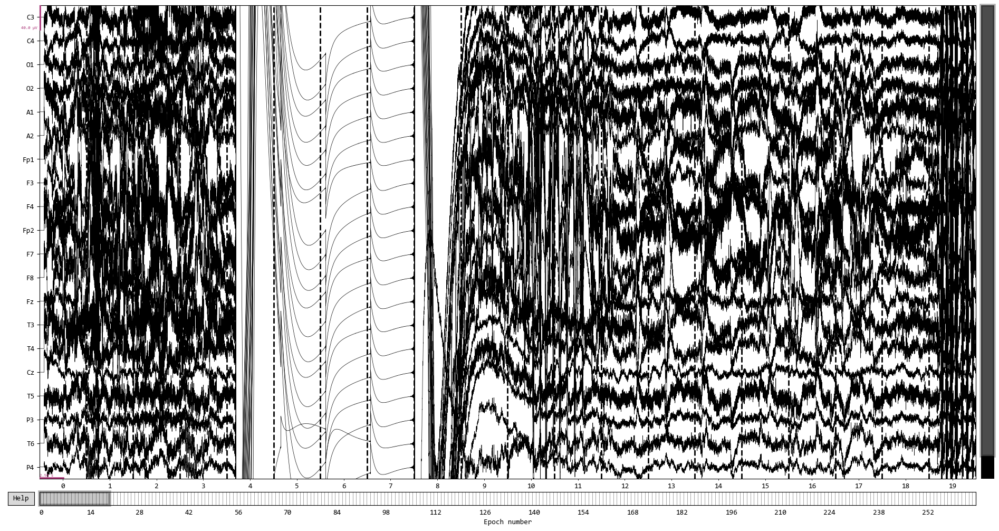

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none


In [101]:
epochs.plot()

In [97]:
raw.plot(duration=25, remove_dc=True, highpass=1, lowpass=45);


Setting up band-pass filter from 1 - 45 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 45.00 Hz: -6.02, -6.02 dB



Channels marked as bad:
none


In [15]:
import pandas as pd

# Load the data
df = pd.read_csv('G:/raw_EEGs/NMT_EEG_dataset (2)/nmt_scalp_eeg_dataset/Labels.csv')

# Filter the dataframe
filtered_df = df[(df['label'] == 'normal') & (df['age'] >= 19)]

# Get the count
count_normal_age_46_plus = filtered_df.shape[0]
print('Count of normal labels with age >= 46:', count_normal_age_46_plus)


Count of normal labels with age >= 46: 1186
